In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
plt.style.use('fivethirtyeight')
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

import glob
import os
from bs4 import BeautifulSoup as bs
import requests
import re

from datetime import datetime
import dataframe_image as dfi
from statsmodels.tsa.seasonal import seasonal_decompose

In [2]:
raw_df_12_14_2020 = pd.read_csv('/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/airBnb Paris time series/airbnb_paris_12_14_2020.csv')
print(f"The 12_14_2020 dataset contains {len(raw_df_12_14_2020)} AirBnb listings; the avg price is ${round(raw_df_12_14_2020['price'].mean(),2)}.")

raw_df_01_10_2021 = pd.read_csv('/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/airBnb Paris time series/airbnb_paris_01_10_2021.csv')
print(f"The dataset contains {len(raw_df_01_10_2021)} AirBnb listings.")

raw_df_02_08_2021 = pd.read_csv('/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/airBnb Paris time series/airbnb_paris_02_08_2021.csv')
print(f"The dataset contains {len(raw_df_02_08_2021)} AirBnb listings.")

raw_df_03_04_2021 = pd.read_csv('/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/airBnb Paris time series/airbnb_paris_03_04_2021.csv')
print(f"The dataset contains {len(raw_df_03_04_2021)} AirBnb listings.")

raw_df_04_10_2021 = pd.read_csv('/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/airBnb Paris time series/airbnb_paris_04_10_2021.csv')
print(f"The dataset contains {len(raw_df_04_10_2021)} AirBnb listings.")

raw_df_06_07_2021 = pd.read_csv('/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/airBnb Paris time series/airbnb_paris_06_07_2021.csv')
print(f"The 06_07_2021 dataset contains {len(raw_df_06_07_2021)} AirBnb listings; the avg price is ${round(raw_df_06_07_2021['price'].mean(),2)}.")


The 12_14_2020 dataset contains 65917 AirBnb listings; the avg price is $114.28.
The dataset contains 65256 AirBnb listings.
The dataset contains 64690 AirBnb listings.
The dataset contains 64347 AirBnb listings.
The dataset contains 63090 AirBnb listings.
The 06_07_2021 dataset contains 61105 AirBnb listings; the avg price is $117.4.


In [3]:
df_list = [raw_df_12_14_2020, raw_df_01_10_2021, raw_df_02_08_2021, raw_df_03_04_2021, raw_df_04_10_2021,
          raw_df_06_07_2021]
dates = ['12_14_2020', '01_10_2021', '02_08_2021','03_04_2021', '04_10_2021',
        '06_07_2021', '07_06_2021', '09_09_2021', '10_09_2021']

df_final = []

def airbnb_parse(df_list, dates):
    for date in dates:
        df_file = pd.read_csv(f"/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/airBnb Paris time series/airbnb_paris_{date}.csv")
        print(f"The {date} Paris dataset contains {len(df_file)} AirBnb listings -- the avg price is ${round(df_file['price'].mean(),2)}.")
        #print(f"The avg price per night out of {len(df_file)} listings is  ${round(df_file['price'].mean(),2)}.")


def airbnb_to_frame(df_list, dates):
    for date in dates:
        df_file = pd.read_csv(f"/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/airBnb Paris time series/airbnb_paris_{date}.csv")
        #print(f"The {date} Paris dataset contains {len(df_file)} AirBnb listings -- the avg price is ${round(df_file['price'].mean(),2)}.")
        df_final.append(
        {
            'Date of scrape': date.replace('_', '/'),
            '# of Listings': len(df_file),
            'Avg Price': round(df_file['price'].mean(),2),
            'Median Price': round(df_file['price'].median(),2),
            'Min Price': df_file['price'].min(),
            'Max Price': df_file['price'].max(),
            'Avg reviews per month': round(df_file['reviews_per_month'].mean(),2)
        })
    
    return pd.DataFrame(df_final)
        

In [4]:
airbnb_parse(df_list, dates)

The 12_14_2020 Paris dataset contains 65917 AirBnb listings -- the avg price is $114.28.
The 01_10_2021 Paris dataset contains 65256 AirBnb listings -- the avg price is $112.89.
The 02_08_2021 Paris dataset contains 64690 AirBnb listings -- the avg price is $113.1.
The 03_04_2021 Paris dataset contains 64347 AirBnb listings -- the avg price is $112.39.
The 04_10_2021 Paris dataset contains 63090 AirBnb listings -- the avg price is $112.92.
The 06_07_2021 Paris dataset contains 61105 AirBnb listings -- the avg price is $117.4.
The 07_06_2021 Paris dataset contains 51040 AirBnb listings -- the avg price is $124.53.
The 09_09_2021 Paris dataset contains 50133 AirBnb listings -- the avg price is $125.89.
The 10_09_2021 Paris dataset contains 49634 AirBnb listings -- the avg price is $130.2.


In [5]:
paris_summary = airbnb_to_frame(df_list, dates)
paris_summary['Date of scrape'] = pd.to_datetime(paris_summary['Date of scrape'])

In [6]:
paris_summary

,Date of scrape,# of Listings,Avg Price,Median Price,Min Price,Max Price,Avg reviews per month
0,2020-12-14,65917,114.28,80.0,0,11600,0.69
1,2021-01-10,65256,112.89,80.0,0,11600,0.68
2,2021-02-08,64690,113.10,80.0,0,12000,0.66
3,2021-03-04,64347,112.39,80.0,0,12000,0.66
4,2021-04-10,63090,112.92,80.0,0,11600,0.63
5,2021-06-07,61105,117.40,80.0,0,11600,0.63
6,2021-07-06,51040,124.53,85.0,0,11600,0.71
7,2021-09-09,50133,125.89,88.0,0,11600,0.79
8,2021-10-09,49634,130.20,90.0,0,11600,0.81


<AxesSubplot:xlabel='Date of scrape'>

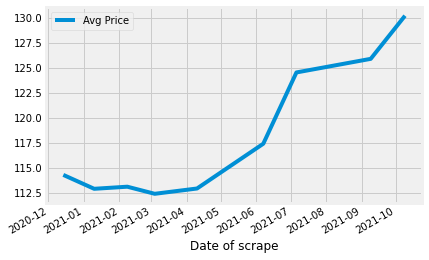

In [7]:
paris_summary.plot(x='Date of scrape', y='Avg Price')

In [8]:
paris_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 7 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Date of scrape         9 non-null      datetime64[ns]
 1   # of Listings          9 non-null      int64         
 2   Avg Price              9 non-null      float64       
 3   Median Price           9 non-null      float64       
 4   Min Price              9 non-null      int64         
 5   Max Price              9 non-null      int64         
 6   Avg reviews per month  9 non-null      float64       
dtypes: datetime64[ns](1), float64(3), int64(3)
memory usage: 632.0 bytes


In [10]:
raw_df_12_14_2020.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2577,Loft for 4 by Canal Saint Martin,2827,Karine,NaN,Entrepôt,48.86993,2.36251,Entire home/apt,125,3,1,2019-01-02,0.04,1,364
1,3109,zen and calm,3631,Anne,NaN,Observatoire,48.83349,2.31852,Entire home/apt,60,2,9,2019-10-24,0.19,1,2
2,4890,Quiet Historic & Cute +Free Cruise,6792,Ryan Of Cobblestone,NaN,Temple,48.86409,2.35651,Entire home/apt,69,5,23,2020-09-07,0.21,14,67
3,5396,Explore the heart of old Paris,7903,Borzou,NaN,Hôtel-de-Ville,48.85207,2.35871,Entire home/apt,62,1,231,2020-11-05,1.65,1,90
4,7397,MARAIS - 2ROOMS APT - 2/4 PEOPLE,2626,Franck,NaN,Hôtel-de-Ville,48.85758,2.35275,Entire home/apt,53,15,269,2020-08-15,2.28,3,348


In [11]:
path = os.getcwd()
path

'/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb'

In [12]:
glob.glob('data/**/', recursive=True)

[]

In [13]:
def get_listings():
    """Function scraping all links to listings.csv files available on insideairbnb.com
    website, and saving downloaded files in a /data/raw-data folder.
    The files are named after their collection date (YYYY-MM.csv)."""
    soup = bs(requests.get('http://insideairbnb.com/get-the-data.html').content,'lxml')
    link_lst = [i['href'] for i in soup.select("td:contains('Barcelona')+td>a[onclick*=listings_visualisation]")]
    subfolder_names = ['raw_data','cleaned_data']
    for subfolder_name in subfolder_names:
        os.makedirs(os.path.join('data2',subfolder_name))
    for link in link_lst:
        file = pd.read_csv(link)
        date = re.findall(r'20\d{2}-\d{2}',link)[0]
        file.to_csv(f'data2/raw_data/{date}.csv',index=False)
        
def clean_df(df):
    """Function cleaning listing.csv files (fill NaN values, drop inappropriate columns,
    replace Airbnb neighbourhoods by official district numbers). It is used in the get_hist function."""
    df.drop('neighbourhood_group',axis=1,inplace=True)
    df.neighbourhood = df.neighbourhood.map(district_dict)
    df.rename(columns={'neighbourhood':'district'},inplace=True)
    df.reviews_per_month[df.number_of_reviews==0] = df.reviews_per_month[df.number_of_reviews==0].fillna(0)
    df.last_review[df.number_of_reviews==0] = df.last_review[df.number_of_reviews==0].fillna('Never')
    df[['name','host_name']] = df[['name','host_name']].fillna('Unknown')
    return df

def get_hist_df():
    """Function concatenating downloaded listing.csv files into a hist_df DataFrame.
    A column 'date' (YYYY-MM) is added to hist_df, so that we can still
    access the time period on which the data was originally scraped."""
    hist_df = pd.DataFrame()
    for file in os.listdir('data/raw-data'):
        temp_df = pd.read_csv(f'data/raw-data/{file}')
        if not file.startswith('.'):
            temp_df['date'] = re.findall(r'20\d{2}-\d{2}',file)[0]
            hist_df = pd.concat([hist_df,temp_df],ignore_index=True)
    hist_df = clean_df(hist_df)
    hist_df.to_csv(f'data/cleaned-data/listings-hist.csv',index=False)
    return hist_df

In [14]:
get_listings()


In [15]:
city_list = ['Amsterdam', 'Antwerp', 'Athens', 'Barcelona',
            'Berlin', 'Bordeaux', 'Brussels', 'Copenhagen',
            'Crete', 'Dublin', 'Edinburgh', 'Florence',
            'Geneva', 'Istanbul', 'Lisbon', 'London',
            'Lyon', 'Madrid', 'Milan', 'Munich', 'Naples',
            'Oslo','Prague','Rome','Sicliy','Stockholm','Venice',
            'Vienna', 'Zurich']

In [16]:


def get_listings():
    """Function scraping all links to listings.csv files available on insideairbnb.com
    website, and saving downloaded files in a /data/raw-data folder.
    The files are named after their collection date (YYYY-MM.csv)."""
    soup = bs(requests.get('http://insideairbnb.com/get-the-data.html').content,'lxml')
    link_lst = [i['href'] for i in soup.select("td:contains('Zurich')+td>a[onclick*=listings_visualisation]")]
    subfolder_names = ['raw_data']
    cities = city_list
    for subfolder_name in subfolder_names:
        for city in city_list:
                    os.makedirs(os.path.join('data2',subfolder_name, city))
    for link in link_lst:
        file = pd.read_csv(link)
        date = re.findall(r'20\d{2}-\d{2}',link)[0]
        file.to_csv(f'data2/raw_data/Zurich_{date}.csv',index=False)

In [17]:
get_listings()

In [18]:
path = os.getcwd()
path

'/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb'

In [19]:


%cd "/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/data1"

/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/data1


In [20]:
glob.glob('**/**', recursive=True)

['',
 'Zurich',
 'Zurich/Zurich_2021-03.csv',
 'Zurich/Zurich_2021-02.csv',
 'Zurich/Zurich_2021-01.csv',
 'Zurich/Zurich_2021-04.csv',
 'Zurich/Zurich_2021-10.csv',
 'Zurich/Zurich_2021-06.csv',
 'Zurich/Zurich_2021-07.csv',
 'Zurich/Zurich_2021-09.csv',
 'Zurich/Zurich_2021-08.csv',
 'Zurich/Zurich_2020-12.csv',
 'Zurich/Zurich_2020-11.csv',
 'Barcelona',
 'Barcelona/Barcelona_2020-12.csv',
 'Barcelona/Barcelona_2021-08.csv',
 'Barcelona/Barcelona_2021-09.csv',
 'Barcelona/Barcelona_2021-01.csv',
 'Barcelona/Barcelona_2021-02.csv',
 'Barcelona/Barcelona_2021-03.csv',
 'Barcelona/Barcelona_2021-07.csv',
 'Barcelona/Barcelona_2021-06.csv',
 'Barcelona/Barcelona_2021-04.csv',
 'Barcelona/Barcelona_2021-10.csv',
 'Barcelona/Barcelona_2021-05.csv',
 'Milan',
 'Milan/Milan_2020-12.csv',
 'Milan/Milan_2021-09.csv',
 'Milan/Milan_2021-08.csv',
 'Milan/Milan_2021-06.csv',
 'Milan/Milan_2021-07.csv',
 'Milan/Milan_2021-04.csv',
 'Milan/Milan_2021-10.csv',
 'Milan/Milan_2021-01.csv',
 'Milan/Mi

In [21]:
glob.glob('**/**')

['Zurich/Zurich_2021-03.csv',
 'Zurich/Zurich_2021-02.csv',
 'Zurich/Zurich_2021-01.csv',
 'Zurich/Zurich_2021-04.csv',
 'Zurich/Zurich_2021-10.csv',
 'Zurich/Zurich_2021-06.csv',
 'Zurich/Zurich_2021-07.csv',
 'Zurich/Zurich_2021-09.csv',
 'Zurich/Zurich_2021-08.csv',
 'Zurich/Zurich_2020-12.csv',
 'Zurich/Zurich_2020-11.csv',
 'Barcelona/Barcelona_2020-12.csv',
 'Barcelona/Barcelona_2021-08.csv',
 'Barcelona/Barcelona_2021-09.csv',
 'Barcelona/Barcelona_2021-01.csv',
 'Barcelona/Barcelona_2021-02.csv',
 'Barcelona/Barcelona_2021-03.csv',
 'Barcelona/Barcelona_2021-07.csv',
 'Barcelona/Barcelona_2021-06.csv',
 'Barcelona/Barcelona_2021-04.csv',
 'Barcelona/Barcelona_2021-10.csv',
 'Barcelona/Barcelona_2021-05.csv',
 'Milan/Milan_2020-12.csv',
 'Milan/Milan_2021-09.csv',
 'Milan/Milan_2021-08.csv',
 'Milan/Milan_2021-06.csv',
 'Milan/Milan_2021-07.csv',
 'Milan/Milan_2021-04.csv',
 'Milan/Milan_2021-10.csv',
 'Milan/Milan_2021-01.csv',
 'Milan/Milan_2021-03.csv',
 'Milan/Milan_2021-02.

In [22]:
list_of_csv = glob.glob('**/**')
list_of_csv

['Zurich/Zurich_2021-03.csv',
 'Zurich/Zurich_2021-02.csv',
 'Zurich/Zurich_2021-01.csv',
 'Zurich/Zurich_2021-04.csv',
 'Zurich/Zurich_2021-10.csv',
 'Zurich/Zurich_2021-06.csv',
 'Zurich/Zurich_2021-07.csv',
 'Zurich/Zurich_2021-09.csv',
 'Zurich/Zurich_2021-08.csv',
 'Zurich/Zurich_2020-12.csv',
 'Zurich/Zurich_2020-11.csv',
 'Barcelona/Barcelona_2020-12.csv',
 'Barcelona/Barcelona_2021-08.csv',
 'Barcelona/Barcelona_2021-09.csv',
 'Barcelona/Barcelona_2021-01.csv',
 'Barcelona/Barcelona_2021-02.csv',
 'Barcelona/Barcelona_2021-03.csv',
 'Barcelona/Barcelona_2021-07.csv',
 'Barcelona/Barcelona_2021-06.csv',
 'Barcelona/Barcelona_2021-04.csv',
 'Barcelona/Barcelona_2021-10.csv',
 'Barcelona/Barcelona_2021-05.csv',
 'Milan/Milan_2020-12.csv',
 'Milan/Milan_2021-09.csv',
 'Milan/Milan_2021-08.csv',
 'Milan/Milan_2021-06.csv',
 'Milan/Milan_2021-07.csv',
 'Milan/Milan_2021-04.csv',
 'Milan/Milan_2021-10.csv',
 'Milan/Milan_2021-01.csv',
 'Milan/Milan_2021-03.csv',
 'Milan/Milan_2021-02.

In [23]:
PATH = '/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/data1/'


In [24]:

# loop over the list of csv files
for f in list_of_csv:
      
    # read the csv file
    df = pd.read_csv(PATH+f)
      
    # print the location and filename
    print('Location:', f)
    print('File Name:', f.split("\\")[-1])
      
    # print the content
    print('Content:')
    display(df)
    print()

Location: Zurich/Zurich_2021-03.csv
File Name: Zurich/Zurich_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,73282,"Clean, central, quiet",377532,Simona,Kreis 3,Sihlfeld,47.37374,8.51957,Entire home/apt,100,3,49,2019-04-27,0.45,1,114
1,143821,marvelous LOFT in SIHLCITY Zürich,697307,Erhan,Kreis 3,Alt-Wiedikon,47.35724,8.52304,Entire home/apt,200,3,0,NaN,NaN,1,365
2,178448,"a lovely place, top location",854016,Delphine,Kreis 2,Enge,47.36565,8.52753,Private room,60,5,9,2016-05-10,0.08,1,216
3,204586,very nice luxury city apartment,1004816,Aicha,Kreis 10,Höngg,47.40656,8.48465,Private room,200,3,0,NaN,NaN,1,364
4,216395,"city studio, modern meets colonial",1116961,NaN,Kreis 3,Sihlfeld,47.37880,8.50766,Entire home/apt,210,1,0,NaN,NaN,1,365
5,222565,Bedroom overlooking the lake near,1155866,Ysabel,Kreis 2,Wollishofen,47.33463,8.54117,Private room,69,2,221,2020-08-12,1.93,1,365
6,227039,Luxury 3-Level Loft @ Trendy District,1184427,Lucas,Kreis 5,Escher Wyss,47.38942,8.51881,Entire home/apt,330,5,27,2020-08-14,0.24,1,173
7,272841,"room with balcony, city centre",1427927,Anja,Kreis 5,Gewerbeschule,47.38326,8.52718,Private room,72,1,295,2020-11-26,2.60,1,365
8,283737,Best Location in Zurich Oldtown,1477771,Nuria,Kreis 1,Rathaus,47.37284,8.54324,Entire home/apt,153,3,243,2021-02-20,2.17,2,145
9,292351,120 sqM - 3 bedrooms + lounge in central Zurich,1513739,Anil,Kreis 3,Sihlfeld,47.37896,8.50787,Entire home/apt,210,5,9,2019-07-20,0.23,1,90



Location: Zurich/Zurich_2021-02.csv
File Name: Zurich/Zurich_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,73282,"Clean, central, quiet",377532,Simona,Kreis 3,Sihlfeld,47.37374,8.51957,Entire home/apt,100,3,49,2019-04-27,0.46,1,85
1,143821,marvelous LOFT in SIHLCITY Zürich,697307,Erhan,Kreis 3,Alt-Wiedikon,47.35724,8.52304,Entire home/apt,200,3,0,NaN,NaN,1,362
2,178448,"a lovely place, top location",854016,Delphine,Kreis 2,Enge,47.36565,8.52753,Private room,60,5,9,2016-05-10,0.08,1,187
3,204586,very nice luxury city apartment,1004816,Aicha,Kreis 10,Höngg,47.40656,8.48465,Private room,200,3,0,NaN,NaN,1,364
4,216395,"city studio, modern meets colonial",1116961,Fabio,Kreis 3,Sihlfeld,47.37880,8.50766,Entire home/apt,210,1,0,NaN,NaN,1,365
5,222565,Bedroom overlooking the lake near,1155866,Ysabel,Kreis 2,Wollishofen,47.33463,8.54117,Private room,69,2,221,2020-08-12,1.95,1,363
6,227039,Luxury 3-Level Loft @ Trendy District,1184427,Lucas,Kreis 5,Escher Wyss,47.38942,8.51881,Entire home/apt,333,5,27,2020-08-14,0.24,1,173
7,272841,"room with balcony, city centre",1427927,Anja,Kreis 5,Gewerbeschule,47.38326,8.52718,Private room,72,1,295,2020-11-26,2.62,1,365
8,283737,Best Location in Zurich Oldtown,1477771,Nuria,Kreis 1,Rathaus,47.37284,8.54324,Entire home/apt,111,3,243,2021-02-20,2.19,2,238
9,292351,120 sqM - 3 bedrooms + lounge in central Zurich,1513739,Anil,Kreis 3,Sihlfeld,47.37896,8.50787,Entire home/apt,210,5,9,2019-07-20,0.23,1,90



Location: Zurich/Zurich_2021-01.csv
File Name: Zurich/Zurich_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,73282,"Clean, central, quiet",377532,Simona,Kreis 3,Sihlfeld,47.37374,8.51957,Entire home/apt,100,3,49,2019-04-27,0.46,1,58
1,143821,marvelous LOFT in SIHLCITY Zürich,697307,Erhan,Kreis 3,Alt-Wiedikon,47.35724,8.52304,Entire home/apt,200,3,0,NaN,NaN,1,365
2,178448,"a lovely place, top location",854016,Delphine,Kreis 2,Enge,47.36565,8.52753,Private room,60,5,9,2016-05-10,0.08,1,160
3,204586,very nice luxury city apartment,1004816,Aicha,Kreis 10,Höngg,47.40656,8.48465,Private room,200,3,0,NaN,NaN,1,364
4,216395,"city studio, modern meets colonial",1116961,Fabio,Kreis 3,Sihlfeld,47.37880,8.50766,Entire home/apt,205,1,0,NaN,NaN,1,364
5,222565,Bedroom overlooking the lake near,1155866,Ysabel,Kreis 2,Wollishofen,47.33463,8.54117,Private room,69,2,221,2020-08-12,1.96,1,1
6,227039,Luxury 3-Level Loft @ Trendy District,1184427,Lucas,Kreis 5,Escher Wyss,47.38942,8.51881,Entire home/apt,333,5,27,2020-08-14,0.24,1,173
7,272841,"room with balcony, city centre",1427927,Anja,Kreis 5,Gewerbeschule,47.38326,8.52718,Private room,72,1,295,2020-11-26,2.64,1,365
8,283737,Best Location in Zurich Oldtown,1477771,Nuria,Kreis 1,Rathaus,47.37284,8.54324,Entire home/apt,134,3,242,2020-10-31,2.20,2,220
9,292351,120 sqM - 3 bedrooms + lounge in central Zurich,1513739,Anil,Kreis 3,Sihlfeld,47.37896,8.50787,Entire home/apt,210,5,9,2019-07-20,0.24,1,90



Location: Zurich/Zurich_2021-04.csv
File Name: Zurich/Zurich_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,73282,"Clean, central, quiet",377532,Simona,Kreis 3,Sihlfeld,47.37374,8.51957,Entire home/apt,100,3,49,2019-04-27,0.45,1,147
1,143821,marvelous LOFT in SIHLCITY Zürich,697307,Erhan,Kreis 3,Alt-Wiedikon,47.35724,8.52304,Entire home/apt,200,3,0,NaN,NaN,1,365
2,178448,"a lovely place, top location",854016,Delphine,Kreis 2,Enge,47.36565,8.52753,Private room,60,5,9,2016-05-10,0.08,1,249
3,204586,very nice luxury city apartment,1004816,Aicha,Kreis 10,Höngg,47.40656,8.48465,Private room,200,3,0,NaN,NaN,1,1
4,216395,"city studio, modern meets colonial",1116961,Fabio,Kreis 3,Sihlfeld,47.37880,8.50766,Entire home/apt,210,1,0,NaN,NaN,1,365
5,222565,Bedroom overlooking the lake near,1155866,Ysabel,Kreis 2,Wollishofen,47.33463,8.54117,Private room,69,2,222,2021-04-26,1.92,1,336
6,227039,Luxury 3-Level Loft @ Trendy District,1184427,Lucas,Kreis 5,Escher Wyss,47.38942,8.51881,Entire home/apt,294,4,27,2020-08-14,0.23,1,173
7,272841,"room with balcony, city centre",1427927,Anja,Kreis 5,Gewerbeschule,47.38326,8.52718,Private room,72,1,295,2020-11-26,2.57,1,365
8,283737,Best Location in Zurich Oldtown,1477771,NaN,Kreis 1,Rathaus,47.37284,8.54324,Entire home/apt,153,3,243,2021-02-20,2.15,2,168
9,292351,120 sqM - 3 bedrooms + lounge in central Zurich,1513739,Anil,Kreis 3,Sihlfeld,47.37896,8.50787,Entire home/apt,210,5,9,2019-07-20,0.22,1,90



Location: Zurich/Zurich_2021-10.csv
File Name: Zurich/Zurich_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,73282,"Clean, central, quiet",377532,Simona,Kreis 3,Sihlfeld,47.373740,8.519570,Entire home/apt,100,3,49,2019-03-28,0.44,1,0,0,NaN
1,86645,Stadium Letzigrund - by Airhome,475053,James,Kreis 3,Sihlfeld,47.380380,8.504610,Entire home/apt,180,1,50,2021-07-16,0.52,18,0,1,NaN
2,143821,marvelous LOFT in SIHLCITY Zürich,697307,Erhan,Kreis 3,Alt-Wiedikon,47.357240,8.523040,Entire home/apt,200,3,0,NaN,NaN,1,361,0,NaN
3,178448,"a lovely place, top location",854016,Delphine,Kreis 2,Enge,47.365650,8.527530,Private room,60,5,9,2016-05-10,0.13,1,0,0,NaN
4,204586,very nice luxury city apartment,1004816,Aicha,Kreis 10,Höngg,47.406560,8.484650,Private room,200,3,0,NaN,NaN,1,364,0,NaN
5,216395,"city studio, modern meets colonial",1116961,Fabio,Kreis 3,Sihlfeld,47.378800,8.507660,Entire home/apt,203,1,0,NaN,NaN,1,365,0,NaN
6,222565,Bedroom overlooking the lake near,1155866,Ysabel,Kreis 2,Wollishofen,47.334630,8.541170,Private room,69,2,222,2019-06-01,1.90,1,215,1,NaN
7,227039,*Luxury Penthouse in the heart of trendy Zurich*,1184427,Lucas,Kreis 5,Escher Wyss,47.389420,8.518810,Entire home/apt,400,4,28,2019-12-20,0.32,1,358,1,NaN
8,283737,Best Location in Zurich Oldtown,1477771,Nuria,Kreis 1,Rathaus,47.372840,8.543240,Entire home/apt,159,4,265,2021-09-23,2.27,2,193,24,NaN
9,292351,120 sqM - 3 bedrooms + lounge in central Zurich,1513739,Anil,Kreis 3,Sihlfeld,47.378960,8.507870,Entire home/apt,210,5,10,2018-08-08,0.35,1,66,1,NaN



Location: Zurich/Zurich_2021-06.csv
File Name: Zurich/Zurich_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,73282,"Clean, central, quiet",377532,Simona,Kreis 3,Sihlfeld,47.373740,8.519570,Entire home/apt,100,3,49,2019-03-28,0.46,1,0
1,86645,Stadium Letzigrund - by Airhome,475053,James,Kreis 3,Sihlfeld,47.380380,8.504610,Entire home/apt,180,1,49,2017-10-24,0.53,18,179
2,143821,marvelous LOFT in SIHLCITY Zürich,697307,Erhan,Kreis 3,Alt-Wiedikon,47.357240,8.523040,Entire home/apt,200,3,0,NaN,NaN,1,276
3,178448,"a lovely place, top location",854016,Delphine,Kreis 2,Enge,47.365650,8.527530,Private room,60,5,9,2016-05-10,0.14,1,108
4,204586,very nice luxury city apartment,1004816,Aicha,Kreis 10,Höngg,47.406560,8.484650,Private room,200,3,0,NaN,NaN,1,364
5,216395,"city studio, modern meets colonial",1116961,Fabio,Kreis 3,Sihlfeld,47.378800,8.507660,Entire home/apt,208,1,0,NaN,NaN,1,364
6,222565,Bedroom overlooking the lake near,1155866,Ysabel,Kreis 2,Wollishofen,47.334630,8.541170,Private room,69,2,222,2019-06-01,1.97,1,297
7,227039,Luxury Penthouse in the heart of Zürich-West,1184427,Lucas,Kreis 5,Escher Wyss,47.389420,8.518810,Entire home/apt,200,4,27,2019-12-20,0.32,1,358
8,272841,"room with balcony, city centre",1427927,Anja,Kreis 5,Gewerbeschule,47.383260,8.527180,Private room,72,1,295,2016-11-01,2.53,1,365
9,283737,Best Location in Zurich Oldtown,1477771,Nuria,Kreis 1,Rathaus,47.372840,8.543240,Entire home/apt,153,3,250,2020-06-04,2.22,2,193



Location: Zurich/Zurich_2021-07.csv
File Name: Zurich/Zurich_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,73282,"Clean, central, quiet",377532,Simona,Kreis 3,Sihlfeld,47.373740,8.519570,Entire home/apt,100,3,49,2019-03-28,0.46,1,0,0,NaN
1,86645,Stadium Letzigrund - by Airhome,475053,James,Kreis 3,Sihlfeld,47.380380,8.504610,Entire home/apt,180,1,50,2021-07-16,0.54,18,0,1,NaN
2,143821,marvelous LOFT in SIHLCITY Zürich,697307,Erhan,Kreis 3,Alt-Wiedikon,47.357240,8.523040,Entire home/apt,200,3,0,NaN,NaN,1,293,0,NaN
3,178448,"a lovely place, top location",854016,Delphine,Kreis 2,Enge,47.365650,8.527530,Private room,60,5,9,2016-05-10,0.14,1,128,0,NaN
4,204586,very nice luxury city apartment,1004816,Aicha,Kreis 10,Höngg,47.406560,8.484650,Private room,200,3,0,NaN,NaN,1,364,0,NaN
5,216395,"city studio, modern meets colonial",1116961,Fabio,Kreis 3,Sihlfeld,47.378800,8.507660,Entire home/apt,206,1,0,NaN,NaN,1,365,0,NaN
6,222565,Bedroom overlooking the lake near,1155866,Ysabel,Kreis 2,Wollishofen,47.334630,8.541170,Private room,69,2,222,2019-06-01,1.96,2,299,3,NaN
7,227039,Luxury Penthouse in the heart of Zürich-West,1184427,Lucas,Kreis 5,Escher Wyss,47.389420,8.518810,Entire home/apt,275,4,27,2019-12-20,0.32,1,358,1,NaN
8,272841,"room with balcony, city centre",1427927,Anja,Kreis 5,Gewerbeschule,47.383260,8.527180,Private room,72,1,295,2016-11-01,2.51,1,292,8,NaN
9,283737,Best Location in Zurich Oldtown,1477771,Nuria,Kreis 1,Rathaus,47.372840,8.543240,Entire home/apt,153,3,253,2021-06-20,2.23,2,182,17,NaN



Location: Zurich/Zurich_2021-09.csv
File Name: Zurich/Zurich_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,73282,"Clean, central, quiet",377532,Simona,Kreis 3,Sihlfeld,47.373740,8.519570,Entire home/apt,100,3,49,2019-03-28,0.45,1,0,0,NaN
1,86645,Stadium Letzigrund - by Airhome,475053,James,Kreis 3,Sihlfeld,47.380380,8.504610,Entire home/apt,180,1,50,2021-07-16,0.52,18,0,1,NaN
2,143821,marvelous LOFT in SIHLCITY Zürich,697307,Erhan,Kreis 3,Alt-Wiedikon,47.357240,8.523040,Entire home/apt,200,3,0,NaN,NaN,1,364,0,NaN
3,178448,"a lovely place, top location",854016,Delphine,Kreis 2,Enge,47.365650,8.527530,Private room,60,5,9,2016-05-10,0.13,1,0,0,NaN
4,204586,very nice luxury city apartment,1004816,Aicha,Kreis 10,Höngg,47.406560,8.484650,Private room,200,3,0,NaN,NaN,1,364,0,NaN
5,216395,"city studio, modern meets colonial",1116961,Fabio,Kreis 3,Sihlfeld,47.378800,8.507660,Entire home/apt,206,1,0,NaN,NaN,1,365,0,NaN
6,222565,Bedroom overlooking the lake near,1155866,Ysabel,Kreis 2,Wollishofen,47.334630,8.541170,Private room,69,2,222,2019-06-01,1.92,1,186,1,NaN
7,227039,✨Luxury Penthouse in the heart of Zürich-West ✨,1184427,Lucas,Kreis 5,Escher Wyss,47.389420,8.518810,Entire home/apt,400,4,28,2019-12-20,0.32,1,353,1,NaN
8,283737,Best Location in Zurich Oldtown,1477771,Nuria,Kreis 1,Rathaus,47.372840,8.543240,Entire home/apt,160,4,260,2021-09-16,2.24,2,195,19,NaN
9,292351,120 sqM - 3 bedrooms + lounge in central Zurich,1513739,Anil,Kreis 3,Sihlfeld,47.378960,8.507870,Entire home/apt,210,5,9,2018-08-08,0.33,1,50,0,NaN



Location: Zurich/Zurich_2021-08.csv
File Name: Zurich/Zurich_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,73282,"Clean, central, quiet",377532,Simona,Kreis 3,Sihlfeld,47.373740,8.519570,Entire home/apt,100,3,49,2019-03-28,0.45,1,0,0,NaN
1,86645,Stadium Letzigrund - by Airhome,475053,James,Kreis 3,Sihlfeld,47.380380,8.504610,Entire home/apt,180,1,50,2021-07-16,0.53,18,0,1,NaN
2,143821,marvelous LOFT in SIHLCITY Zürich,697307,Erhan,Kreis 3,Alt-Wiedikon,47.357240,8.523040,Entire home/apt,200,3,0,NaN,NaN,1,332,0,NaN
3,178448,"a lovely place, top location",854016,Delphine,Kreis 2,Enge,47.365650,8.527530,Private room,60,5,9,2016-05-10,0.14,1,0,0,NaN
4,204586,very nice luxury city apartment,1004816,Aicha,Kreis 10,Höngg,47.406560,8.484650,Private room,200,3,0,NaN,NaN,1,364,0,NaN
5,216395,"city studio, modern meets colonial",1116961,Fabio,Kreis 3,Sihlfeld,47.378800,8.507660,Entire home/apt,205,1,0,NaN,NaN,1,365,0,NaN
6,222565,Bedroom overlooking the lake near,1155866,Ysabel,Kreis 2,Wollishofen,47.334630,8.541170,Private room,69,2,222,2019-06-01,1.94,2,332,1,NaN
7,227039,✨Luxury Penthouse in the heart of Zürich-West ✨,1184427,Lucas,Kreis 5,Escher Wyss,47.389420,8.518810,Entire home/apt,400,4,28,2019-12-20,0.33,1,332,1,NaN
8,272841,"room with balcony, city centre",1427927,Anja,Kreis 5,Gewerbeschule,47.383260,8.527180,Private room,72,1,295,2016-11-01,2.49,1,332,7,NaN
9,283737,Best Location in Zurich Oldtown,1477771,Nuria,Kreis 1,Rathaus,47.372840,8.543240,Entire home/apt,159,3,256,2021-06-20,2.23,2,220,18,NaN



Location: Zurich/Zurich_2020-12.csv
File Name: Zurich/Zurich_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,73282,"Clean, central, quiet",377532,Simona,Kreis 3,Sihlfeld,47.37374,8.51957,Entire home/apt,100,3,49,2019-04-27,0.47,1,29
1,143821,marvelous LOFT in SIHLCITY Zürich,697307,Erhan,Kreis 3,Alt-Wiedikon,47.35724,8.52304,Entire home/apt,200,3,0,NaN,NaN,1,365
2,178448,"a lovely place, top location",854016,Delphine,Kreis 2,Enge,47.36565,8.52753,Private room,60,5,9,2016-05-10,0.08,1,130
3,204586,very nice luxury city apartment,1004816,Aicha,Kreis 10,Höngg,47.40656,8.48465,Private room,200,3,0,NaN,NaN,1,0
4,216395,"city studio, modern meets colonial",1116961,Fabio,Kreis 3,Sihlfeld,47.37880,8.50766,Entire home/apt,206,1,0,NaN,NaN,1,1
5,222565,Bedroom overlooking the lake near,1155866,Ysabel,Kreis 2,Wollishofen,47.33463,8.54117,Private room,69,2,221,2020-08-12,1.98,1,307
6,227039,Luxury 3-Level Loft @ Trendy District,1184427,Lucas,Kreis 5,Escher Wyss,47.38942,8.51881,Entire home/apt,333,5,27,2020-08-14,0.24,1,173
7,272841,"room with balcony, city centre",1427927,Anja,Kreis 5,Gewerbeschule,47.38326,8.52718,Private room,72,1,295,2020-11-26,2.66,1,365
8,283737,Best Location in Zurich Oldtown,1477771,Nuria,Kreis 1,Rathaus,47.37284,8.54324,Entire home/apt,153,3,242,2020-10-31,2.22,2,230
9,292351,120 sqM - 3 bedrooms + lounge in central Zurich,1513739,Anil,Kreis 3,Sihlfeld,47.37896,8.50787,Entire home/apt,210,5,9,2019-07-20,0.25,1,90



Location: Zurich/Zurich_2020-11.csv
File Name: Zurich/Zurich_2020-11.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,143821,marvelous LOFT in SIHLCITY Zürich,697307,Erhan,Kreis 3,Alt-Wiedikon,47.357240,8.523040,Entire home/apt,200,3,0,NaN,NaN,1,365
1,178448,"a lovely place, top location",854016,Delphine,Kreis 2,Enge,47.365650,8.527530,Private room,60,5,9,2016-05-10,0.08,1,0
2,204586,very nice luxury city apartment,1004816,Aicha,Kreis 10,Höngg,47.406560,8.484650,Private room,200,3,0,NaN,NaN,1,364
3,216395,"city studio, modern meets colonial",1116961,Fabio,Kreis 3,Sihlfeld,47.378800,8.507660,Entire home/apt,205,1,0,NaN,NaN,1,365
4,222565,Bedroom overlooking the lake near,1155866,Ysabel,Kreis 2,Wollishofen,47.334630,8.541170,Private room,69,2,221,2020-08-12,2.00,1,295
5,227039,Luxury 3-Level Loft @ Trendy District,1184427,Lucas,Kreis 5,Escher Wyss,47.389420,8.518810,Entire home/apt,333,5,27,2020-08-14,0.24,1,173
6,272841,"room with balcony, city centre",1427927,Anja,Kreis 5,Gewerbeschule,47.383260,8.527180,Private room,72,1,295,2020-11-26,2.69,1,0
7,283737,Best Location in Zurich Oldtown,1477771,Nuria,Kreis 1,Rathaus,47.372840,8.543240,Entire home/apt,153,3,242,2020-10-31,2.24,2,200
8,292351,120 sqM - 3 bedrooms + lounge in central Zurich,1513739,Anil,Kreis 3,Sihlfeld,47.378960,8.507870,Entire home/apt,210,5,9,2019-07-20,0.25,1,90
9,310964,Large Apartment - Center of Zurich,1266114,Kim,Kreis 1,Hochschulen,47.368020,8.548130,Entire home/apt,360,7,13,2019-01-06,0.13,1,1



Location: Barcelona/Barcelona_2020-12.csv
File Name: Barcelona/Barcelona_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,21974,Comf. double room/private bathroom,73163,Andres,Ciutat Vella,el Barri Gòtic,41.379730,2.176310,Private room,80,3,2,2017-11-06,0.05,3,134
1,23197,Forum DeLuxe 5 mins Walk To CCIB Center & Sea★,90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.412910,2.220630,Entire home/apt,183,3,52,2019-12-15,0.44,2,320
2,32711,Sagrada Familia area - Còrsega 1,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.405660,2.170150,Entire home/apt,98,2,63,2020-02-22,0.55,5,0
3,34241,Private Double room - Plaza Real,73163,Andres,Ciutat Vella,el Barri Gòtic,41.379160,2.175350,Private room,46,30,8,2013-07-15,0.06,3,0
4,34981,VIDRE HOME PLAZA REAL on LAS RAMBLAS,73163,Andres,Ciutat Vella,el Barri Gòtic,41.379780,2.176230,Entire home/apt,183,4,149,2020-03-11,1.20,3,67
5,35379,Double 04 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390360,2.152740,Private room,15,2,322,2020-12-14,3.02,4,342
6,35388,Single 01 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390650,2.151960,Private room,12,2,271,2020-12-17,2.33,4,327
7,35390,Single 02 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.391530,2.151250,Private room,12,2,282,2020-12-18,2.69,4,347
8,35392,Double 03 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390820,2.150780,Private room,17,2,237,2020-12-02,3.11,4,346
9,36763,In front of the beach,158596,Ester,Ciutat Vella,la Barceloneta,41.379060,2.191410,Private room,34,2,73,2019-10-15,0.65,1,364



Location: Barcelona/Barcelona_2021-08.csv
File Name: Barcelona/Barcelona_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,18674,Huge flat for 8 people close to Sagrada Familia,71615,Mireia And Maria,Eixample,la Sagrada Família,41.405560,2.172620,Entire home/apt,147,1,21,2019-10-11,0.23,19,60,0,HUTB-002062
1,23197,Forum CCIB DeLuxe★Spacious &Elegant★Large Balcony,90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.412910,2.220630,Entire home/apt,240,3,52,2019-12-15,0.76,2,134,0,HUTB-005057
2,32711,Sagrada Familia area - Còrsega 1,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.405660,2.170150,Entire home/apt,144,2,63,2019-09-06,0.61,3,39,0,HUTB-001722
3,34241,Private Double room - Plaza Real,73163,Andres,Ciutat Vella,el Barri Gòtic,41.380620,2.175170,Private room,50,30,8,2012-12-30,0.06,3,26,0,Exempt
4,34981,VIDRE HOME PLAZA REAL on LAS RAMBLAS,73163,Andres,Ciutat Vella,el Barri Gòtic,41.379780,2.176230,Entire home/apt,379,4,152,2020-03-11,1.54,3,166,3,HUTB-001506
5,35379,Double 04 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.391610,2.150750,Private room,41,2,358,2021-07-21,4.11,4,219,48,Exempt
6,35388,Single 01 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390820,2.152420,Private room,31,2,309,2019-10-01,3.53,4,219,64,NaN
7,35390,Single 02 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390470,2.152630,Private room,31,2,310,2021-07-29,3.66,4,220,45,Exempt
8,35392,Double 03 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390130,2.152310,Private room,55,2,260,2020-03-14,3.41,4,219,34,Exempt
9,36763,In front of the beach,158596,Ester,Ciutat Vella,la Barceloneta,41.380430,2.190940,Private room,36,2,76,2019-08-21,1.28,1,241,3,NaN



Location: Barcelona/Barcelona_2021-09.csv
File Name: Barcelona/Barcelona_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,18674,Huge flat for 8 people close to Sagrada Familia,71615,Mireia And Maria,Eixample,la Sagrada Família,41.405560,2.172620,Entire home/apt,121,1,21,2019-10-11,0.23,19,58,0,HUTB-002062
1,23197,Forum CCIB DeLuxe★Spacious &Elegant★Large Balcony,90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.412910,2.220630,Entire home/apt,229,4,52,2019-12-15,0.75,2,128,0,HUTB-005057
2,32711,Sagrada Familia area - Còrsega 1,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.405660,2.170150,Entire home/apt,144,2,63,2019-09-06,0.61,3,44,0,HUTB-001722
3,34981,VIDRE HOME PLAZA REAL on LAS RAMBLAS,73163,Andres,Ciutat Vella,el Barri Gòtic,41.379780,2.176230,Entire home/apt,189,4,154,2020-03-11,1.54,2,156,5,HUTB-001506
4,35379,Double 04 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.391610,2.150750,Private room,41,2,358,2021-07-21,4.06,4,163,45,Exempt
5,35388,Single 01 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390820,2.152420,Private room,31,2,309,2019-10-01,3.49,4,163,56,NaN
6,35390,Single 02 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390470,2.152630,Private room,31,2,310,2021-07-29,3.61,4,163,39,Exempt
7,35392,Double 03 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390130,2.152310,Private room,46,2,260,2020-03-14,3.36,4,163,29,Exempt
8,36763,In front of the beach,158596,Ester,Ciutat Vella,la Barceloneta,41.380430,2.190940,Private room,36,2,79,2019-08-21,1.30,1,246,6,NaN
9,40983,Classical loft close to pedrera!,177617,Joaquin,Eixample,la Dreta de l'Eixample,41.396310,2.168320,Entire home/apt,59,2,185,2019-12-07,1.53,6,99,25,HUTB-001282



Location: Barcelona/Barcelona_2021-01.csv
File Name: Barcelona/Barcelona_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,21974,Comf. double room/private bathroom,73163,Andres,Ciutat Vella,el Barri Gòtic,41.37973,2.17631,Private room,80,3,2,2017-11-06,0.04,3,41
1,23197,Forum DeLuxe 5 mins Walk To CCIB Center & Sea★,90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.41291,2.22063,Entire home/apt,200,3,52,2019-12-15,0.43,2,1
2,32711,Sagrada Familia area - Còrsega 1,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.40566,2.17015,Entire home/apt,79,2,63,2020-02-22,0.54,5,0
3,34241,Private Double room - Plaza Real,73163,Andres,Ciutat Vella,el Barri Gòtic,41.37916,2.17535,Private room,40,30,8,2013-07-15,0.06,3,12
4,34981,VIDRE HOME PLAZA REAL on LAS RAMBLAS,73163,Andres,Ciutat Vella,el Barri Gòtic,41.37978,2.17623,Entire home/apt,146,4,149,2020-03-11,1.19,3,94
5,35379,Double 04 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.39036,2.15274,Private room,14,2,324,2021-01-11,3.01,4,1
6,35388,Single 01 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.39065,2.15196,Private room,12,2,275,2021-01-12,2.35,4,342
7,35390,Single 02 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.39153,2.15125,Private room,12,2,286,2021-01-10,2.71,4,351
8,35392,Double 03 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.39082,2.15078,Private room,16,2,238,2020-12-18,3.09,4,344
9,36763,In front of the beach,158596,Ester,Ciutat Vella,la Barceloneta,41.37906,2.19141,Private room,34,2,73,2019-10-15,0.64,1,1



Location: Barcelona/Barcelona_2021-02.csv
File Name: Barcelona/Barcelona_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,18674,Huge flat for 8 people close to Sagrada Familia,71615,Mireia And Maria,Eixample,la Sagrada Família,41.404200,2.173060,Entire home/apt,116,1,21,2019-11-01,0.22,19,80
1,21974,Comf. double room/private bathroom,73163,Andres,Ciutat Vella,el Barri Gòtic,41.379730,2.176310,Private room,80,3,2,2017-11-06,0.04,3,69
2,23197,Forum DeLuxe 5 mins Walk To CCIB Center & Sea★,90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.412910,2.220630,Entire home/apt,200,3,52,2019-12-15,0.43,2,326
3,32711,Sagrada Familia area - Còrsega 1,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.405660,2.170150,Entire home/apt,79,2,63,2020-02-22,0.54,5,0
4,34241,Private Double room - Plaza Real,73163,Andres,Ciutat Vella,el Barri Gòtic,41.379160,2.175350,Private room,40,30,8,2013-07-15,0.06,3,40
5,34981,VIDRE HOME PLAZA REAL on LAS RAMBLAS,73163,Andres,Ciutat Vella,el Barri Gòtic,41.379780,2.176230,Entire home/apt,146,4,149,2020-03-11,1.18,3,122
6,35379,Double 04 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390360,2.152740,Private room,14,2,328,2021-02-07,3.02,4,337
7,35388,Single 01 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390650,2.151960,Private room,12,2,278,2021-02-03,2.35,4,344
8,35390,Single 02 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.391530,2.151250,Private room,13,2,288,2021-02-03,2.70,4,341
9,35392,Double 03 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390820,2.150780,Private room,16,2,239,2021-01-15,3.06,4,305



Location: Barcelona/Barcelona_2021-03.csv
File Name: Barcelona/Barcelona_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,18674,Huge flat for 8 people close to Sagrada Familia,71615,Mireia And Maria,Eixample,la Sagrada Família,41.40420,2.17306,Entire home/apt,116,1,21,2019-11-01,0.22,19,28
1,21974,Comf. double room/private bathroom,73163,Andres,Ciutat Vella,el Barri Gòtic,41.37973,2.17631,Private room,80,3,2,2017-11-06,0.04,3,94
2,23197,Forum CCIB DeLuxe ★ Spacious and Elegant ★,90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.41291,2.22063,Entire home/apt,171,3,52,2019-12-15,0.43,2,356
3,32711,Sagrada Familia area - Còrsega 1,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.40566,2.17015,Entire home/apt,79,2,63,2020-02-22,0.54,5,0
4,34241,Private Double room - Plaza Real,73163,Andres,Ciutat Vella,el Barri Gòtic,41.37916,2.17535,Private room,50,30,8,2013-07-15,0.06,3,65
5,34981,VIDRE HOME PLAZA REAL on LAS RAMBLAS,73163,Andres,Ciutat Vella,el Barri Gòtic,41.37978,2.17623,Entire home/apt,146,4,149,2020-03-11,1.17,3,138
6,35379,Double 04 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.39036,2.15274,Private room,16,2,330,2021-02-19,3.02,4,340
7,35388,Single 01 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.39065,2.15196,Private room,14,2,283,2021-03-07,2.38,4,347
8,35390,Single 02 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.39153,2.15125,Private room,14,2,293,2021-03-07,2.73,4,355
9,35392,Double 03 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.39082,2.15078,Private room,18,2,241,2021-03-01,3.06,4,332



Location: Barcelona/Barcelona_2021-07.csv
File Name: Barcelona/Barcelona_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,18674,Huge flat for 8 people close to Sagrada Familia,71615,Mireia And Maria,Eixample,la Sagrada Família,41.405560,2.172620,Entire home/apt,169,1,21,2019-10-11,0.23,18,60,0,HUTB-002062
1,23197,Forum CCIB DeLuxe★Spacious &Elegant★Large Balcony,90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.412910,2.220630,Entire home/apt,240,3,52,2019-12-15,0.78,2,169,0,HUTB-005057
2,32711,Sagrada Familia area - Còrsega 1,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.405660,2.170150,Entire home/apt,144,2,63,2019-09-06,0.62,3,8,0,HUTB-001722
3,34241,Private Double room - Plaza Real,73163,Andres,Ciutat Vella,el Barri Gòtic,41.380620,2.175170,Private room,50,30,8,2012-12-30,0.06,2,35,0,Exempt
4,34981,VIDRE HOME PLAZA REAL on LAS RAMBLAS,73163,Andres,Ciutat Vella,el Barri Gòtic,41.379780,2.176230,Entire home/apt,283,4,150,2020-03-11,1.54,2,148,1,HUTB-001506
5,35379,Double 04 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.391610,2.150750,Private room,23,2,352,2021-06-24,4.09,4,190,45,Exempt
6,35388,Single 01 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390820,2.152420,Private room,17,2,303,2019-10-01,3.51,4,191,63,NaN
7,35390,Single 02 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390470,2.152630,Private room,17,2,307,2021-07-01,3.67,4,188,45,Exempt
8,35392,Double 03 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390130,2.152310,Private room,22,2,255,2020-03-14,3.39,4,188,32,Exempt
9,36763,In front of the beach,158596,Ester,Ciutat Vella,la Barceloneta,41.380430,2.190940,Private room,36,2,76,2019-08-21,1.30,1,226,3,NaN



Location: Barcelona/Barcelona_2021-06.csv
File Name: Barcelona/Barcelona_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,18674,Huge flat for 8 people close to Sagrada Familia,71615,Mireia And Maria,Eixample,la Sagrada Família,41.405560,2.172620,Entire home/apt,157,1,21,2019-10-11,0.24,18,78
1,23197,Forum CCIB DeLuxe★Spacious &Elegant★Large Balcony,90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.412910,2.220630,Entire home/apt,220,3,52,2019-12-15,0.79,2,213
2,32711,Sagrada Familia area - Còrsega 1,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.405660,2.170150,Entire home/apt,144,2,63,2019-09-06,0.62,5,0
3,34241,Private Double room - Plaza Real,73163,Andres,Ciutat Vella,el Barri Gòtic,41.380620,2.175170,Private room,50,30,8,2012-12-30,0.07,2,6
4,34981,VIDRE HOME PLAZA REAL on LAS RAMBLAS,73163,Andres,Ciutat Vella,el Barri Gòtic,41.379780,2.176230,Entire home/apt,174,4,150,2020-03-11,1.55,2,152
5,35379,Double 04 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.391610,2.150750,Private room,21,2,347,2021-04-16,4.08,4,230
6,35388,Single 01 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390820,2.152420,Private room,15,2,298,2019-10-01,3.48,4,231
7,35390,Single 02 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390470,2.152630,Private room,15,2,301,2021-01-07,3.64,4,226
8,35392,Double 03 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390130,2.152310,Private room,21,2,249,2020-03-14,3.35,4,238
9,36763,In front of the beach,158596,Ester,Ciutat Vella,la Barceloneta,41.380430,2.190940,Private room,36,2,74,2019-08-21,1.29,1,246



Location: Barcelona/Barcelona_2021-04.csv
File Name: Barcelona/Barcelona_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,18674,Huge flat for 8 people close to Sagrada Familia,71615,Mireia And Maria,Eixample,la Sagrada Família,41.405560,2.172620,Entire home/apt,157,1,21,2019-11-01,0.22,21,27
1,23197,Forum CCIB DeLuxe★Spacious &Elegant ★Large Balcony,90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.412910,2.220630,Entire home/apt,220,3,52,2019-12-15,0.42,2,359
2,32711,Sagrada Familia area - Còrsega 1,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.405660,2.170150,Entire home/apt,144,2,63,2020-02-22,0.53,5,0
3,34241,Private Double room - Plaza Real,73163,Andres,Ciutat Vella,el Barri Gòtic,41.380620,2.175170,Private room,50,30,8,2013-07-15,0.06,2,0
4,34981,VIDRE HOME PLAZA REAL on LAS RAMBLAS,73163,Andres,Ciutat Vella,el Barri Gòtic,41.379780,2.176230,Entire home/apt,243,4,149,2020-03-11,1.16,2,114
5,35379,Double 04 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.391610,2.150750,Private room,16,2,335,2021-04-08,3.03,4,329
6,35388,Single 01 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390820,2.152420,Private room,14,2,290,2021-04-12,2.41,4,329
7,35390,Single 02 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390470,2.152630,Private room,14,2,297,2021-04-09,2.73,4,332
8,35392,Double 03 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390130,2.152310,Private room,18,2,241,2021-03-01,3.01,4,322
9,36763,In front of the beach,158596,Ester,Ciutat Vella,la Barceloneta,41.380430,2.190940,Private room,34,2,73,2019-10-15,0.63,1,364



Location: Barcelona/Barcelona_2021-10.csv
File Name: Barcelona/Barcelona_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,18674,Huge flat for 8 people close to Sagrada Familia,71615,Mireia And Maria,Eixample,la Sagrada Família,41.404200,2.17306,Entire home/apt,121,1,21,2019-10-11,0.23,19,47,0,HUTB-002062
1,23197,Forum CCIB DeLuxe★Spacious &Elegant★Large Balcony,90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.412910,2.22063,Entire home/apt,220,4,52,2019-12-15,0.74,2,86,0,HUTB-005057
2,32711,Sagrada Familia area - Còrsega 1,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.405660,2.17015,Entire home/apt,144,2,63,2019-09-06,0.60,3,85,0,HUTB-001722
3,34981,VIDRE HOME PLAZA REAL on LAS RAMBLAS,73163,Andres,Ciutat Vella,el Barri Gòtic,41.379780,2.17623,Entire home/apt,181,4,156,2020-03-11,1.55,2,136,7,HUTB-001506
4,35379,Double 04 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390360,2.15274,Private room,41,2,358,2021-07-21,4.01,4,193,41,Exempt
5,35388,Single 01 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390650,2.15196,Private room,31,2,309,2019-10-01,3.45,4,193,50,NaN
6,35390,Single 02 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390470,2.15263,Private room,31,2,310,2021-07-29,3.57,4,193,36,Exempt
7,35392,Double 03 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390820,2.15078,Private room,46,2,260,2020-03-14,3.31,4,193,28,Exempt
8,36763,In front of the beach,158596,Ester,Ciutat Vella,la Barceloneta,41.380430,2.19094,Private room,36,2,81,2019-08-21,1.31,1,242,8,NaN
9,40983,Classical loft close to pedrera!,177617,Joaquin,Eixample,la Dreta de l'Eixample,41.396310,2.16832,Entire home/apt,43,2,190,2021-10-07,1.56,6,76,29,HUTB-001282



Location: Barcelona/Barcelona_2021-05.csv
File Name: Barcelona/Barcelona_2021-05.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,18674,Huge flat for 8 people close to Sagrada Familia,71615,Mireia And Maria,Eixample,la Sagrada Família,41.405560,2.172620,Entire home/apt,157,1,21,2019-11-01,0.22,18,87
1,23197,Forum CCIB DeLuxe★Spacious &Elegant★Large Balcony,90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.412910,2.220630,Entire home/apt,220,3,52,2019-12-15,0.42,2,226
2,32711,Sagrada Familia area - Còrsega 1,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.405660,2.170150,Entire home/apt,144,2,63,2020-02-22,0.53,5,0
3,34241,Private Double room - Plaza Real,73163,Andres,Ciutat Vella,el Barri Gòtic,41.380620,2.175170,Private room,50,30,8,2013-07-15,0.06,2,0
4,34981,VIDRE HOME PLAZA REAL on LAS RAMBLAS,73163,Andres,Ciutat Vella,el Barri Gòtic,41.379780,2.176230,Entire home/apt,243,4,150,2021-05-08,1.16,2,151
5,35379,Double 04 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.391610,2.150750,Private room,21,2,345,2021-05-23,3.08,4,221
6,35388,Single 01 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390820,2.152420,Private room,13,2,295,2021-05-05,2.42,4,220
7,35390,Single 02 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390470,2.152630,Private room,15,2,299,2021-05-22,2.72,4,218
8,35392,Double 03 CasanovaRooms Barcelona,152232,Pablo,Eixample,l'Antiga Esquerra de l'Eixample,41.390130,2.152310,Private room,17,2,245,2021-05-17,3.01,4,218
9,36763,In front of the beach,158596,Ester,Ciutat Vella,la Barceloneta,41.380430,2.190940,Private room,34,2,73,2019-10-15,0.62,1,353



Location: Milan/Milan_2020-12.csv
File Name: Milan/Milan_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6400,The Studio Milan,13822,Francesca,NaN,TIBALDI,45.441950,9.17797,Private room,100,4,12,2019-04-13,0.09,1,358
1,18429,Best Opportunity MPX-EXPO-CENTER,66856,Simone,NaN,BOVISA,45.504800,9.16199,Entire home/apt,150,2,1,2018-08-07,0.03,1,267
2,23986,""" Characteristic Milanese flat""",95941,Jeremy,NaN,NAVIGLI,45.449910,9.17597,Entire home/apt,150,1,15,2020-09-07,0.14,1,1
3,32119,Nico & Cynthia's Easy Yellow Suite,138683,Nico&Cinzia,NaN,VIALE MONZA,45.519880,9.22310,Entire home/apt,75,3,15,2018-07-01,0.12,4,173
4,32649,Nico&Cinzia's Red Easy Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.519420,9.22615,Entire home/apt,71,3,29,2019-07-07,0.23,4,364
5,37256,COZY FULLY FURNISHED PRIVATE STUDIO CITY CENTER,119002,Giancarlo,NaN,BUENOS AIRES - VENEZIA,45.470180,9.20784,Private room,55,2,34,2019-11-03,0.28,2,350
6,40470,Giacinto Cosy & clean flat near MM1,174203,Giacinto,NaN,VIALE MONZA,45.521110,9.22727,Entire home/apt,75,3,37,2019-04-12,0.30,2,158
7,42732,"Navigli near down town, linked Expo",186608,Francesco,NaN,TICINESE,45.456640,9.17662,Entire home/apt,199,2,14,2018-04-22,0.22,2,362
8,46536,Nico & Cinzia's Pink Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.522130,9.22693,Entire home/apt,76,3,26,2019-05-12,0.24,4,349
9,52181,Nico House,241148,Daniele Nicola,NaN,BAGGIO,45.464430,9.09046,Entire home/apt,60,4,0,NaN,NaN,1,324



Location: Milan/Milan_2021-09.csv
File Name: Milan/Milan_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6400,The Studio Milan,13822,Francesca,NaN,TIBALDI,45.441950,9.177970,Private room,100,4,12,2010-04-19,0.13,1,358,0,NaN
1,23986,""" Characteristic Milanese flat""",95941,Jeremy,NaN,NAVIGLI,45.449910,9.175970,Entire home/apt,150,1,15,2020-09-07,0.21,1,363,0,NaN
2,28300,nice flat near the park,121663,Marta,NaN,SARPI,45.476470,9.173590,Private room,180,1,8,2012-04-22,0.11,1,365,0,NaN
3,37256,COZY FULLY FURNISHED PRIVATE STUDIO CITY CENTER,119002,Giancarlo,NaN,BUENOS AIRES - VENEZIA,45.468840,9.207770,Private room,55,2,34,2019-05-13,0.47,2,0,0,NaN
4,40470,Giacinto Cosy & clean flat near MM1,174203,Giacinto,NaN,VIALE MONZA,45.521110,9.227270,Entire home/apt,75,3,37,2017-07-24,0.32,2,203,0,NaN
5,42732,Darsena Design district RESERVABLE FOR MAX 15 DAYS,186608,Francesco,NaN,TICINESE,45.456640,9.176620,Entire home/apt,180,2,14,2018-04-22,0.19,1,358,0,NaN
6,46536,Nico & Cinzia's Pink Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.522760,9.224780,Entire home/apt,76,2,27,2018-07-03,0.23,1,203,1,NaN
7,55055,BEAUTIFUL MODERN ATTIC CENTER OF MI,246217,Cristina,NaN,BUENOS AIRES - VENEZIA,45.480550,9.216290,Entire home/apt,145,3,2,2016-04-16,0.03,1,365,0,NaN
8,59226,Near Piazza Gae Aulenti silent e reserved flat,244087,Francesca,NaN,GARIBALDI REPUBBLICA,45.482630,9.196740,Entire home/apt,100,2,7,2011-02-03,0.06,1,88,0,NaN
9,65142,Very Nice Luxury Apt Central Milan,318394,Angelo,NaN,CENTRALE,45.480230,9.201810,Entire home/apt,53,20,353,2018-09-03,3.04,1,262,0,NaN



Location: Milan/Milan_2021-08.csv
File Name: Milan/Milan_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6400,The Studio Milan,13822,Francesca,NaN,TIBALDI,45.441190,9.178130,Private room,100,4,12,2010-04-19,0.13,1,358,0,NaN
1,23986,""" Characteristic Milanese flat""",95941,Jeremy,NaN,NAVIGLI,45.448060,9.173730,Entire home/apt,150,1,15,2020-09-07,0.21,1,363,1,NaN
2,28300,nice flat near the park,121663,Marta,NaN,SARPI,45.476470,9.173590,Private room,180,1,8,2012-04-22,0.11,1,365,0,NaN
3,37256,COZY FULLY FURNISHED PRIVATE STUDIO CITY CENTER,119002,Giancarlo,NaN,BUENOS AIRES - VENEZIA,45.468840,9.207770,Private room,55,2,34,2019-05-13,0.48,2,0,0,NaN
4,40470,Giacinto Cosy & clean flat near MM1,174203,Giacinto,NaN,VIALE MONZA,45.520230,9.227470,Entire home/apt,75,3,37,2017-07-24,0.33,2,364,0,NaN
5,42732,"Navigli near down town, linked Expo",186608,Francesco,NaN,MAGENTA - S. VITTORE,45.458140,9.176540,Entire home/apt,199,2,14,2018-04-22,0.19,2,344,0,NaN
6,46536,Nico & Cinzia's Pink Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.522760,9.224780,Entire home/apt,76,2,27,2018-07-03,0.23,1,169,1,NaN
7,55055,BEAUTIFUL MODERN ATTIC CENTER OF MI,246217,Cristina,NaN,BUENOS AIRES - VENEZIA,45.480960,9.216860,Entire home/apt,145,3,2,2016-04-16,0.03,1,365,0,NaN
8,59226,Near Piazza Gae Aulenti silent e reserved flat,244087,Francesca,NaN,CENTRALE,45.482010,9.198090,Entire home/apt,80,2,7,2011-02-03,0.06,1,81,0,NaN
9,70591,Chiara & Mesopotamia: Charmy & Lightly home,358567,Chiara,NaN,SARPI,45.481640,9.178980,Private room,100,1,165,2016-11-24,1.40,1,364,0,NaN



Location: Milan/Milan_2021-06.csv
File Name: Milan/Milan_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6400,The Studio Milan,13822,Francesca,NaN,TIBALDI,45.441190,9.178130,Private room,100,4,12,2010-04-19,0.14,1,358
1,23986,""" Characteristic Milanese flat""",95941,Jeremy,NaN,NAVIGLI,45.448060,9.173730,Entire home/apt,150,1,15,2020-09-07,0.21,1,363
2,28300,nice flat near the park,121663,Marta,NaN,SARPI,45.476470,9.173590,Private room,180,1,8,2012-04-22,0.12,1,365
3,32119,Nico & Cynthia's Easy Yellow Suite,138683,Nico&Cinzia,NaN,VIALE MONZA,45.520140,9.223000,Entire home/apt,75,2,15,2018-07-01,0.23,3,266
4,32649,Nico&Cinzia's Red Easy Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.518740,9.224950,Entire home/apt,71,2,29,2016-10-23,0.72,3,298
5,37256,COZY FULLY FURNISHED PRIVATE STUDIO CITY CENTER,119002,Giancarlo,NaN,BUENOS AIRES - VENEZIA,45.468840,9.207770,Private room,55,2,34,2019-05-13,0.49,2,0
6,40470,Giacinto Cosy & clean flat near MM1,174203,Giacinto,NaN,VIALE MONZA,45.520230,9.227470,Entire home/apt,75,3,37,2017-07-24,0.33,2,336
7,42732,"Navigli near down town, linked Expo",186608,Francesco,NaN,MAGENTA - S. VITTORE,45.458140,9.176540,Entire home/apt,199,2,14,2018-04-22,0.20,2,362
8,46536,Nico & Cinzia's Pink Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.522760,9.224780,Entire home/apt,76,2,27,2018-07-03,0.23,3,136
9,55055,BEAUTIFUL MODERN ATTIC CENTER OF MI,246217,Cristina,NaN,BUENOS AIRES - VENEZIA,45.480960,9.216860,Entire home/apt,145,3,2,2016-04-16,0.03,1,365



Location: Milan/Milan_2021-07.csv
File Name: Milan/Milan_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6400,The Studio Milan,13822,Francesca,NaN,TIBALDI,45.441190,9.178130,Private room,100,4,12,2010-04-19,0.14,1,358
1,23986,""" Characteristic Milanese flat""",95941,Jeremy,NaN,NAVIGLI,45.448060,9.173730,Entire home/apt,150,1,15,2020-09-07,0.21,1,363
2,28300,nice flat near the park,121663,Marta,NaN,SARPI,45.476470,9.173590,Private room,180,1,8,2012-04-22,0.11,1,365
3,32119,Nico & Cynthia's Easy Yellow Suite,138683,Nico&Cinzia,NaN,VIALE MONZA,45.520140,9.223000,Entire home/apt,75,2,15,2018-07-01,0.23,3,200
4,32649,Nico&Cinzia's Red Easy Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.518740,9.224950,Entire home/apt,71,2,29,2016-10-23,0.71,3,308
5,37256,COZY FULLY FURNISHED PRIVATE STUDIO CITY CENTER,119002,Giancarlo,NaN,BUENOS AIRES - VENEZIA,45.468840,9.207770,Private room,55,2,34,2019-05-13,0.49,2,0
6,40470,Giacinto Cosy & clean flat near MM1,174203,Giacinto,NaN,VIALE MONZA,45.520230,9.227470,Entire home/apt,75,3,37,2017-07-24,0.33,2,350
7,42732,"Navigli near down town, linked Expo",186608,Francesco,NaN,MAGENTA - S. VITTORE,45.458140,9.176540,Entire home/apt,199,2,14,2018-04-22,0.20,2,362
8,46536,Nico & Cinzia's Pink Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.522760,9.224780,Entire home/apt,76,2,27,2018-07-03,0.23,3,150
9,55055,BEAUTIFUL MODERN ATTIC CENTER OF MI,246217,Cristina,NaN,BUENOS AIRES - VENEZIA,45.480960,9.216860,Entire home/apt,145,3,2,2016-04-16,0.03,1,365



Location: Milan/Milan_2021-04.csv
File Name: Milan/Milan_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6400,The Studio Milan,13822,NaN,NaN,TIBALDI,45.44119,9.17813,Private room,100,4,12,2019-04-13,0.09,1,358
1,23986,""" Characteristic Milanese flat""",95941,Jeremy,NaN,NAVIGLI,45.44806,9.17373,Entire home/apt,150,1,15,2020-09-07,0.14,1,363
2,28300,nice flat near the park,121663,Marta,NaN,SARPI,45.47647,9.17359,Private room,180,1,8,2015-10-25,0.07,1,365
3,32119,Nico & Cynthia's Easy Yellow Suite,138683,Nico&Cinzia,NaN,VIALE MONZA,45.52014,9.22300,Entire home/apt,75,3,15,2018-07-01,0.11,3,360
4,32649,Nico&Cinzia's Red Easy Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.51874,9.22495,Entire home/apt,71,3,29,2019-07-07,0.22,3,362
5,37256,COZY FULLY FURNISHED PRIVATE STUDIO CITY CENTER,119002,Giancarlo,NaN,BUENOS AIRES - VENEZIA,45.46884,9.20777,Private room,55,2,34,2019-11-03,0.27,2,171
6,40470,Giacinto Cosy & clean flat near MM1,174203,Giacinto,NaN,VIALE MONZA,45.52023,9.22747,Entire home/apt,75,3,37,2019-04-12,0.29,2,279
7,42732,"Navigli near down town, linked Expo",186608,Francesco,NaN,MAGENTA - S. VITTORE,45.45814,9.17654,Entire home/apt,199,2,14,2018-04-22,0.21,2,362
8,46536,Nico & Cinzia's Pink Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.52276,9.22478,Entire home/apt,76,3,26,2019-05-12,0.23,3,347
9,52181,Nico House,241148,Daniele Nicola,NaN,BAGGIO,45.46411,9.09055,Entire home/apt,60,4,0,NaN,NaN,1,363



Location: Milan/Milan_2021-10.csv
File Name: Milan/Milan_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6400,The Studio Milan,13822,Francesca,NaN,TIBALDI,45.441190,9.178130,Private room,100,4,12,2010-04-19,0.13,1,358,0,NaN
1,23986,""" Characteristic Milanese flat""",95941,Jeremy,NaN,NAVIGLI,45.448060,9.173730,Entire home/apt,150,1,15,2020-09-07,0.20,1,361,0,NaN
2,28300,nice flat near the park,121663,Marta,NaN,SARPI,45.476470,9.173590,Private room,180,1,8,2012-04-22,0.11,1,365,0,NaN
3,37256,COZY FULLY FURNISHED PRIVATE STUDIO CITY CENTER,119002,Giancarlo,NaN,BUENOS AIRES - VENEZIA,45.468840,9.207770,Private room,55,2,34,2019-05-13,0.47,2,0,0,NaN
4,40470,Giacinto Cosy & clean flat near MM1,174203,Giacinto,NaN,VIALE MONZA,45.520230,9.227470,Entire home/apt,75,3,37,2017-07-24,0.32,2,232,0,NaN
5,42732,Darsena Design district RESERVABLE FOR MAX 15 DAYS,186608,Francesco,NaN,MAGENTA - S. VITTORE,45.458140,9.176540,Entire home/apt,220,2,15,2018-04-22,0.20,1,362,1,NaN
6,46536,Nico & Cinzia's Pink Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.522760,9.224780,Entire home/apt,76,2,27,2018-07-03,0.22,1,232,1,NaN
7,55055,BEAUTIFUL MODERN ATTIC CENTER OF MI,246217,Cristina,NaN,BUENOS AIRES - VENEZIA,45.480960,9.216860,Entire home/apt,145,3,2,2016-04-16,0.03,1,365,0,NaN
8,59226,Near Piazza Gae Aulenti silent e reserved flat,244087,Francesca,NaN,CENTRALE,45.482010,9.198090,Entire home/apt,100,2,7,2011-02-03,0.06,1,85,0,NaN
9,65142,Very Nice Luxury Apt Central Milan,318394,Angelo,NaN,CENTRALE,45.480270,9.202470,Entire home/apt,53,20,353,2018-09-03,3.02,1,173,0,NaN



Location: Milan/Milan_2021-01.csv
File Name: Milan/Milan_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6400,The Studio Milan,13822,Francesca,NaN,TIBALDI,45.44195,9.17797,Private room,100,4,12,2019-04-13,0.09,1,358
1,18429,Best Opportunity MPX-EXPO-CENTER,66856,Simone,NaN,BOVISA,45.50480,9.16199,Entire home/apt,150,2,1,2018-08-07,0.03,1,267
2,23986,""" Characteristic Milanese flat""",95941,Jeremy,NaN,NAVIGLI,45.44991,9.17597,Entire home/apt,150,1,15,2020-09-07,0.14,1,363
3,32119,Nico & Cynthia's Easy Yellow Suite,138683,Nico&Cinzia,NaN,VIALE MONZA,45.51988,9.22310,Entire home/apt,75,3,15,2018-07-01,0.12,4,201
4,32649,Nico&Cinzia's Red Easy Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.51942,9.22615,Entire home/apt,71,3,29,2019-07-07,0.23,4,362
5,37256,COZY FULLY FURNISHED PRIVATE STUDIO CITY CENTER,119002,Giancarlo,NaN,BUENOS AIRES - VENEZIA,45.47018,9.20784,Private room,55,2,34,2019-11-03,0.28,2,78
6,40470,Giacinto Cosy & clean flat near MM1,174203,Giacinto,NaN,VIALE MONZA,45.52111,9.22727,Entire home/apt,75,3,37,2019-04-12,0.30,2,187
7,42732,"Navigli near down town, linked Expo",186608,Francesco,NaN,TICINESE,45.45664,9.17662,Entire home/apt,199,2,14,2018-04-22,0.21,2,362
8,46536,Nico & Cinzia's Pink Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.52213,9.22693,Entire home/apt,76,3,26,2019-05-12,0.23,4,352
9,52181,Nico House,241148,Daniele Nicola,NaN,BAGGIO,45.46443,9.09046,Entire home/apt,60,4,0,NaN,NaN,1,351



Location: Milan/Milan_2021-03.csv
File Name: Milan/Milan_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6400,The Studio Milan,13822,Francesca,NaN,TIBALDI,45.44195,9.17797,Private room,100,4,12,2019-04-13,0.09,1,358
1,17232,MPX-Center-EXPO Value/Money,66856,Simone,NaN,BOVISA,45.50465,9.16087,Shared room,24,2,55,2018-10-21,0.41,2,179
2,18429,Best Opportunity MPX-EXPO-CENTER,66856,Simone,NaN,BOVISA,45.50480,9.16199,Entire home/apt,150,2,1,2018-08-07,0.03,2,267
3,23986,""" Characteristic Milanese flat""",95941,Jeremy,NaN,NAVIGLI,45.44991,9.17597,Entire home/apt,150,1,15,2020-09-07,0.14,1,363
4,28300,nice flat near the park,121663,Marta,NaN,SARPI,45.47814,9.17294,Private room,180,1,8,2015-10-25,0.07,1,365
5,32119,Nico & Cynthia's Easy Yellow Suite,138683,Nico&Cinzia,NaN,VIALE MONZA,45.51988,9.22310,Entire home/apt,75,3,15,2018-07-01,0.11,4,364
6,32649,Nico&Cinzia's Red Easy Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.51942,9.22615,Entire home/apt,71,3,29,2019-07-07,0.22,4,343
7,37256,COZY FULLY FURNISHED PRIVATE STUDIO CITY CENTER,119002,Giancarlo,NaN,BUENOS AIRES - VENEZIA,45.47018,9.20784,Private room,55,2,34,2019-11-03,0.27,2,132
8,40470,Giacinto Cosy & clean flat near MM1,174203,Giacinto,NaN,VIALE MONZA,45.52111,9.22727,Entire home/apt,75,3,37,2019-04-12,0.30,2,240
9,42732,"Navigli near down town, linked Expo",186608,Francesco,NaN,TICINESE,45.45664,9.17662,Entire home/apt,199,2,14,2018-04-22,0.21,2,362



Location: Milan/Milan_2021-02.csv
File Name: Milan/Milan_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6400,The Studio Milan,13822,Francesca,NaN,TIBALDI,45.44195,9.17797,Private room,100,4,12,2019-04-13,0.09,1,358
1,17232,MPX-Center-EXPO Value/Money,66856,Simone,NaN,BOVISA,45.50465,9.16087,Shared room,24,2,55,2018-10-21,0.42,2,179
2,18429,Best Opportunity MPX-EXPO-CENTER,66856,Simone,NaN,BOVISA,45.50480,9.16199,Entire home/apt,150,2,1,2018-08-07,0.03,2,267
3,23986,""" Characteristic Milanese flat""",95941,Jeremy,NaN,NAVIGLI,45.44991,9.17597,Entire home/apt,150,1,15,2020-09-07,0.14,1,363
4,32119,Nico & Cynthia's Easy Yellow Suite,138683,Nico&Cinzia,NaN,VIALE MONZA,45.51988,9.22310,Entire home/apt,75,3,15,2018-07-01,0.12,4,234
5,32649,Nico&Cinzia's Red Easy Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.51942,9.22615,Entire home/apt,71,3,29,2019-07-07,0.22,4,332
6,37256,COZY FULLY FURNISHED PRIVATE STUDIO CITY CENTER,119002,Giancarlo,NaN,BUENOS AIRES - VENEZIA,45.47018,9.20784,Private room,55,2,34,2019-11-03,0.27,2,110
7,40470,Giacinto Cosy & clean flat near MM1,174203,Giacinto,NaN,VIALE MONZA,45.52111,9.22727,Entire home/apt,75,3,37,2019-04-12,0.30,2,219
8,42732,"Navigli near down town, linked Expo",186608,Francesco,NaN,TICINESE,45.45664,9.17662,Entire home/apt,199,2,14,2018-04-22,0.21,2,362
9,46536,Nico & Cinzia's Pink Suite!,138683,Nico&Cinzia,NaN,VIALE MONZA,45.52213,9.22693,Entire home/apt,76,3,26,2019-05-12,0.23,4,251



Location: Dublin/Dublin_2021-11.csv
File Name: Dublin/Dublin_2021-11.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,44077,cosy comfortable Irish cottage twin,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.291780,-6.257920,Private room,65,3,227,2020-02-08,1.82,3,202,0,NaN
1,85148,Habitación en Dublín Double room,466111,Don,NaN,South Dublin,53.298850,-6.318500,Private room,30,1,1,2019-05-11,0.03,1,68,0,NaN
2,85156,Cosy Comfortable Irish Cottage 1 Double Bed,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.292090,-6.256240,Private room,63,3,182,2020-02-09,2.15,3,296,0,NaN
3,159889,Friendly Single Room,766611,Margaret,NaN,Dublin City,53.390270,-6.235470,Private room,45,2,313,2019-12-21,3.44,3,310,2,NaN
4,162809,5.5 miles south of Dublin City :^),777681,Robert,NaN,Dn Laoghaire-Rathdown,53.283260,-6.191880,Private room,65,1,288,2020-02-09,3.75,2,106,4,NaN
5,165828,Pádraig Pearse apt. Kilmainham,790601,Grainne,NaN,Dublin City,53.337440,-6.323630,Entire home/apt,100,4,50,2017-01-25,0.83,5,283,7,NaN
6,165829,"The ""Michael Collins"" apartment",790601,Grainne,NaN,Dublin City,53.337440,-6.323630,Entire home/apt,100,4,57,2021-09-07,0.65,5,295,3,NaN
7,178860,Georgian House in Heart of City Ctr,856312,Danielle,NaN,Dublin City,53.332810,-6.267500,Private room,80,2,313,2020-03-14,3.05,2,0,1,NaN
8,237465,Cozy 1 bed apt 10 mins to airport. total privacy,1245198,Amanda,NaN,Dublin City,53.395580,-6.175240,Entire home/apt,60,1,308,2021-10-24,2.99,3,223,31,NaN
9,245893,Double warm cosy bedroom in Lucan,1289720,Sheila,NaN,South Dublin,53.344710,-6.416020,Private room,45,30,16,2015-02-04,0.25,2,99,0,NaN



Location: Dublin/Dublin_2021-10.csv
File Name: Dublin/Dublin_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,44077,cosy comfortable Irish cottage twin,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.291780,-6.257920,Private room,65,3,227,2020-02-08,1.84,3,175,0,NaN
1,85148,Habitación en Dublín Double room,466111,Don,NaN,South Dublin,53.298850,-6.318500,Private room,30,1,1,2019-05-11,0.03,1,41,0,NaN
2,85156,Cosy Comfortable Irish Cottage 1 Double Bed,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.292090,-6.256240,Private room,63,3,182,2020-02-09,2.17,3,269,0,NaN
3,159889,Friendly Single Room,766611,Margaret,NaN,Dublin City,53.390270,-6.235470,Private room,45,2,312,2019-12-21,3.46,3,296,1,NaN
4,162809,5.5 miles south of Dublin City :^),777681,Robert,NaN,Dn Laoghaire-Rathdown,53.283260,-6.191880,Private room,65,1,287,2020-02-09,3.78,2,101,3,NaN
5,165828,Pádraig Pearse apt. Kilmainham,790601,Grainne,NaN,Dublin City,53.337440,-6.323630,Entire home/apt,100,4,49,2017-01-25,0.83,5,282,6,NaN
6,165829,"The ""Michael Collins"" apartment",790601,Grainne,NaN,Dublin City,53.337440,-6.323630,Entire home/apt,100,4,56,2021-09-07,0.64,5,280,3,NaN
7,178860,Georgian House in Heart of City Ctr,856312,Danielle,NaN,Dublin City,53.332810,-6.267500,Private room,80,2,313,2020-03-14,3.07,2,0,1,NaN
8,237465,Cozy 1 bed apt 10 mins to airport. total privacy,1245198,Amanda,NaN,Dublin City,53.395580,-6.175240,Entire home/apt,60,1,304,2021-08-04,2.98,3,243,28,NaN
9,245893,Double warm cosy bedroom in Lucan,1289720,Sheila,NaN,South Dublin,53.344710,-6.416020,Private room,45,30,16,2015-02-04,0.25,2,72,0,NaN



Location: Dublin/Dublin_2021-04.csv
File Name: Dublin/Dublin_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,44077,cosy comfortable Irish cottage twin,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.29178,-6.25792,Private room,50,3,227,2020-03-06,1.85,3,136
1,85148,Habitación en Dublín Double room,466111,Don,NaN,South Dublin,53.29885,-6.31850,Private room,30,1,1,2019-05-11,0.04,1,200
2,85156,Cosy Comfortable Irish Cottage 1 Double Bed,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.29209,-6.25624,Private room,51,3,182,2020-03-09,1.51,3,0
3,121030,Comfy double room in central area 1,608225,Norah,NaN,Dublin City,53.33616,-6.21893,Private room,55,2,110,2019-03-19,0.92,3,365
4,159889,Friendly Single Room,766611,Margaret,NaN,Dublin City,53.39027,-6.23547,Private room,38,2,311,2020-02-09,2.81,3,364
5,162809,5.5 miles south of Dublin City :^),777681,Robbie,NaN,Dn Laoghaire-Rathdown,53.28326,-6.19188,Private room,65,1,284,2020-03-19,3.97,2,309
6,165828,Pádraig Pearse apt. Kilmainham,790601,Grainne,NaN,Dublin City,53.33744,-6.32363,Entire home/apt,100,5,45,2021-02-15,0.39,5,341
7,165829,"The ""Michael Collins"" apartment",790601,Grainne,NaN,Dublin City,53.33744,-6.32363,Entire home/apt,100,7,54,2020-11-02,0.48,5,261
8,178860,Georgian House in Heart of City Ctr,856312,Danielle,NaN,Dublin City,53.33281,-6.26750,Private room,80,2,312,2020-03-14,2.98,2,88
9,181823,comfy room near beach/town2,608225,Norah,NaN,Dublin City,53.33740,-6.22061,Private room,75,2,50,2019-05-16,0.42,3,1



Location: Dublin/Dublin_2021-06.csv
File Name: Dublin/Dublin_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,44077,cosy comfortable Irish cottage twin,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.291780,-6.257920,Private room,50,3,227,2020-02-08,1.90,3,192
1,85148,Habitación en Dublín Double room,466111,Don,NaN,South Dublin,53.298850,-6.318500,Private room,30,1,1,2019-05-11,0.04,1,257
2,85156,Cosy Comfortable Irish Cottage 1 Double Bed,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.292090,-6.256240,Private room,63,3,182,2020-02-09,2.28,3,286
3,121030,Comfy double room in central area 1,608225,Norah,NaN,Dublin City,53.336160,-6.218930,Private room,55,2,110,2019-03-19,1.35,3,363
4,159889,Friendly Single Room,766611,Margaret,NaN,Dublin City,53.390270,-6.235470,Private room,38,2,311,2019-12-21,3.62,3,323
5,162809,5.5 miles south of Dublin City :^),777681,Robbie,NaN,Dn Laoghaire-Rathdown,53.283260,-6.191880,Private room,65,1,284,2020-02-09,3.95,2,350
6,165828,Pádraig Pearse apt. Kilmainham,790601,Grainne,NaN,Dublin City,53.337440,-6.323630,Entire home/apt,169,2,45,2017-01-25,0.82,5,256
7,165829,"The ""Michael Collins"" apartment",790601,Grainne,NaN,Dublin City,53.337440,-6.323630,Entire home/apt,100,7,54,2020-02-23,0.65,5,68
8,178860,Georgian House in Heart of City Ctr,856312,Danielle,NaN,Dublin City,53.332810,-6.267500,Private room,80,2,312,2020-03-14,3.19,2,88
9,181823,comfy room near beach/town2,608225,Norah,NaN,Dublin City,53.337400,-6.220610,Private room,75,2,50,2015-03-19,0.47,3,365



Location: Dublin/Dublin_2021-07.csv
File Name: Dublin/Dublin_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,44077,cosy comfortable Irish cottage twin,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.291780,-6.257920,Private room,50,3,227,2020-02-08,1.88,3,217
1,85148,Habitación en Dublín Double room,466111,Don,NaN,South Dublin,53.298850,-6.318500,Private room,30,1,1,2019-05-11,0.04,1,284
2,85156,Cosy Comfortable Irish Cottage 1 Double Bed,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.292090,-6.256240,Private room,63,3,182,2020-02-09,2.26,3,312
3,159889,Friendly Single Room,766611,Margaret,NaN,Dublin City,53.390270,-6.235470,Private room,38,2,311,2019-12-21,3.58,3,344
4,162809,5.5 miles south of Dublin City :^),777681,Robbie,NaN,Dn Laoghaire-Rathdown,53.283260,-6.191880,Private room,65,1,284,2020-02-09,3.90,2,286
5,165828,Pádraig Pearse apt. Kilmainham,790601,Grainne,NaN,Dublin City,53.337440,-6.323630,Entire home/apt,101,4,45,2017-01-25,0.80,5,301
6,165829,"The ""Michael Collins"" apartment",790601,Grainne,NaN,Dublin City,53.337440,-6.323630,Entire home/apt,100,4,54,2020-02-23,0.64,5,289
7,178860,Georgian House in Heart of City Ctr,856312,Danielle,NaN,Dublin City,53.332810,-6.267500,Private room,80,2,312,2020-03-14,3.16,2,88
8,237465,Cozy 1 bed apt 10 mins to airport. total privacy,1245198,Amanda,NaN,Dublin City,53.395580,-6.175240,Entire home/apt,60,1,294,2021-01-17,2.98,3,241
9,245893,Double warm cosy bedroom in Lucan,1289720,Sheila,NaN,South Dublin,53.344710,-6.416020,Private room,45,30,16,2015-02-04,0.27,2,354



Location: Dublin/Dublin_2021-03.csv
File Name: Dublin/Dublin_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,44077,cosy comfortable Irish cottage twin,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.28995,-6.25813,Private room,50,3,227,2020-03-06,1.87,3,100
1,85148,Habitación en Dublín Double room,466111,Don,NaN,South Dublin,53.30110,-6.31992,Private room,30,1,1,2019-05-11,0.04,1,360
2,85156,Cosy Comfortable Irish Cottage 1 Double Bed,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.29178,-6.25618,Private room,51,3,182,2020-03-09,1.53,3,192
3,121030,Comfy double room in central area 1,608225,Norah,NaN,Dublin City,53.33648,-6.22075,Private room,55,2,110,2019-03-19,0.93,3,365
4,159889,Friendly Single Room,766611,Margaret,NaN,Dublin City,53.39027,-6.23547,Private room,38,2,311,2020-02-09,2.85,3,341
5,162809,5.5 miles south of Dublin City :^),777681,Robbie,NaN,Dn Laoghaire-Rathdown,53.28326,-6.19188,Private room,65,1,284,2020-03-19,4.04,2,270
6,165828,Pádraig Pearse apt. Kilmainham,790601,Grainne,NaN,Dublin City,53.33744,-6.32363,Entire home/apt,100,5,45,2021-02-15,0.39,5,346
7,165829,"The ""Michael Collins"" apartment",790601,Grainne,NaN,Dublin City,53.33744,-6.32363,Entire home/apt,132,7,54,2020-11-02,0.49,5,0
8,178860,Georgian House in Heart of City Ctr,856312,Danielle,NaN,Dublin City,53.33282,-6.26821,Private room,80,2,312,2020-03-14,3.01,2,88
9,181823,comfy room near beach/town2,608225,Norah,NaN,Dublin City,53.33650,-6.22066,Private room,75,2,50,2019-05-16,0.43,3,365



Location: Dublin/Dublin_2021-02.csv
File Name: Dublin/Dublin_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,44077,cosy comfortable Irish cottage twin,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.28995,-6.25813,Private room,50,3,227,2020-03-06,1.88,3,78
1,85148,Habitación en Dublín Double room,466111,Don,NaN,South Dublin,53.30110,-6.31992,Private room,30,1,1,2019-05-11,0.05,1,336
2,85156,Cosy Comfortable Irish Cottage 1 Double Bed,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.29178,-6.25618,Private room,51,3,182,2020-03-09,1.54,3,170
3,121030,Comfy double room in central area 1,608225,Norah,NaN,Dublin City,53.33648,-6.22075,Private room,55,2,110,2019-03-19,0.94,3,365
4,159889,Friendly Single Room,766611,Margaret,NaN,Dublin City,53.39027,-6.23547,Private room,38,2,311,2020-02-09,2.87,3,317
5,162809,5.5 miles south of Dublin City :^),777681,Robbie,NaN,Dn Laoghaire-Rathdown,53.28326,-6.19188,Private room,65,1,284,2020-03-19,4.09,2,280
6,165828,Pádraig Pearse apt. Kilmainham,790601,Grainne,NaN,Dublin City,53.33744,-6.32363,Entire home/apt,100,5,44,2020-12-12,0.39,5,347
7,165829,"The ""Michael Collins"" apartment",790601,Grainne,NaN,Dublin City,53.33744,-6.32363,Entire home/apt,100,7,54,2020-11-02,0.49,5,315
8,178860,Georgian House in Heart of City Ctr,856312,Danielle,NaN,Dublin City,53.33282,-6.26821,Private room,80,2,312,2020-03-14,3.04,2,88
9,181823,comfy room near beach/town2,608225,Norah,NaN,Dublin City,53.33650,-6.22066,Private room,75,2,50,2019-05-16,0.43,3,365



Location: Dublin/Dublin_2021-01.csv
File Name: Dublin/Dublin_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,44077,cosy comfortable Irish cottage twin,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.28995,-6.25813,Private room,50,3,227,2020-03-06,1.90,3,50
1,85148,Habitación en Dublín Double room,466111,Don,NaN,South Dublin,53.30110,-6.31992,Private room,30,1,1,2019-05-11,0.05,1,308
2,85156,Cosy Comfortable Irish Cottage 1 Double Bed,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.29178,-6.25618,Private room,51,3,182,2020-03-09,1.55,3,142
3,121030,Comfy double room in central area 1,608225,Norah,NaN,Dublin City,53.33648,-6.22075,Private room,55,2,110,2019-03-19,0.94,3,348
4,159889,Friendly Single Room,766611,Margaret,NaN,Dublin City,53.39027,-6.23547,Private room,38,2,311,2020-02-09,2.89,3,289
5,162809,5.5 miles south of Dublin City :^),777681,Robbie,NaN,Dn Laoghaire-Rathdown,53.28326,-6.19188,Private room,65,1,289,2020-03-19,4.22,2,0
6,165828,Pádraig Pearse apt. Kilmainham,790601,Grainne,NaN,Dublin City,53.33744,-6.32363,Entire home/apt,100,5,44,2020-12-12,0.39,5,353
7,165829,"The ""Michael Collins"" apartment",790601,Grainne,NaN,Dublin City,53.33744,-6.32363,Entire home/apt,100,7,54,2020-11-02,0.49,5,298
8,178860,Georgian House in Heart of City Ctr,856312,Danielle,NaN,Dublin City,53.33282,-6.26821,Private room,80,2,312,2020-03-14,3.06,2,88
9,181823,comfy room near beach/town2,608225,Norah,NaN,Dublin City,53.33650,-6.22066,Private room,75,2,50,2020-03-14,3.02,3,365



Location: Dublin/Dublin_2021-09.csv
File Name: Dublin/Dublin_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,44077,cosy comfortable Irish cottage twin,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.289950,-6.258130,Private room,54,3,227,2020-02-08,1.85,3,146,0,NaN
1,85148,Habitación en Dublín Double room,466111,Don,NaN,South Dublin,53.301100,-6.319920,Private room,30,1,1,2019-05-11,0.04,1,351,0,NaN
2,85156,Cosy Comfortable Irish Cottage 1 Double Bed,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.291780,-6.256180,Private room,63,3,182,2020-02-09,2.20,3,240,0,NaN
3,159889,Friendly Single Room,766611,Margaret,NaN,Dublin City,53.390270,-6.235470,Private room,38,2,311,2019-12-21,3.49,3,316,0,NaN
4,162809,5.5 miles south of Dublin City :^),777681,Robert,NaN,Dn Laoghaire-Rathdown,53.283260,-6.191880,Private room,65,1,285,2020-02-09,3.80,2,336,1,NaN
5,165828,Pádraig Pearse apt. Kilmainham,790601,Grainne,NaN,Dublin City,53.337440,-6.323630,Entire home/apt,100,4,47,2017-01-25,0.81,5,310,4,NaN
6,165829,"The ""Michael Collins"" apartment",790601,Grainne,NaN,Dublin City,53.337440,-6.323630,Entire home/apt,100,4,55,2020-02-23,0.64,5,318,2,NaN
7,178860,Georgian House in Heart of City Ctr,856312,Danielle,NaN,Dublin City,53.332820,-6.268210,Private room,80,2,313,2020-03-14,3.10,2,0,1,NaN
8,237465,Cozy 1 bed apt 10 mins to airport. total privacy,1245198,Amanda,NaN,Dublin City,53.395580,-6.175240,Entire home/apt,60,1,302,2021-08-04,2.99,3,251,27,NaN
9,245893,Double warm cosy bedroom in Lucan,1289720,Sheila,NaN,South Dublin,53.344710,-6.416020,Private room,45,30,16,2015-02-04,0.26,2,220,0,NaN



Location: Dublin/Dublin_2021-08.csv
File Name: Dublin/Dublin_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,44077,cosy comfortable Irish cottage twin,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.291780,-6.257920,Private room,50,3,227,2020-02-08,1.87,3,113,0,NaN
1,85148,Habitación en Dublín Double room,466111,Don,NaN,South Dublin,53.298850,-6.318500,Private room,30,1,1,2019-05-11,0.04,1,317,0,NaN
2,85156,Cosy Comfortable Irish Cottage 1 Double Bed,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.292090,-6.256240,Private room,63,3,182,2020-02-09,2.23,3,207,0,NaN
3,159889,Friendly Single Room,766611,Margaret,NaN,Dublin City,53.390270,-6.235470,Private room,38,2,311,2019-12-21,3.53,3,314,0,NaN
4,162809,5.5 miles south of Dublin City :^),777681,Robbie,NaN,Dn Laoghaire-Rathdown,53.283260,-6.191880,Private room,65,1,284,2020-02-09,3.84,2,313,0,NaN
5,165828,Pádraig Pearse apt. Kilmainham,790601,Grainne,NaN,Dublin City,53.337440,-6.323630,Entire home/apt,100,4,46,2017-01-25,0.81,5,300,3,NaN
6,165829,"The ""Michael Collins"" apartment",790601,Grainne,NaN,Dublin City,53.337440,-6.323630,Entire home/apt,100,4,54,2020-02-23,0.64,5,306,1,NaN
7,178860,Georgian House in Heart of City Ctr,856312,Danielle,NaN,Dublin City,53.332810,-6.267500,Private room,80,2,312,2020-03-14,3.13,2,84,0,NaN
8,237465,Cozy 1 bed apt 10 mins to airport. total privacy,1245198,Amanda,NaN,Dublin City,53.395580,-6.175240,Entire home/apt,60,1,298,2021-08-04,2.98,3,261,25,NaN
9,245893,Double warm cosy bedroom in Lucan,1289720,Sheila,NaN,South Dublin,53.344710,-6.416020,Private room,45,30,16,2015-02-04,0.26,2,329,0,NaN



Location: Dublin/Dublin_2020-12.csv
File Name: Dublin/Dublin_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,44077,cosy comfortable Irish cottage twin,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.289950,-6.258130,Private room,50,3,227,2020-03-06,1.91,3,0
1,68483,Unique Central Dublin River-view,339817,John,NaN,Dublin City,53.345010,-6.265520,Entire home/apt,92,3,103,2019-08-12,0.87,1,43
2,85148,Habitación en Dublín Double room,466111,Don,NaN,South Dublin,53.301100,-6.319920,Private room,30,1,1,2019-05-11,0.05,1,348
3,85156,Cosy Comfortable Irish Cottage 1 Double Bed,193005,Teresa,NaN,Dn Laoghaire-Rathdown,53.291780,-6.256180,Private room,51,3,182,2020-03-09,1.56,3,114
4,121030,Comfy double room in central area 1,608225,Norah,NaN,Dublin City,53.336480,-6.220750,Private room,55,2,110,2019-03-19,0.95,3,0
5,159889,Friendly Single Room,766611,Margaret,NaN,Dublin City,53.390270,-6.235470,Private room,38,2,311,2020-02-09,2.92,3,261
6,162809,5.5 miles south of Dublin City :^),777681,Robbie,NaN,Dn Laoghaire-Rathdown,53.283260,-6.191880,Private room,70,1,289,2020-03-19,4.28,2,0
7,165828,Pádraig Pearse apt. Kilmainham,790601,Grainne,NaN,Dublin City,53.337440,-6.323630,Entire home/apt,100,5,43,2019-10-22,0.39,5,349
8,165829,"The ""Michael Collins"" apartment",790601,Grainne,NaN,Dublin City,53.337440,-6.323630,Entire home/apt,100,7,54,2020-11-02,0.50,5,307
9,178860,Georgian House in Heart of City Ctr,856312,Danielle,NaN,Dublin City,53.332820,-6.268210,Private room,80,2,312,2020-03-14,3.09,2,88



Location: Lyon/Lyon_2021-08.csv
File Name: Lyon/Lyon_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,56766,Amazing duplex-terrace in old Lyon,269557,Isabelle,NaN,5e Arrondissement,45.763120,4.828130,Entire home/apt,190,30,55,2016-12-24,0.42,1,119,0,"Available with a mobility lease only (""bail mobilité"")"
1,77104,Nice Flat in the center of Lyon,411285,Clementine,NaN,1er Arrondissement,45.768420,4.827450,Entire home/apt,70,2,20,2016-06-17,0.17,1,344,0,NaN
2,136556,At home near Les Halles Paul Bocuse,668524,Nathalie,NaN,3e Arrondissement,45.763460,4.853380,Entire home/apt,99,3,2,2012-09-14,0.92,1,35,1,US 069 383 16 00055
3,137132,"Bel apartment, 2 rooms, Lyon center",670404,Sandrine,NaN,6e Arrondissement,45.769960,4.853320,Entire home/apt,88,3,20,2015-09-28,0.20,1,325,0,0693861800177
4,174304,Apartment in the heart of the city,832917,Giuseppina,NaN,1er Arrondissement,45.766950,4.832410,Entire home/apt,130,2,299,2021-07-10,3.43,2,152,23,6938112368465
5,242183,"Pleasant studio, Monplaisir district, Lyon 3rd",316423644,Luckey,NaN,3e Arrondissement,45.747270,4.866830,Entire home/apt,49,2,13,2019-07-08,0.16,80,15,0,6938312354058
6,249711,very pleasant and located idealment,1308521,Anaïs,NaN,7e Arrondissement,45.752070,4.839780,Entire home/apt,145,2,20,2019-07-08,0.19,2,357,2,693871264961
7,251630,STUDIO 5 MN OPERA LYON FURNISHED,1319577,Emmanuel,NaN,1er Arrondissement,45.770470,4.834133,Entire home/apt,40,12,3,2015-10-24,0.76,2,217,2,SIREN 325982346
8,298089,triple room in a big flat,1221016,Romain,NaN,3e Arrondissement,45.757750,4.876440,Private room,21,1,104,2019-07-08,0.90,8,0,0,693801234841
9,329950,Roomy and luminous apartment,1683652,NATHALIE Et ALAIN,NaN,3e Arrondissement,45.746700,4.870990,Entire home/apt,120,4,20,2013-01-02,0.19,1,0,0,6938312655352



Location: Lyon/Lyon_2021-09.csv
File Name: Lyon/Lyon_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,56766,Amazing duplex-terrace in old Lyon,269557,Isabelle,NaN,5e Arrondissement,45.763120,4.828130,Entire home/apt,190,30,55,2016-12-24,0.42,1,109,0,"Available with a mobility lease only (""bail mobilité"")"
1,77104,Nice Flat in the center of Lyon,411285,Clementine,NaN,1er Arrondissement,45.768420,4.827450,Entire home/apt,70,2,20,2016-06-17,0.17,1,337,0,NaN
2,136556,At home near Les Halles Paul Bocuse,668524,Nathalie,NaN,3e Arrondissement,45.763460,4.853380,Entire home/apt,99,3,2,2012-09-14,0.61,1,68,1,US 069 383 16 00055
3,137132,"Bel apartment, 2 rooms, Lyon center",670404,Sandrine,NaN,6e Arrondissement,45.769960,4.853320,Entire home/apt,88,3,20,2015-09-28,0.19,1,178,0,0693861800177
4,174304,Apartment in the heart of the city,832917,Giuseppina,NaN,1er Arrondissement,45.766950,4.832410,Entire home/apt,127,2,302,2021-08-05,3.42,2,145,23,6938112368465
5,242183,"Pleasant studio, Monplaisir district, Lyon 3rd",316423644,Luckey,NaN,3e Arrondissement,45.747270,4.866830,Entire home/apt,50,2,16,2019-07-08,0.20,83,14,3,6938312354058
6,251630,STUDIO 5 MN OPERA LYON FURNISHED,1319577,Emmanuel,NaN,1er Arrondissement,45.770470,4.834133,Entire home/apt,40,30,3,2015-10-24,0.59,2,240,2,6938113043606
7,298089,triple room in a big flat,1221016,Romain,NaN,3e Arrondissement,45.757750,4.876440,Private room,23,1,104,2019-07-08,0.89,8,0,0,693801234841
8,329950,Roomy and luminous apartment,1683652,NATHALIE Et ALAIN,NaN,3e Arrondissement,45.746700,4.870990,Entire home/apt,120,4,20,2013-01-02,0.19,1,0,0,6938312655352
9,342674,"★SAXE & THE CITY★ 90m², Quiet, Balcony, Clean++ ❤️",1738855,Yoann & Ida,NaN,3e Arrondissement,45.753830,4.847580,Entire home/apt,155,1,234,2019-11-19,2.20,1,0,33,6938312360788



Location: Lyon/Lyon_2020-12.csv
File Name: Lyon/Lyon_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,56766,Amazing duplex-terrace in old Lyon,269557,Isabelle,NaN,5e Arrondissement,45.76321,4.82911,Entire home/apt,250,14,55,2018-09-04,0.45,1,195
1,71455,La Loge des Avocats - Vieux Lyon,365968,Daphné Et Vincent,NaN,5e Arrondissement,45.76206,4.82751,Entire home/apt,80,2,7,2018-11-18,0.12,1,246
2,77104,Nice Flat in the center of Lyon,411285,Clementine,NaN,1er Arrondissement,45.76962,4.82750,Entire home/apt,70,2,20,2020-06-30,0.59,1,363
3,134539,"Centre of old town,home sweet home",660135,Polali,NaN,5e Arrondissement,45.75930,4.82548,Entire home/apt,60,3,120,2020-09-30,5.32,1,0
4,136556,At home near Les Halles Paul Bocuse,668524,Nathalie,NaN,3e Arrondissement,45.76208,4.85327,Entire home/apt,99,3,10,2019-11-03,0.60,1,0
5,137132,"Bel apartment, 2 rooms, Lyon center",670404,Sandrine,NaN,6e Arrondissement,45.76854,4.85312,Entire home/apt,88,3,20,2019-12-28,0.18,1,276
6,174304,Apartment in the heart of the city,832917,Giuseppina,NaN,1er Arrondissement,45.76695,4.83241,Entire home/apt,164,2,284,2020-10-19,2.76,2,177
7,249711,very pleasant and located idealment,1308521,Anaïs,NaN,7e Arrondissement,45.75104,4.83795,Entire home/apt,120,2,18,2019-12-08,0.17,2,1
8,251630,STUDIO 5 MN OPERA LYON FURNISHED,1319577,Emmanuel,NaN,1er Arrondissement,45.77019,4.83500,Entire home/apt,35,13,1,2015-10-24,0.02,2,312
9,298089,triple room in a big flat,1221016,Romain,NaN,3e Arrondissement,45.75775,4.87644,Private room,26,1,104,2020-01-30,0.97,9,0



Location: Lyon/Lyon_2021-02.csv
File Name: Lyon/Lyon_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,56766,Amazing duplex-terrace in old Lyon,269557,Isabelle,NaN,5e Arrondissement,45.76321,4.82911,Entire home/apt,250,14,55,2018-09-04,0.44,1,162
1,71455,La Loge des Avocats - Vieux Lyon,365968,Daphné Et Vincent,NaN,5e Arrondissement,45.76206,4.82751,Entire home/apt,80,2,7,2018-11-18,0.11,1,289
2,77104,Nice Flat in the center of Lyon,411285,Clementine,NaN,1er Arrondissement,45.76962,4.82750,Entire home/apt,70,2,20,2019-12-08,0.17,1,363
3,134539,"Centre of old town,home sweet home",660135,Polali,NaN,5e Arrondissement,45.75930,4.82548,Entire home/apt,60,3,118,2020-09-30,1.01,1,28
4,136556,At home near Les Halles Paul Bocuse,668524,Nathalie,NaN,3e Arrondissement,45.76208,4.85327,Entire home/apt,99,3,1,2012-09-14,0.01,1,178
5,137132,"Bel apartment, 2 rooms, Lyon center",670404,Sandrine,NaN,6e Arrondissement,45.76854,4.85312,Entire home/apt,88,3,20,2019-12-28,0.17,1,0
6,174304,Apartment in the heart of the city,832917,Giuseppina,NaN,1er Arrondissement,45.76695,4.83241,Entire home/apt,130,2,285,2021-01-31,2.73,2,174
7,242183,Beautiful appartment well located,1271050,Stéphane,NaN,3e Arrondissement,45.74753,4.86698,Entire home/apt,75,2,13,2020-05-20,0.15,1,12
8,249711,very pleasant and located idealment,1308521,Anaïs,NaN,7e Arrondissement,45.75104,4.83795,Entire home/apt,120,2,18,2019-12-08,0.17,2,362
9,251630,STUDIO 5 MN OPERA LYON FURNISHED,1319577,Emmanuel,NaN,1er Arrondissement,45.77019,4.83500,Entire home/apt,35,13,1,2015-10-24,0.02,2,364



Location: Lyon/Lyon_2021-03.csv
File Name: Lyon/Lyon_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,56766,Amazing duplex-terrace in old Lyon,269557,Isabelle,NaN,5e Arrondissement,45.76321,4.82911,Entire home/apt,250,14,55,2018-09-04,0.44,1,138
1,71455,La Loge des Avocats - Vieux Lyon,365968,Daphné Et Vincent,NaN,5e Arrondissement,45.76206,4.82751,Entire home/apt,80,2,7,2018-11-18,0.11,1,313
2,77104,Nice Flat in the center of Lyon,411285,Clementine,NaN,1er Arrondissement,45.76962,4.82750,Entire home/apt,70,2,20,2019-12-08,0.16,1,363
3,134539,"Centre of old town,home sweet home",660135,Polali,NaN,5e Arrondissement,45.75930,4.82548,Entire home/apt,60,3,118,2020-09-30,1.00,1,37
4,136556,At home near Les Halles Paul Bocuse,668524,Nathalie,NaN,3e Arrondissement,45.76208,4.85327,Entire home/apt,99,3,1,2012-09-14,0.01,1,178
5,137132,"Bel apartment, 2 rooms, Lyon center",670404,Sandrine,NaN,6e Arrondissement,45.76854,4.85312,Entire home/apt,88,3,20,2019-12-28,0.17,1,168
6,174304,Apartment in the heart of the city,832917,Giuseppina,NaN,1er Arrondissement,45.76695,4.83241,Entire home/apt,130,2,287,2021-03-01,2.73,2,174
7,242183,Beautiful appartment well located,1271050,Stéphane,NaN,3e Arrondissement,45.74753,4.86698,Entire home/apt,75,2,13,2020-05-20,0.15,1,323
8,249711,very pleasant and located idealment,1308521,Anaïs,NaN,7e Arrondissement,45.75104,4.83795,Entire home/apt,120,2,18,2019-12-08,0.16,2,361
9,251630,STUDIO 5 MN OPERA LYON FURNISHED,1319577,Emmanuel,NaN,1er Arrondissement,45.77019,4.83500,Entire home/apt,35,13,1,2015-10-24,0.02,2,364



Location: Lyon/Lyon_2021-01.csv
File Name: Lyon/Lyon_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,56766,Amazing duplex-terrace in old Lyon,269557,Isabelle,NaN,5e Arrondissement,45.76321,4.82911,Entire home/apt,250,14,55,2018-09-04,0.44,1,191
1,71455,La Loge des Avocats - Vieux Lyon,365968,Daphné Et Vincent,NaN,5e Arrondissement,45.76206,4.82751,Entire home/apt,80,2,7,2018-11-18,0.12,1,260
2,77104,Nice Flat in the center of Lyon,411285,Clementine,NaN,1er Arrondissement,45.76962,4.82750,Entire home/apt,70,2,20,2020-06-30,0.58,1,363
3,134539,"Centre of old town,home sweet home",660135,Polali,NaN,5e Arrondissement,45.75930,4.82548,Entire home/apt,60,3,120,2020-09-30,5.20,1,0
4,136556,At home near Les Halles Paul Bocuse,668524,Nathalie,NaN,3e Arrondissement,45.76208,4.85327,Entire home/apt,99,3,10,2019-11-03,0.58,1,0
5,137132,"Bel apartment, 2 rooms, Lyon center",670404,Sandrine,NaN,6e Arrondissement,45.76854,4.85312,Entire home/apt,88,3,20,2019-12-28,0.17,1,302
6,174304,Apartment in the heart of the city,832917,Giuseppina,NaN,1er Arrondissement,45.76695,4.83241,Entire home/apt,136,2,284,2020-10-19,2.75,2,176
7,249711,very pleasant and located idealment,1308521,Anaïs,NaN,7e Arrondissement,45.75104,4.83795,Entire home/apt,141,2,18,2019-12-08,0.17,2,362
8,251630,STUDIO 5 MN OPERA LYON FURNISHED,1319577,Emmanuel,NaN,1er Arrondissement,45.77019,4.83500,Entire home/apt,35,13,1,2015-10-24,0.02,2,336
9,298089,triple room in a big flat,1221016,Romain,NaN,3e Arrondissement,45.75775,4.87644,Private room,23,1,104,2020-01-30,0.96,9,0



Location: Lyon/Lyon_2021-04.csv
File Name: Lyon/Lyon_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,56766,Amazing duplex-terrace in old Lyon,269557,Isabelle,NaN,5e Arrondissement,45.76312,4.82813,Entire home/apt,250,14,55,2018-09-04,0.43,1,34
1,71455,La Loge des Avocats - Vieux Lyon,365968,Daphné Et Vincent,NaN,5e Arrondissement,45.76257,4.82756,Entire home/apt,80,2,7,2018-11-18,0.11,1,355
2,77104,Nice Flat in the center of Lyon,411285,Clementine,NaN,1er Arrondissement,45.76842,4.82745,Entire home/apt,70,2,20,2019-12-08,0.16,1,363
3,134539,"Centre of old town,home sweet home",660135,Polali,NaN,5e Arrondissement,45.75930,4.82548,Entire home/apt,60,3,118,2020-09-30,0.99,1,79
4,135202,Apartment Curtis Durian,609070,Xavier,NaN,4e Arrondissement,45.78095,4.82435,Entire home/apt,30,1,0,NaN,NaN,2,359
5,136556,At home near Les Halles Paul Bocuse,668524,Nathalie,NaN,3e Arrondissement,45.76346,4.85338,Entire home/apt,99,3,1,2012-09-14,0.01,1,178
6,137132,"Bel apartment, 2 rooms, Lyon center",670404,Sandrine,NaN,6e Arrondissement,45.76996,4.85332,Entire home/apt,88,3,20,2019-12-28,0.17,1,211
7,174304,Apartment in the heart of the city,832917,Giuseppina,NaN,1er Arrondissement,45.76695,4.83241,Entire home/apt,130,2,289,2021-04-03,2.71,2,166
8,249711,very pleasant and located idealment,1308521,Anaïs,NaN,7e Arrondissement,45.75207,4.83978,Entire home/apt,120,2,18,2019-12-08,0.16,2,362
9,251630,STUDIO 5 MN OPERA LYON FURNISHED,1319577,Emmanuel,NaN,1er Arrondissement,45.76931,4.83505,Entire home/apt,35,13,2,2021-04-17,0.03,2,335



Location: Lyon/Lyon_2021-10.csv
File Name: Lyon/Lyon_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,56766,Amazing duplex-terrace in old Lyon,269557,Isabelle,NaN,5e Arrondissement,45.763120,4.828130,Entire home/apt,190,30,55,2016-12-24,0.41,1,56,0,"Available with a mobility lease only (""bail mobilité"")"
1,77104,Nice Flat in the center of Lyon,411285,Clementine,NaN,1er Arrondissement,45.768420,4.827450,Entire home/apt,70,2,20,2016-06-17,0.17,1,334,0,6938113058353
2,136556,At home near Les Halles Paul Bocuse,668524,Nathalie,NaN,3e Arrondissement,45.763460,4.853380,Entire home/apt,99,3,2,2012-09-14,0.47,1,97,1,0693831600055
3,137132,"Bel apartment, 2 rooms, Lyon center",670404,Sandrine,NaN,6e Arrondissement,45.769960,4.853320,Entire home/apt,88,3,20,2015-09-28,0.19,1,207,0,0693861800177
4,174304,Apartment in the heart of the city,832917,Giuseppina,NaN,1er Arrondissement,45.766950,4.832410,Entire home/apt,139,2,307,2021-08-05,3.44,2,149,25,6938112368465
5,242183,"Pleasant studio, Monplaisir district, Lyon 3rd",316423644,Luckey,NaN,3e Arrondissement,45.747270,4.866830,Entire home/apt,63,2,16,2019-07-08,0.20,82,43,3,6938312354058
6,251630,STUDIO 5 MN OPERA LYON FURNISHED,1319577,Emmanuel,NaN,1er Arrondissement,45.770470,4.834133,Entire home/apt,40,30,3,2015-10-24,0.50,2,298,2,6938113043606
7,298089,triple room in a big flat,1221016,Romain,NaN,3e Arrondissement,45.757750,4.876440,Private room,23,1,104,2019-07-08,0.89,8,0,0,693801234841
8,329950,Roomy and luminous apartment,1683652,NATHALIE Et ALAIN,NaN,3e Arrondissement,45.746700,4.870990,Entire home/apt,120,4,20,2013-01-02,0.19,1,0,0,6938312655352
9,342674,"★SAXE & THE CITY★ 90m², Quiet, Balcony, Clean++ ❤️",1738855,Yoann & Ida,NaN,3e Arrondissement,45.753830,4.847580,Entire home/apt,155,1,235,2019-11-19,2.19,1,276,30,6938312360788



Location: Lyon/Lyon_2021-07.csv
File Name: Lyon/Lyon_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,56766,Amazing duplex-terrace in old Lyon,269557,Isabelle,NaN,5e Arrondissement,45.763120,4.828130,Entire home/apt,180,30,55,2016-12-24,0.42,1,130
1,77104,Nice Flat in the center of Lyon,411285,Clementine,NaN,1er Arrondissement,45.768420,4.827450,Entire home/apt,70,2,20,2016-06-17,0.17,1,363
2,136556,At home near Les Halles Paul Bocuse,668524,Nathalie,NaN,3e Arrondissement,45.763460,4.853380,Entire home/apt,99,3,2,2012-09-14,2.00,1,0
3,137132,"Bel apartment, 2 rooms, Lyon center",670404,Sandrine,NaN,6e Arrondissement,45.769960,4.853320,Entire home/apt,88,3,20,2015-09-28,0.20,1,290
4,174304,Apartment in the heart of the city,832917,Giuseppina,NaN,1er Arrondissement,45.766950,4.832410,Entire home/apt,129,2,295,2020-10-03,3.43,2,167
5,249711,very pleasant and located idealment,1308521,Anaïs,NaN,7e Arrondissement,45.752070,4.839780,Entire home/apt,145,2,19,2019-07-08,0.18,2,355
6,251630,STUDIO 5 MN OPERA LYON FURNISHED,1319577,Emmanuel,NaN,1er Arrondissement,45.770470,4.834133,Entire home/apt,40,12,3,2015-10-24,1.07,2,349
7,298089,triple room in a big flat,1221016,Romain,NaN,3e Arrondissement,45.757750,4.876440,Private room,21,1,104,2019-07-08,0.91,8,0
8,329950,Roomy and luminous apartment,1683652,NATHALIE Et ALAIN,NaN,3e Arrondissement,45.746700,4.870990,Entire home/apt,120,4,20,2013-01-02,0.20,1,15
9,342674,"★SAXE & THE CITY★ 90m², Quiet, Balcony, Clean++ ❤️",1738855,Yoann & Ida,NaN,3e Arrondissement,45.753830,4.847580,Entire home/apt,155,1,228,2019-11-19,2.19,1,288



Location: Lyon/Lyon_2021-06.csv
File Name: Lyon/Lyon_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,56766,Amazing duplex-terrace in old Lyon,269557,Isabelle,NaN,5e Arrondissement,45.763120,4.828130,Entire home/apt,250,30,55,2016-12-24,0.43,1,137
1,77104,Nice Flat in the center of Lyon,411285,Clementine,NaN,1er Arrondissement,45.768420,4.827450,Entire home/apt,70,2,20,2016-06-17,0.17,1,363
2,136556,At home near Les Halles Paul Bocuse,668524,Nathalie,NaN,3e Arrondissement,45.763460,4.853380,Entire home/apt,99,3,1,2012-09-14,0.01,1,177
3,137132,"Bel apartment, 2 rooms, Lyon center",670404,Sandrine,NaN,6e Arrondissement,45.769960,4.853320,Entire home/apt,88,3,20,2015-09-28,0.20,1,263
4,174304,Apartment in the heart of the city,832917,Giuseppina,NaN,1er Arrondissement,45.766950,4.832410,Entire home/apt,124,2,292,2020-10-03,3.43,2,0
5,249711,very pleasant and located idealment,1308521,Anaïs,NaN,7e Arrondissement,45.752070,4.839780,Entire home/apt,120,2,18,2019-07-08,0.18,2,362
6,251630,STUDIO 5 MN OPERA LYON FURNISHED,1319577,Emmanuel,NaN,1er Arrondissement,45.770470,4.834133,Entire home/apt,40,13,2,2015-10-24,0.98,2,349
7,298089,triple room in a big flat,1221016,Romain,NaN,3e Arrondissement,45.757750,4.876440,Private room,22,1,104,2019-07-08,0.92,8,0
8,329950,Roomy and luminous apartment,1683652,NATHALIE Et ALAIN,NaN,3e Arrondissement,45.746700,4.870990,Entire home/apt,120,4,20,2013-01-02,0.20,1,15
9,342674,"★SAXE & THE CITY★ 90m², Quiet, Balcony, Clean++ ❤️",1738855,Yoann & Ida,NaN,3e Arrondissement,45.753830,4.847580,Entire home/apt,155,1,225,2019-11-19,2.18,1,285



Location: Istanbul/Instanbul_2021-01.csv
File Name: Istanbul/Instanbul_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,20815,The Bosphorus from The Comfy Hill,78838,Gülder,NaN,Besiktas,41.06984,29.04545,Entire home/apt,865,365,41,2018-11-07,0.31,2,363
1,27271,Lovely apartment in perfect location,117026,Mutlu,NaN,Beyoglu,41.03254,28.98153,Entire home/apt,266,30,2,2018-05-04,0.03,1,363
2,28318,Cosy home overlooking Bosphorus,121721,Aydin,NaN,Sariyer,41.09048,29.05559,Entire home/apt,903,3,0,NaN,NaN,1,88
3,29241,"↪ Istanbul, Your second house",125742,Şevki,NaN,Beyoglu,41.04844,28.95254,Private room,361,3,0,NaN,NaN,1,365
4,30697,nice home in popular area,132137,Nan,NaN,Beyoglu,41.03350,28.97626,Private room,888,1,1,2010-06-14,0.01,1,365
5,33368,Deluxe double bedroom @ Nisantasi,135136,Ozlem,NaN,Sisli,41.05382,28.99739,Private room,462,2,1,2014-10-21,0.01,2,364
6,34925,A room in galata beyoglu,150435,Esr,NaN,Beyoglu,41.02704,28.97588,Private room,505,1,0,NaN,NaN,1,365
7,35580,Sea View terrace House,153032,Michel,NaN,Beyoglu,41.03658,28.97213,Entire home/apt,266,30,38,2020-02-03,0.44,3,305
8,35938,Cosy Room in Istanbul Center,154245,Sinan,NaN,Sisli,41.04913,28.99666,Private room,542,1,0,NaN,NaN,1,365
9,41753,Örücü Palace / Princess Apartment,182639,Mehmet Ali,NaN,Beyoglu,41.02725,28.97718,Entire home/apt,524,5,46,2017-05-21,0.37,7,179



Location: Istanbul/Instanbul_2021-02.csv
File Name: Istanbul/Instanbul_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,20815,The Bosphorus from The Comfy Hill,78838,Gülder,NaN,Besiktas,41.069840,29.04545,Entire home/apt,889,365,41,2018-11-07,0.31,2,363
1,27271,Lovely apartment in perfect location,117026,Mutlu,NaN,Beyoglu,41.032540,28.98153,Entire home/apt,269,30,2,2018-05-04,0.03,1,363
2,28318,Cosy home overlooking Bosphorus,121721,Aydin,NaN,Sariyer,41.090480,29.05559,Entire home/apt,928,3,0,NaN,NaN,1,88
3,29241,"↪ Istanbul, Your second house",125742,Şevki,NaN,Beyoglu,41.048440,28.95254,Private room,371,3,0,NaN,NaN,1,365
4,30697,nice home in popular area,132137,Nan,NaN,Beyoglu,41.033500,28.97626,Private room,896,1,1,2010-06-14,0.01,1,365
5,33368,Deluxe double bedroom @ Nisantasi,135136,Ozlem,NaN,Sisli,41.053820,28.99739,Private room,475,2,1,2014-10-21,0.01,2,364
6,34925,A room in galata beyoglu,150435,Esr,NaN,Beyoglu,41.027040,28.97588,Private room,511,1,0,NaN,NaN,1,365
7,35580,Sea View terrace House,153032,Michel,NaN,Beyoglu,41.036580,28.97213,Entire home/apt,269,30,38,2020-02-03,0.44,3,332
8,35938,Cosy Room in Istanbul Center,154245,Sinan,NaN,Sisli,41.049130,28.99666,Private room,557,1,0,NaN,NaN,1,365
9,41753,Örücü Palace / Princess Apartment,182639,Mehmet Ali,NaN,Beyoglu,41.027250,28.97718,Entire home/apt,529,5,46,2017-05-21,0.36,7,181



Location: Istanbul/Instanbul_2021-03.csv
File Name: Istanbul/Instanbul_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,20815,The Bosphorus from The Comfy Hill,78838,Gülder,NaN,Besiktas,41.06976,29.04379,Entire home/apt,973,365,41,2018-11-07,0.31,2,363
1,27271,Lovely apartment in perfect location,117026,Mutlu,NaN,Beyoglu,41.03254,28.98153,Entire home/apt,286,30,2,2018-05-04,0.03,1,303
2,27831,"Large, clean, spacious apartment",120067,Defne,NaN,Sisli,41.06777,29.00337,Entire home/apt,726,1,0,NaN,NaN,1,364
3,28277,Duplex Apartment 11 with Terrace,121607,Alen,NaN,Sisli,41.04672,28.98402,Entire home/apt,576,14,0,NaN,NaN,14,331
4,28318,Cosy home overlooking Bosphorus,121721,Aydin,NaN,Sariyer,41.09104,29.05580,Entire home/apt,1014,3,0,NaN,NaN,1,88
5,29241,"↪ Istanbul, Your second house",125742,Şevki,NaN,Beyoglu,41.04803,28.95227,Private room,405,3,0,NaN,NaN,1,365
6,30697,nice home in popular area,132137,Nan,NaN,Beyoglu,41.03213,28.97800,Private room,977,1,1,2010-06-14,0.01,1,365
7,33368,Deluxe double bedroom @ Nisantasi,135136,Ozlem,NaN,Sisli,41.05376,28.99876,Private room,514,2,1,2014-10-21,0.01,2,364
8,34925,A room in galata beyoglu,150435,Esr,NaN,Beyoglu,41.02694,28.97628,Private room,563,1,0,NaN,NaN,1,364
9,35580,Sea View terrace House,153032,Michel,NaN,Beyoglu,41.03470,28.97369,Entire home/apt,293,30,38,2020-02-03,0.43,3,334



Location: Istanbul/Instanbul_2021-07.csv
File Name: Istanbul/Instanbul_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,20815,The Bosphorus from The Comfy Hill,78838,Gülder,NaN,Besiktas,41.069760,29.043790,Entire home/apt,1028,365,41,2017-08-04,0.56,2,363
1,27831,"Large, clean, spacious apartment",120067,Defne,NaN,Sisli,41.067770,29.003370,Entire home/apt,768,1,0,NaN,NaN,1,364
2,28277,Duplex Apartment 11 with Terrace,121607,Alen,NaN,Sisli,41.046720,28.984020,Entire home/apt,596,14,1,2021-05-15,0.44,16,362
3,28318,Cosy home overlooking Bosphorus,121721,Aydin,NaN,Sariyer,41.091040,29.055800,Entire home/apt,1072,3,0,NaN,NaN,1,88
4,29241,"↪ Istanbul, Your second house",125742,Şevki,NaN,Beyoglu,41.048030,28.952270,Private room,429,3,0,NaN,NaN,1,365
5,30697,nice home in popular area,132137,Nan,NaN,Beyoglu,41.032130,28.978000,Private room,1010,1,1,2010-06-14,0.01,1,365
6,33368,Deluxe double bedroom @ Nisantasi,135136,Ozlem,NaN,Sisli,41.053760,28.998760,Private room,534,2,1,2014-10-21,0.01,2,364
7,34925,A room in galata beyoglu,150435,Esr,NaN,Beyoglu,41.026940,28.976280,Private room,591,1,0,NaN,NaN,1,365
8,35580,Sea View terrace House,153032,Michel,NaN,Beyoglu,41.034700,28.973690,Entire home/apt,253,4,38,2020-02-03,0.45,3,321
9,35938,Cosy Room in Istanbul Center,154245,Sinan,NaN,Sisli,41.049620,28.998460,Private room,643,1,0,NaN,NaN,1,365



Location: Istanbul/Instanbul_2021-10.csv
File Name: Istanbul/Instanbul_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,20815,The Bosphorus from The Comfy Hill,78838,Gülder,NaN,Besiktas,41.069840,29.045450,Entire home/apt,1149,365,41,2017-08-04,0.54,2,363,0,NaN
1,27271,Lovely apartment in perfect location,117026,Mutlu,NaN,Beyoglu,41.032540,28.981530,Entire home/apt,389,30,2,2018-05-04,0.02,1,332,0,NaN
2,27831,"Large, clean, spacious apartment",120067,Defne,NaN,Besiktas,41.065900,29.005020,Entire home/apt,846,1,0,NaN,NaN,1,364,0,NaN
3,28277,Duplex Apartment 11 with Terrace,121607,Alen,NaN,Sisli,41.044710,28.985670,Entire home/apt,657,14,1,2021-05-15,0.18,17,328,1,NaN
4,28318,Cosy home overlooking Bosphorus,121721,Aydin,NaN,Sariyer,41.091040,29.055800,Entire home/apt,1198,3,0,NaN,NaN,1,88,0,NaN
5,29241,"↪ Istanbul, Your second house",125742,Şevki,NaN,Beyoglu,41.048030,28.952270,Private room,479,3,0,NaN,NaN,1,365,0,NaN
6,30697,nice home in popular area,132137,Nan,NaN,Beyoglu,41.033500,28.976260,Private room,1114,1,1,2010-06-14,0.01,1,365,0,NaN
7,33368,Deluxe double bedroom @ Nisantasi,135136,Ozlem,NaN,Sisli,41.053820,28.997390,Private room,589,2,1,2014-10-21,0.01,2,364,0,NaN
8,34177,PETIT HOUSE,147330,Ercan,NaN,Besiktas,41.066810,29.040350,Entire home/apt,383,10,8,2016-07-14,0.12,2,241,0,NaN
9,34925,A room in galata beyoglu,150435,Esr,NaN,Beyoglu,41.027040,28.975880,Private room,659,1,0,NaN,NaN,1,365,0,NaN



Location: Istanbul/Instanbul_2021-04.csv
File Name: Istanbul/Instanbul_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,20815,The Bosphorus from The Comfy Hill,78838,Gülder,NaN,Besiktas,41.069760,29.043790,Entire home/apt,984,365,41,2018-11-07,0.30,2,363
1,27271,Lovely apartment in perfect location,117026,NaN,NaN,Beyoglu,41.032540,28.981530,Entire home/apt,298,30,2,2018-05-04,0.03,1,334
2,27831,"Large, clean, spacious apartment",120067,Defne,NaN,Sisli,41.067770,29.003370,Entire home/apt,756,1,0,NaN,NaN,1,364
3,28277,Duplex Apartment 11 with Terrace,121607,Alen,NaN,Sisli,41.046720,28.984020,Entire home/apt,587,14,0,NaN,NaN,16,350
4,28318,Cosy home overlooking Bosphorus,121721,Aydin,NaN,Sariyer,41.091040,29.055800,Entire home/apt,1026,3,0,NaN,NaN,1,88
5,29241,"↪ Istanbul, Your second house",125742,Şevki,NaN,Beyoglu,41.048030,28.952270,Private room,415,3,0,NaN,NaN,1,365
6,30697,nice home in popular area,132137,Nan,NaN,Beyoglu,41.032130,28.978000,Private room,997,1,1,2010-06-14,0.01,1,364
7,33368,Deluxe double bedroom @ Nisantasi,135136,Ozlem,NaN,Sisli,41.053760,28.998760,Private room,526,2,1,2014-10-21,0.01,2,364
8,34925,A room in galata beyoglu,150435,Esr,NaN,Beyoglu,41.026940,28.976280,Private room,566,1,0,NaN,NaN,1,365
9,35580,Sea View terrace House,153032,Michel,NaN,Beyoglu,41.034700,28.973690,Entire home/apt,249,30,38,2020-02-03,0.43,3,332



Location: Istanbul/Instanbul_2020-11.csv
File Name: Istanbul/Instanbul_2020-11.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,20815,The Bosphorus from The Comfy Hill,78838,Gülder,NaN,Besiktas,41.06984,29.04545,Entire home/apt,939,365,41,2018-11-07,0.31,2,363
1,27271,Lovely apartment in perfect location,117026,Mutlu,NaN,Beyoglu,41.03254,28.98153,Entire home/apt,281,30,10,2018-05-04,0.31,1,0
2,28318,Cosy home overlooking Bosphorus,121721,Aydin,NaN,Sariyer,41.09048,29.05559,Entire home/apt,979,3,0,NaN,NaN,1,88
3,29241,"↪ Istanbul, Your second house",125742,Şevki,NaN,Beyoglu,41.04844,28.95254,Private room,392,3,0,NaN,NaN,1,0
4,30697,nice home in popular area,132137,Nan,NaN,Beyoglu,41.03350,28.97626,Private room,935,1,1,2010-06-14,0.01,1,365
5,33368,Deluxe double bedroom @ Nisantasi,135136,Ozlem,NaN,Sisli,41.05382,28.99739,Private room,494,2,1,2014-10-21,0.01,2,364
6,34925,A room in galata beyoglu,150435,Esr,NaN,Beyoglu,41.02704,28.97588,Private room,541,1,0,NaN,NaN,1,365
7,35580,Sea View terrace House,153032,Michel,NaN,Beyoglu,41.03658,28.97213,Entire home/apt,290,30,38,2020-02-03,0.45,3,311
8,35938,Cosy Room in Istanbul Center,154245,Sinan,NaN,Sisli,41.04913,28.99666,Private room,588,1,0,NaN,NaN,1,365
9,41753,Örücü Palace / Princess Apartment,182639,Mehmet Ali,NaN,Beyoglu,41.02725,28.97718,Entire home/apt,552,5,46,2017-05-21,0.37,7,179



Location: Istanbul/Instanbul_2020-12.csv
File Name: Istanbul/Instanbul_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,20815,The Bosphorus from The Comfy Hill,78838,Gülder,NaN,Besiktas,41.06984,29.04545,Entire home/apt,891,365,41,2018-11-07,0.31,2,363
1,27271,Lovely apartment in perfect location,117026,Mutlu,NaN,Beyoglu,41.03254,28.98153,Entire home/apt,273,30,10,2018-05-04,0.30,1,0
2,28318,Cosy home overlooking Bosphorus,121721,Aydin,NaN,Sariyer,41.09048,29.05559,Entire home/apt,930,3,0,NaN,NaN,1,88
3,29241,"↪ Istanbul, Your second house",125742,Şevki,NaN,Beyoglu,41.04844,28.95254,Private room,372,3,0,NaN,NaN,1,0
4,30697,nice home in popular area,132137,Nan,NaN,Beyoglu,41.03350,28.97626,Private room,908,1,1,2010-06-14,0.01,1,365
5,33368,Deluxe double bedroom @ Nisantasi,135136,Ozlem,NaN,Sisli,41.05382,28.99739,Private room,480,2,1,2014-10-21,0.01,2,1
6,34925,A room in galata beyoglu,150435,Esr,NaN,Beyoglu,41.02704,28.97588,Private room,512,1,0,NaN,NaN,1,365
7,35580,Sea View terrace House,153032,Michel,NaN,Beyoglu,41.03658,28.97213,Entire home/apt,282,30,38,2020-02-03,0.45,3,356
8,35938,Cosy Room in Istanbul Center,154245,Sinan,NaN,Sisli,41.04913,28.99666,Private room,556,1,0,NaN,NaN,1,365
9,41753,Örücü Palace / Princess Apartment,182639,Mehmet Ali,NaN,Beyoglu,41.02725,28.97718,Entire home/apt,537,5,46,2017-05-21,0.37,7,179



Location: Istanbul/Instanbul_2021-08.csv
File Name: Istanbul/Instanbul_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,20815,The Bosphorus from The Comfy Hill,78838,Gülder,NaN,Besiktas,41.069760,29.043790,Entire home/apt,1001,365,41,2017-08-04,0.55,2,363,0,NaN
1,27271,Lovely apartment in perfect location,117026,Mutlu,NaN,Beyoglu,41.032540,28.981530,Entire home/apt,345,30,2,2018-05-04,0.02,1,324,0,NaN
2,27831,"Large, clean, spacious apartment",120067,Defne,NaN,Sisli,41.067770,29.003370,Entire home/apt,748,1,0,NaN,NaN,1,364,0,NaN
3,28277,Duplex Apartment 11 with Terrace,121607,Alen,NaN,Sisli,41.046720,28.984020,Entire home/apt,581,14,1,2021-05-15,0.28,16,362,1,NaN
4,28318,Cosy home overlooking Bosphorus,121721,Aydin,NaN,Sariyer,41.091040,29.055800,Entire home/apt,1043,3,0,NaN,NaN,1,89,0,NaN
5,29241,"↪ Istanbul, Your second house",125742,Şevki,NaN,Beyoglu,41.048030,28.952270,Private room,417,3,0,NaN,NaN,1,365,0,NaN
6,30697,nice home in popular area,132137,Nan,NaN,Beyoglu,41.032130,28.978000,Private room,985,1,1,2010-06-14,0.01,1,365,0,NaN
7,33368,Deluxe double bedroom @ Nisantasi,135136,Ozlem,NaN,Sisli,41.053760,28.998760,Private room,520,2,1,2014-10-21,0.01,2,364,0,NaN
8,34925,A room in galata beyoglu,150435,Esr,NaN,Beyoglu,41.026940,28.976280,Private room,576,1,0,NaN,NaN,1,365,0,NaN
9,35580,Sea View terrace House,153032,Michel,NaN,Beyoglu,41.034700,28.973690,Entire home/apt,246,4,39,2020-02-03,0.46,3,282,1,NaN



Location: Istanbul/Instanbul_2021-09.csv
File Name: Istanbul/Instanbul_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,20815,The Bosphorus from The Comfy Hill,78838,Gülder,NaN,Besiktas,41.069760,29.043790,Entire home/apt,1067,365,41,2017-08-04,0.55,2,363,0,NaN
1,27271,Lovely apartment in perfect location,117026,Mutlu,NaN,Beyoglu,41.032540,28.981530,Entire home/apt,362,30,2,2018-05-04,0.02,1,324,0,NaN
2,27831,"Large, clean, spacious apartment",120067,Defne,NaN,Sisli,41.067770,29.003370,Entire home/apt,786,1,0,NaN,NaN,1,364,0,NaN
3,28277,Duplex Apartment 11 with Terrace,121607,Alen,NaN,Sisli,41.046720,28.984020,Entire home/apt,610,14,1,2021-05-15,0.22,17,298,1,NaN
4,28318,Cosy home overlooking Bosphorus,121721,Aydin,NaN,Sariyer,41.091040,29.055800,Entire home/apt,1112,3,0,NaN,NaN,1,88,0,NaN
5,29241,"↪ Istanbul, Your second house",125742,Şevki,NaN,Beyoglu,41.048030,28.952270,Private room,445,3,0,NaN,NaN,1,365,0,NaN
6,30697,nice home in popular area,132137,Nan,NaN,Beyoglu,41.032130,28.978000,Private room,1035,1,1,2010-06-14,0.01,1,365,0,NaN
7,33368,Deluxe double bedroom @ Nisantasi,135136,Ozlem,NaN,Sisli,41.053760,28.998760,Private room,547,2,1,2014-10-21,0.01,2,364,0,NaN
8,34177,PETIT HOUSE,147330,Ercan,NaN,Besiktas,41.066810,29.040350,Entire home/apt,356,10,8,2016-07-14,0.12,2,0,0,NaN
9,34925,A room in galata beyoglu,150435,Esr,NaN,Beyoglu,41.026940,28.976280,Private room,613,1,0,NaN,NaN,1,365,0,NaN



Location: Lisbon/Lisbon_2021-05.csv
File Name: Lisbon/Lisbon_2021-05.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6499,Belém 1 Bedroom Historical Apartment,14455,Bruno,Lisboa,Belm,38.697500,-9.197680,Entire home/apt,40,3,27,2021-01-26,0.33,1,27
1,25659,Heart of Alfama - Lisbon Center,107347,Ellie,Lisboa,Santa Maria Maior,38.712410,-9.127060,Entire home/apt,30,10,114,2021-03-01,1.33,1,198
2,29248,Apartamento Alfama com vista para o rio!,125768,Bárbara,Lisboa,Santa Maria Maior,38.710820,-9.127190,Entire home/apt,37,3,328,2021-05-05,2.60,1,268
3,29396,Alfama Hill - Boutique apartment,126415,Mónica,Lisboa,Santa Maria Maior,38.711560,-9.129870,Entire home/apt,39,2,267,2021-04-05,2.44,1,320
4,29720,TheHOUSE - Your luxury home,128075,Francisco,Lisboa,Estrela,38.711080,-9.159790,Entire home/apt,1114,2,55,2020-03-15,0.44,2,312
5,29915,Modern and Cool Apartment in Lisboa,128890,NaN,Lisboa,Avenidas Novas,38.745710,-9.152640,Entire home/apt,48,5,42,2021-03-30,0.32,1,215
6,33348,Happy Season,144484,Bruno,Lisboa,Lumiar,38.764270,-9.153010,Private room,40,1,2,2011-07-22,0.02,2,0
7,42519,Nice Apart.BAIRRO ALTO (ADAMASTOR) 6-1º,136230,David,Lisboa,Misericrdia,38.710620,-9.149000,Entire home/apt,50,1,114,2020-03-08,0.98,11,167
8,48025,Apartment for renting in Lisbon,218778,José,Lisboa,Misericrdia,38.711950,-9.144630,Entire home/apt,65,5,18,2020-09-10,0.15,5,365
9,48058,Small House Downtown Cascais,218990,Pim,Cascais,Cascais e Estoril,38.696500,-9.425710,Entire home/apt,80,5,33,2020-07-23,0.44,1,258



Location: Lisbon/Lisbon_2021-04.csv
File Name: Lisbon/Lisbon_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6499,Belém 1 Bedroom Historical Apartment,14455,Bruno,Lisboa,Belm,38.69750,-9.19768,Entire home/apt,40,3,27,2021-01-26,0.33,1,1
1,25659,Heart of Alfama - Lisbon Center,107347,Ellie,Lisboa,Santa Maria Maior,38.71241,-9.12706,Entire home/apt,30,10,114,2021-03-01,1.34,1,170
2,29248,Apartamento Alfama com vista para o rio!,125768,Bárbara,Lisboa,Santa Maria Maior,38.71082,-9.12719,Entire home/apt,35,3,326,2021-04-09,2.60,1,302
3,29396,Alfama Hill - Boutique apartment,126415,Mónica,Lisboa,Santa Maria Maior,38.71156,-9.12987,Entire home/apt,37,2,267,2021-04-05,2.46,1,319
4,29915,Modern and Cool Apartment in Lisboa,128890,Sara,Lisboa,Avenidas Novas,38.74571,-9.15264,Entire home/apt,48,5,42,2021-03-30,0.32,1,248
5,33348,Happy Season,144484,Bruno,Lisboa,Lumiar,38.76427,-9.15301,Private room,40,1,2,2011-07-22,0.02,2,0
6,42519,Nice Apart.BAIRRO ALTO (ADAMASTOR) 6-1º,136230,David,Lisboa,Misericrdia,38.71062,-9.14900,Entire home/apt,50,1,114,2020-03-08,0.98,11,322
7,48025,Apartment for renting in Lisbon,218778,José,Lisboa,Misericrdia,38.71195,-9.14463,Entire home/apt,65,5,18,2020-09-10,0.15,5,365
8,48058,Small House Downtown Cascais,218990,Pim,Cascais,Cascais e Estoril,38.69650,-9.42571,Entire home/apt,80,5,33,2020-07-23,0.45,1,0
9,48854,"Comfortable 4BR in historical villa, near market",222551,Dagmar,Sintra,"S.Maria, S.Miguel, S.Martinho, S.Pedro Penaferrim",38.80380,-9.37970,Entire home/apt,190,5,45,2020-12-23,0.65,1,20



Location: Lisbon/Lisbon_2021-10.csv
File Name: Lisbon/Lisbon_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6499,Belém 1 Bedroom Historical Apartment,14455,Bruno,Lisboa,Belm,38.697500,-9.197680,Entire home/apt,40,3,30,2021-09-18,0.35,1,161,4,NaN
1,25659,Heart of Alfama Lisbon Center - Cœur de l'Alfama,107347,Ellie,Lisboa,Santa Maria Maior,38.712410,-9.127060,Entire home/apt,45,2,122,2019-11-08,1.35,1,296,9,56539/AL.
2,29248,Apartamento Alfama com vista para o rio!,125768,Bárbara,Lisboa,Santa Maria Maior,38.710820,-9.127190,Entire home/apt,54,3,333,2019-10-29,2.73,1,170,10,23535/AL
3,29396,Alfama Hill - Boutique apartment,126415,Mónica,Lisboa,Santa Maria Maior,38.711560,-9.129870,Entire home/apt,51,2,290,2021-10-01,2.81,1,299,34,28737/AL
4,29720,TheHOUSE - Your luxury home,128075,Francisco,Lisboa,Estrela,38.711080,-9.159790,Entire home/apt,1114,2,59,2021-09-04,0.86,1,323,4,55695/AL
5,29915,Modern and Cool Apartment in Lisboa,128890,Sara,Lisboa,Avenidas Novas,38.745710,-9.152640,Entire home/apt,50,5,45,2021-07-25,0.40,1,303,7,85851/AL.
6,33348,Happy Season,144484,Bruno,Lisboa,Lumiar,38.764270,-9.153010,Private room,40,1,2,2011-07-22,0.02,2,0,0,NaN
7,40817,"Chiado, Alecrim walk to Riverfront",176410,S.,Lisboa,Misericrdia,38.709030,-9.143130,Entire home/apt,122,1,363,2019-09-25,3.15,6,0,1,50054/AL
8,42519,Nice Apart.BAIRRO ALTO (ADAMASTOR) 6-1º,136230,David,Lisboa,Misericrdia,38.710620,-9.149000,Entire home/apt,50,1,120,2021-08-27,1.16,11,228,6,81551/AL
9,48025,Apartment for renting in Lisbon,218778,José,Lisboa,Misericrdia,38.711950,-9.144630,Entire home/apt,65,5,18,2019-01-23,0.15,5,287,0,66950/AL



Location: Lisbon/Lisbon_2021-06.csv
File Name: Lisbon/Lisbon_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6499,Belém 1 Bedroom Historical Apartment,14455,Bruno,Lisboa,Belm,38.697500,-9.197680,Entire home/apt,40,3,27,2021-01-26,0.33,1,64
1,25659,Heart of Alfama Lisbon Center - Cœur de l'Alfama,107347,Ellie,Lisboa,Santa Maria Maior,38.712410,-9.127060,Entire home/apt,45,2,114,2019-11-08,1.31,1,303
2,29248,Apartamento Alfama com vista para o rio!,125768,Bárbara,Lisboa,Santa Maria Maior,38.710820,-9.127190,Entire home/apt,47,3,328,2019-10-29,2.78,1,143
3,29396,Alfama Hill - Boutique apartment,126415,Mónica,Lisboa,Santa Maria Maior,38.711560,-9.129870,Entire home/apt,54,2,272,2020-11-26,2.74,1,287
4,29720,TheHOUSE - Your luxury home,128075,Francisco,Lisboa,Estrela,38.711080,-9.159790,Entire home/apt,1114,2,55,2020-03-11,0.85,1,334
5,29915,Modern and Cool Apartment in Lisboa,128890,Sara,Lisboa,Avenidas Novas,38.745710,-9.152640,Entire home/apt,50,5,42,2018-01-01,0.39,1,0
6,33348,Happy Season,144484,Bruno,Lisboa,Lumiar,38.764270,-9.153010,Private room,40,1,2,2011-07-22,0.02,2,0
7,42519,Nice Apart.BAIRRO ALTO (ADAMASTOR) 6-1º,136230,David,Lisboa,Misericrdia,38.710620,-9.149000,Entire home/apt,50,1,114,2019-12-30,1.14,11,118
8,48025,Apartment for renting in Lisbon,218778,José,Lisboa,Misericrdia,38.711950,-9.144630,Entire home/apt,65,5,18,2019-01-23,0.15,5,258
9,48058,Small House Downtown Cascais,218990,Pim,Cascais,Cascais e Estoril,38.696500,-9.425710,Entire home/apt,80,5,33,2019-10-12,0.44,1,277



Location: Lisbon/Lisbon_2021-07.csv
File Name: Lisbon/Lisbon_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6499,Belém 1 Bedroom Historical Apartment,14455,Bruno,Lisboa,Belm,38.697500,-9.197680,Entire home/apt,40,3,27,2021-01-26,0.32,1,83
1,25659,Heart of Alfama Lisbon Center - Cœur de l'Alfama,107347,Ellie,Lisboa,Santa Maria Maior,38.712410,-9.127060,Entire home/apt,45,3,114,2019-11-08,1.30,1,305
2,29248,Apartamento Alfama com vista para o rio!,125768,Bárbara,Lisboa,Santa Maria Maior,38.710820,-9.127190,Entire home/apt,50,3,328,2019-10-29,2.77,1,143
3,29396,Alfama Hill - Boutique apartment,126415,Mónica,Lisboa,Santa Maria Maior,38.711560,-9.129870,Entire home/apt,53,2,274,2020-11-26,2.74,1,303
4,29720,TheHOUSE - Your luxury home,128075,Francisco,Lisboa,Estrela,38.711080,-9.159790,Entire home/apt,1114,2,55,2020-03-11,0.84,1,349
5,29915,Modern and Cool Apartment in Lisboa,128890,Sara,Lisboa,Avenidas Novas,38.745710,-9.152640,Entire home/apt,50,5,42,2018-01-01,0.39,1,226
6,33348,Happy Season,144484,Bruno,Lisboa,Lumiar,38.764270,-9.153010,Private room,40,1,2,2011-07-22,0.02,2,0
7,40817,"Chiado, Alecrim walk to Riverfront",176410,S.,Lisboa,Misericrdia,38.709030,-9.143130,Entire home/apt,122,1,363,2019-09-25,3.24,6,0
8,42519,Nice Apart.BAIRRO ALTO (ADAMASTOR) 6-1º,136230,David,Lisboa,Misericrdia,38.710620,-9.149000,Entire home/apt,50,1,114,2019-12-30,1.13,11,138
9,48025,Apartment for renting in Lisbon,218778,José,Lisboa,Misericrdia,38.711950,-9.144630,Entire home/apt,65,5,18,2019-01-23,0.15,5,282



Location: Lisbon/Lisbon_2021-03.csv
File Name: Lisbon/Lisbon_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6499,Belém 1 Bedroom Historical Apartment,14455,Bruno,Lisboa,Belm,38.69750,-9.19768,Entire home/apt,40,3,27,2021-01-26,0.34,1,358
1,25659,Heart of Alfama - Lisbon Center,107347,Ellie,Lisboa,Santa Maria Maior,38.71167,-9.12696,Entire home/apt,30,10,114,2021-03-01,1.36,1,135
2,29248,Apartamento Alfama com vista para o rio!,125768,Bárbara,Lisboa,Santa Maria Maior,38.71272,-9.12628,Entire home/apt,43,3,325,2021-01-10,2.62,1,279
3,29396,Alfama Hill - Boutique apartment,126415,NaN,Lisboa,Santa Maria Maior,38.71156,-9.12987,Entire home/apt,25,2,266,2021-02-20,2.48,1,317
4,29915,Modern and Cool Apartment in Lisboa,128890,Sara,Lisboa,Avenidas Novas,38.74712,-9.15286,Entire home/apt,48,5,41,2021-02-27,0.32,1,243
5,33348,Happy Season,144484,Bruno,Lisboa,Lumiar,38.76381,-9.15256,Private room,40,1,2,2011-07-22,0.02,2,0
6,42519,Nice Apart.BAIRRO ALTO (ADAMASTOR) 6-1º,136230,David,Lisboa,Misericrdia,38.70896,-9.14938,Entire home/apt,50,1,114,2020-03-08,0.99,11,284
7,48025,Apartment for renting in Lisbon,218778,José,Lisboa,Misericrdia,38.71309,-9.14392,Entire home/apt,65,5,18,2020-09-10,0.15,5,365
8,48058,Small House Downtown Cascais,218990,NaN,Cascais,Cascais e Estoril,38.69650,-9.42571,Entire home/apt,80,5,33,2020-07-23,0.46,1,246
9,48854,"Comfortable 4BR in historical villa, near market",222551,Dagmar,Sintra,"S.Maria, S.Miguel, S.Martinho, S.Pedro Penaferrim",38.80380,-9.37970,Entire home/apt,180,5,45,2020-12-23,0.66,1,0



Location: Lisbon/Lisbon_2021-02.csv
File Name: Lisbon/Lisbon_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6499,Belém 1 Bedroom Historical Apartment,14455,Bruno,Lisboa,Belm,38.69750,-9.19768,Entire home/apt,40,3,27,2021-01-26,0.34,1,341
1,25659,Heart of Alfama - Lisbon Center,107347,Ellie,Lisboa,Santa Maria Maior,38.71167,-9.12696,Entire home/apt,30,10,113,2019-12-08,1.36,1,108
2,29248,Apartamento Alfama com vista para o rio!,125768,Bárbara,Lisboa,Santa Maria Maior,38.71272,-9.12628,Entire home/apt,38,3,325,2021-01-10,2.64,1,303
3,29396,Alfama Hill - Boutique apartment,126415,Mónica,Lisboa,Santa Maria Maior,38.71156,-9.12987,Entire home/apt,25,2,265,2021-01-22,2.49,2,323
4,29915,Modern and Cool Apartment in Lisboa,128890,Sara,Lisboa,Avenidas Novas,38.74712,-9.15286,Entire home/apt,48,5,40,2021-01-24,0.31,1,294
5,33348,Happy Season,144484,Bruno,Lisboa,Lumiar,38.76381,-9.15256,Private room,40,1,2,2011-07-22,0.02,2,0
6,42519,Nice Apart.BAIRRO ALTO (ADAMASTOR) 6-1º,136230,David,Lisboa,Misericrdia,38.70896,-9.14938,Entire home/apt,50,1,114,2020-03-08,1.00,11,258
7,48025,Apartment for renting in Lisbon,218778,José,Lisboa,Misericrdia,38.71309,-9.14392,Entire home/apt,65,5,18,2020-09-10,0.15,5,365
8,48058,Small House Downtown Cascais,218990,Pim,Cascais,Cascais e Estoril,38.69650,-9.42571,Entire home/apt,80,5,33,2020-07-23,0.46,1,218
9,48854,"Comfortable 4BR in historical villa, near market",222551,Dagmar,Sintra,"S.Maria, S.Miguel, S.Martinho, S.Pedro Penaferrim",38.80380,-9.37970,Entire home/apt,161,5,45,2020-12-23,0.67,1,0



Location: Lisbon/Lisbon_2021-01.csv
File Name: Lisbon/Lisbon_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6499,Belém 1 Bedroom Historical Apartment,14455,Bruno,Lisboa,Belm,38.69750,-9.19768,Entire home/apt,40,3,26,2020-01-03,0.33,1,322
1,25659,Heart of Alfama - Coeur d'Alfama - Lisbon Center,107347,Ellie,Lisboa,Santa Maria Maior,38.71167,-9.12696,Entire home/apt,50,3,113,2019-12-08,1.38,1,363
2,29248,Apartamento Alfama com vista para o rio!,125768,Bárbara,Lisboa,Santa Maria Maior,38.71272,-9.12628,Entire home/apt,40,3,324,2020-11-01,2.65,1,340
3,29396,Alfama Hill - Boutique apartment,126415,Mónica,Lisboa,Santa Maria Maior,38.71156,-9.12987,Entire home/apt,25,2,264,2021-01-14,2.50,2,311
4,29915,Modern and Cool Apartment in Lisboa,128890,Sara,Lisboa,Avenidas Novas,38.74712,-9.15286,Entire home/apt,48,5,39,2020-12-17,0.31,1,266
5,33348,Happy Season,144484,Bruno,Lisboa,Lumiar,38.76381,-9.15256,Private room,40,1,2,2011-07-22,0.02,2,0
6,42519,Nice Apart.BAIRRO ALTO (ADAMASTOR) 6-1º,136230,David,Lisboa,Misericrdia,38.70896,-9.14938,Entire home/apt,50,1,114,2020-03-08,1.01,10,229
7,48025,Apartment for renting in Lisbon,218778,José,Lisboa,Misericrdia,38.71309,-9.14392,Entire home/apt,65,5,18,2020-09-10,0.16,5,365
8,48058,Small House Downtown Cascais,218990,Pim,Cascais,Cascais e Estoril,38.69650,-9.42571,Entire home/apt,80,5,33,2020-07-23,0.47,1,189
9,48854,"Comfortable 4BR in historical villa, near market",222551,Dagmar,Sintra,"S.Maria, S.Miguel, S.Martinho, S.Pedro Penaferrim",38.80380,-9.37970,Entire home/apt,161,5,45,2020-12-23,0.68,1,195



Location: Lisbon/Lisbon_2020-12.csv
File Name: Lisbon/Lisbon_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6499,Belém 1 Bedroom Historical Apartment,14455,Bruno,Lisboa,Belm,38.69750,-9.19768,Entire home/apt,79,3,26,2020-01-03,0.34,1,355
1,25659,Heart of Alfama - Coeur d'Alfama - Lisbon Center,107347,Ellie,Lisboa,Santa Maria Maior,38.71167,-9.12696,Entire home/apt,50,3,113,2019-12-08,1.39,1,363
2,29248,Apartamento Alfama com vista para o rio!,125768,Bárbara,Lisboa,Santa Maria Maior,38.71272,-9.12628,Entire home/apt,42,3,324,2020-11-01,2.67,1,348
3,29396,Alfama Hill - Boutique apartment,126415,Mónica,Lisboa,Santa Maria Maior,38.71156,-9.12987,Entire home/apt,36,2,260,2020-12-14,2.49,2,327
4,29915,Modern and Cool Apartment in Lisboa,128890,Sara,Lisboa,Avenidas Novas,38.74712,-9.15286,Entire home/apt,48,5,39,2020-12-17,0.31,1,270
5,33348,Happy Season,144484,Bruno,Lisboa,Lumiar,38.76381,-9.15256,Private room,40,1,2,2011-07-22,0.02,2,0
6,40817,"Chiado, Alecrim walk to Riverfront",176410,S.,Lisboa,Misericrdia,38.70903,-9.14313,Entire home/apt,85,1,363,2020-10-18,2.99,10,1
7,42519,Nice Apart.BAIRRO ALTO (ADAMASTOR) 6-1º,136230,David,Lisboa,Misericrdia,38.70896,-9.14938,Entire home/apt,62,1,114,2020-03-08,1.02,10,202
8,48025,Apartment for renting in Lisbon,218778,José,Lisboa,Misericrdia,38.71309,-9.14392,Entire home/apt,65,5,18,2020-09-10,0.16,5,365
9,48058,Small House Downtown Cascais,218990,Pim,Cascais,Cascais e Estoril,38.69650,-9.42571,Entire home/apt,80,5,33,2020-07-23,0.47,1,188



Location: Lisbon/Lisbon_2021-09.csv
File Name: Lisbon/Lisbon_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6499,Belém 1 Bedroom Historical Apartment,14455,Bruno,Lisboa,Belm,38.697500,-9.197680,Entire home/apt,54,3,29,2021-08-08,0.34,1,60,3,NaN
1,25659,Heart of Alfama Lisbon Center - Cœur de l'Alfama,107347,Ellie,Lisboa,Santa Maria Maior,38.711670,-9.126960,Entire home/apt,45,2,121,2019-11-08,1.35,1,328,8,56539/AL.
2,29248,Apartamento Alfama com vista para o rio!,125768,Bárbara,Lisboa,Santa Maria Maior,38.712720,-9.126280,Entire home/apt,51,3,332,2019-10-29,2.75,1,171,10,23535/AL
3,29396,Alfama Hill - Boutique apartment,126415,Mónica,Lisboa,Santa Maria Maior,38.711560,-9.129870,Entire home/apt,52,2,283,2021-07-30,2.77,1,298,32,28737/AL
4,29720,TheHOUSE - Your luxury home,128075,Francisco,Lisboa,Estrela,38.711950,-9.158770,Entire home/apt,1114,2,58,2021-09-04,0.86,1,331,3,55695/AL
5,29915,Modern and Cool Apartment in Lisboa,128890,Sara,Lisboa,Avenidas Novas,38.747120,-9.152860,Entire home/apt,50,5,43,2021-07-25,0.39,1,286,6,85851/AL.
6,33348,Happy Season,144484,Bruno,Lisboa,Lumiar,38.763810,-9.152560,Private room,40,1,2,2011-07-22,0.02,2,0,0,NaN
7,40817,"Chiado, Alecrim walk to Riverfront",176410,S.,Lisboa,Misericrdia,38.709030,-9.143130,Entire home/apt,122,1,363,2019-09-25,3.18,6,0,3,50054/AL
8,42519,Nice Apart.BAIRRO ALTO (ADAMASTOR) 6-1º,136230,David,Lisboa,Misericrdia,38.708960,-9.149380,Entire home/apt,50,1,120,2021-08-27,1.17,11,199,6,81551/AL
9,48025,Apartment for renting in Lisbon,218778,José,Lisboa,Misericrdia,38.713090,-9.143920,Entire home/apt,65,5,18,2019-01-23,0.15,5,258,0,66950/AL



Location: Lisbon/Lisbon_2021-08.csv
File Name: Lisbon/Lisbon_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6499,Belém 1 Bedroom Historical Apartment,14455,Bruno,Lisboa,Belm,38.697500,-9.197680,Entire home/apt,59,3,27,2021-01-26,0.32,1,45,1,NaN
1,25659,Heart of Alfama Lisbon Center - Cœur de l'Alfama,107347,Ellie,Lisboa,Santa Maria Maior,38.712410,-9.127060,Entire home/apt,45,2,117,2019-11-08,1.32,1,327,4,56539/AL.
2,29248,Apartamento Alfama com vista para o rio!,125768,Bárbara,Lisboa,Santa Maria Maior,38.710820,-9.127190,Entire home/apt,54,3,329,2019-10-29,2.75,1,170,7,23535/AL
3,29396,Alfama Hill - Boutique apartment,126415,Mónica,Lisboa,Santa Maria Maior,38.711560,-9.129870,Entire home/apt,54,2,276,2021-07-30,2.73,1,301,31,28737/AL
4,29720,TheHOUSE - Your luxury home,128075,Francisco,Lisboa,Estrela,38.711080,-9.159790,Entire home/apt,1114,2,56,2020-03-11,0.84,1,352,1,55695/AL
5,29915,Modern and Cool Apartment in Lisboa,128890,Sara,Lisboa,Avenidas Novas,38.745710,-9.152640,Entire home/apt,50,5,43,2021-07-25,0.39,1,259,6,85851/AL.
6,33348,Happy Season,144484,Bruno,Lisboa,Lumiar,38.764270,-9.153010,Private room,40,1,2,2011-07-22,0.02,2,0,0,NaN
7,40817,"Chiado, Alecrim walk to Riverfront",176410,S.,Lisboa,Misericrdia,38.709030,-9.143130,Entire home/apt,122,1,363,2019-09-25,3.21,6,0,3,50054/AL
8,42519,Nice Apart.BAIRRO ALTO (ADAMASTOR) 6-1º,136230,David,Lisboa,Misericrdia,38.710620,-9.149000,Entire home/apt,44,1,116,2019-12-30,1.14,11,167,2,81551/AL
9,48025,Apartment for renting in Lisbon,218778,José,Lisboa,Misericrdia,38.711950,-9.144630,Entire home/apt,65,5,18,2019-01-23,0.15,5,316,1,66950/AL



Location: Madrid/Madrid_2021-02.csv
File Name: Madrid/Madrid_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6369,"Rooftop terrace room , ensuite bathroom",13660,Simon,Chamartín,Hispanoamérica,40.45724,-3.67688,Private room,50,1,78,2020-09-20,0.59,1,180
1,21853,Bright and airy room,83531,Abdel,Latina,Cármenes,40.40341,-3.74084,Private room,31,4,33,2018-07-15,0.43,2,364
2,23001,Apartmento Arganzuela- Madrid Rio,82175,Jesus,Arganzuela,Legazpi,40.38695,-3.69304,Entire home/apt,50,15,0,NaN,NaN,7,347
3,24805,Gran Via Studio Madrid,101471,Iraido,Centro,Universidad,40.42202,-3.70395,Entire home/apt,92,5,10,2020-03-01,0.13,1,88
4,24836,"Select the Madrid more ""cool"".",101653,Tenty,Centro,Justicia,40.41995,-3.69764,Entire home/apt,115,3,68,2020-01-26,0.58,1,358
5,26825,Single Room whith private Bathroom,114340,Agustina,Arganzuela,Legazpi,40.38985,-3.69011,Private room,26,2,149,2020-03-12,1.14,1,365
6,28200,Apartamento Arganzuela Planetario,82175,Jesus,Arganzuela,Legazpi,40.38841,-3.69505,Entire home/apt,85,1,3,2012-05-28,0.03,7,347
7,30320,Great Vacational Apartments,130907,Dana,Centro,Sol,40.41552,-3.70346,Entire home/apt,65,5,170,2020-01-04,1.32,3,365
8,30959,Beautiful loft in Madrid Center,132883,Angela,Centro,Embajadores,40.41111,-3.70269,Entire home/apt,54,3,8,2017-05-30,0.11,1,0
9,37859,"PISO, OPERA, MADRID, GRANDE",162701,Nacho,Centro,Palacio,40.41980,-3.71078,Entire home/apt,1400,3,0,NaN,NaN,3,365



Location: Madrid/Madrid_2021-03.csv
File Name: Madrid/Madrid_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6369,"Rooftop terrace room , ensuite bathroom",13660,Simon,Chamartín,Hispanoamérica,40.45724,-3.67688,Private room,60,1,78,2020-09-20,0.58,1,180
1,21853,Bright and airy room,83531,Abdel,Latina,Cármenes,40.40341,-3.74084,Private room,31,4,33,2018-07-15,0.42,2,364
2,23001,Apartmento Arganzuela- Madrid Rio,82175,Jesus,Arganzuela,Legazpi,40.38695,-3.69304,Entire home/apt,50,15,0,NaN,NaN,7,1
3,24805,Gran Via Studio Madrid,101471,Iraido,Centro,Universidad,40.42202,-3.70395,Entire home/apt,92,5,10,2020-03-01,0.13,1,88
4,26825,Single Room whith private Bathroom,114340,Agustina,Arganzuela,Legazpi,40.38985,-3.69011,Private room,26,2,149,2020-03-12,1.13,1,365
5,28200,Apartamento Arganzuela Planetario,82175,Jesus,Arganzuela,Legazpi,40.38841,-3.69505,Entire home/apt,85,1,3,2012-05-28,0.03,7,365
6,30320,Great Vacational Apartments,130907,Dana,Centro,Sol,40.41552,-3.70346,Entire home/apt,65,5,170,2020-01-04,1.31,3,311
7,30959,Beautiful loft in Madrid Center,132883,Angela,Centro,Embajadores,40.41111,-3.70269,Entire home/apt,54,3,8,2017-05-30,0.11,1,0
8,37859,"PISO, OPERA, MADRID, GRANDE",162701,Nacho,Centro,Palacio,40.41980,-3.71078,Entire home/apt,1400,3,0,NaN,NaN,3,365
9,40718,COZY APARTMENT CIBELES-GRAN VIA-PTA DEL SOL-CHUECA,34217435,Luis,Centro,Justicia,40.41978,-3.69730,Entire home/apt,86,3,118,2019-07-23,0.92,11,265



Location: Madrid/Madrid_2021-01.csv
File Name: Madrid/Madrid_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6369,"Rooftop terrace room , ensuite bathroom",13660,Simon,Chamartín,Hispanoamérica,40.45724,-3.67688,Private room,60,1,78,2020-09-20,0.59,1,90
1,21853,Bright and airy room,83531,Abdel,Latina,Cármenes,40.40341,-3.74084,Private room,31,4,33,2018-07-15,0.43,2,364
2,23001,Apartmento Arganzuela- Madrid Rio,82175,Jesus,Arganzuela,Legazpi,40.38695,-3.69304,Entire home/apt,50,15,0,NaN,NaN,7,318
3,24805,Gran Via Studio Madrid,101471,Iraido,Centro,Universidad,40.42202,-3.70395,Entire home/apt,92,5,10,2020-03-01,0.13,1,88
4,24836,"Select the Madrid more ""cool"".",101653,Tenty,Centro,Justicia,40.41995,-3.69764,Entire home/apt,115,3,68,2020-01-26,0.58,1,358
5,26825,Single Room whith private Bathroom,114340,Agustina,Arganzuela,Legazpi,40.38985,-3.69011,Private room,26,2,149,2020-03-12,1.15,1,365
6,28200,Apartamento Arganzuela Planetario,82175,Jesus,Arganzuela,Legazpi,40.38841,-3.69505,Entire home/apt,85,1,3,2012-05-28,0.03,7,318
7,30320,Great Vacational Apartments,130907,Dana,Centro,Sol,40.41552,-3.70346,Entire home/apt,65,5,170,2020-01-04,1.33,3,365
8,30959,Beautiful loft in Madrid Center,132883,Angela,Centro,Embajadores,40.41111,-3.70269,Entire home/apt,54,3,8,2017-05-30,0.12,1,0
9,40718,COZY APARTMENT CIBELES-GRAN VIA-PTA DEL SOL-CHUECA,34217435,Luis,Centro,Justicia,40.41978,-3.69730,Entire home/apt,130,3,120,2019-08-02,1.73,12,0



Location: Madrid/Madrid_2021-10.csv
File Name: Madrid/Madrid_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6369,"Rooftop terrace room , ensuite bathroom",13660,Simon,Chamartín,Hispanoamérica,40.457240,-3.676880,Private room,60,1,80,2019-05-14,1.19,1,140,2,NaN
1,21853,Bright and airy room,83531,Abdel,Latina,Cármenes,40.403410,-3.740840,Private room,31,4,33,2018-05-29,0.39,2,253,0,NaN
2,23001,Apartmento Arganzuela- Madrid Rio,82175,Jesus,Arganzuela,Legazpi,40.386950,-3.693040,Entire home/apt,50,15,0,NaN,NaN,6,252,0,NaN
3,24805,Gran Via Studio Madrid,346366726,A,Centro,Universidad,40.422020,-3.703950,Entire home/apt,92,5,12,2020-03-01,0.49,1,144,2,NaN
4,26825,Single Room whith private Bathroom,114340,Agustina,Arganzuela,Legazpi,40.389750,-3.690180,Private room,29,2,150,2018-05-15,1.64,1,349,1,NaN
5,28200,Apartamento Arganzuela Planetario,82175,Jesus,Arganzuela,Legazpi,40.388410,-3.695050,Entire home/apt,85,1,7,2021-06-27,0.06,6,253,4,NaN
6,30320,Great Vacational Apartments,130907,Dana,Centro,Sol,40.415520,-3.703460,Entire home/apt,65,5,170,2019-11-05,2.17,3,344,0,NaN
7,30959,Beautiful loft in Madrid Center,132883,Angela,Centro,Embajadores,40.411110,-3.702690,Entire home/apt,54,3,8,2017-05-23,0.12,1,0,0,NaN
8,37859,"PISO, OPERA, MADRID, GRANDE",162701,Nacho,Centro,Palacio,40.418440,-3.710730,Entire home/apt,1400,3,0,NaN,NaN,3,365,0,NaN
9,40718,COZY APARTMENT CIBELES-GRAN VIA-PTA DEL SOL-CHUECA,34217435,Luis,Centro,Justicia,40.419780,-3.697300,Entire home/apt,85,3,118,2019-07-23,1.13,9,320,0,NaN



Location: Madrid/Madrid_2021-04.csv
File Name: Madrid/Madrid_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6369,"Rooftop terrace room , ensuite bathroom",13660,Simon,Chamartín,Hispanoamérica,40.45724,-3.67688,Private room,60,1,78,2020-09-20,0.58,1,180
1,21853,Bright and airy room,83531,Abdel,Latina,Cármenes,40.40381,-3.74130,Private room,31,4,33,2018-07-15,0.42,2,364
2,23001,Apartmento Arganzuela- Madrid Rio,82175,Jesus,Arganzuela,Legazpi,40.38840,-3.69511,Entire home/apt,50,15,0,NaN,NaN,7,1
3,24805,Gran Via Studio Madrid,346366726,A,Centro,Universidad,40.42183,-3.70529,Entire home/apt,92,5,10,2020-03-01,0.13,1,72
4,26825,Single Room whith private Bathroom,114340,Agustina,Arganzuela,Legazpi,40.38975,-3.69018,Private room,26,2,149,2020-03-12,1.12,1,365
5,28200,Apartamento Arganzuela Planetario,82175,Jesus,Arganzuela,Legazpi,40.38860,-3.69492,Entire home/apt,85,1,3,2012-05-28,0.03,7,365
6,30320,Great Vacational Apartments,130907,Dana,Centro,Sol,40.41476,-3.70418,Entire home/apt,65,5,170,2020-01-04,1.29,3,351
7,30959,Beautiful loft in Madrid Center,132883,Angela,Centro,Embajadores,40.41259,-3.70105,Entire home/apt,54,3,8,2017-05-30,0.11,1,0
8,37859,"PISO, OPERA, MADRID, GRANDE",162701,Nacho,Centro,Palacio,40.41844,-3.71073,Entire home/apt,1400,3,0,NaN,NaN,3,365
9,40718,COZY APARTMENT CIBELES-GRAN VIA-PTA DEL SOL-CHUECA,34217435,Luis,Centro,Justicia,40.41969,-3.69736,Entire home/apt,79,3,118,2019-07-23,0.91,11,302



Location: Madrid/Madrid_2021-11.csv
File Name: Madrid/Madrid_2021-11.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6369,"Rooftop terrace room , ensuite bathroom",13660,Simon,Chamartín,Hispanoamérica,40.457240,-3.676880,Private room,60,1,80,2019-05-14,1.17,1,155,2,NaN
1,21853,Bright and airy room,83531,Abdel,Latina,Cármenes,40.403810,-3.741300,Private room,31,4,33,2018-05-29,0.38,2,99,0,NaN
2,23001,Apartmento Arganzuela- Madrid Rio,82175,Jesus,Arganzuela,Legazpi,40.388400,-3.695110,Entire home/apt,50,15,0,NaN,NaN,6,279,0,NaN
3,24805,Gran Via Studio Madrid,346366726,A,Centro,Universidad,40.421830,-3.705290,Entire home/apt,92,5,12,2020-03-01,0.47,1,148,2,NaN
4,26825,Single Room whith private Bathroom,114340,Agustina,Arganzuela,Legazpi,40.389750,-3.690180,Private room,29,2,152,2018-05-15,1.65,1,355,3,NaN
5,28200,Apartamento Arganzuela Planetario,82175,Jesus,Arganzuela,Legazpi,40.388600,-3.694920,Entire home/apt,85,1,7,2021-06-27,0.06,6,280,4,NaN
6,30959,Beautiful loft in Madrid Center,132883,Angela,Centro,Embajadores,40.412590,-3.701050,Entire home/apt,54,3,8,2017-05-23,0.12,1,0,0,NaN
7,37859,"PISO, OPERA, MADRID, GRANDE",162701,Nacho,Centro,Palacio,40.418440,-3.710730,Entire home/apt,1400,3,0,NaN,NaN,3,365,0,NaN
8,40718,COZY APARTMENT CIBELES-GRAN VIA-PTA DEL SOL-CHUECA,34217435,Luis,Centro,Justicia,40.419690,-3.697360,Entire home/apt,81,3,118,2019-07-23,1.12,9,319,0,NaN
9,47957,"Amazing Apartment, Salamanca Distri",218515,Sergio,Salamanca,Goya,40.427920,-3.676820,Entire home/apt,82,10,55,2015-05-08,0.43,2,161,0,NaN



Location: Madrid/Madrid_2021-07.csv
File Name: Madrid/Madrid_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6369,"Rooftop terrace room , ensuite bathroom",13660,Simon,Chamartín,Hispanoamérica,40.457240,-3.676880,Private room,60,1,79,2019-05-14,1.23,1,180
1,21853,Bright and airy room,83531,Abdel,Latina,Cármenes,40.403810,-3.741300,Private room,31,4,33,2018-05-29,0.40,2,364
2,23001,Apartmento Arganzuela- Madrid Rio,82175,Jesus,Arganzuela,Legazpi,40.388400,-3.695110,Entire home/apt,50,15,0,NaN,NaN,8,341
3,24805,Gran Via Studio Madrid,346366726,A,Centro,Universidad,40.421830,-3.705290,Entire home/apt,92,5,12,2020-03-01,0.56,1,65
4,26825,Single Room whith private Bathroom,114340,Agustina,Arganzuela,Legazpi,40.389750,-3.690180,Private room,26,2,149,2018-05-15,1.69,1,361
5,28200,Apartamento Arganzuela Planetario,82175,Jesus,Arganzuela,Legazpi,40.388600,-3.694920,Entire home/apt,85,1,3,2012-05-22,0.03,8,334
6,30320,Great Vacational Apartments,130907,Dana,Centro,Sol,40.414760,-3.704180,Entire home/apt,65,5,170,2019-11-05,2.26,3,365
7,30478,Nice little room @ La Latina,130502,Patricia,Centro,Embajadores,40.409490,-3.704770,Private room,15,1,4,2019-07-21,0.04,4,364
8,30959,Beautiful loft in Madrid Center,132883,Angela,Centro,Embajadores,40.412590,-3.701050,Entire home/apt,54,3,8,2017-05-23,0.12,1,0
9,37859,"PISO, OPERA, MADRID, GRANDE",162701,Nacho,Centro,Palacio,40.418440,-3.710730,Entire home/apt,1400,3,0,NaN,NaN,3,365



Location: Madrid/Madrid_2021-06.csv
File Name: Madrid/Madrid_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6369,"Rooftop terrace room , ensuite bathroom",13660,Simon,Chamartín,Hispanoamérica,40.457240,-3.676880,Private room,60,1,78,2019-05-14,1.23,1,180
1,21853,Bright and airy room,83531,Abdel,Latina,Cármenes,40.403810,-3.741300,Private room,31,4,33,2018-05-29,0.41,2,364
2,23001,Apartmento Arganzuela- Madrid Rio,82175,Jesus,Arganzuela,Legazpi,40.388400,-3.695110,Entire home/apt,50,15,0,NaN,NaN,8,326
3,24805,Gran Via Studio Madrid,346366726,A,Centro,Universidad,40.421830,-3.705290,Entire home/apt,92,5,11,2020-03-01,0.53,1,51
4,26825,Single Room whith private Bathroom,114340,Agustina,Arganzuela,Legazpi,40.389750,-3.690180,Private room,26,2,149,2018-05-15,1.71,1,364
5,28200,Apartamento Arganzuela Planetario,82175,Jesus,Arganzuela,Legazpi,40.388600,-3.694920,Entire home/apt,85,1,3,2012-05-22,0.03,8,324
6,30320,Great Vacational Apartments,130907,Dana,Centro,Sol,40.414760,-3.704180,Entire home/apt,65,5,170,2019-11-05,2.29,3,365
7,30478,Nice little room @ La Latina,130502,Patricia,Centro,Embajadores,40.409490,-3.704770,Private room,15,1,4,2019-07-21,0.04,4,344
8,30959,Beautiful loft in Madrid Center,132883,Angela,Centro,Embajadores,40.412590,-3.701050,Entire home/apt,54,3,8,2017-05-23,0.13,1,0
9,37859,"PISO, OPERA, MADRID, GRANDE",162701,Nacho,Centro,Palacio,40.418440,-3.710730,Entire home/apt,1400,3,0,NaN,NaN,3,365



Location: Madrid/Madrid_2021-08.csv
File Name: Madrid/Madrid_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6369,"Rooftop terrace room , ensuite bathroom",13660,Simon,Chamartín,Hispanoamérica,40.457240,-3.676880,Private room,60,1,80,2019-05-14,1.23,2,178,4,NaN
1,21853,Bright and airy room,83531,Abdel,Latina,Cármenes,40.403810,-3.741300,Private room,31,4,33,2018-05-29,0.40,2,364,0,NaN
2,23001,Apartmento Arganzuela- Madrid Rio,82175,Jesus,Arganzuela,Legazpi,40.388400,-3.695110,Entire home/apt,50,15,0,NaN,NaN,8,365,0,NaN
3,24805,Gran Via Studio Madrid,346366726,A,Centro,Universidad,40.421830,-3.705290,Entire home/apt,92,5,12,2020-03-01,0.53,1,115,2,NaN
4,26825,Single Room whith private Bathroom,114340,Agustina,Arganzuela,Legazpi,40.389750,-3.690180,Private room,26,2,149,2018-05-15,1.67,1,365,0,NaN
5,28200,Apartamento Arganzuela Planetario,82175,Jesus,Arganzuela,Legazpi,40.388600,-3.694920,Entire home/apt,85,1,4,2021-06-27,0.04,8,352,1,NaN
6,30320,Great Vacational Apartments,130907,Dana,Centro,Sol,40.414760,-3.704180,Entire home/apt,65,5,170,2019-11-05,2.23,3,365,0,NaN
7,30478,Nice little room @ La Latina,130502,Patricia,Centro,Embajadores,40.409490,-3.704770,Private room,15,1,5,2019-07-21,0.05,4,311,1,NaN
8,30959,Beautiful loft in Madrid Center,132883,Angela,Centro,Embajadores,40.412590,-3.701050,Entire home/apt,54,3,8,2017-05-23,0.12,1,0,0,NaN
9,37859,"PISO, OPERA, MADRID, GRANDE",162701,Nacho,Centro,Palacio,40.418440,-3.710730,Entire home/apt,1400,3,0,NaN,NaN,3,365,0,NaN



Location: Madrid/Madrid_2021-09.csv
File Name: Madrid/Madrid_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6369,"Rooftop terrace room , ensuite bathroom",13660,Simon,Chamartín,Hispanoamérica,40.457240,-3.676880,Private room,60,1,80,2019-05-14,1.21,2,180,4,NaN
1,21853,Bright and airy room,83531,Abdel,Latina,Cármenes,40.403810,-3.741300,Private room,31,4,33,2018-05-29,0.39,2,364,0,NaN
2,23001,Apartmento Arganzuela- Madrid Rio,82175,Jesus,Arganzuela,Legazpi,40.388400,-3.695110,Entire home/apt,50,15,0,NaN,NaN,5,222,0,NaN
3,24805,Gran Via Studio Madrid,346366726,A,Centro,Universidad,40.421830,-3.705290,Entire home/apt,92,5,12,2020-03-01,0.51,1,115,2,NaN
4,26825,Single Room whith private Bathroom,114340,Agustina,Arganzuela,Legazpi,40.389750,-3.690180,Private room,26,2,149,2018-05-15,1.65,1,349,0,NaN
5,28200,Apartamento Arganzuela Planetario,82175,Jesus,Arganzuela,Legazpi,40.388600,-3.694920,Entire home/apt,85,1,6,2021-06-27,0.05,5,223,3,NaN
6,30320,Great Vacational Apartments,130907,Dana,Centro,Sol,40.414760,-3.704180,Entire home/apt,65,5,170,2019-11-05,2.20,3,314,0,NaN
7,30478,Nice little room @ La Latina,130502,Patricia,Centro,Embajadores,40.409490,-3.704770,Private room,15,1,6,2019-07-21,4.19,4,315,2,NaN
8,30959,Beautiful loft in Madrid Center,132883,Angela,Centro,Embajadores,40.412590,-3.701050,Entire home/apt,54,3,8,2017-05-23,0.12,1,0,0,NaN
9,37859,"PISO, OPERA, MADRID, GRANDE",162701,Nacho,Centro,Palacio,40.418440,-3.710730,Entire home/apt,1400,3,0,NaN,NaN,3,365,0,NaN



Location: Madrid/Madrid_2020-12.csv
File Name: Madrid/Madrid_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6369,"Rooftop terrace room , ensuite bathroom",13660,Simon,Chamartín,Hispanoamérica,40.45724,-3.67688,Private room,60,1,78,2020-09-20,0.59,1,90
1,21853,Bright and airy room,83531,Abdel,Latina,Cármenes,40.40341,-3.74084,Private room,31,4,33,2018-07-15,0.44,2,364
2,23001,Apartmento Arganzuela- Madrid Rio,82175,Jesus,Arganzuela,Legazpi,40.38695,-3.69304,Entire home/apt,60,15,0,NaN,NaN,6,292
3,24805,Gran Via Studio Madrid,101471,Iraido,Centro,Universidad,40.42202,-3.70395,Entire home/apt,101,5,10,2020-03-01,0.14,1,88
4,24836,"Select the Madrid more ""cool"".",101653,Tenty,Centro,Justicia,40.41995,-3.69764,Entire home/apt,115,3,68,2020-01-26,0.58,1,358
5,26825,Single Room whith private Bathroom,114340,Agustina,Arganzuela,Legazpi,40.38985,-3.69011,Private room,26,2,149,2020-03-12,1.15,1,365
6,30320,Great Vacational Apartments,130907,Dana,Centro,Sol,40.41552,-3.70346,Entire home/apt,65,5,170,2020-01-04,1.34,3,365
7,30959,Beautiful loft in Madrid Center,132883,Angela,Centro,Embajadores,40.41111,-3.70269,Entire home/apt,54,3,8,2017-05-30,0.12,1,0
8,37859,"PISO, OPERA, MADRID, GRANDE",162701,Nacho,Centro,Palacio,40.41980,-3.71078,Entire home/apt,1400,3,0,NaN,NaN,3,365
9,40718,COZY APARTMENT CIBELES-GRAN VIA-PTA DEL SOL-CHUECA,34217435,Luis,Centro,Justicia,40.41978,-3.69730,Entire home/apt,81,3,120,2019-08-02,1.75,12,1



Location: Geneva/Geneva_2021-01.csv
File Name: Geneva/Geneva_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,42515,Geneva center - Hosting females,185647,Noelle,NaN,Commune de Genève,46.20140,6.15507,Private room,70,30,57,2020-05-30,0.50,1,363
1,44959,Perfect Cozy Bedroom Close to Lake & Transport,198343,Rita,NaN,Commune de Genève,46.19704,6.16076,Private room,90,1,49,2020-04-03,0.39,1,120
2,107438,Room in an amazingflat linked to UN,556499,F. M.,NaN,Commune de Genève,46.19004,6.16014,Private room,80,60,27,2019-11-30,0.23,2,364
3,194110,Central apartment by the lake,942248,Virginia,NaN,Commune de Genève,46.20420,6.16067,Entire home/apt,135,14,73,2021-01-08,0.66,1,242
4,276025,Lovely flat by Geneva lake,1442438,Gaby,NaN,Versoix,46.27944,6.16724,Entire home/apt,61,7,103,2021-01-15,0.95,1,274
5,315869,B&B one in Geneva City - Airport,1621970,Eric,NaN,Meyrin,46.22488,6.11006,Private room,59,2,45,2019-09-28,0.42,2,365
6,315890,B&B two in Geneva City - Airport,1621970,Eric,NaN,Meyrin,46.22665,6.10833,Private room,59,2,47,2019-09-25,0.44,2,152
7,325986,"Stylish loft in Pâquis, next to UN",1667362,Virna,NaN,Commune de Genève,46.21428,6.14610,Entire home/apt,150,3,104,2020-11-01,0.98,1,365
8,338682,Top location 1 block from the lake!,1001280,Mike,NaN,Commune de Genève,46.20682,6.15526,Entire home/apt,157,3,90,2020-12-07,0.83,1,42
9,381538,Double bed+terrace+central Geneva,1913488,Anna,NaN,Commune de Genève,46.20233,6.17377,Private room,146,1,5,2018-11-18,0.05,2,0



Location: Geneva/Geneva_2021-02.csv
File Name: Geneva/Geneva_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,42515,Geneva center - Hosting females,185647,Noelle,NaN,Commune de Genève,46.20140,6.15507,Private room,72,30,57,2020-05-30,0.50,1,363
1,44959,Perfect Cozy Bedroom Close to Lake & Transport,198343,Rita,NaN,Commune de Genève,46.19704,6.16076,Private room,90,1,49,2020-04-03,0.39,1,146
2,107438,Room in an amazingflat linked to UN,556499,F. M.,NaN,Commune de Genève,46.19004,6.16014,Private room,75,6,27,2019-11-30,0.23,2,329
3,194110,Central apartment by the lake,942248,Virginia,NaN,Commune de Genève,46.20420,6.16067,Entire home/apt,135,14,73,2021-01-08,0.65,1,144
4,276025,Lovely flat by Geneva lake,1442438,Gaby,NaN,Versoix,46.27944,6.16724,Entire home/apt,80,5,104,2021-02-21,0.95,1,276
5,325986,"Stylish loft in Pâquis, next to UN",1667362,Virna,NaN,Commune de Genève,46.21428,6.14610,Entire home/apt,150,3,104,2020-11-01,0.97,1,340
6,338682,Top location 1 block from the lake!,1001280,Mike,NaN,Commune de Genève,46.20682,6.15526,Entire home/apt,157,3,91,2021-01-31,0.83,1,62
7,381538,Double bed+terrace+central Geneva,1913488,Anna,NaN,Commune de Genève,46.20233,6.17377,Private room,146,1,5,2018-11-18,0.05,2,0
8,411058,5th Sky (Downtown Geneva),1706035,Julik,NaN,Commune de Genève,46.21092,6.14588,Private room,125,1,47,2020-03-05,0.57,1,87
9,468995,Nice little place near the lake!,2328179,Po,NaN,Commune de Genève,46.20508,6.15822,Entire home/apt,108,3,29,2020-10-01,0.27,1,1



Location: Geneva/Geneva_2021-03.csv
File Name: Geneva/Geneva_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,42515,Geneva center - Hosting females,185647,Noelle,NaN,Commune de Genève,46.201400,6.155070,Private room,74,30,57,2020-05-30,0.49,1,363
1,44959,Perfect Cozy Bedroom Close to Lake & Transport,198343,Rita,NaN,Commune de Genève,46.197040,6.160760,Private room,90,1,49,2020-04-03,0.38,1,175
2,107438,Room in an amazingflat linked to UN,556499,F. M.,NaN,Commune de Genève,46.190040,6.160140,Private room,75,6,27,2019-11-30,0.22,2,364
3,194110,Central apartment by the lake,942248,Virginia,NaN,Commune de Genève,46.204200,6.160670,Entire home/apt,135,14,73,2021-01-08,0.65,1,174
4,276025,Lovely flat by Geneva lake,1442438,Gaby,NaN,Versoix,46.279440,6.167240,Entire home/apt,65,7,104,2021-02-21,0.95,1,322
5,325986,"Stylish loft in Pâquis, next to UN",1667362,Virna,NaN,Commune de Genève,46.214280,6.146100,Entire home/apt,150,3,104,2020-11-01,0.96,1,306
6,338682,Top location 1 block from the lake!,1001280,Mike,NaN,Commune de Genève,46.206820,6.155260,Entire home/apt,157,3,92,2021-03-14,0.83,1,0
7,381538,Double bed+terrace+central Geneva,1913488,Anna,NaN,Commune de Genève,46.202330,6.173770,Private room,146,1,5,2018-11-18,0.05,2,0
8,411058,5th Sky (Downtown Geneva),1706035,Julik,NaN,Commune de Genève,46.210920,6.145880,Private room,125,1,47,2020-03-05,0.56,1,83
9,468995,Nice little place near the lake!,2328179,Po,NaN,Commune de Genève,46.205080,6.158220,Entire home/apt,109,3,29,2020-10-01,0.27,1,362



Location: Geneva/Geneva_2021-07.csv
File Name: Geneva/Geneva_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,42515,Geneva center - Hosting females,185647,Noelle,NaN,Commune de Genève,46.20140,6.155070,Private room,73,14,58,2019-10-23,1.18,1,321,1,NaN
1,44959,Perfect Cozy Bedroom Close to Lake & Transport,198343,Rita,NaN,Commune de Genève,46.19704,6.160760,Private room,59,1,49,2018-10-24,0.66,1,0,0,NaN
2,276025,Lovely flat by Geneva lake,1442438,Gaby,NaN,Versoix,46.27944,6.167240,Entire home/apt,65,7,107,2019-05-14,1.14,1,292,8,NaN
3,325986,"Stylish loft in Pâquis, next to UN",1667362,Virna,NaN,Commune de Genève,46.21428,6.146100,Entire home/apt,150,3,104,2019-10-10,1.01,1,315,2,NaN
4,338682,Top location 1 block from the lake!,1001280,Mike,NaN,Commune de Genève,46.20682,6.155260,Entire home/apt,157,6,95,2020-03-07,1.01,2,46,8,NaN
5,381538,Double bed+terrace+central Geneva,1913488,Anna,NaN,Commune de Genève,46.20233,6.173770,Private room,146,1,5,2018-11-18,0.05,2,0,0,NaN
6,399388,Nice modern bedroom with balcony,1994454,Oscar,NaN,Carouge,46.18791,6.139960,Private room,49,7,49,2014-05-16,0.54,3,241,0,NaN
7,411058,5th Sky (Downtown Geneva),1706035,Julik,NaN,Commune de Genève,46.21092,6.145880,Private room,125,1,47,2020-03-05,0.55,1,87,0,NaN
8,468995,Nice little place near the lake!,2328179,Po,NaN,Commune de Genève,46.20508,6.158220,Entire home/apt,106,3,29,2015-10-04,0.77,1,362,1,NaN
9,476344,Very spacious apartment in Geneva!,2361206,Jean,NaN,Commune de Genève,46.19327,6.153060,Entire home/apt,290,3,135,2019-09-23,1.57,1,160,6,NaN



Location: Geneva/Geneva_2021-06.csv
File Name: Geneva/Geneva_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,42515,Geneva center - Hosting females,185647,Noelle,NaN,Commune de Genève,46.201400,6.155070,Private room,72,14,58,2019-10-23,1.20,1,363
1,44959,Perfect Cozy Bedroom Close to Lake & Transport,198343,Rita,NaN,Commune de Genève,46.197040,6.160760,Private room,68,1,49,2018-10-24,0.67,1,0
2,194110,Central apartment by the lake,942248,Virginia,NaN,Commune de Genève,46.204200,6.160670,Entire home/apt,135,14,73,2018-04-23,0.67,1,207
3,276025,Lovely flat by Geneva lake,1442438,Gaby,NaN,Versoix,46.279440,6.167240,Entire home/apt,65,7,107,2019-05-14,1.15,1,313
4,325986,"Stylish loft in Pâquis, next to UN",1667362,Virna,NaN,Commune de Genève,46.214280,6.146100,Entire home/apt,150,3,104,2019-10-10,1.01,1,340
5,338682,Top location 1 block from the lake!,1001280,Mike,NaN,Commune de Genève,46.206820,6.155260,Entire home/apt,157,6,95,2020-03-07,1.02,1,26
6,381538,Double bed+terrace+central Geneva,1913488,Anna,NaN,Commune de Genève,46.202330,6.173770,Private room,146,1,5,2018-11-18,0.05,2,0
7,399388,Nice modern bedroom with balcony,1994454,Oscar,NaN,Carouge,46.187910,6.139960,Private room,49,7,49,2014-05-16,0.55,2,240
8,411058,5th Sky (Downtown Geneva),1706035,Julik,NaN,Commune de Genève,46.210920,6.145880,Private room,125,1,47,2020-03-05,0.56,1,87
9,468995,Nice little place near the lake!,2328179,Po,NaN,Commune de Genève,46.205080,6.158220,Entire home/apt,107,3,29,2015-10-04,0.79,1,362



Location: Geneva/Geneva_2021-10.csv
File Name: Geneva/Geneva_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,42515,Geneva center - Hosting females,185647,Noelle,NaN,Commune de Genève,46.201400,6.155070,Private room,73,14,59,2019-06-21,1.12,1,286,2,NaN
1,44959,Perfect Cozy Bedroom Close to Lake & Transport,198343,Rita,NaN,Commune de Genève,46.197040,6.160760,Private room,59,1,49,2018-10-24,0.63,1,0,0,NaN
2,276025,Lovely flat by Geneva lake,1442438,Gaby,NaN,Versoix,46.279440,6.167240,Entire home/apt,65,7,108,2019-05-14,1.11,1,298,7,NaN
3,325986,"Stylish loft in Pâquis, next to UN",1667362,Virna,NaN,Commune de Genève,46.214280,6.146100,Entire home/apt,130,7,106,2019-10-10,0.99,1,291,3,NaN
4,338682,Top location 1 block from the lake!,1001280,Mike,NaN,Commune de Genève,46.206820,6.155260,Entire home/apt,133,6,96,2020-03-07,0.99,2,58,8,NaN
5,381538,Double bed+terrace+central Geneva,1913488,Anna,NaN,Commune de Genève,46.202330,6.173770,Private room,146,1,5,2018-11-18,0.04,2,0,0,NaN
6,399388,Nice modern bedroom with balcony,1994454,Oscar,NaN,Carouge,46.187910,6.139960,Private room,49,7,49,2014-05-16,0.52,3,269,0,NaN
7,411058,5th Sky (Downtown Geneva),1706035,Julik,NaN,Commune de Genève,46.210920,6.145880,Private room,125,1,47,2020-03-05,0.53,1,87,0,NaN
8,468995,Nice little place near the lake!,2328179,Po,NaN,Commune de Genève,46.205080,6.158220,Entire home/apt,104,3,29,2015-10-04,0.71,2,1,0,NaN
9,476344,Very spacious apartment in Geneva!,2361206,Jean,NaN,Commune de Genève,46.193270,6.153060,Entire home/apt,242,3,141,2021-10-21,1.58,1,143,12,NaN



Location: Geneva/Geneva_2021-04.csv
File Name: Geneva/Geneva_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,42515,Geneva center - Hosting females,185647,Noelle,NaN,Commune de Genève,46.201400,6.155070,Private room,72,30,57,2020-05-30,0.49,1,331
1,44959,Perfect Cozy Bedroom Close to Lake & Transport,198343,Rita,NaN,Commune de Genève,46.197040,6.160760,Private room,90,1,49,2020-04-03,0.38,1,178
2,107438,Room in an amazingflat linked to UN,556499,F. M.,NaN,Commune de Genève,46.190040,6.160140,Private room,75,6,27,2019-11-30,0.22,2,365
3,194110,Central apartment by the lake,942248,NaN,NaN,Commune de Genève,46.204200,6.160670,Entire home/apt,135,14,73,2021-01-08,0.64,1,207
4,276025,Lovely flat by Geneva lake,1442438,Gaby,NaN,Versoix,46.279440,6.167240,Entire home/apt,65,7,105,2021-03-31,0.95,1,333
5,325986,"Stylish loft in Pâquis, next to UN",1667362,Virna,NaN,Commune de Genève,46.214280,6.146100,Entire home/apt,150,3,104,2020-11-01,0.95,1,295
6,338682,Top location 1 block from the lake!,1001280,Mike,NaN,Commune de Genève,46.206820,6.155260,Entire home/apt,135,6,95,2021-04-23,0.85,1,31
7,381538,Double bed+terrace+central Geneva,1913488,Anna,NaN,Commune de Genève,46.202330,6.173770,Private room,146,1,5,2018-11-18,0.05,2,0
8,411058,5th Sky (Downtown Geneva),1706035,Julik,NaN,Commune de Genève,46.210920,6.145880,Private room,125,1,47,2020-03-05,0.55,1,87
9,468995,Nice little place near the lake!,2328179,Po,NaN,Commune de Genève,46.205080,6.158220,Entire home/apt,108,3,29,2020-10-01,0.27,1,362



Location: Geneva/Geneva_2020-11.csv
File Name: Geneva/Geneva_2020-11.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,42515,Geneva center - Hosting females,185647,Noelle,NaN,Commune de Genève,46.20140,6.15507,Private room,72,30,57,2020-05-30,0.51,1,363
1,44959,Perfect Cozy Bedroom Close to Lake & Transport,198343,Rita,NaN,Commune de Genève,46.19704,6.16076,Private room,90,1,49,2020-04-03,0.40,1,114
2,107438,Room in an amazingflat linked to UN,556499,F. M.,NaN,Commune de Genève,46.19004,6.16014,Private room,80,60,27,2019-11-30,0.23,1,299
3,194110,Central apartment by the lake,942248,Virginia,NaN,Commune de Genève,46.20420,6.16067,Entire home/apt,135,6,71,2020-10-25,0.65,1,265
4,256797,Charming apartment in city center,1350910,Asif,NaN,Commune de Genève,46.20216,6.16315,Entire home/apt,90,10,29,2020-08-31,0.26,1,365
5,276025,Lovely flat by Geneva lake,1442438,Gaby,NaN,Versoix,46.27944,6.16724,Entire home/apt,60,6,102,2020-11-08,0.96,1,317
6,315869,B&B one in Geneva City - Airport,1621970,Eric,NaN,Meyrin,46.22488,6.11006,Private room,59,2,45,2019-09-28,0.42,2,361
7,315890,B&B two in Geneva City - Airport,1621970,Eric,NaN,Meyrin,46.22665,6.10833,Private room,59,2,50,2019-09-25,0.68,2,0
8,325986,"Stylish loft in Pâquis, next to UN",1667362,Virna,NaN,Commune de Genève,46.21428,6.14610,Entire home/apt,150,3,104,2020-11-01,1.00,1,334
9,338682,Top location 1 block from the lake!,1001280,Mike,NaN,Commune de Genève,46.20682,6.15526,Entire home/apt,144,3,89,2020-11-07,0.84,1,80



Location: Geneva/Geneva_2020-12.csv
File Name: Geneva/Geneva_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,42515,Geneva center - Hosting females,185647,Noelle,NaN,Commune de Genève,46.201400,6.155070,Private room,70,30,57,2020-05-30,0.51,1,363
1,44959,Perfect Cozy Bedroom Close to Lake & Transport,198343,Rita,NaN,Commune de Genève,46.197040,6.160760,Private room,90,1,49,2020-04-03,0.39,1,88
2,107438,Room in an amazingflat linked to UN,556499,F. M.,NaN,Commune de Genève,46.190040,6.160140,Private room,80,60,27,2019-11-30,0.23,2,332
3,194110,Central apartment by the lake,942248,Virginia,NaN,Commune de Genève,46.204200,6.160670,Entire home/apt,135,14,72,2020-12-01,0.66,1,260
4,256797,Charming apartment in city center,1350910,Asif,NaN,Commune de Genève,46.202160,6.163150,Entire home/apt,90,10,29,2020-08-31,0.26,1,352
5,276025,Lovely flat by Geneva lake,1442438,Gaby,NaN,Versoix,46.279440,6.167240,Entire home/apt,60,6,102,2020-11-08,0.95,1,349
6,315869,B&B one in Geneva City - Airport,1621970,Eric,NaN,Meyrin,46.224880,6.110060,Private room,59,2,45,2019-09-28,0.42,2,365
7,315890,B&B two in Geneva City - Airport,1621970,Eric,NaN,Meyrin,46.226650,6.108330,Private room,59,2,50,2020-11-28,0.69,2,0
8,325986,"Stylish loft in Pâquis, next to UN",1667362,Virna,NaN,Commune de Genève,46.214280,6.146100,Entire home/apt,150,3,104,2020-11-01,0.99,1,360
9,338682,Top location 1 block from the lake!,1001280,Mike,NaN,Commune de Genève,46.206820,6.155260,Entire home/apt,153,3,90,2020-12-07,0.84,1,59



Location: Geneva/Geneva_2021-08.csv
File Name: Geneva/Geneva_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,42515,Geneva center - Hosting females,185647,Noelle,NaN,Commune de Genève,46.201400,6.155070,Private room,72,14,58,2019-06-21,1.15,1,344,1,
1,44959,Perfect Cozy Bedroom Close to Lake & Transport,198343,Rita,NaN,Commune de Genève,46.197040,6.160760,Private room,59,1,49,2018-10-24,0.65,1,0,0,
2,276025,Lovely flat by Geneva lake,1442438,Gaby,NaN,Versoix,46.279440,6.167240,Entire home/apt,68,7,108,2019-05-14,1.13,1,313,8,
3,325986,"Stylish loft in Pâquis, next to UN",1667362,Virna,NaN,Commune de Genève,46.214280,6.146100,Entire home/apt,150,3,106,2019-10-10,1.01,1,335,4,
4,338682,Top location 1 block from the lake!,1001280,Mike,NaN,Commune de Genève,46.206820,6.155260,Entire home/apt,157,6,95,2020-03-07,1.00,2,48,8,
5,381538,Double bed+terrace+central Geneva,1913488,Anna,NaN,Commune de Genève,46.202330,6.173770,Private room,146,1,5,2018-11-18,0.04,2,0,0,
6,399388,Nice modern bedroom with balcony,1994454,Oscar,NaN,Carouge,46.187910,6.139960,Private room,49,7,49,2014-05-16,0.53,3,215,0,
7,411058,5th Sky (Downtown Geneva),1706035,Julik,NaN,Commune de Genève,46.210920,6.145880,Private room,125,1,47,2020-03-05,0.55,1,88,0,
8,468995,Nice little place near the lake!,2328179,Po,NaN,Commune de Genève,46.205080,6.158220,Entire home/apt,106,3,29,2015-10-04,0.75,1,332,1,
9,476344,Very spacious apartment in Geneva!,2361206,Jean,NaN,Commune de Genève,46.193270,6.153060,Entire home/apt,269,3,136,2019-09-23,1.56,1,153,7,



Location: Geneva/Geneva_2021-09.csv
File Name: Geneva/Geneva_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,42515,Geneva center - Hosting females,185647,Noelle,NaN,Commune de Genève,46.20140,6.15507,Private room,74,14,59,2019-06-21,1.14,1,258,2,NaN
1,44959,Perfect Cozy Bedroom Close to Lake & Transport,198343,Rita,NaN,Commune de Genève,46.19704,6.16076,Private room,59,1,49,2018-10-24,0.64,1,0,0,NaN
2,276025,Lovely flat by Geneva lake,1442438,Gaby,NaN,Versoix,46.27944,6.16724,Entire home/apt,65,7,108,2019-05-14,1.12,1,315,8,NaN
3,325986,"Stylish loft in Pâquis, next to UN",1667362,Virna,NaN,Commune de Genève,46.21428,6.14610,Entire home/apt,150,3,106,2019-10-10,1.00,1,347,3,NaN
4,338682,Top location 1 block from the lake!,1001280,Mike,NaN,Commune de Genève,46.20682,6.15526,Entire home/apt,157,6,96,2020-03-07,1.00,2,61,9,NaN
5,381538,Double bed+terrace+central Geneva,1913488,Anna,NaN,Commune de Genève,46.20233,6.17377,Private room,146,1,5,2018-11-18,0.04,2,0,0,NaN
6,399388,Nice modern bedroom with balcony,1994454,Oscar,NaN,Carouge,46.18791,6.13996,Private room,49,7,49,2014-05-16,0.53,3,241,0,NaN
7,411058,5th Sky (Downtown Geneva),1706035,Julik,NaN,Commune de Genève,46.21092,6.14588,Private room,125,1,47,2020-03-05,0.54,1,87,0,NaN
8,468995,Nice little place near the lake!,2328179,Po,NaN,Commune de Genève,46.20508,6.15822,Entire home/apt,106,3,29,2015-10-04,0.73,1,341,1,NaN
9,476344,Very spacious apartment in Geneva!,2361206,Jean,NaN,Commune de Genève,46.19327,6.15306,Entire home/apt,269,3,138,2021-09-02,1.56,1,174,9,NaN



Location: Crete/Crete_2021-09.csv
File Name: Crete/Crete_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,27966,Heraklion-Pinelopi Apartment,120502,Antonia & Manolis,NaN,Μαλεβιζίου,35.331980,25.081820,Entire home/apt,45,2,117,2021-08-31,1.36,3,350,5,00000247117
1,28970,artists' house in the old town,124670,Eirini,NaN,Ηρακλείου,35.340050,25.128090,Entire home/apt,70,1,53,2015-08-23,0.42,2,0,1,00000353067
2,29130,"Villa Kallergi - Athena, 12 guests",125281,Dimitrios,NaN,Ρεθύμνης,35.355960,24.584100,Entire home/apt,123,3,9,2019-04-28,0.35,3,242,0,2512208
3,29849,"Villa Kallergi - Nefeli, 6 guests",125281,Dimitrios,NaN,Ρεθύμνης,35.354410,24.587130,Entire home/apt,64,3,3,2017-08-29,0.08,3,232,0,2539344
4,29856,Matala Dimitris Villa - Four Bed Room,128653,Dimitris,NaN,Φαιστού,34.993110,24.749640,Private room,48,1,41,2015-06-15,0.45,4,187,1,00001193488
5,31023,Guesthouse Chryssoula Room No1,133208,Chryssoula,NaN,Χανίων,35.515910,24.017510,Entire home/apt,48,2,284,2021-08-14,2.58,4,264,18,74454058000
6,31789,Kissamos Windmills,136649,Georgios,NaN,Κισσάμου,35.497620,23.697680,Entire home/apt,200,3,2,2012-09-23,0.02,1,365,0,NaN
7,34280,Bellevue Village&Suites in Crete#1,147711,George,NaN,Μαλεβιζίου,35.398360,25.023340,Entire home/apt,68,2,118,2021-07-11,1.30,14,0,6,ΑΡΙΘΜΟΣ ΓΝΩΣΤΟΠΟΙΗΣΗΣ 1135580
8,78955,MIRSINI Hotel Beautiful Room in Crete,424686,Petros,NaN,Αγίου Νικολάου,35.196560,25.713830,Private room,29,1,131,2018-09-28,1.29,8,239,1,003327
9,79981,King Suite in Villa Margarita short or long stay,431725,George,NaN,Χερσονήσου,35.320400,25.389250,Private room,60,7,1,2021-07-26,0.45,4,365,1,1039K031A0038900



Location: Crete/Crete_2021-08.csv
File Name: Crete/Crete_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,27966,Heraklion-Pinelopi Apartment,120502,Antonia & Manolis,NaN,Μαλεβιζίου,35.331980,25.081820,Entire home/apt,47,2,116,2019-11-05,1.37,3,343,5,00000247117
1,28970,artists' house in the old town,124670,Eirini,NaN,Ηρακλείου,35.340050,25.128090,Entire home/apt,70,1,53,2015-08-23,0.43,2,76,1,00000353067
2,29130,"Villa Kallergi - Athena, 12 guests",125281,Dimitrios,NaN,Ρεθύμνης,35.355960,24.584100,Entire home/apt,414,4,9,2019-04-28,0.36,3,237,0,2512208
3,29849,"Villa Kallergi - Nefeli, 6 guests",125281,Dimitrios,NaN,Ρεθύμνης,35.354410,24.587130,Entire home/apt,337,4,3,2017-08-29,0.08,3,207,0,2539344
4,29856,Matala Dimitris Villa and Hotel,128653,Dimitris,NaN,Φαιστού,34.993110,24.749640,Private room,68,1,41,2015-06-15,0.46,2,177,1,00001193488
5,31023,Guesthouse Chryssoula Room No1,133208,Chryssoula,NaN,Χανίων,35.515910,24.017510,Entire home/apt,50,2,275,2021-08-14,2.53,4,267,10,74454058000
6,31789,Kissamos Windmills,136649,Georgios,NaN,Κισσάμου,35.497620,23.697680,Entire home/apt,200,3,2,2012-09-23,0.02,1,365,0,NaN
7,34280,Bellevue Village&Suites in Crete#1,147711,George,NaN,Μαλεβιζίου,35.398360,25.023340,Entire home/apt,77,2,116,2021-07-11,1.29,14,23,5,ΑΡΙΘΜΟΣ ΓΝΩΣΤΟΠΟΙΗΣΗΣ 1135580
8,78955,MIRSINI Hotel Beautiful Room in Crete,424686,Petros,NaN,Αγίου Νικολάου,35.196560,25.713830,Private room,29,1,130,2018-09-28,1.30,8,206,0,003327
9,79981,King Suite in Villa Margarita short or long stay,431725,George,NaN,Χερσονήσου,35.320400,25.389250,Private room,66,7,1,2021-07-26,0.88,4,365,1,1039K031A0038900



Location: Crete/Crete_2020-11.csv
File Name: Crete/Crete_2020-11.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,27966,Heraklion-Pinelopi Apartment,120502,Antonia & Manolis,NaN,Μαλεβιζίου,35.33198,25.08182,Entire home/apt,45,2,120,2020-11-15,4.62,3,1
1,28970,artists' house in the old town,124670,Eirini,NaN,Ηρακλείου,35.34005,25.12809,Entire home/apt,70,1,52,2017-10-16,0.41,2,89
2,29856,Matala Dimitris Villa and Hotel,128653,Dimitris,NaN,Φαιστού,34.99311,24.74964,Private room,50,1,40,2019-10-13,0.32,2,220
3,31023,Guesthouse Chryssoula Room No1,133208,Chryssoula,NaN,Χανίων,35.51591,24.01751,Entire home/apt,35,2,266,2020-09-01,2.61,4,270
4,31789,Kissamos Windmills,136649,Georgios,NaN,Κισσάμου,35.49762,23.69768,Entire home/apt,200,3,2,2012-09-23,0.02,1,0
5,54291,Villa for 8 persons- Asteri village near Rethymno,51279,Athanasios,NaN,Ρεθύμνης,35.36809,24.59954,Entire home/apt,185,7,0,NaN,NaN,38,0
6,78955,MIRSINI Hotel Beautiful Room in Crete,424686,Petros,NaN,Αγίου Νικολάου,35.19656,25.71383,Private room,30,1,130,2019-11-03,1.29,8,0
7,81174,ONLY 5 MIN.WALK FROM SANDY BEACH,439663,Lilian,NaN,Αποκορώνου,35.44785,24.19948,Entire home/apt,65,2,27,2020-09-09,0.24,5,0
8,88239,Ag Marina Crete seaview b) 2/3 pers,482789,"V Life Aptms Agia Marina, Chania,",NaN,Χανίων,35.51167,23.92745,Entire home/apt,55,1,59,2020-10-16,0.67,7,0
9,89694,2 bedrooms villa near Kissamos,51279,Athanasios,NaN,Κισσάμου,35.41732,23.57061,Entire home/apt,165,7,1,2020-08-19,0.29,38,0



Location: Crete/Crete_2020-12.csv
File Name: Crete/Crete_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,27966,Heraklion-Pinelopi Apartment,120502,Antonia & Manolis,NaN,Μαλεβιζίου,35.331980,25.081820,Entire home/apt,45,2,120,2020-11-15,4.41,3,0
1,28970,artists' house in the old town,124670,Eirini,NaN,Ηρακλείου,35.340050,25.128090,Entire home/apt,70,1,52,2017-10-16,0.41,2,89
2,29856,Matala Dimitris Villa and Hotel,128653,Dimitris,NaN,Φαιστού,34.993110,24.749640,Private room,50,1,40,2019-10-13,0.32,2,220
3,31023,Guesthouse Chryssoula Room No1,133208,Chryssoula,NaN,Χανίων,35.515910,24.017510,Entire home/apt,35,2,266,2020-09-01,2.58,4,270
4,31789,Kissamos Windmills,136649,Georgios,NaN,Κισσάμου,35.497620,23.697680,Entire home/apt,200,3,2,2012-09-23,0.02,1,365
5,54291,Villa for 8 persons- Asteri village near Rethymno,51279,Athanasios,NaN,Ρεθύμνης,35.368090,24.599540,Entire home/apt,185,7,0,NaN,NaN,38,0
6,78955,MIRSINI Hotel Beautiful Room in Crete,424686,Petros,NaN,Αγίου Νικολάου,35.196560,25.713830,Private room,29,1,130,2019-11-03,1.28,8,0
7,81174,ONLY 5 MIN.WALK FROM SANDY BEACH,439663,Lilian,NaN,Αποκορώνου,35.447850,24.199480,Entire home/apt,65,2,27,2020-09-09,0.24,5,0
8,88239,Ag Marina Crete seaview b) 2/3 pers,482789,"V Life Aptms Agia Marina, Chania,",NaN,Χανίων,35.511670,23.927450,Entire home/apt,55,1,59,2020-10-16,0.66,7,2
9,89694,2 bedrooms villa near Kissamos,51279,Athanasios,NaN,Κισσάμου,35.417320,23.570610,Entire home/apt,165,7,1,2020-08-19,0.22,38,0



Location: Crete/Crete_2021-01.csv
File Name: Crete/Crete_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,27966,Heraklion-Pinelopi Apartment,120502,Antonia & Manolis,NaN,Μαλεβιζίου,35.33198,25.08182,Entire home/apt,45,2,112,2020-09-22,0.98,3,365
1,28970,artists' house in the old town,124670,Eirini,NaN,Ηρακλείου,35.34005,25.12809,Entire home/apt,70,1,52,2017-10-16,0.41,2,19
2,29856,Matala Dimitris Villa and Hotel,128653,Dimitris,NaN,Φαιστού,34.99311,24.74964,Private room,50,1,40,2019-10-13,0.32,2,220
3,31023,Guesthouse Chryssoula Room No1,133208,Chryssoula,NaN,Χανίων,35.51591,24.01751,Entire home/apt,35,2,266,2020-09-01,2.56,4,275
4,31789,Kissamos Windmills,136649,Georgios,NaN,Κισσάμου,35.49762,23.69768,Entire home/apt,200,3,2,2012-09-23,0.02,1,365
5,54291,Villa for 8 persons- Asteri village near Rethymno,51279,Vista Hai,NaN,Ρεθύμνης,35.36809,24.59954,Entire home/apt,185,7,0,NaN,NaN,38,0
6,78955,MIRSINI Hotel Beautiful Room in Crete,424686,Petros,NaN,Αγίου Νικολάου,35.19656,25.71383,Private room,29,1,130,2019-11-03,1.27,8,0
7,81174,ONLY 5 MIN.WALK FROM SANDY BEACH,439663,Lilian,NaN,Αποκορώνου,35.44785,24.19948,Entire home/apt,65,2,27,2020-09-09,0.23,5,152
8,88239,Ag Marina Crete seaview b) 2/3 pers,482789,"V Life Aptms Agia Marina, Chania,",NaN,Χανίων,35.51167,23.92745,Entire home/apt,55,1,59,2020-10-16,0.65,9,250
9,89694,2 bedrooms villa near Kissamos,51279,Vista Hai,NaN,Κισσάμου,35.41732,23.57061,Entire home/apt,165,7,1,2020-08-19,0.18,38,0



Location: Crete/Crete_2021-03.csv
File Name: Crete/Crete_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,27966,Heraklion-Pinelopi Apartment,120502,NaN,NaN,Μαλεβιζίου,35.33198,25.08182,Entire home/apt,45,2,112,2020-09-22,0.96,3,365
1,28970,artists' house in the old town,124670,Eirini,NaN,Ηρακλείου,35.34005,25.12809,Entire home/apt,70,1,52,2017-10-16,0.40,2,13
2,29856,Matala Dimitris Villa and Hotel,128653,Dimitris,NaN,Φαιστού,34.99311,24.74964,Private room,37,1,40,2019-10-13,0.31,2,220
3,31023,Guesthouse Chryssoula Room No1,133208,Chryssoula,NaN,Χανίων,35.51591,24.01751,Entire home/apt,36,2,266,2020-09-01,2.51,4,270
4,31789,Kissamos Windmills,136649,Georgios,NaN,Κισσάμου,35.49762,23.69768,Entire home/apt,200,3,2,2012-09-23,0.02,1,365
5,54291,Villa for 8 persons- Asteri village near Rethymno,51279,Vista Hai,NaN,Ρεθύμνης,35.36809,24.59954,Entire home/apt,198,7,0,NaN,NaN,40,176
6,78955,MIRSINI Hotel Beautiful Room in Crete,424686,Petros,NaN,Αγίου Νικολάου,35.19656,25.71383,Private room,29,1,130,2019-11-03,1.24,8,56
7,79981,Villa Margarita central modern long stay flats,431725,NaN,NaN,Χερσονήσου,35.32040,25.38925,Private room,35,4,0,NaN,NaN,3,365
8,81174,ONLY 5 MIN.WALK FROM SANDY BEACH,439663,Lilian,NaN,Αποκορώνου,35.44785,24.19948,Entire home/apt,65,2,27,2020-09-09,0.23,5,30
9,88239,Ag Marina Crete seaview b) 2/3 pers,482789,"V Life Aptms Agia Marina, Chania,",NaN,Χανίων,35.51167,23.92745,Entire home/apt,55,1,59,2020-10-16,0.64,9,133



Location: Crete/Crete_2021-02.csv
File Name: Crete/Crete_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,27966,Heraklion-Pinelopi Apartment,120502,Antonia & Manolis,NaN,Μαλεβιζίου,35.331980,25.081820,Entire home/apt,45,2,112,2020-09-22,0.97,3,365
1,28970,artists' house in the old town,124670,Eirini,NaN,Ηρακλείου,35.340050,25.128090,Entire home/apt,70,1,52,2017-10-16,0.40,2,10
2,29856,Matala Dimitris Villa and Hotel,128653,Dimitris,NaN,Φαιστού,34.993110,24.749640,Private room,50,1,40,2019-10-13,0.32,2,220
3,31023,Guesthouse Chryssoula Room No1,133208,Chryssoula,NaN,Χανίων,35.515910,24.017510,Entire home/apt,36,2,266,2020-09-01,2.54,4,270
4,31789,Kissamos Windmills,136649,Georgios,NaN,Κισσάμου,35.497620,23.697680,Entire home/apt,200,3,2,2012-09-23,0.02,1,365
5,54291,Villa for 8 persons- Asteri village near Rethymno,51279,Vista Hai,NaN,Ρεθύμνης,35.368090,24.599540,Entire home/apt,198,7,0,NaN,NaN,41,176
6,78955,MIRSINI Hotel Beautiful Room in Crete,424686,Petros,NaN,Αγίου Νικολάου,35.196560,25.713830,Private room,29,1,130,2019-11-03,1.26,8,25
7,81174,ONLY 5 MIN.WALK FROM SANDY BEACH,439663,Lilian,NaN,Αποκορώνου,35.447850,24.199480,Entire home/apt,65,2,27,2020-09-09,0.23,5,152
8,88239,Ag Marina Crete seaview b) 2/3 pers,482789,"V Life Aptms Agia Marina, Chania,",NaN,Χανίων,35.511670,23.927450,Entire home/apt,55,1,59,2020-10-16,0.64,9,275
9,89694,2 bedrooms villa near Kissamos,51279,Vista Hai,NaN,Κισσάμου,35.417320,23.570610,Entire home/apt,165,7,1,2020-08-19,0.15,41,200



Location: Crete/Crete_2021-07.csv
File Name: Crete/Crete_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,27966,Heraklion-Pinelopi Apartment,120502,Antonia & Manolis,NaN,Μαλεβιζίου,35.331980,25.081820,Entire home/apt,49,2,113,2019-11-05,1.35,3,340,2,00000247117
1,28970,artists' house in the old town,124670,Eirini,NaN,Ηρακλείου,35.340050,25.128090,Entire home/apt,70,1,52,2015-08-23,0.42,2,36,0,00000353067
2,29856,Matala Dimitris Villa and Hotel,128653,Dimitris,NaN,Φαιστού,34.993110,24.749640,Private room,69,1,41,2015-06-15,0.47,2,147,1,00001193488
3,31023,Guesthouse Chryssoula Room No1,133208,Chryssoula,NaN,Χανίων,35.515910,24.017510,Entire home/apt,47,2,267,2019-10-08,2.48,4,242,5,74454058000
4,31789,Kissamos Windmills,136649,Georgios,NaN,Κισσάμου,35.497620,23.697680,Entire home/apt,200,3,2,2012-09-23,0.02,1,355,0,NaN
5,34280,Bellevue Village&Suites in Crete#1,147711,George,NaN,Μαλεβιζίου,35.398360,25.023340,Entire home/apt,71,2,113,2021-07-11,1.28,14,35,3,ΑΡΙΘΜΟΣ ΓΝΩΣΤΟΠΟΙΗΣΗΣ 1135580
6,78955,MIRSINI Hotel Beautiful Room in Crete,424686,Petros,NaN,Αγίου Νικολάου,35.196560,25.713830,Private room,29,1,130,2018-09-28,1.32,8,166,0,003327
7,79981,King Suite in Villa Margarita short or long stay,431725,George,NaN,Χερσονήσου,35.320400,25.389250,Private room,70,7,0,NaN,NaN,4,349,0,1039K031A0038900
8,81174,ONLY 5 MIN.WALK FROM SANDY BEACH,439663,Lilian,NaN,Αποκορώνου,35.447850,24.199480,Entire home/apt,74,2,27,2015-07-21,0.28,5,0,1,00590592754
9,88239,Ag Marina Crete seaview b) 2/3 pers,482789,"V Life Aptms Agia Marina, Chania,",NaN,Χανίων,35.511670,23.927450,Entire home/apt,103,1,62,2019-06-19,0.74,10,15,7,NaN



Location: Crete/Crete_2021-10.csv
File Name: Crete/Crete_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,27966,Heraklion-Pinelopi Apartment,120502,Antonia & Manolis,NaN,Μαλεβιζίου,35.331980,25.081820,Entire home/apt,45,2,117,2021-08-31,1.35,2,365,5,00000247117
1,28970,artists' house in the old town,124670,Eirini,NaN,Ηρακλείου,35.340050,25.128090,Entire home/apt,70,1,53,2015-08-23,0.42,2,0,1,00000353067
2,29130,"Villa Kallergi - Athena, 640m²",125281,Dimitrios,NaN,Ρεθύμνης,35.355960,24.584100,Entire home/apt,111,3,9,2019-04-28,0.34,3,242,0,2512208
3,29849,"Villa Kallergi - Nefeli, 6 guests",125281,Dimitrios,NaN,Ρεθύμνης,35.354410,24.587130,Entire home/apt,79,3,6,2021-10-22,0.15,3,242,3,2539344
4,29856,Matala Dimitris Villa - Four Bed Room,128653,Dimitris,NaN,Φαιστού,34.993110,24.749640,Private room,4601,1,41,2015-06-15,0.45,4,214,1,00001193488
5,31023,Guesthouse Chryssoula Room No1,133208,Chryssoula,NaN,Χανίων,35.515910,24.017510,Entire home/apt,41,2,285,2021-08-14,2.57,4,270,19,74454058000
6,31789,Kissamos Windmills,136649,Georgios,NaN,Κισσάμου,35.497620,23.697680,Entire home/apt,200,3,2,2012-09-23,0.02,1,365,0,NaN
7,34280,Bellevue Village&Suites in Crete#1,147711,George,NaN,Μαλεβιζίου,35.398360,25.023340,Entire home/apt,45,2,121,2021-07-11,1.32,14,0,9,ΑΡΙΘΜΟΣ ΓΝΩΣΤΟΠΟΙΗΣΗΣ 1135580
8,78955,MIRSINI Hotel Beautiful Room in Crete,424686,Petros,NaN,Αγίου Νικολάου,35.196560,25.713830,Private room,29,1,131,2018-09-28,1.28,8,268,1,003327
9,79981,King Suite in Villa Margarita short or long stay,431725,George,NaN,Χερσονήσου,35.320400,25.389250,Private room,60,7,1,2021-07-26,0.31,4,365,1,1039K031A0038900



Location: Crete/Crete_2021-04.csv
File Name: Crete/Crete_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,27966,Heraklion-Pinelopi Apartment,120502,Antonia & Manolis,NaN,Μαλεβιζίου,35.331980,25.081820,Entire home/apt,45,2,112,2020-09-22,0.95,3,365
1,28970,artists' house in the old town,124670,NaN,NaN,Ηρακλείου,35.340050,25.128090,Entire home/apt,70,1,52,2017-10-16,0.40,2,45
2,29856,Matala Dimitris Villa and Hotel,128653,Dimitris,NaN,Φαιστού,34.993110,24.749640,Private room,45,1,40,2019-10-13,0.31,2,209
3,31023,Guesthouse Chryssoula Room No1,133208,Chryssoula,NaN,Χανίων,35.515910,24.017510,Entire home/apt,40,2,266,2020-09-01,2.49,4,270
4,31789,Kissamos Windmills,136649,Georgios,NaN,Κισσάμου,35.497620,23.697680,Entire home/apt,200,3,2,2012-09-23,0.02,1,365
5,34280,Bellevue Village&Suites in Crete#1,147711,George,NaN,Μαλεβιζίου,35.398360,25.023340,Entire home/apt,30,2,112,2020-09-04,1.16,13,109
6,54291,Villa for 8 persons- Asteri village near Rethymno,51279,Vista Hai,NaN,Ρεθύμνης,35.368090,24.599540,Entire home/apt,198,7,0,NaN,NaN,40,0
7,78955,MIRSINI Hotel Beautiful Room in Crete,424686,Petros,NaN,Αγίου Νικολάου,35.196560,25.713830,Private room,29,1,130,2019-11-03,1.23,8,85
8,79981,King Suite in Villa Margarita short or long stay,431725,George,NaN,Χερσονήσου,35.320400,25.389250,Private room,60,7,0,NaN,NaN,3,364
9,81174,ONLY 5 MIN.WALK FROM SANDY BEACH,439663,Lilian,NaN,Αποκορώνου,35.447850,24.199480,Entire home/apt,54,2,27,2020-09-09,0.23,5,0



Location: Florence/Florence_2021-09.csv
File Name: Florence/Florence_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,24469,Fortezza/City Centre Modern Apt 2+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782100,11.243920,Entire home/apt,70,2,1,2019-09-27,0.04,4,365,0,NaN
1,24470,Fortezza/City Centre Modern Apt 2+1,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,70,2,3,2010-10-22,0.10,4,351,0,NaN
2,24471,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,135,2,0,NaN,NaN,4,365,0,NaN
3,24472,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,120,2,2,2012-04-11,0.02,4,365,0,NaN
4,31840,A Residenza Martin Classic room,380378,Officina 360,NaN,Centro Storico,43.777090,11.252160,Private room,70,1,119,2019-12-20,1.16,27,336,1,NaN
5,32120,Welcome at Corte Verde in Florence,99235,Lucia,NaN,Gavinana Galluzzo,43.763520,11.277260,Entire home/apt,75,1,15,2018-06-19,0.24,1,89,0,NaN
6,32180,Charming Gem - Oltrarno City centre,13925330,Cesare,NaN,Centro Storico,43.769640,11.243600,Entire home/apt,89,3,20,2020-03-31,0.50,2,273,0,NaN
7,32395,your room in florence,140170,Fabio,NaN,Centro Storico,43.762680,11.241490,Hotel room,70,1,520,2020-10-12,4.56,5,356,11,NaN
8,39115,Central Double Shared Bathroom,167739,Lorenzo,NaN,Centro Storico,43.775250,11.252580,Private room,55,2,50,2017-04-22,0.64,11,305,2,NaN
9,39165,Florence Central Double Private Bathroom,167739,Lorenzo,NaN,Centro Storico,43.775250,11.252580,Private room,70,2,15,2014-07-11,0.51,11,324,1,NaN



Location: Florence/Florence_2021-08.csv
File Name: Florence/Florence_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,24469,Fortezza/City Centre Modern Apt 2+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782100,11.243920,Entire home/apt,70,2,1,2019-09-27,0.04,4,365,0,NaN
1,24470,Fortezza/City Centre Modern Apt 2+1,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,70,2,3,2010-10-22,0.11,4,321,0,NaN
2,24471,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,135,2,0,NaN,NaN,4,365,0,NaN
3,24472,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,120,2,2,2012-04-11,0.02,4,364,0,NaN
4,31840,A Residenza Martin Classic room,380378,Officina 360,NaN,Centro Storico,43.777090,11.252160,Private room,66,1,119,2019-12-20,1.17,27,337,1,NaN
5,32120,Welcome at Corte Verde in Florence,99235,Lucia,NaN,Gavinana Galluzzo,43.761570,11.277410,Entire home/apt,75,1,15,2018-06-19,0.25,1,89,0,NaN
6,32180,Charming Gem - Oltrarno City centre,13925330,Cesare,NaN,Centro Storico,43.768320,11.243480,Entire home/apt,89,3,20,2020-03-31,0.51,2,311,0,NaN
7,32395,your room in florence,140170,Fabio,NaN,Centro Storico,43.762680,11.241490,Hotel room,70,1,516,2020-10-12,4.57,5,344,7,NaN
8,39115,Central Double Shared Bathroom,167739,Lorenzo,NaN,Centro Storico,43.775250,11.252580,Private room,50,1,50,2017-04-22,0.65,10,309,2,NaN
9,39165,Florence Central Double Private Bathroom,167739,Lorenzo,NaN,Centro Storico,43.775250,11.252580,Private room,70,1,15,2014-07-11,0.53,10,343,1,NaN



Location: Florence/Florence_2020-12.csv
File Name: Florence/Florence_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,24469,Fortezza/City Centre Modern Apt 2+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78210,11.24392,Entire home/apt,70,2,1,2019-09-27,0.07,4,0
1,24470,Fortezza/City Centre Modern Apt 2+1,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,70,2,3,2019-04-21,0.02,4,365
2,24471,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,135,2,0,NaN,NaN,4,365
3,24472,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,120,2,2,2012-04-11,0.02,4,1
4,31840,A Residenza Martin Classic room,380378,Officina 360,NaN,Centro Storico,43.77709,11.25216,Private room,35,1,119,2020-10-09,0.93,27,111
5,32120,Welcome at Corte Verde in Florence,99235,Lucia,NaN,Gavinana Galluzzo,43.76352,11.27726,Entire home/apt,75,1,15,2019-04-28,0.12,1,89
6,32180,Charming Gem - Oltrarno City centre,13925330,Cesare,NaN,Centro Storico,43.76964,11.24360,Entire home/apt,89,3,20,2020-03-31,0.16,2,363
7,32395,your room in florence,140170,Fabio,NaN,Centro Storico,43.76166,11.24131,Hotel room,67,1,512,2020-10-17,4.05,5,365
8,39115,Central Double Shared Bathroom,167739,Lorenzo,NaN,Centro Storico,43.77525,11.25258,Private room,83,2,48,2019-05-28,0.38,10,349
9,39165,Florence Central Double Private Bathroom,167739,Lorenzo,NaN,Centro Storico,43.77525,11.25258,Private room,85,2,14,2019-04-25,0.11,10,1



Location: Florence/Florence_2021-06.csv
File Name: Florence/Florence_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,24469,Fortezza/City Centre Modern Apt 2+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782100,11.243920,Entire home/apt,70,2,1,2019-09-27,0.05,4,365
1,24470,Fortezza/City Centre Modern Apt 2+1,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,70,2,3,2010-10-22,0.11,4,365
2,24471,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,135,2,0,NaN,NaN,4,365
3,24472,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,120,2,2,2012-04-11,0.02,4,364
4,31840,A Residenza Martin Classic room,380378,Officina 360,NaN,Centro Storico,43.777090,11.252160,Private room,48,1,119,2019-12-20,1.19,26,318
5,32120,Welcome at Corte Verde in Florence,99235,Lucia,NaN,Gavinana Galluzzo,43.761570,11.277410,Entire home/apt,75,1,15,2018-06-19,0.26,1,90
6,32180,Charming Gem - Oltrarno City centre,13925330,Cesare,NaN,Centro Storico,43.768320,11.243480,Entire home/apt,89,3,20,2020-03-31,0.53,2,363
7,32395,your room in florence,140170,Fabio,NaN,Centro Storico,43.762680,11.241490,Hotel room,70,1,512,2020-10-12,4.60,5,358
8,39115,Central Double Shared Bathroom,167739,Lorenzo,NaN,Centro Storico,43.775250,11.252580,Private room,50,2,49,2017-04-22,0.65,10,279
9,39165,Florence Central Double Private Bathroom,167739,Lorenzo,NaN,Centro Storico,43.775250,11.252580,Private room,60,1,15,2014-07-11,0.57,10,303



Location: Florence/Florence_2021-07.csv
File Name: Florence/Florence_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,24469,Fortezza/City Centre Modern Apt 2+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782100,11.243920,Entire home/apt,70,2,1,2019-09-27,0.05,4,365
1,24470,Fortezza/City Centre Modern Apt 2+1,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,70,2,3,2010-10-22,0.11,4,365
2,24471,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,135,2,0,NaN,NaN,4,365
3,24472,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,120,2,2,2012-04-11,0.02,4,365
4,31840,A Residenza Martin Classic room,380378,Officina 360,NaN,Centro Storico,43.777090,11.252160,Private room,65,1,119,2019-12-20,1.19,26,301
5,32120,Welcome at Corte Verde in Florence,99235,Lucia,NaN,Gavinana Galluzzo,43.761570,11.277410,Entire home/apt,75,1,15,2018-06-19,0.25,1,89
6,32180,Charming Gem - Oltrarno City centre,13925330,Cesare,NaN,Centro Storico,43.768320,11.243480,Entire home/apt,89,3,20,2020-03-31,0.52,2,363
7,32395,your room in florence,140170,Fabio,NaN,Centro Storico,43.762680,11.241490,Hotel room,70,1,512,2020-10-12,4.58,5,352
8,39115,Central Double Shared Bathroom,167739,Lorenzo,NaN,Centro Storico,43.775250,11.252580,Private room,50,1,49,2017-04-22,0.65,10,290
9,39165,Florence Central Double Private Bathroom,167739,Lorenzo,NaN,Centro Storico,43.775250,11.252580,Private room,60,1,15,2014-07-11,0.56,10,309



Location: Florence/Florence_2021-04.csv
File Name: Florence/Florence_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,24469,Fortezza/City Centre Modern Apt 2+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782100,11.243920,Entire home/apt,70,2,1,2019-09-27,0.05,4,365
1,24470,Fortezza/City Centre Modern Apt 2+1,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,70,2,3,2019-04-21,0.02,4,365
2,24471,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,135,2,0,NaN,NaN,4,365
3,24472,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,120,2,2,2012-04-11,0.02,4,365
4,31840,A Residenza Martin Classic room,380378,Officina 360,NaN,Centro Storico,43.777090,11.252160,Private room,62,1,119,2020-10-09,0.90,27,252
5,32120,Welcome at Corte Verde in Florence,99235,Lucia,NaN,Gavinana Galluzzo,43.761570,11.277410,Entire home/apt,75,1,15,2019-04-28,0.12,1,90
6,32180,Charming Gem - Oltrarno City centre,13925330,Cesare,NaN,Centro Storico,43.768320,11.243480,Entire home/apt,89,3,20,2020-03-31,0.15,2,363
7,32395,your room in florence,140170,Fabio,NaN,Centro Storico,43.762680,11.241490,Hotel room,60,1,512,2020-10-17,3.91,5,361
8,39115,Central Double Shared Bathroom,167739,Lorenzo,NaN,Centro Storico,43.775250,11.252580,Private room,50,2,49,2021-01-05,0.38,10,361
9,39165,Florence Central Double Private Bathroom,167739,Lorenzo,NaN,Centro Storico,43.775250,11.252580,Private room,85,2,14,2019-04-25,0.11,10,361



Location: Florence/Florence_2021-10.csv
File Name: Florence/Florence_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,24469,Fortezza/City Centre Modern Apt 2+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782100,11.243920,Entire home/apt,70,2,1,2019-09-27,0.04,4,353,0,NaN
1,24470,Fortezza/City Centre Modern Apt 2+1,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,70,2,3,2010-10-22,0.10,4,49,0,NaN
2,24471,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,135,2,0,NaN,NaN,4,49,0,NaN
3,24472,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.243990,Entire home/apt,120,2,2,2012-04-11,0.02,4,363,0,NaN
4,31840,A Residenza Martin Classic room,380378,Officina 360,NaN,Centro Storico,43.777090,11.252160,Private room,67,1,119,2019-12-20,1.15,26,351,0,NaN
5,32120,Welcome at Corte Verde in Florence,99235,Lucia,NaN,Gavinana Galluzzo,43.763520,11.277260,Entire home/apt,75,1,15,2018-06-19,0.24,1,89,0,NaN
6,32180,Charming Gem - Oltrarno City centre,13925330,Cesare,NaN,Centro Storico,43.768320,11.243480,Entire home/apt,89,3,20,2020-03-31,0.48,2,241,0,NaN
7,32395,your room in florence,140170,Fabio,NaN,Centro Storico,43.762680,11.241490,Hotel room,70,1,523,2021-09-22,4.55,5,351,11,NaN
8,39115,Central Double Shared Bathroom,167739,Lorenzo,NaN,Centro Storico,43.775250,11.252580,Private room,55,2,50,2017-04-22,0.63,11,325,2,NaN
9,39165,Florence Central Double Private Bathroom,167739,Lorenzo,NaN,Centro Storico,43.775250,11.252580,Private room,70,2,15,2014-07-11,0.49,11,327,1,NaN



Location: Florence/Florence_2021-01.csv
File Name: Florence/Florence_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,24469,Fortezza/City Centre Modern Apt 2+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782100,11.24392,Entire home/apt,70,2,1,2019-09-27,0.06,4,365
1,24470,Fortezza/City Centre Modern Apt 2+1,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.24399,Entire home/apt,70,2,3,2019-04-21,0.02,4,365
2,24471,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.24399,Entire home/apt,135,2,0,NaN,NaN,4,365
3,24472,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.782020,11.24399,Entire home/apt,120,2,2,2012-04-11,0.02,4,364
4,31840,A Residenza Martin Classic room,380378,Officina 360,NaN,Centro Storico,43.777090,11.25216,Private room,41,1,119,2020-10-09,0.92,27,45
5,32120,Welcome at Corte Verde in Florence,99235,Lucia,NaN,Gavinana Galluzzo,43.763520,11.27726,Entire home/apt,75,1,15,2019-04-28,0.12,1,89
6,32180,Charming Gem - Oltrarno City centre,13925330,Cesare,NaN,Centro Storico,43.769640,11.24360,Entire home/apt,89,3,20,2020-03-31,0.16,2,363
7,32395,your room in florence,140170,Fabio,NaN,Centro Storico,43.761660,11.24131,Hotel room,60,1,512,2020-10-17,4.02,5,365
8,39115,Central Double Shared Bathroom,167739,Lorenzo,NaN,Centro Storico,43.775250,11.25258,Private room,60,2,49,2021-01-05,0.39,10,361
9,39165,Florence Central Double Private Bathroom,167739,Lorenzo,NaN,Centro Storico,43.775250,11.25258,Private room,75,2,14,2019-04-25,0.11,10,361



Location: Florence/Florence_2021-03.csv
File Name: Florence/Florence_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,24469,Fortezza/City Centre Modern Apt 2+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78210,11.24392,Entire home/apt,70,2,1,2019-09-27,0.06,4,365
1,24470,Fortezza/City Centre Modern Apt 2+1,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,70,2,3,2019-04-21,0.02,4,2
2,24471,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,135,2,0,NaN,NaN,4,365
3,24472,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,120,2,2,2012-04-11,0.02,4,365
4,31840,A Residenza Martin Classic room,380378,Officina 360,NaN,Centro Storico,43.77709,11.25216,Private room,43,1,119,2020-10-09,0.91,27,213
5,32120,Welcome at Corte Verde in Florence,99235,Lucia,NaN,Gavinana Galluzzo,43.76352,11.27726,Entire home/apt,75,1,15,2019-04-28,0.12,1,89
6,32180,Charming Gem - Oltrarno City centre,13925330,Cesare,NaN,Centro Storico,43.76964,11.24360,Entire home/apt,89,3,20,2020-03-31,0.15,2,363
7,32395,your room in florence,140170,Fabio,NaN,Centro Storico,43.76166,11.24131,Hotel room,70,1,512,2020-10-17,3.95,5,361
8,39115,Central Double Shared Bathroom,167739,Lorenzo,NaN,Centro Storico,43.77525,11.25258,Private room,60,2,49,2021-01-05,0.38,10,361
9,39165,Florence Central Double Private Bathroom,167739,Lorenzo,NaN,Centro Storico,43.77525,11.25258,Private room,75,2,14,2019-04-25,0.11,10,361



Location: Florence/Florence_2021-02.csv
File Name: Florence/Florence_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,24469,Fortezza/City Centre Modern Apt 2+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78210,11.24392,Entire home/apt,70,2,1,2019-09-27,0.06,4,365
1,24470,Fortezza/City Centre Modern Apt 2+1,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,70,2,3,2019-04-21,0.02,4,365
2,24471,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,135,2,0,NaN,NaN,4,365
3,24472,Fortezza/City Centre Modern Apt 4+2,99178,Benedetta And Lorenzo,NaN,Centro Storico,43.78202,11.24399,Entire home/apt,120,2,2,2012-04-11,0.02,4,364
4,31840,A Residenza Martin Classic room,380378,Officina 360,NaN,Centro Storico,43.77709,11.25216,Private room,41,1,119,2020-10-09,0.92,27,230
5,32120,Welcome at Corte Verde in Florence,99235,Lucia,NaN,Gavinana Galluzzo,43.76352,11.27726,Entire home/apt,75,1,15,2019-04-28,0.12,1,89
6,32180,Charming Gem - Oltrarno City centre,13925330,Cesare,NaN,Centro Storico,43.76964,11.24360,Entire home/apt,89,3,20,2020-03-31,0.15,2,363
7,32395,your room in florence,140170,Fabio,NaN,Centro Storico,43.76166,11.24131,Hotel room,60,1,512,2020-10-17,3.98,5,362
8,39115,Central Double Shared Bathroom,167739,Lorenzo,NaN,Centro Storico,43.77525,11.25258,Private room,60,2,49,2021-01-05,0.38,10,361
9,39165,Florence Central Double Private Bathroom,167739,Lorenzo,NaN,Centro Storico,43.77525,11.25258,Private room,75,2,14,2019-04-25,0.11,10,361



Location: Sicliy/Sicily_2021-10.csv
File Name: Sicliy/Sicily_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,7011,SEASIDE - Historic Antique Residence,16888,Salinara Yu&Ad,NaN,Marsala,37.840470,12.47778,Entire home/apt,180,3,31,2019-05-18,0.41,9,162,3,NaN
1,22948,B&B NEAR STATION ROOM WITH BALCONY,88837,Giuseppe,NaN,Agrigento,37.308850,13.58582,Private room,24,1,295,2019-09-23,2.95,3,83,32,NaN
2,28379,Apartment in Taormina - Rinaldo,121867,Francesca,NaN,Taormina,37.851720,15.28420,Entire home/apt,66,2,269,2021-07-05,2.52,5,299,16,NaN
3,35264,Etna-sea a panoramic villa,151644,Serena,NaN,Piedimonte Etneo,37.824640,15.15739,Entire home/apt,62,2,144,2021-09-10,1.31,4,365,2,NaN
4,40182,Casa Vacanze Hipparis,172482,Francesco,NaN,Vittoria,36.891010,14.43056,Entire home/apt,47,7,1,2020-08-16,0.07,1,365,0,NaN
5,43992,Flat in front of the beach!!!,192525,Gabriele,NaN,Erice,38.032880,12.53485,Entire home/apt,55,3,46,2020-08-15,0.53,2,137,0,NaN
6,43995,Holidays Villa-600mt from the beach,192525,Gabriele,NaN,San Vito Lo Capo,38.169040,12.74028,Entire home/apt,66,4,48,2020-09-12,0.44,2,365,0,NaN
7,44672,Penthouse in Ortigia with Amazing Spacious Terrace,196573,Francesco,NaN,Siracusa,37.060290,15.29407,Entire home/apt,96,4,122,2021-10-04,1.07,4,304,12,NaN
8,45304,Vecchia Girgenti - Holiday Apartment - Short Lets,200638,Antonio,NaN,Agrigento,37.309460,13.58681,Entire home/apt,27,2,259,2020-02-02,2.60,1,359,27,AG001059
9,45305,Luxury apartment in Vucciria area,57243,Davide Erasmus,NaN,Palermo,38.112990,13.36489,Private room,12,15,29,2012-09-20,0.26,4,179,0,NaN



Location: Sicliy/Sicily_2021-04.csv
File Name: Sicliy/Sicily_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,7011,SEASIDE - Historic Antique Residence,16888,Salinara Yu&Ad,NaN,Marsala,37.840470,12.477780,Entire home/apt,150,3,28,2020-09-13,0.20,9,247
1,15782,B&B Mille e Una Notte,61786,B&B Mille E Una Notte,NaN,Agrigento,37.310970,13.574900,Private room,59,1,6,2019-08-15,0.05,3,253
2,22948,ROOM WITH BALCONY-NEAR STATION,88837,Giuseppe,NaN,Agrigento,37.308850,13.585820,Private room,25,1,263,2020-10-09,2.23,5,304
3,28379,Apartment in Taormina - Rinaldo,121867,Francesca,NaN,Taormina,37.851720,15.284200,Entire home/apt,56,2,254,2020-11-08,1.94,5,301
4,31099,Studio apartment near CalaCreta bay,133563,NaN,NaN,Lampedusa e Linosa,35.502290,12.616600,Entire home/apt,48,2,54,2020-10-04,0.51,2,350
5,35264,Etna-sea a panoramic villa,151644,Serena,NaN,Piedimonte Etneo,37.824640,15.157390,Entire home/apt,70,2,142,2020-09-12,1.08,4,348
6,40182,Casa Vacanze Hipparis,172482,Francesco,NaN,Vittoria,36.891010,14.430560,Entire home/apt,47,3,1,2020-08-16,0.11,1,365
7,43992,Flat in front of the beach!!!,192525,Gabriele,NaN,Erice,38.032880,12.534850,Entire home/apt,60,3,46,2020-08-15,0.47,2,326
8,43995,Holidays Villa-600mt from the beach,192525,Gabriele,NaN,San Vito Lo Capo,38.169040,12.740280,Entire home/apt,67,4,48,2020-09-12,0.46,2,256
9,44417,"No longer available on this platform, ask me why!",194930,Lorrie,NaN,Giardini-Naxos,37.828710,15.267440,Entire home/apt,100,6,5,2019-07-29,0.04,1,0



Location: Sicliy/Sicily_2021-07.csv
File Name: Sicliy/Sicily_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,7011,SEASIDE - Historic Antique Residence,16888,Salinara Yu&Ad,NaN,Marsala,37.840470,12.477780,Entire home/apt,196,3,29,2019-05-18,0.40,9,272,3,NaN
1,22948,"B&B ""SUMMER"" ROOM WITH BALCONY NEAR THE STATION",88837,Giuseppe,NaN,Agrigento,37.308850,13.585820,Private room,32,1,275,2019-09-23,2.84,3,11,27,NaN
2,28379,Apartment in Taormina - Rinaldo,121867,Francesca,NaN,Taormina,37.851720,15.284200,Entire home/apt,86,2,257,2021-07-05,2.48,5,269,11,NaN
3,31099,Studio apartment near CalaCreta bay,133563,Rosa,NaN,Lampedusa e Linosa,35.502290,12.616600,Entire home/apt,56,2,56,2013-10-15,0.51,2,312,6,NaN
4,35264,Etna-sea a panoramic villa,151644,Serena,NaN,Piedimonte Etneo,37.824640,15.157390,Entire home/apt,80,2,142,2020-06-01,1.33,4,338,3,NaN
5,40182,Casa Vacanze Hipparis,172482,Francesco,NaN,Vittoria,36.891010,14.430560,Entire home/apt,47,7,1,2020-08-16,0.09,1,357,1,NaN
6,43992,Flat in front of the beach!!!,192525,Gabriele,NaN,Erice,38.032880,12.534850,Entire home/apt,90,3,46,2020-08-15,0.55,2,59,2,NaN
7,43995,Holidays Villa-600mt from the beach,192525,Gabriele,NaN,San Vito Lo Capo,38.169040,12.740280,Entire home/apt,100,4,48,2018-09-29,0.45,2,309,2,NaN
8,44672,Penthouse in Ortigia with Amazing Spacious Terrace,196573,Francesco,NaN,Siracusa,37.060290,15.294070,Entire home/apt,89,3,113,2021-07-05,1.02,3,301,6,NaN
9,45304,Vecchia Girgenti - Holiday Apartment - Short Lets,200638,Antonio,NaN,Agrigento,37.309460,13.586810,Entire home/apt,35,2,243,2020-02-02,2.52,1,326,26,NaN



Location: Sicliy/Sicily_2021-03.csv
File Name: Sicliy/Sicily_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,7011,SEASIDE - Historic Antique Residence,16888,Salinara Yu&Ad,NaN,Marsala,37.84047,12.47778,Entire home/apt,150,3,28,2020-09-13,0.20,9,0
1,15782,B&B Mille e Una Notte,61786,B&B Mille E Una Notte,NaN,Agrigento,37.31097,13.57490,Private room,59,1,6,2019-08-15,0.05,3,286
2,22948,ROOM WITH BALCONY-NEAR STATION,88837,Giuseppe,NaN,Agrigento,37.30885,13.58582,Private room,25,1,263,2020-10-09,2.25,5,274
3,28379,Apartment in Taormina - Rinaldo,121867,Francesca,NaN,Taormina,37.85172,15.28420,Entire home/apt,56,2,254,2020-11-08,1.96,5,42
4,31099,Studio apartment near CalaCreta bay,133563,Rosa,NaN,Lampedusa e Linosa,35.50229,12.61660,Entire home/apt,48,2,54,2020-10-04,0.51,2,365
5,35264,Etna-sea a panoramic villa,151644,Serena,NaN,Piedimonte Etneo,37.82464,15.15739,Entire home/apt,70,2,142,2020-09-12,1.09,4,350
6,40182,Casa Vacanze Hipparis,172482,Francesco,NaN,Vittoria,36.89101,14.43056,Entire home/apt,47,3,1,2020-08-16,0.13,1,365
7,43992,Flat in front of the beach!!!,192525,Gabriele,NaN,Erice,38.03288,12.53485,Entire home/apt,60,3,46,2020-08-15,0.48,2,292
8,43995,Holidays Villa-600mt from the beach,192525,Gabriele,NaN,San Vito Lo Capo,38.16904,12.74028,Entire home/apt,60,4,48,2020-09-12,0.47,2,349
9,44417,"No longer available on this platform, ask me why!",194930,Lorrie,NaN,Giardini-Naxos,37.82871,15.26744,Entire home/apt,100,6,5,2019-07-29,0.04,1,0



Location: Sicliy/Sicily_2021-02.csv
File Name: Sicliy/Sicily_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,7011,SEASIDE - Historic Antique Residence,16888,Salinara Yu&Ad,NaN,Marsala,37.84047,12.47778,Entire home/apt,150,3,28,2020-09-13,0.20,9,196
1,15782,B&B Mille e Una Notte,61786,B&B Mille E Una Notte,NaN,Agrigento,37.31097,13.57490,Private room,59,1,6,2019-08-15,0.05,3,315
2,22948,ROOM WITH BALCONY-NEAR STATION,88837,Giuseppe,NaN,Agrigento,37.30885,13.58582,Private room,25,1,263,2020-10-09,2.27,5,243
3,28379,Apartment in Taormina - Rinaldo,121867,Francesca,NaN,Taormina,37.85172,15.28420,Entire home/apt,56,2,254,2020-11-08,1.98,5,363
4,31099,Studio apartment near CalaCreta bay,133563,Rosa,NaN,Lampedusa e Linosa,35.50229,12.61660,Entire home/apt,48,2,54,2020-10-04,0.52,2,365
5,35264,Etna-sea a panoramic villa,151644,Serena,NaN,Piedimonte Etneo,37.82464,15.15739,Entire home/apt,70,2,142,2020-09-12,1.10,4,350
6,40182,Casa Vacanze Hipparis,172482,Francesco,NaN,Vittoria,36.89101,14.43056,Entire home/apt,47,3,1,2020-08-16,0.15,1,365
7,43992,Flat in front of the beach!!!,192525,Gabriele,NaN,Erice,38.03288,12.53485,Entire home/apt,60,3,46,2020-08-15,0.48,2,261
8,43995,Holidays Villa-600mt from the beach,192525,Gabriele,NaN,San Vito Lo Capo,38.16904,12.74028,Entire home/apt,60,4,48,2020-09-12,0.47,2,349
9,44417,"No longer available on this platform, ask me why!",194930,Lorrie,NaN,Giardini-Naxos,37.82871,15.26744,Entire home/apt,100,6,5,2019-07-29,0.04,1,0



Location: Sicliy/Sicily_2021-01.csv
File Name: Sicliy/Sicily_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,7011,SEASIDE - Historic Antique Residence,16888,Salinara Yu&Ad,NaN,Marsala,37.84047,12.47778,Entire home/apt,150,3,28,2020-09-13,0.20,9,200
1,14561,Great panoramic apartment downtown,57243,Davide Erasmus,NaN,Palermo,38.11451,13.36469,Entire home/apt,82,2,60,2019-09-09,0.47,6,241
2,15782,B&B Mille e Una Notte,61786,B&B Mille E Una Notte,NaN,Agrigento,37.31097,13.57490,Private room,59,1,6,2019-08-15,0.05,3,315
3,22948,ROOM WITH BALCONY-NEAR STATION,88837,Giuseppe,NaN,Agrigento,37.30885,13.58582,Private room,25,1,263,2020-10-09,2.29,4,213
4,28379,Apartment in Taormina - Rinaldo,121867,Francesca,NaN,Taormina,37.85172,15.28420,Entire home/apt,46,2,254,2020-11-08,1.99,5,363
5,31099,Studio apartment near CalaCreta bay,133563,Rosa,NaN,Lampedusa e Linosa,35.50229,12.61660,Entire home/apt,48,2,54,2020-10-04,0.52,2,365
6,35264,Etna-sea a panoramic villa,151644,Serena,NaN,Piedimonte Etneo,37.82464,15.15739,Entire home/apt,70,2,142,2020-09-12,1.11,4,350
7,40182,Casa Vacanze Hipparis,172482,Francesco,NaN,Vittoria,36.89101,14.43056,Entire home/apt,47,3,1,2020-08-16,0.17,1,365
8,43992,Flat in front of the beach!!!,192525,Gabriele,NaN,Erice,38.03288,12.53485,Entire home/apt,60,3,46,2020-08-15,0.49,2,353
9,43995,Holidays Villa-600mt from the beach,192525,Gabriele,NaN,San Vito Lo Capo,38.16904,12.74028,Entire home/apt,60,4,48,2020-09-12,0.48,2,355



Location: Sicliy/Sicily_2021-09.csv
File Name: Sicliy/Sicily_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,7011,SEASIDE - Historic Antique Residence,16888,Salinara Yu&Ad,NaN,Marsala,37.840470,12.477780,Entire home/apt,170,3,30,2019-05-18,0.40,9,338,2,NaN
1,22948,B&B NEAR STATION ROOM WITH BALCONY,88837,Giuseppe,NaN,Agrigento,37.308850,13.585820,Private room,22,1,289,2019-09-23,2.92,4,73,29,NaN
2,28379,Apartment in Taormina - Rinaldo,121867,Francesca,NaN,Taormina,37.851720,15.284200,Entire home/apt,60,2,265,2021-07-05,2.50,5,283,17,NaN
3,35264,Etna-sea a panoramic villa,151644,Serena,NaN,Piedimonte Etneo,37.824640,15.157390,Entire home/apt,68,2,144,2021-09-10,1.32,4,365,2,NaN
4,40182,Casa Vacanze Hipparis,172482,Francesco,NaN,Vittoria,36.891010,14.430560,Entire home/apt,47,7,1,2020-08-16,0.07,1,365,0,NaN
5,43992,Flat in front of the beach!!!,192525,Gabriele,NaN,Erice,38.032880,12.534850,Entire home/apt,55,3,46,2020-08-15,0.54,2,108,0,NaN
6,43995,Holidays Villa-600mt from the beach,192525,Gabriele,NaN,San Vito Lo Capo,38.169040,12.740280,Entire home/apt,84,4,48,2020-09-12,0.44,2,365,0,NaN
7,44672,Penthouse in Ortigia with Amazing Spacious Terrace,196573,Francesco,NaN,Siracusa,37.060290,15.294070,Entire home/apt,97,4,120,2021-07-05,1.06,3,297,10,NaN
8,45304,Vecchia Girgenti - Holiday Apartment - Short Lets,200638,Antonio,NaN,Agrigento,37.309460,13.586810,Entire home/apt,25,2,253,2020-02-02,2.57,1,357,26,NaN
9,45305,Luxury apartment in Vucciria area,57243,Davide Erasmus,NaN,Palermo,38.112990,13.364890,Private room,12,15,29,2012-09-20,0.26,4,150,0,NaN



Location: Sicliy/Sicily_2021-08.csv
File Name: Sicliy/Sicily_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,7011,SEASIDE - Historic Antique Residence,16888,Salinara Yu&Ad,NaN,Marsala,37.84047,12.47778,Entire home/apt,210,3,30,2019-05-18,0.40,9,329,3,NaN
1,22948,B&B ROOM WITH BALCONY NEAR C. STATION,88837,Giuseppe,NaN,Agrigento,37.30885,13.58582,Private room,30,1,281,2019-09-23,2.87,3,0,28,NaN
2,28379,Apartment in Taormina - Rinaldo,121867,Francesca,NaN,Taormina,37.85172,15.28420,Entire home/apt,96,2,263,2021-07-05,2.51,5,282,16,NaN
3,31099,Studio apartment near CalaCreta bay,133563,Rosa,NaN,Lampedusa e Linosa,35.50229,12.61660,Entire home/apt,48,2,60,2013-10-15,0.54,2,336,8,NaN
4,35264,Etna-sea a panoramic villa,151644,Serena,NaN,Piedimonte Etneo,37.82464,15.15739,Entire home/apt,80,2,143,2020-06-01,1.32,4,362,2,NaN
5,40182,Casa Vacanze Hipparis,172482,Francesco,NaN,Vittoria,36.89101,14.43056,Entire home/apt,47,7,1,2020-08-16,0.08,1,365,0,NaN
6,43992,Flat in front of the beach!!!,192525,Gabriele,NaN,Erice,38.03288,12.53485,Entire home/apt,70,3,46,2020-08-15,0.54,2,85,0,NaN
7,43995,Holidays Villa-600mt from the beach,192525,Gabriele,NaN,San Vito Lo Capo,38.16904,12.74028,Entire home/apt,117,4,48,2020-09-12,0.44,2,334,1,NaN
8,44672,Penthouse in Ortigia with Amazing Spacious Terrace,196573,Francesco,NaN,Siracusa,37.06029,15.29407,Entire home/apt,94,4,117,2021-07-05,1.04,3,314,9,NaN
9,45304,Vecchia Girgenti - Holiday Apartment - Short Lets,200638,Antonio,NaN,Agrigento,37.30946,13.58681,Entire home/apt,34,2,249,2020-02-02,2.55,1,351,27,NaN



Location: Sicliy/Sicily_2020-12.csv
File Name: Sicliy/Sicily_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,7011,SEASIDE - Historic Antique Residence,16888,Salinara Yu&Ad,NaN,Marsala,37.840470,12.477780,Entire home/apt,150,3,28,2020-09-13,0.20,9,170
1,14561,Great panoramic apartment downtown,57243,Davide Erasmus,NaN,Palermo,38.114510,13.364690,Entire home/apt,82,2,60,2019-09-09,0.47,6,219
2,15782,B&B Mille e Una Notte,61786,B&B Mille E Una Notte,NaN,Agrigento,37.310970,13.574900,Private room,59,1,6,2019-08-15,0.05,3,312
3,22948,ROOM WITH BALCONY-NEAR STATION,88837,Giuseppe,NaN,Agrigento,37.308850,13.585820,Private room,25,1,263,2020-10-09,2.31,4,280
4,28379,Apartment in Taormina - Rinaldo,121867,Francesca,NaN,Taormina,37.851720,15.284200,Entire home/apt,87,2,254,2020-11-08,2.01,5,0
5,31099,Studio apartment near CalaCreta bay,133563,Rosa,NaN,Lampedusa e Linosa,35.502290,12.616600,Entire home/apt,48,2,54,2020-10-04,0.53,2,365
6,35264,Etna-sea a panoramic villa,151644,Serena,NaN,Piedimonte Etneo,37.824640,15.157390,Entire home/apt,60,2,142,2020-09-12,1.12,4,350
7,40182,Casa Vacanze Hipparis,172482,Francesco,NaN,Vittoria,36.891010,14.430560,Entire home/apt,47,3,1,2020-08-16,0.21,1,365
8,43992,Flat in front of the beach!!!,192525,Gabriele,NaN,Erice,38.032880,12.534850,Entire home/apt,55,3,46,2020-08-15,0.49,2,217
9,43995,Holidays Villa-600mt from the beach,192525,Gabriele,NaN,San Vito Lo Capo,38.169040,12.740280,Entire home/apt,60,4,50,2020-10-07,1.25,2,0



Location: Sicliy/Sicily_2020-11.csv
File Name: Sicliy/Sicily_2020-11.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,7011,SEASIDE - Historic Antique Residence,16888,Salinara Yu&Ad,NaN,Marsala,37.84047,12.477780,Entire home/apt,150,3,28,2020-09-13,0.20,9,0
1,15782,B&B Mille e Una Notte,61786,B&B Mille E Una Notte,NaN,Agrigento,37.31097,13.574900,Private room,59,1,6,2019-08-15,0.05,3,277
2,22948,ROOM WITH BALCONY-NEAR STATION,88837,Giuseppe,NaN,Agrigento,37.30885,13.585820,Private room,22,1,263,2020-10-09,2.33,4,242
3,28379,Apartment in Taormina - Rinaldo,121867,Francesca,NaN,Taormina,37.85172,15.284200,Entire home/apt,54,2,254,2020-11-08,2.02,5,365
4,31099,Studio apartment near CalaCreta bay,133563,Rosa,NaN,Lampedusa e Linosa,35.50229,12.616600,Entire home/apt,48,2,54,2020-10-04,0.53,2,365
5,35264,Etna-sea a panoramic villa,151644,Serena,NaN,Piedimonte Etneo,37.82464,15.157390,Entire home/apt,60,2,142,2020-09-12,1.13,4,350
6,40182,Casa Vacanze Hipparis,172482,Francesco,NaN,Vittoria,36.89101,14.430560,Entire home/apt,47,3,1,2020-08-16,0.28,1,365
7,43992,Flat in front of the beach!!!,192525,Gabriele,NaN,Erice,38.03288,12.534850,Entire home/apt,55,3,46,2020-08-15,0.50,2,182
8,43995,Holidays Villa-600mt from the beach,192525,Gabriele,NaN,San Vito Lo Capo,38.16904,12.740280,Entire home/apt,60,3,50,2020-10-07,1.29,2,0
9,44417,"No longer available on this platform, ask me why!",194930,Lorrie,NaN,Giardini-Naxos,37.82871,15.267440,Entire home/apt,100,6,5,2019-07-29,0.04,1,239



Location: Antwerp/Antwerp_2021-01.csv
File Name: Antwerp/Antwerp_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,50904,aplace/antwerp: cosy suite - fashion district,234077,Karin,NaN,Historisch Centrum,51.21825,4.39901,Hotel room,145,1,1,2015-05-06,0.01,4,229
1,67776,Beautiful Big House Center Antwerp,334804,Ann,NaN,Sint-Andries,51.21467,4.39225,Entire home/apt,50,7,9,2016-10-24,0.08,2,184
2,116134,Trendy Vacation Apartment Antwerp,586942,Paul,NaN,Eilandje,51.23051,4.40593,Entire home/apt,150,2,102,2020-11-16,0.94,1,326
3,224333,Large stylish room in 1930s house + garden,1167377,Geert,NaN,Deurne Zuid West,51.19772,4.45853,Private room,16,14,2,2020-07-04,0.02,2,362
4,224682,APARTMENT ROSCAM - OLD CENTRE ANTWERP,1263933,Kristien,NaN,Sint-Andries,51.21722,4.39790,Entire home/apt,66,2,342,2021-01-24,3.14,1,301
5,345959,Marleen's home in Antwerp city,1754396,Marleen,NaN,Markgrave,51.19935,4.40154,Entire home/apt,55,2,55,2020-09-22,0.52,2,313
6,363155,1-bedroom apartment with court yard,1835458,Roos,NaN,Amandus - Atheneum,51.22119,4.41951,Entire home/apt,50,2,20,2020-11-06,0.19,1,332
7,366252,ROOM IN FAMILY HOME near C. Station,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.21601,4.43432,Private room,35,1,104,2019-09-15,0.97,6,365
8,445201,ROOM in FAMILY HOME near Central Sation,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.21579,4.43265,Private room,22,1,55,2020-09-10,0.52,6,365
9,522693,Ahome Awayfromhome,2562294,Ahome,NaN,Historisch Centrum,51.22001,4.39813,Entire home/apt,282,2,2,2017-10-27,0.03,1,365



Location: Antwerp/Antwerp_2021-02.csv
File Name: Antwerp/Antwerp_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,50904,aplace/antwerp: cosy suite - fashion district,234077,Karin,NaN,Historisch Centrum,51.21825,4.39901,Hotel room,145,1,1,2015-05-06,0.01,4,226
1,67776,Beautiful Big House Center Antwerp,334804,Ann,NaN,Sint-Andries,51.21467,4.39225,Entire home/apt,50,7,9,2016-10-24,0.08,2,210
2,116134,Trendy Vacation Apartment Antwerp,586942,Paul,NaN,Eilandje,51.23051,4.40593,Entire home/apt,150,2,102,2020-11-16,0.93,1,351
3,224333,Large stylish room in 1930s house + garden,1167377,Geert,NaN,Deurne Zuid West,51.19772,4.45853,Private room,16,14,2,2020-07-04,0.02,2,310
4,224682,APARTMENT ROSCAM - OLD CENTRE ANTWERP,1263933,Kristien,NaN,Sint-Andries,51.21722,4.39790,Entire home/apt,70,2,344,2021-01-28,3.13,1,299
5,345959,Marleen's home in Antwerp city,1754396,Marleen,NaN,Markgrave,51.19935,4.40154,Entire home/apt,55,2,55,2020-09-22,0.51,2,321
6,363155,1-bedroom apartment with court yard,1835458,Roos,NaN,Amandus - Atheneum,51.22119,4.41951,Entire home/apt,50,2,20,2020-11-06,0.19,1,362
7,366252,ROOM IN FAMILY HOME near C. Station,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.21601,4.43432,Private room,35,1,104,2019-09-15,0.96,5,365
8,445201,ROOM in FAMILY HOME near Central Sation,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.21579,4.43265,Private room,18,1,55,2020-09-10,0.52,5,365
9,522693,Ahome Awayfromhome,2562294,Ahome,NaN,Historisch Centrum,51.22001,4.39813,Entire home/apt,282,2,2,2017-10-27,0.03,1,365



Location: Antwerp/Antwerp_2021-03.csv
File Name: Antwerp/Antwerp_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,50904,aplace/antwerp: cosy suite - fashion district,234077,NaN,NaN,Historisch Centrum,51.21825,4.39901,Hotel room,147,1,1,2015-05-06,0.01,4,261
1,67776,Beautiful Big House Center Antwerp,334804,Ann,NaN,Sint-Andries,51.21467,4.39225,Entire home/apt,50,7,9,2016-10-24,0.08,2,239
2,116134,Spacious apartment nearby Mas,586942,Paul,NaN,Eilandje,51.23051,4.40593,Entire home/apt,150,2,102,2020-11-16,0.92,1,0
3,224333,Large stylish room in 1930s house + garden,1167377,Geert,NaN,Deurne Zuid West,51.19772,4.45853,Private room,16,14,2,2020-07-04,0.02,2,339
4,224682,APARTMENT ROSCAM - OLD CENTRE ANTWERP,1263933,Kristien,NaN,Sint-Andries,51.21722,4.39790,Entire home/apt,70,2,344,2021-01-28,3.11,1,206
5,345959,Marleen's home in Antwerp city,1754396,Marleen,NaN,Markgrave,51.19935,4.40154,Entire home/apt,55,2,56,2021-03-19,0.52,2,313
6,363155,1-bedroom apartment with court yard,1835458,Roos,NaN,Amandus - Atheneum,51.22119,4.41951,Entire home/apt,50,2,20,2020-11-06,0.19,1,279
7,366252,ROOM IN FAMILY HOME near C. Station,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.21601,4.43432,Private room,35,1,104,2019-09-15,0.95,4,365
8,445201,ROOM in FAMILY HOME near Central Sation,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.21579,4.43265,Private room,18,1,55,2020-09-10,0.51,4,356
9,522693,Ahome Awayfromhome,2562294,Ahome,NaN,Historisch Centrum,51.22001,4.39813,Entire home/apt,282,2,2,2017-10-27,0.03,1,365



Location: Antwerp/Antwerp_2021-07.csv
File Name: Antwerp/Antwerp_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,50904,aplace/antwerp: cosy suite - fashion district,234077,Karin,NaN,Historisch Centrum,51.218250,4.399010,Hotel room,153,1,1,2015-05-06,0.01,4,258
1,67776,Beautiful Big House Center Antwerp,334804,Ann,NaN,Sint-Andries,51.214670,4.392250,Entire home/apt,50,7,9,2013-07-11,0.11,2,353
2,116134,Spacious apartment nearby Mas,586942,Paul,NaN,Eilandje,51.230510,4.405930,Entire home/apt,150,2,109,2020-02-16,1.24,1,308
3,218916,Apartment with terrace in trendy Zurenborg,915664,Laura,NaN,Zurenborg,51.206330,4.429420,Entire home/apt,70,1,22,2013-05-01,0.20,1,215
4,224333,Large stylish room in 1930s house + garden,1167377,Geert,NaN,Deurne Zuid West,51.197720,4.458530,Private room,16,14,3,2021-05-13,0.03,2,345
5,224682,APARTMENT ROSCAM - OLD CENTRE ANTWERP,1263933,Kristien,NaN,Sint-Andries,51.217220,4.397900,Entire home/apt,70,2,344,2019-12-22,3.32,1,80
6,345959,Marleen's home in Antwerp city,1754396,Marleen,NaN,Markgrave,51.199350,4.401540,Entire home/apt,51,2,58,2021-07-18,0.56,2,294
7,363155,1-bedroom apartment with court yard,1835458,Roos,NaN,Amandus - Atheneum,51.221190,4.419510,Entire home/apt,68,6,21,2017-07-24,0.22,1,340
8,366252,ROOM IN FAMILY HOME near C. Station,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.216010,4.434320,Private room,35,1,104,2018-02-06,0.97,2,358
9,522693,Ahome Awayfromhome,2562294,Ahome,NaN,Historisch Centrum,51.220010,4.398130,Entire home/apt,282,2,2,2017-10-27,0.03,1,365



Location: Antwerp/Antwerp_2021-06.csv
File Name: Antwerp/Antwerp_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,50904,aplace/antwerp: cosy suite - fashion district,234077,Karin,NaN,Historisch Centrum,51.218250,4.399010,Hotel room,151,1,1,2015-05-06,0.01,4,258
1,67776,Beautiful Big House Center Antwerp,334804,Ann,NaN,Sint-Andries,51.214670,4.392250,Entire home/apt,50,7,9,2013-07-11,0.11,2,333
2,116134,Spacious apartment nearby Mas,586942,Paul,NaN,Eilandje,51.230510,4.405930,Entire home/apt,150,2,108,2020-02-16,1.24,1,301
3,218916,Apartment with terrace in trendy Zurenborg,915664,Laura,NaN,Zurenborg,51.206330,4.429420,Entire home/apt,102,1,21,2013-05-01,0.19,1,218
4,224333,Large stylish room in 1930s house + garden,1167377,Geert,NaN,Deurne Zuid West,51.197720,4.458530,Private room,16,14,3,2021-05-13,0.03,2,362
5,224682,APARTMENT ROSCAM - OLD CENTRE ANTWERP,1263933,Kristien,NaN,Sint-Andries,51.217220,4.397900,Entire home/apt,70,2,344,2019-12-22,3.34,1,60
6,345959,Marleen's home in Antwerp city,1754396,Marleen,NaN,Markgrave,51.199350,4.401540,Entire home/apt,50,2,57,2018-04-16,0.56,2,313
7,363155,1-bedroom apartment with court yard,1835458,Roos,NaN,Amandus - Atheneum,51.221190,4.419510,Entire home/apt,68,6,21,2017-07-24,0.22,1,346
8,366252,ROOM IN FAMILY HOME near C. Station,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.216010,4.434320,Private room,35,1,104,2018-02-06,0.98,4,365
9,445201,ROOM in FAMILY HOME near Central Sation,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.215790,4.432650,Private room,30,1,55,2016-05-20,0.60,4,365



Location: Antwerp/Antwerp_2021-04.csv
File Name: Antwerp/Antwerp_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,50904,aplace/antwerp: cosy suite - fashion district,234077,Karin,NaN,Historisch Centrum,51.21825,4.39901,Hotel room,145,1,1,2015-05-06,0.01,4,258
1,67776,Beautiful Big House Center Antwerp,334804,Ann,NaN,Sint-Andries,51.21467,4.39225,Entire home/apt,50,7,9,2016-10-24,0.08,2,271
2,116134,Spacious apartment nearby Mas,586942,Paul,NaN,Eilandje,51.23051,4.40593,Entire home/apt,150,2,103,2021-04-16,0.92,1,351
3,224333,Large stylish room in 1930s house + garden,1167377,Geert,NaN,Deurne Zuid West,51.19772,4.45853,Private room,16,14,2,2020-07-04,0.02,2,336
4,224682,APARTMENT ROSCAM - OLD CENTRE ANTWERP,1263933,Kristien,NaN,Sint-Andries,51.21722,4.39790,Entire home/apt,70,2,344,2021-01-28,3.07,1,239
5,345959,Marleen's home in Antwerp city,1754396,Marleen,NaN,Markgrave,51.19935,4.40154,Entire home/apt,55,2,56,2021-03-19,0.51,2,285
6,363155,1-bedroom apartment with court yard,1835458,Roos,NaN,Amandus - Atheneum,51.22119,4.41951,Entire home/apt,50,2,20,2020-11-06,0.19,1,0
7,366252,ROOM IN FAMILY HOME near C. Station,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.21601,4.43432,Private room,30,1,104,2019-09-15,0.94,4,365
8,445201,ROOM in FAMILY HOME near Central Sation,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.21579,4.43265,Private room,18,1,55,2020-09-10,0.51,4,335
9,522693,Ahome Awayfromhome,2562294,Ahome,NaN,Historisch Centrum,51.22001,4.39813,Entire home/apt,282,2,2,2017-10-27,0.03,1,365



Location: Antwerp/Antwerp_2021-10.csv
File Name: Antwerp/Antwerp_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,50904,aplace/antwerp: cosy suite - fashion district,234077,Karin,NaN,Historisch Centrum,51.21825,4.39901,Hotel room,166,1,2,2021-10-10,0.03,4,255,1,NaN
1,116134,Spacious apartment nearby Mas,586942,Paul,NaN,Eilandje,51.23051,4.40593,Entire home/apt,150,2,116,2020-02-16,1.28,1,304,15,NaN
2,218916,Apartment with terrace in trendy Zurenborg,915664,Laura,NaN,Zurenborg,51.20633,4.42942,Entire home/apt,85,1,28,2013-05-01,0.24,1,0,7,NaN
3,224333,Large stylish room in 1930s house + garden,1167377,Geert,NaN,Deurne Zuid West,51.19772,4.45853,Private room,16,14,3,2021-05-13,0.02,2,269,1,NaN
4,224682,APARTMENT ROSCAM - OLD CENTRE ANTWERP,1263933,Kristien,NaN,Sint-Andries,51.21722,4.39790,Entire home/apt,75,2,344,2019-12-22,3.21,1,298,8,NaN
5,345959,Marleen's home in Antwerp city,1754396,Marleen,NaN,Markgrave,51.19935,4.40154,Entire home/apt,50,3,61,2021-07-18,0.58,2,293,6,NaN
6,363155,1-bedroom apartment with court yard,1835458,Roos,NaN,Amandus - Atheneum,51.22119,4.41951,Entire home/apt,68,6,22,2017-07-24,0.22,1,314,3,NaN
7,522693,Ahome Awayfromhome,2562294,Ahome,NaN,Historisch Centrum,51.22001,4.39813,Entire home/apt,282,2,2,2017-10-27,0.03,1,365,0,NaN
8,603545,*Perfect* for a Longer Stay | Trendy | City center,2987880,Serge,NaN,Harmonie,51.20753,4.40589,Entire home/apt,250,2,24,2019-05-23,0.29,1,322,2,NaN
9,636664,"sunny rooftop apartment, sleeps 2-5",462975,Els,NaN,Borgerhout Intra Muros Zuid,51.21618,4.43037,Entire home/apt,100,2,90,2019-12-24,0.82,1,348,9,NaN



Location: Antwerp/Antwerp_2021-08.csv
File Name: Antwerp/Antwerp_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,50904,aplace/antwerp: cosy suite - fashion district,234077,Karin,NaN,Historisch Centrum,51.21825,4.39901,Hotel room,152,1,1,2015-05-06,0.01,4,260,0,NaN
1,116134,Spacious apartment nearby Mas,586942,Paul,NaN,Eilandje,51.23051,4.40593,Entire home/apt,150,2,112,2020-02-16,1.26,1,315,12,NaN
2,218916,Apartment with terrace in trendy Zurenborg,915664,Laura,NaN,Zurenborg,51.20633,4.42942,Entire home/apt,80,1,26,2013-05-01,0.23,1,232,5,NaN
3,224333,Large stylish room in 1930s house + garden,1167377,Geert,NaN,Deurne Zuid West,51.19772,4.45853,Private room,16,14,3,2021-05-13,0.02,2,332,1,NaN
4,224682,APARTMENT ROSCAM - OLD CENTRE ANTWERP,1263933,Kristien,NaN,Sint-Andries,51.21722,4.39790,Entire home/apt,70,2,344,2019-12-22,3.28,1,116,8,NaN
5,345959,Marleen's home in Antwerp city,1754396,Marleen,NaN,Markgrave,51.19935,4.40154,Entire home/apt,50,2,59,2021-07-18,0.57,2,329,5,NaN
6,363155,1-bedroom apartment with court yard,1835458,Roos,NaN,Amandus - Atheneum,51.22119,4.41951,Entire home/apt,68,6,22,2017-07-24,0.22,1,259,4,NaN
7,366252,ROOM IN FAMILY HOME near C. Station,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.21601,4.43432,Private room,35,1,104,2018-02-06,0.96,1,358,0,NaN
8,522693,Ahome Awayfromhome,2562294,Ahome,NaN,Historisch Centrum,51.22001,4.39813,Entire home/apt,282,2,2,2017-10-27,0.03,1,365,0,NaN
9,636664,"sunny rooftop apartment, sleeps 2-5",462975,Els,NaN,Borgerhout Intra Muros Zuid,51.21618,4.43037,Entire home/apt,94,2,82,2019-12-24,0.76,1,354,1,NaN



Location: Antwerp/Antwerp_2021-09.csv
File Name: Antwerp/Antwerp_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,50904,aplace/antwerp: cosy suite - fashion district,234077,Karin,NaN,Historisch Centrum,51.218250,4.399010,Hotel room,156,1,1,2015-05-06,0.01,4,255,0,NaN
1,116134,Spacious apartment nearby Mas,586942,Paul,NaN,Eilandje,51.230510,4.405930,Entire home/apt,150,2,113,2020-02-16,1.26,1,307,12,NaN
2,218916,Apartment with terrace in trendy Zurenborg,915664,Laura,NaN,Zurenborg,51.206330,4.429420,Entire home/apt,85,1,28,2013-05-01,0.24,1,0,7,NaN
3,224333,Large stylish room in 1930s house + garden,1167377,Geert,NaN,Deurne Zuid West,51.197720,4.458530,Private room,16,14,3,2021-05-13,0.02,2,240,1,NaN
4,224682,APARTMENT ROSCAM - OLD CENTRE ANTWERP,1263933,Kristien,NaN,Sint-Andries,51.217220,4.397900,Entire home/apt,75,2,344,2019-12-22,3.24,1,285,8,NaN
5,345959,Marleen's home in Antwerp city,1754396,Marleen,NaN,Markgrave,51.199350,4.401540,Entire home/apt,50,2,61,2021-07-18,0.58,2,330,6,NaN
6,363155,1-bedroom apartment with court yard,1835458,Roos,NaN,Amandus - Atheneum,51.221190,4.419510,Entire home/apt,68,6,22,2017-07-24,0.22,1,285,4,NaN
7,366252,ROOM IN FAMILY HOME near C. Station,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.216010,4.434320,Private room,35,1,105,2018-02-06,0.96,1,358,1,NaN
8,522693,Ahome Awayfromhome,2562294,Ahome,NaN,Historisch Centrum,51.220010,4.398130,Entire home/apt,282,2,2,2017-10-27,0.03,1,365,0,NaN
9,603545,*Perfect* for a Longer Stay | Trendy | City center,2987880,Serge,NaN,Harmonie,51.207530,4.405890,Entire home/apt,250,2,23,2019-05-23,0.28,1,293,1,NaN



Location: Antwerp/Antwerp_2020-11.csv
File Name: Antwerp/Antwerp_2020-11.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,50904,aplace/antwerp: cosy suite - fashion district,234077,Karin,NaN,Historisch Centrum,51.21825,4.39901,Hotel room,145,1,1,2015-05-06,0.01,4,245
1,116134,Trendy Vacation Apartment Antwerp,586942,Paul,NaN,Eilandje,51.23051,4.40593,Entire home/apt,150,2,102,2020-11-16,0.96,1,358
2,224333,Large stylish room in 1930s house + garden,1167377,Geert,NaN,Deurne Zuid West,51.19772,4.45853,Private room,16,14,2,2020-07-04,0.02,2,362
3,224682,APARTMENT ROSCAM - OLD CENTRE ANTWERP,1263933,Kristien,NaN,Sint-Andries,51.21722,4.39790,Entire home/apt,115,2,336,2020-03-08,3.15,1,180
4,328911,Large Modern Apt W Great Park Views,1263814,Tinne,NaN,Stadspark,51.21078,4.41050,Entire home/apt,44,15,59,2019-10-30,0.55,1,25
5,345959,Marleen's home in Antwerp city,1754396,Marleen,NaN,Markgrave,51.19935,4.40154,Entire home/apt,55,2,55,2020-09-22,0.53,2,0
6,363155,1-bedroom apartment with court yard,1835458,Roos,NaN,Amandus - Atheneum,51.22119,4.41951,Entire home/apt,50,2,20,2020-11-06,0.20,1,364
7,366252,ROOM IN FAMILY HOME near C. Station,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.21601,4.43432,Private room,35,1,104,2019-09-15,0.99,6,365
8,445201,ROOM in FAMILY HOME near Central Sation,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.21579,4.43265,Private room,22,1,55,2020-09-10,0.53,6,365
9,522693,Ahome Awayfromhome,2562294,Ahome,NaN,Historisch Centrum,51.22001,4.39813,Entire home/apt,282,2,2,2017-10-27,0.03,1,0



Location: Antwerp/Antwerp_2020-12.csv
File Name: Antwerp/Antwerp_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,50904,aplace/antwerp: cosy suite - fashion district,234077,Karin,NaN,Historisch Centrum,51.21825,4.39901,Hotel room,158,1,1,2015-05-06,0.01,4,246
1,116134,Trendy Vacation Apartment Antwerp,586942,Paul,NaN,Eilandje,51.23051,4.40593,Entire home/apt,150,2,102,2020-11-16,0.95,1,352
2,224333,Large stylish room in 1930s house + garden,1167377,Geert,NaN,Deurne Zuid West,51.19772,4.45853,Private room,16,14,2,2020-07-04,0.02,2,1
3,224682,APARTMENT ROSCAM - OLD CENTRE ANTWERP,1263933,Kristien,NaN,Sint-Andries,51.21722,4.39790,Entire home/apt,86,2,337,2020-12-28,3.12,1,362
4,328911,Large Modern Apt W Great Park Views,1263814,Tinne,NaN,Stadspark,51.21078,4.41050,Entire home/apt,44,15,59,2019-10-30,0.55,1,57
5,345959,Marleen's home in Antwerp city,1754396,Marleen,NaN,Markgrave,51.19935,4.40154,Entire home/apt,55,2,55,2020-09-22,0.52,2,338
6,363155,1-bedroom apartment with court yard,1835458,Roos,NaN,Amandus - Atheneum,51.22119,4.41951,Entire home/apt,50,2,20,2020-11-06,0.19,1,305
7,366252,ROOM IN FAMILY HOME near C. Station,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.21601,4.43432,Private room,35,1,104,2019-09-15,0.97,6,365
8,445201,ROOM in FAMILY HOME near Central Sation,1820186,Fronk & Lieve,NaN,Borgerhout Intra Muros Noord,51.21579,4.43265,Private room,22,1,55,2020-09-10,0.53,6,365
9,522693,Ahome Awayfromhome,2562294,Ahome,NaN,Historisch Centrum,51.22001,4.39813,Entire home/apt,282,2,2,2017-10-27,0.03,1,364



Location: Vienna/Vienna_2021-01.csv
File Name: Vienna/Vienna_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15883,b&b near Old Danube river,62142,Eva,NaN,Donaustadt,48.242620,16.427670,Hotel room,87,1,11,2020-02-19,0.16,4,365
1,38768,central cityapartement- wifi- nice neighbourhood,166283,Hannes,NaN,Leopoldstadt,48.219240,16.378310,Entire home/apt,55,3,324,2020-10-10,2.71,3,145
2,40625,"Near Palace Schönbrunn, Apt. 1",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184340,16.327010,Entire home/apt,134,1,155,2020-08-18,1.22,15,0
3,51287,little studio- next to citycenter- wifi- nice area,166283,Hannes,NaN,Leopoldstadt,48.217780,16.378470,Entire home/apt,60,3,310,2021-01-04,2.55,3,176
4,70637,Flat in the Center with Terrace,358842,Elxe,NaN,Leopoldstadt,48.217810,16.380230,Private room,50,2,116,2019-12-23,0.97,3,361
5,75471,nice big apartment with balcony,363315,Wolfgang,NaN,Ottakring,48.222070,16.315940,Entire home/apt,77,3,50,2019-01-02,0.44,1,0
6,75500,Lovely Viennese apartment (2-4 p.),400857,Sabine,NaN,Brigittenau,48.235000,16.366140,Entire home/apt,65,4,14,2019-12-01,0.12,1,288
7,90247,Beautiful New Central Apartment,489611,Diana,NaN,Neubau,48.205990,16.348900,Entire home/apt,98,1,631,2020-11-01,5.32,3,320
8,98210,CIty Center Room with Private Shower,518644,Michael,NaN,Margareten,48.194910,16.360790,Private room,35,1,92,2020-08-03,0.78,41,0
9,107439,"In the Center, 2 minutes to the State Opera!",518644,Michael,NaN,Margareten,48.194030,16.359910,Entire home/apt,27,1,128,2020-02-21,1.10,41,0



Location: Vienna/Vienna_2021-02.csv
File Name: Vienna/Vienna_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15883,b&b near Old Danube river,62142,Eva,NaN,Donaustadt,48.24262,16.42767,Hotel room,87,1,11,2020-02-19,0.15,4,365
1,38768,central cityapartement- wifi- nice neighbourhood,166283,Hannes,NaN,Leopoldstadt,48.21924,16.37831,Entire home/apt,55,3,324,2020-10-10,2.69,3,169
2,40625,"Near Palace Schönbrunn, Apt. 1",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.18434,16.32701,Entire home/apt,134,1,155,2020-08-18,1.21,15,328
3,51287,little studio- next to citycenter- wifi- nice area,166283,Hannes,NaN,Leopoldstadt,48.21778,16.37847,Entire home/apt,60,3,310,2021-01-04,2.53,3,107
4,70637,Flat in the Center with Terrace,358842,Elxe,NaN,Leopoldstadt,48.21781,16.38023,Private room,50,2,116,2019-12-23,0.96,3,364
5,75471,nice big apartment with balcony,363315,Wolfgang,NaN,Ottakring,48.22207,16.31594,Entire home/apt,77,3,50,2019-01-02,0.43,1,0
6,75500,Lovely Viennese apartment (2-4 p.),400857,Sabine,NaN,Brigittenau,48.23500,16.36614,Entire home/apt,65,4,14,2019-12-01,0.12,1,317
7,90247,Beautiful New Central Apartment,489611,Diana,NaN,Neubau,48.20599,16.34890,Entire home/apt,98,1,631,2020-11-01,5.28,3,290
8,98210,CIty Center Room with Private Shower,518644,Michael,NaN,Margareten,48.19491,16.36079,Private room,35,1,92,2020-08-03,0.77,41,0
9,107439,"In the Center, 2 minutes to the State Opera!",518644,Michael,NaN,Margareten,48.19403,16.35991,Entire home/apt,27,1,128,2020-02-21,1.09,41,0



Location: Vienna/Vienna_2021-03.csv
File Name: Vienna/Vienna_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15883,b&b near Old Danube river,62142,Eva,NaN,Donaustadt,48.24262,16.42767,Hotel room,87,1,11,2020-02-19,0.15,4,1
1,38768,central cityapartement- wifi- nice neighbourhood,166283,Hannes,NaN,Leopoldstadt,48.21924,16.37831,Entire home/apt,55,3,324,2020-10-10,2.67,3,149
2,40625,"Near Palace Schönbrunn, Apt. 1",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.18434,16.32701,Entire home/apt,134,1,156,2021-02-15,1.21,15,336
3,51287,little studio- next to citycenter- wifi- nice area,166283,Hannes,NaN,Leopoldstadt,48.21778,16.37847,Entire home/apt,60,3,310,2021-01-04,2.52,3,126
4,70637,Flat in the Center with Terrace,358842,Elxe,NaN,Leopoldstadt,48.21781,16.38023,Private room,50,2,116,2019-12-23,0.96,3,364
5,75471,nice big apartment with balcony,363315,Wolfgang,NaN,Ottakring,48.22207,16.31594,Entire home/apt,77,3,50,2019-01-02,0.43,1,0
6,75500,Lovely Viennese apartment (2-4 p.),400857,Sabine,NaN,Brigittenau,48.23500,16.36614,Entire home/apt,65,4,14,2019-12-01,0.12,1,342
7,90247,Beautiful New Central Apartment,489611,Diana,NaN,Neubau,48.20599,16.34890,Entire home/apt,98,1,631,2020-11-01,5.24,3,284
8,98210,CIty Center Room with Private Shower,518644,Michael,NaN,Margareten,48.19491,16.36079,Private room,35,1,92,2020-08-03,0.77,41,0
9,107439,"In the Center, 2 minutes to the State Opera!",518644,Michael,NaN,Margareten,48.19403,16.35991,Entire home/apt,27,1,128,2020-02-21,1.08,41,0



Location: Vienna/Vienna_2021-07.csv
File Name: Vienna/Vienna_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15883,b&b near Old Danube river,62142,Eva,NaN,Donaustadt,48.242620,16.427670,Hotel room,87,1,11,2019-07-17,0.25,3,361
1,38768,central cityapartement- wifi- nice neighbourhood,166283,Hannes,NaN,Leopoldstadt,48.219240,16.378310,Entire home/apt,65,3,324,2020-07-09,2.94,3,114
2,40625,"Near Palace Schönbrunn, Apt. 1",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184340,16.327010,Entire home/apt,88,1,158,2019-11-24,1.90,15,289
3,51287,little studio- next to citycenter- wifi- nice area,166283,Hannes,NaN,Leopoldstadt,48.217780,16.378470,Entire home/apt,60,3,310,2019-10-07,2.76,3,133
4,70637,Flat in the Center with Terrace,358842,Elxe,NaN,Leopoldstadt,48.217600,16.380180,Private room,50,2,117,2019-12-17,0.98,3,301
5,75471,nice big apartment with balcony,363315,Wolfgang,NaN,Ottakring,48.222070,16.315940,Entire home/apt,77,3,50,2014-10-05,0.46,1,0
6,75500,Lovely Viennese apartment (2-4 p.),400857,Sabine,NaN,Brigittenau,48.234930,16.367520,Entire home/apt,65,4,14,2016-05-10,0.17,1,129
7,78416,Nice Apartment in Vienna center,421075,Peter,NaN,Rudolfsheim-Fnfhaus,48.200750,16.332780,Entire home/apt,60,1,182,2019-11-17,1.52,1,365
8,90247,Beautiful New Central Apartment,489611,Diana,NaN,Neubau,48.205990,16.348900,Entire home/apt,98,1,631,2020-03-13,5.21,2,315
9,98210,CIty Center Zimmer mit eigener privaten Dusche,518644,Michael,NaN,Margareten,48.193880,16.358590,Private room,25,6,92,2019-12-13,0.79,41,78



Location: Vienna/Vienna_2021-06.csv
File Name: Vienna/Vienna_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15883,b&b near Old Danube river,62142,Eva,NaN,Donaustadt,48.242620,16.427670,Hotel room,87,1,11,2019-07-17,0.25,4,362
1,40625,"Near Palace Schönbrunn, Apt. 1",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184340,16.327010,Entire home/apt,88,1,158,2019-11-24,1.92,15,262
2,70637,Flat in the Center with Terrace,358842,Elxe,NaN,Leopoldstadt,48.217600,16.380180,Private room,45,2,116,2019-12-17,0.98,3,295
3,75471,nice big apartment with balcony,363315,Wolfgang,NaN,Ottakring,48.222070,16.315940,Entire home/apt,77,3,50,2014-10-05,0.46,1,0
4,75500,Lovely Viennese apartment (2-4 p.),400857,Sabine,NaN,Brigittenau,48.234930,16.367520,Entire home/apt,65,4,14,2016-05-10,0.17,1,1
5,90247,Beautiful New Central Apartment,489611,Diana,NaN,Neubau,48.205990,16.348900,Entire home/apt,98,1,631,2020-03-13,5.25,3,322
6,98210,CIty Center Zimmer mit eigener privaten Dusche,518644,Michael,NaN,Margareten,48.193880,16.358590,Private room,35,6,92,2019-12-13,0.79,41,71
7,107439,"In the Center, 2 minutes to the State Opera!",518644,Michael,NaN,Margareten,48.193460,16.359070,Entire home/apt,28,1,128,2019-11-01,1.08,41,0
8,109679,"Near Palace Schönbrunn, Apt. 4",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184670,16.327950,Entire home/apt,51,1,119,2019-10-28,1.45,15,248
9,111059,"Modern Apartment, 10min to the City",569644,Kateryna,NaN,Hernals,48.220420,16.333770,Entire home/apt,52,3,148,2019-10-13,1.23,2,80



Location: Vienna/Vienna_2021-04.csv
File Name: Vienna/Vienna_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15883,b&b near Old Danube river,62142,Eva,NaN,Donaustadt,48.24262,16.42767,Hotel room,87,1,11,2020-02-19,0.15,4,365
1,38768,central cityapartement- wifi- nice neighbourhood,166283,Hannes,NaN,Leopoldstadt,48.21924,16.37831,Entire home/apt,60,3,324,2020-10-10,2.64,3,109
2,40625,"Near Palace Schönbrunn, Apt. 1",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.18434,16.32701,Entire home/apt,88,1,156,2021-02-15,1.20,15,365
3,51287,little studio- next to citycenter- wifi- nice area,166283,Hannes,NaN,Leopoldstadt,48.21778,16.37847,Entire home/apt,60,3,310,2021-01-04,2.49,3,0
4,70637,Flat in the Center with Terrace,358842,Elxe,NaN,Leopoldstadt,48.21760,16.38018,Private room,50,2,116,2019-12-23,0.95,3,341
5,75471,nice big apartment with balcony,363315,Wolfgang,NaN,Ottakring,48.22207,16.31594,Entire home/apt,77,3,50,2019-01-02,0.43,1,0
6,75500,Lovely Viennese apartment (2-4 p.),400857,Sabine,NaN,Brigittenau,48.23493,16.36752,Entire home/apt,65,4,14,2019-12-01,0.12,1,363
7,90247,Beautiful New Central Apartment,489611,Diana,NaN,Neubau,48.20599,16.34890,Entire home/apt,98,1,631,2020-11-01,5.18,3,297
8,98210,CIty Center Room with Private Shower,518644,Michael,NaN,Margareten,48.19388,16.35859,Private room,35,1,92,2020-08-03,0.76,41,13
9,107439,"In the Center, 2 minutes to the State Opera!",518644,Michael,NaN,Margareten,48.19346,16.35907,Entire home/apt,28,1,128,2020-02-21,1.07,41,0



Location: Vienna/Vienna_2021-10.csv
File Name: Vienna/Vienna_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,15883,b&b near Old Danube river,62142,Eva,NaN,Donaustadt,48.242620,16.427670,Hotel room,120,1,14,2019-07-17,0.29,3,364,3,NaN
1,38768,central cityapartement- wifi- nice neighbourhood,166283,Hannes,NaN,Leopoldstadt,48.219240,16.378310,Entire home/apt,66,3,332,2021-09-05,2.93,3,154,9,NaN
2,40625,"Near Palace Schönbrunn, Apt. 1",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184340,16.327010,Entire home/apt,132,1,160,2019-11-24,1.85,15,317,5,NaN
3,51287,little studio- next to citycenter- wifi- nice area,166283,Hannes,NaN,Leopoldstadt,48.217780,16.378470,Entire home/apt,58,3,318,2021-09-28,2.75,3,153,10,NaN
4,70637,Flat in the Center with Terrace,358842,Elxe,NaN,Leopoldstadt,48.217600,16.380180,Private room,50,2,117,2019-12-17,0.95,3,276,1,NaN
5,75471,nice big apartment with balcony,363315,Wolfgang,NaN,Ottakring,48.222070,16.315940,Entire home/apt,77,3,50,2014-10-05,0.45,1,0,0,NaN
6,75500,Lovely Viennese apartment (2-4 p.),400857,Sabine,NaN,Brigittenau,48.234930,16.367520,Entire home/apt,65,4,14,2016-05-10,0.16,1,225,0,NaN
7,90247,Beautiful New Central Apartment,489611,Diana,NaN,Neubau,48.205990,16.348900,Entire home/apt,98,1,631,2020-03-13,5.08,2,194,4,NaN
8,98210,CIty Center Zimmer mit eigener privaten Dusche,518644,Michael,NaN,Margareten,48.193880,16.358590,Private room,30,6,94,2021-08-13,0.78,17,39,2,NaN
9,109679,"Near Palace Schönbrunn, Apt. 4",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184670,16.327950,Entire home/apt,51,1,122,2019-10-28,1.42,15,355,3,NaN



Location: Vienna/Vienna_2021-11.csv
File Name: Vienna/Vienna_2021-11.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,15883,b&b near Old Danube river,62142,Eva,NaN,Donaustadt,48.242620,16.427670,Hotel room,120,1,14,2019-07-17,0.29,3,364,3,NaN
1,38768,central cityapartement- wifi- nice neighbourhood,166283,Hannes,NaN,Leopoldstadt,48.219240,16.378310,Entire home/apt,61,3,334,2021-09-05,2.92,3,140,11,NaN
2,40625,"Near Palace Schönbrunn, Apt. 1",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184340,16.327010,Entire home/apt,131,1,162,2019-11-24,1.85,15,275,7,NaN
3,51287,little studio- next to citycenter- wifi- nice area,166283,Hannes,NaN,Leopoldstadt,48.217780,16.378470,Entire home/apt,59,3,324,2021-11-04,2.78,3,142,15,NaN
4,70637,Flat in the Center with Terrace,358842,Elxe,NaN,Leopoldstadt,48.217600,16.380180,Private room,50,2,117,2019-12-17,0.95,3,302,1,NaN
5,75471,nice big apartment with balcony,363315,Wolfgang,NaN,Ottakring,48.222070,16.315940,Entire home/apt,77,3,50,2014-10-05,0.44,1,0,0,NaN
6,75500,Lovely Viennese apartment (2-4 p.),400857,Sabine,NaN,Brigittenau,48.234930,16.367520,Entire home/apt,65,4,14,2016-05-10,0.16,1,252,0,NaN
7,90247,Beautiful New Central Apartment,489611,Diana,NaN,Neubau,48.205990,16.348900,Entire home/apt,98,1,631,2020-03-13,5.04,2,221,0,NaN
8,98210,CIty Center Zimmer mit eigener privaten Dusche,518644,Michael,NaN,Margareten,48.193880,16.358590,Private room,30,6,94,2021-08-13,0.78,19,58,2,NaN
9,109679,"Near Palace Schönbrunn, Apt. 4",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184670,16.327950,Entire home/apt,64,1,123,2019-10-28,1.41,15,325,4,NaN



Location: Vienna/Vienna_2021-05.csv
File Name: Vienna/Vienna_2021-05.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15883,b&b near Old Danube river,62142,NaN,NaN,Donaustadt,48.242620,16.42767,Hotel room,87,1,11,2020-02-19,0.15,5,362
1,40625,"Near Palace Schönbrunn, Apt. 1",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184340,16.32701,Entire home/apt,88,1,157,2021-05-02,1.19,15,287
2,70637,Flat in the Center with Terrace,358842,Elxe,NaN,Leopoldstadt,48.217600,16.38018,Private room,45,2,116,2019-12-23,0.94,3,294
3,75471,nice big apartment with balcony,363315,Wolfgang,NaN,Ottakring,48.222070,16.31594,Entire home/apt,77,3,50,2019-01-02,0.42,1,0
4,75500,Lovely Viennese apartment (2-4 p.),400857,Sabine,NaN,Brigittenau,48.234930,16.36752,Entire home/apt,65,4,14,2019-12-01,0.12,1,294
5,90247,Beautiful New Central Apartment,489611,Diana,NaN,Neubau,48.205990,16.34890,Entire home/apt,98,1,631,2020-11-01,5.13,3,302
6,98210,CIty Center Zimmer mit eigener privaten Dusche,518644,Michael,NaN,Margareten,48.193880,16.35859,Private room,35,6,92,2020-08-03,0.75,41,66
7,107439,"In the Center, 2 minutes to the State Opera!",518644,Michael,NaN,Margareten,48.193460,16.35907,Entire home/apt,29,1,128,2020-02-21,1.06,41,0
8,109679,"Near Palace Schönbrunn, Apt. 4",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184670,16.32795,Entire home/apt,51,1,119,2020-07-11,1.07,15,296
9,111059,"Modern Apartment, 10min to the City",569644,Kateryna,NaN,Hernals,48.220420,16.33377,Entire home/apt,55,3,147,2021-03-07,1.22,2,63



Location: Vienna/Vienna_2020-12.csv
File Name: Vienna/Vienna_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15883,b&b near Old Danube river,62142,Eva,NaN,Donaustadt,48.242620,16.427670,Hotel room,113,1,11,2020-02-19,0.16,4,359
1,38768,central cityapartement- wifi- nice neighbourhood,166283,Hannes,NaN,Leopoldstadt,48.219240,16.378310,Entire home/apt,48,3,324,2020-10-10,2.73,3,151
2,40625,"Near Palace Schönbrunn, Apt. 1",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184340,16.327010,Entire home/apt,165,1,155,2020-08-18,1.23,15,306
3,51287,little studio- next to citycenter- wifi- nice area,166283,Hannes,NaN,Leopoldstadt,48.217780,16.378470,Entire home/apt,61,3,309,2020-10-31,2.57,3,149
4,70568,apartment2rent - UNO City - Danube,358163,Georg,NaN,Donaustadt,48.222240,16.424600,Entire home/apt,59,3,10,2016-10-03,0.08,5,365
5,70637,Flat in the Center with Terrace,358842,Elxe,NaN,Leopoldstadt,48.217810,16.380230,Private room,50,2,116,2019-12-23,0.98,3,350
6,75471,nice big apartment with balcony,363315,Wolfgang,NaN,Ottakring,48.222070,16.315940,Entire home/apt,77,3,50,2019-01-02,0.44,1,0
7,75500,Lovely Viennese apartment (2-4 p.),400857,Sabine,NaN,Brigittenau,48.235000,16.366140,Entire home/apt,65,4,14,2019-12-01,0.12,1,0
8,90247,Beautiful New Central Apartment,489611,Diana,NaN,Neubau,48.205990,16.348900,Entire home/apt,80,1,631,2020-11-01,5.36,3,325
9,98210,CIty Center Room with Private Shower,518644,Michael,NaN,Margareten,48.194910,16.360790,Private room,35,1,92,2020-08-03,0.79,41,0



Location: Vienna/Vienna_2021-08.csv
File Name: Vienna/Vienna_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,15883,b&b near Old Danube river,62142,Eva,NaN,Donaustadt,48.242620,16.427670,Hotel room,87,1,11,2019-07-17,0.24,3,361,0,NaN
1,38768,central cityapartement- wifi- nice neighbourhood,166283,Hannes,NaN,Leopoldstadt,48.219240,16.378310,Entire home/apt,69,3,328,2020-07-09,2.94,3,0,11,NaN
2,40625,"Near Palace Schönbrunn, Apt. 1",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184340,16.327010,Entire home/apt,88,1,158,2019-11-24,1.87,15,294,5,NaN
3,51287,little studio- next to citycenter- wifi- nice area,166283,Hannes,NaN,Leopoldstadt,48.217780,16.378470,Entire home/apt,60,3,310,2019-10-07,2.73,3,138,9,NaN
4,70637,Flat in the Center with Terrace,358842,Elxe,NaN,Leopoldstadt,48.217600,16.380180,Private room,50,2,117,2019-12-17,0.97,3,283,1,NaN
5,75471,nice big apartment with balcony,363315,Wolfgang,NaN,Ottakring,48.222070,16.315940,Entire home/apt,77,3,50,2014-10-05,0.45,1,0,0,NaN
6,75500,Lovely Viennese apartment (2-4 p.),400857,Sabine,NaN,Brigittenau,48.234930,16.367520,Entire home/apt,65,4,14,2016-05-10,0.17,1,162,0,NaN
7,90247,Beautiful New Central Apartment,489611,Diana,NaN,Neubau,48.205990,16.348900,Entire home/apt,98,1,631,2020-03-13,5.17,2,218,9,NaN
8,109679,"Near Palace Schönbrunn, Apt. 4",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184670,16.327950,Entire home/apt,70,1,119,2019-10-28,1.42,15,308,0,NaN
9,111059,"Modern Apartment, 10min to the City",569644,Kateryna,NaN,Hernals,48.220420,16.333770,Entire home/apt,52,3,149,2019-10-13,1.22,2,127,5,NaN



Location: Vienna/Vienna_2021-09.csv
File Name: Vienna/Vienna_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,15883,b&b near Old Danube river,62142,Eva,NaN,Donaustadt,48.242620,16.427670,Hotel room,120,1,13,2019-07-17,0.28,3,359,2,NaN
1,38768,central cityapartement- wifi- nice neighbourhood,166283,Hannes,NaN,Leopoldstadt,48.219240,16.378310,Entire home/apt,65,3,332,2021-09-05,2.95,3,147,11,NaN
2,40625,"Near Palace Schönbrunn, Apt. 1",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184340,16.327010,Entire home/apt,88,1,159,2019-11-24,1.86,15,321,4,NaN
3,51287,little studio- next to citycenter- wifi- nice area,166283,Hannes,NaN,Leopoldstadt,48.217780,16.378470,Entire home/apt,60,3,315,2021-08-10,2.75,3,147,8,NaN
4,70637,Flat in the Center with Terrace,358842,Elxe,NaN,Leopoldstadt,48.217810,16.380230,Private room,50,2,117,2019-12-17,0.96,3,247,1,NaN
5,75471,nice big apartment with balcony,363315,Wolfgang,NaN,Ottakring,48.222070,16.315940,Entire home/apt,77,3,50,2014-10-05,0.45,1,0,0,NaN
6,75500,Lovely Viennese apartment (2-4 p.),400857,Sabine,NaN,Brigittenau,48.235000,16.366140,Entire home/apt,65,4,14,2016-05-10,0.16,1,196,0,NaN
7,90247,Beautiful New Central Apartment,489611,Diana,NaN,Neubau,48.205990,16.348900,Entire home/apt,98,1,631,2020-03-13,5.12,2,165,6,NaN
8,98210,CIty Center Zimmer mit eigener privaten Dusche,518644,Michael,NaN,Margareten,48.194910,16.360790,Private room,30,6,94,2021-08-13,0.79,17,75,2,NaN
9,109679,"Near Palace Schönbrunn, Apt. 4",175131,Ingela,NaN,Rudolfsheim-Fnfhaus,48.184670,16.327950,Entire home/apt,51,1,120,2019-10-28,1.41,15,333,1,NaN



Location: Bordeaux/Bordeaux_2021-08.csv
File Name: Bordeaux/Bordeaux_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,28925,Grande maison centre ville Comme à la campagne,124398,Laurence,Bordeaux,Centre ville (Bordeaux),44.850240,-0.592090,Entire home/apt,295,2,2,2017-09-10,0.05,1,179,0,33063005371B2
1,218103,B&B Apart.Suite / tropical garden,1127981,Luis,Bgles,Bgles,44.815450,-0.548080,Entire home/apt,110,2,49,2013-07-05,0.43,4,166,13,NaN
2,222887,"Bordeaux Terrace - spectacular view, fast Wifi",1156398,Suzanna,Bordeaux,Bordeaux Sud,44.836110,-0.566400,Entire home/apt,213,3,43,2019-11-11,0.70,4,189,5,3306300031048
3,317273,"Bordeaux City Gardens - large 1 bd, park adjacent",1156398,Suzanna,Bordeaux,Chartrons - Grand Parc - Jardin Public,44.847820,-0.581050,Entire home/apt,145,3,26,2019-12-29,0.46,4,139,2,33063001366CB
4,317658,"Key to Bordeaux - fairytale view, 2 bd + elevator",1156398,Suzanna,Bordeaux,Centre ville (Bordeaux),44.838820,-0.568870,Entire home/apt,213,3,62,2021-07-28,0.77,4,183,4,33063001225CF
5,333031,STUDIO BORDEAUX TRIANGLE D OR ***** Climatisé,1697156,Antony,Bordeaux,Centre ville (Bordeaux),44.842560,-0.577940,Entire home/apt,79,1,345,2019-09-23,3.03,2,354,42,3306300055979
6,333592,Charming apt with terrace center town,1699300,Alexandre,Bordeaux,Centre ville (Bordeaux),44.845830,-0.583060,Entire home/apt,101,2,40,2019-07-11,0.40,1,0,4,3306300293043
7,365993,Modern&comfortable 3 rooms apart,1847986,Damien,Bgles,Bgles,44.811490,-0.558250,Entire home/apt,90,5,39,2019-07-06,0.35,2,331,5,NaN
8,408270,B&B Bedroom N°2 / tropical garden,1127981,Luis,Bgles,Bgles,44.815620,-0.547870,Entire home/apt,90,2,100,2014-09-15,0.90,4,159,23,NaN
9,410267,B&B Apart. N°3 / Tropical Garden,1127981,Luis,Bgles,Bgles,44.814430,-0.548760,Entire home/apt,90,2,69,2012-08-08,0.64,4,0,19,NaN



Location: Bordeaux/Bordeaux_2021-09.csv
File Name: Bordeaux/Bordeaux_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,28925,Grande maison centre ville Comme à la campagne,124398,Laurence,Bordeaux,Centre ville (Bordeaux),44.850240,-0.592090,Entire home/apt,255,2,2,2017-09-10,0.05,1,210,0,33063005371B2
1,218103,B&B Apart.Suite / tropical garden,1127981,Luis,Bgles,Bgles,44.815450,-0.548080,Entire home/apt,110,2,52,2013-07-05,0.46,4,174,13,NaN
2,222887,"Bordeaux Terrace - spectacular view, fast Wifi",1156398,Suzanna,Bordeaux,Bordeaux Sud,44.836110,-0.566400,Entire home/apt,200,3,44,2019-11-11,0.71,4,318,6,3306300031048
3,317273,"Bordeaux City Gardens - large 1 bd, park adjacent",1156398,Suzanna,Bordeaux,Chartrons - Grand Parc - Jardin Public,44.847820,-0.581050,Entire home/apt,162,3,28,2019-12-29,0.49,4,243,4,33063001366CB
4,317658,"Key to Bordeaux - fairytale view, 2 bd + elevator",1156398,Suzanna,Bordeaux,Centre ville (Bordeaux),44.838820,-0.568870,Entire home/apt,200,3,63,2021-07-28,0.77,4,151,4,33063001225CF
5,333031,STUDIO BORDEAUX TRIANGLE D OR ***** Climatisé,1697156,Antony,Bordeaux,Centre ville (Bordeaux),44.842560,-0.577940,Entire home/apt,79,1,348,2019-09-23,3.02,2,346,36,3306300055979
6,333592,Charming apt with terrace center town,1699300,Alexandre,Bordeaux,Centre ville (Bordeaux),44.845830,-0.583060,Entire home/apt,101,2,40,2019-07-11,0.40,1,0,1,3306300293043
7,365993,Modern&comfortable 3 rooms apart,1847986,Damien,Bgles,Bgles,44.811490,-0.558250,Entire home/apt,85,5,40,2019-07-06,0.35,2,327,6,NaN
8,408270,B&B Bedroom N°2 / tropical garden,1127981,Luis,Bgles,Bgles,44.815620,-0.547870,Entire home/apt,90,2,105,2014-09-15,0.94,4,176,24,NaN
9,410267,B&B Apart. N°3 / Tropical Garden,1127981,Luis,Bgles,Bgles,44.814430,-0.548760,Entire home/apt,90,2,73,2012-08-08,0.67,4,204,20,NaN



Location: Bordeaux/Bordeaux_2020-12.csv
File Name: Bordeaux/Bordeaux_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,28925,Grande maison centre ville Comme à la campagne,124398,Laurence,Bordeaux,Centre ville (Bordeaux),44.84910,-0.59350,Entire home/apt,350,2,2,2018-07-06,0.05,1,179
1,185534,L'Echoppe typique de Bordeaux - tout confort,890736,Aurore,Bordeaux,Saint Augustin - Tauzin - Alphonse Dupeux,44.83063,-0.59331,Entire home/apt,115,3,0,NaN,NaN,1,0
2,218103,B&B Apart.Suite / tropical garden,1127981,Luis,Bgles,Bgles,44.81418,-0.54842,Entire home/apt,110,2,39,2020-09-13,0.35,4,3
3,222887,"Bordeaux Terrace - spectacular view, fast Wifi",1156398,Suzanna,Bordeaux,Bordeaux Sud,44.83611,-0.56640,Entire home/apt,157,3,38,2019-11-11,0.35,4,259
4,317273,"Bordeaux City Gardens - large 1 bd, park adjacent",1156398,Suzanna,Bordeaux,Chartrons - Grand Parc - Jardin Public,44.84782,-0.58105,Entire home/apt,124,3,24,2020-03-08,0.31,4,316
5,317658,"Key to Bordeaux - fairytale view, 2 bd + elevator",1156398,Suzanna,Bordeaux,Centre ville (Bordeaux),44.83882,-0.56887,Entire home/apt,147,3,60,2020-12-26,4.09,4,0
6,333031,STUDIO BORDEAUX TRIANGLE D OR ***** Climatisé,1697156,Antony,Bordeaux,Centre ville (Bordeaux),44.84267,-0.57656,Entire home/apt,79,1,324,2020-11-15,3.04,2,0
7,333592,Charming apt with terrace center town,1699300,Alexandre,Bordeaux,Centre ville (Bordeaux),44.84583,-0.58306,Entire home/apt,101,2,40,2020-10-18,0.39,1,0
8,344869,Cosy studio center of Bordeaux,1749523,Fabienne,Bordeaux,Centre ville (Bordeaux),44.84467,-0.58945,Entire home/apt,50,3,128,2018-09-03,1.20,3,137
9,365993,Modern&comfortable 3 rooms apart,1847986,Damien,Bgles,Bgles,44.81149,-0.55825,Entire home/apt,85,5,34,2020-08-07,0.32,2,184



Location: Bordeaux/Bordeaux_2021-10.csv
File Name: Bordeaux/Bordeaux_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,28925,Grande maison centre ville Comme à la campagne,124398,Laurence,Bordeaux,Centre ville (Bordeaux),44.850240,-0.592090,Entire home/apt,255,2,2,2017-09-10,0.05,1,239,0,33063005371B2
1,218103,B&B Apart.Suite / tropical garden,1127981,Luis,Bgles,Bgles,44.815450,-0.548080,Entire home/apt,110,2,55,2013-07-05,0.48,4,180,16,NaN
2,222887,"Bordeaux Terrace - spectacular view, fast Wifi",1156398,Suzanna,Bordeaux,Bordeaux Sud,44.836110,-0.566400,Entire home/apt,158,3,44,2019-11-11,0.70,4,307,6,3306300031048
3,317273,"Bordeaux City Gardens - large 1 bd, park adjacent",1156398,Suzanna,Bordeaux,Chartrons - Grand Parc - Jardin Public,44.847820,-0.581050,Entire home/apt,162,3,28,2019-12-29,0.48,4,267,4,33063001366CB
4,317658,"Key to Bordeaux - fairytale view, 2 bd + elevator",1156398,Suzanna,Bordeaux,Centre ville (Bordeaux),44.838820,-0.568870,Entire home/apt,200,3,64,2021-09-25,0.78,4,307,5,33063001225CF
5,333031,STUDIO BORDEAUX TRIANGLE D OR ***** Climatisé,1697156,Antony,Bordeaux,Centre ville (Bordeaux),44.842560,-0.577940,Entire home/apt,79,1,355,2019-09-23,3.06,2,343,38,3306300055979
6,333592,Charming apt with terrace center town,1699300,Alexandre,Bordeaux,Centre ville (Bordeaux),44.845830,-0.583060,Entire home/apt,101,2,40,2019-07-11,0.39,1,0,1,3306300293043
7,365993,Modern&comfortable 3 rooms apart,1847986,Damien,Bgles,Bgles,44.811490,-0.558250,Entire home/apt,85,5,41,2021-10-03,0.36,2,343,7,NaN
8,408270,B&B Bedroom N°2 / tropical garden,1127981,Luis,Bgles,Bgles,44.815620,-0.547870,Entire home/apt,90,2,107,2014-09-15,0.95,4,181,23,NaN
9,410267,B&B Apart. N°3 / Tropical Garden,1127981,Luis,Bgles,Bgles,44.814430,-0.548760,Entire home/apt,90,2,77,2012-08-08,0.70,4,210,22,NaN



Location: Bordeaux/Bordeaux_2021-04.csv
File Name: Bordeaux/Bordeaux_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,28925,Grande maison centre ville Comme à la campagne,124398,Laurence,Bordeaux,Centre ville (Bordeaux),44.85024,-0.59209,Entire home/apt,269,2,2,2018-07-06,0.05,1,93
1,218103,B&B Apart.Suite / tropical garden,1127981,Luis,Bgles,Bgles,44.81545,-0.54808,Entire home/apt,110,2,39,2020-09-13,0.34,4,331
2,222887,"Bordeaux Terrace - spectacular view, fast Wifi",1156398,Suzanna,Bordeaux,Bordeaux Sud,44.83611,-0.56640,Entire home/apt,190,3,40,2021-03-28,0.35,4,263
3,317273,"Bordeaux City Gardens - large 1 bd, park adjacent",1156398,Suzanna,Bordeaux,Chartrons - Grand Parc - Jardin Public,44.84782,-0.58105,Entire home/apt,123,3,25,2021-01-15,0.31,4,324
4,317658,"Key to Bordeaux - fairytale view, 2 bd + elevator",1156398,Suzanna,Bordeaux,Centre ville (Bordeaux),44.83882,-0.56887,Entire home/apt,157,3,60,2021-02-26,0.54,4,206
5,333031,STUDIO BORDEAUX TRIANGLE D OR ***** Climatisé,1697156,Antony,Bordeaux,Centre ville (Bordeaux),44.84256,-0.57794,Entire home/apt,63,1,331,2021-04-03,3.00,2,361
6,333592,Charming apt with terrace center town,1699300,Alexandre,Bordeaux,Centre ville (Bordeaux),44.84583,-0.58306,Entire home/apt,101,2,40,2020-10-18,0.38,1,0
7,344869,Cosy studio center of Bordeaux,1749523,Fabienne,Bordeaux,Centre ville (Bordeaux),44.84598,-0.58970,Entire home/apt,50,3,128,2018-09-03,1.16,3,41
8,365993,Modern&comfortable 3 rooms apart,1847986,Damien,Bgles,Bgles,44.81149,-0.55825,Entire home/apt,93,5,36,2021-03-19,0.33,2,298
9,400306,Bright and spacious apartment with a nice balcony,1998044,Faustine,Bordeaux,La Bastide,44.84386,-0.55760,Entire home/apt,1179,22,24,2020-03-15,0.42,1,0



Location: Bordeaux/Bordeaux_2021-07.csv
File Name: Bordeaux/Bordeaux_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,28925,Grande maison centre ville Comme à la campagne,124398,Laurence,Bordeaux,Centre ville (Bordeaux),44.850240,-0.592090,Entire home/apt,234,2,2,2017-09-10,0.05,1,144
1,218103,B&B Apart.Suite / tropical garden,1127981,Luis,Bgles,Bgles,44.815450,-0.548080,Entire home/apt,110,2,45,2013-07-05,0.40,4,123
2,222887,"Bordeaux Terrace - spectacular view, fast Wifi",1156398,Suzanna,Bordeaux,Bordeaux Sud,44.836110,-0.566400,Entire home/apt,202,3,43,2019-11-11,0.72,4,197
3,317273,"Bordeaux City Gardens - large 1 bd, park adjacent",1156398,Suzanna,Bordeaux,Chartrons - Grand Parc - Jardin Public,44.847820,-0.581050,Entire home/apt,145,3,26,2019-12-29,0.47,4,193
4,317658,"Key to Bordeaux - fairytale view, 2 bd + elevator",1156398,Suzanna,Bordeaux,Centre ville (Bordeaux),44.838820,-0.568870,Entire home/apt,202,3,61,2020-01-20,0.77,4,198
5,333031,STUDIO BORDEAUX TRIANGLE D OR ***** Climatisé,1697156,Antony,Bordeaux,Centre ville (Bordeaux),44.842560,-0.577940,Entire home/apt,79,1,341,2019-09-23,3.02,2,361
6,333592,Charming apt with terrace center town,1699300,Alexandre,Bordeaux,Centre ville (Bordeaux),44.845830,-0.583060,Entire home/apt,101,2,40,2019-07-11,0.41,1,0
7,344869,Cosy studio center of Bordeaux,1749523,Fabienne,Bordeaux,Centre ville (Bordeaux),44.845980,-0.589700,Entire home/apt,50,3,128,2017-07-10,1.15,3,121
8,365993,Modern&comfortable 3 rooms apart,1847986,Damien,Bgles,Bgles,44.811490,-0.558250,Entire home/apt,116,5,36,2019-07-06,0.32,2,325
9,408270,B&B Bedroom N°2 / tropical garden,1127981,Luis,Bgles,Bgles,44.815620,-0.547870,Entire home/apt,90,2,95,2014-09-15,0.87,4,125



Location: Bordeaux/Bordeaux_2021-06.csv
File Name: Bordeaux/Bordeaux_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,28925,Grande maison centre ville Comme à la campagne,124398,Laurence,Bordeaux,Centre ville (Bordeaux),44.850240,-0.592090,Entire home/apt,323,2,2,2017-09-10,0.06,1,117
1,218103,B&B Apart.Suite / tropical garden,1127981,Luis,Bgles,Bgles,44.815450,-0.548080,Entire home/apt,110,2,43,2013-07-05,0.39,4,121
2,222887,"Bordeaux Terrace - spectacular view, fast Wifi",1156398,Suzanna,Bordeaux,Bordeaux Sud,44.836110,-0.566400,Entire home/apt,202,3,42,2019-11-11,0.71,4,275
3,317273,"Bordeaux City Gardens - large 1 bd, park adjacent",1156398,Suzanna,Bordeaux,Chartrons - Grand Parc - Jardin Public,44.847820,-0.581050,Entire home/apt,145,3,25,2019-12-29,0.46,4,312
4,317658,"Key to Bordeaux - fairytale view, 2 bd + elevator",1156398,Suzanna,Bordeaux,Centre ville (Bordeaux),44.838820,-0.568870,Entire home/apt,202,3,61,2020-01-20,0.78,4,263
5,333031,STUDIO BORDEAUX TRIANGLE D OR ***** Climatisé,1697156,Antony,Bordeaux,Centre ville (Bordeaux),44.842560,-0.577940,Entire home/apt,79,1,339,2019-09-23,3.02,2,354
6,333592,Charming apt with terrace center town,1699300,Alexandre,Bordeaux,Centre ville (Bordeaux),44.845830,-0.583060,Entire home/apt,101,2,40,2019-07-11,0.41,1,0
7,344869,Cosy studio center of Bordeaux,1749523,Fabienne,Bordeaux,Centre ville (Bordeaux),44.845980,-0.589700,Entire home/apt,50,3,128,2017-07-10,1.16,3,94
8,365993,Modern&comfortable 3 rooms apart,1847986,Damien,Bgles,Bgles,44.811490,-0.558250,Entire home/apt,85,5,36,2019-07-06,0.33,2,2
9,400306,Bright and spacious apartment with a nice balcony,1998044,Faustine,Bordeaux,La Bastide,44.843860,-0.557600,Entire home/apt,1179,22,24,2020-03-15,0.41,1,0



Location: Bordeaux/Bordeaux_2021-02.csv
File Name: Bordeaux/Bordeaux_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,28925,Grande maison centre ville Comme à la campagne,124398,Laurence,Bordeaux,Centre ville (Bordeaux),44.84910,-0.59350,Entire home/apt,350,2,2,2018-07-06,0.05,1,1
1,185534,L'Echoppe typique de Bordeaux - tout confort,890736,Aurore,Bordeaux,Saint Augustin - Tauzin - Alphonse Dupeux,44.83063,-0.59331,Entire home/apt,118,3,0,NaN,NaN,1,87
2,218103,B&B Apart.Suite / tropical garden,1127981,Luis,Bgles,Bgles,44.81418,-0.54842,Entire home/apt,110,2,39,2020-09-13,0.35,4,288
3,222887,"Bordeaux Terrace - spectacular view, fast Wifi",1156398,Suzanna,Bordeaux,Bordeaux Sud,44.83611,-0.56640,Entire home/apt,149,3,39,2021-01-03,0.35,4,261
4,317273,"Bordeaux City Gardens - large 1 bd, park adjacent",1156398,Suzanna,Bordeaux,Chartrons - Grand Parc - Jardin Public,44.84782,-0.58105,Entire home/apt,113,3,25,2021-01-15,0.32,4,319
5,317658,"Key to Bordeaux - fairytale view, 2 bd + elevator",1156398,Suzanna,Bordeaux,Centre ville (Bordeaux),44.83882,-0.56887,Entire home/apt,147,3,59,2020-08-14,0.54,4,205
6,333031,STUDIO BORDEAUX TRIANGLE D OR ***** Climatisé,1697156,Antony,Bordeaux,Centre ville (Bordeaux),44.84267,-0.57656,Entire home/apt,79,1,325,2020-12-25,3.01,2,345
7,333592,Charming apt with terrace center town,1699300,Alexandre,Bordeaux,Centre ville (Bordeaux),44.84583,-0.58306,Entire home/apt,101,2,40,2020-10-18,0.38,1,0
8,344869,Cosy studio center of Bordeaux,1749523,Fabienne,Bordeaux,Centre ville (Bordeaux),44.84467,-0.58945,Entire home/apt,50,3,128,2018-09-03,1.18,3,181
9,365993,Modern&comfortable 3 rooms apart,1847986,Damien,Bgles,Bgles,44.81149,-0.55825,Entire home/apt,85,5,34,2020-08-07,0.32,2,358



Location: Bordeaux/Bordeaux_2021-03.csv
File Name: Bordeaux/Bordeaux_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,28925,Grande maison centre ville Comme à la campagne,124398,Laurence,Bordeaux,Centre ville (Bordeaux),44.84910,-0.59350,Entire home/apt,350,2,2,2018-07-06,0.05,1,81
1,185534,L'Echoppe typique de Bordeaux - tout confort,890736,Aurore,Bordeaux,Saint Augustin - Tauzin - Alphonse Dupeux,44.83063,-0.59331,Entire home/apt,125,3,0,NaN,NaN,1,65
2,218103,B&B Apart.Suite / tropical garden,1127981,Luis,Bgles,Bgles,44.81418,-0.54842,Entire home/apt,110,2,39,2020-09-13,0.34,4,312
3,222887,"Bordeaux Terrace - spectacular view, fast Wifi",1156398,Suzanna,Bordeaux,Bordeaux Sud,44.83611,-0.56640,Entire home/apt,174,3,39,2021-01-03,0.35,4,272
4,317273,"Bordeaux City Gardens - large 1 bd, park adjacent",1156398,Suzanna,Bordeaux,Chartrons - Grand Parc - Jardin Public,44.84782,-0.58105,Entire home/apt,123,3,25,2021-01-15,0.31,4,1
5,317658,"Key to Bordeaux - fairytale view, 2 bd + elevator",1156398,Suzanna,Bordeaux,Centre ville (Bordeaux),44.83882,-0.56887,Entire home/apt,157,3,60,2021-02-26,0.55,4,202
6,333031,STUDIO BORDEAUX TRIANGLE D OR ***** Climatisé,1697156,Antony,Bordeaux,Centre ville (Bordeaux),44.84267,-0.57656,Entire home/apt,59,1,325,2020-12-25,2.99,2,355
7,333592,Charming apt with terrace center town,1699300,Alexandre,Bordeaux,Centre ville (Bordeaux),44.84583,-0.58306,Entire home/apt,101,2,40,2020-10-18,0.38,1,0
8,344869,Cosy studio center of Bordeaux,1749523,Fabienne,Bordeaux,Centre ville (Bordeaux),44.84467,-0.58945,Entire home/apt,50,3,128,2018-09-03,1.17,3,205
9,365993,Modern&comfortable 3 rooms apart,1847986,Damien,Bgles,Bgles,44.81149,-0.55825,Entire home/apt,85,5,34,2020-08-07,0.32,2,296



Location: Bordeaux/Bordeaux_2021-01.csv
File Name: Bordeaux/Bordeaux_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,28925,Grande maison centre ville Comme à la campagne,124398,Laurence,Bordeaux,Centre ville (Bordeaux),44.84910,-0.59350,Entire home/apt,350,2,2,2018-07-06,0.05,1,196
1,185534,L'Echoppe typique de Bordeaux - tout confort,890736,Aurore,Bordeaux,Saint Augustin - Tauzin - Alphonse Dupeux,44.83063,-0.59331,Entire home/apt,115,3,0,NaN,NaN,1,0
2,218103,B&B Apart.Suite / tropical garden,1127981,Luis,Bgles,Bgles,44.81418,-0.54842,Entire home/apt,110,2,39,2020-09-13,0.35,4,260
3,222887,"Bordeaux Terrace - spectacular view, fast Wifi",1156398,Suzanna,Bordeaux,Bordeaux Sud,44.83611,-0.56640,Entire home/apt,149,3,39,2021-01-03,0.35,4,262
4,317273,"Bordeaux City Gardens - large 1 bd, park adjacent",1156398,Suzanna,Bordeaux,Chartrons - Grand Parc - Jardin Public,44.84782,-0.58105,Entire home/apt,113,3,24,2020-03-08,0.31,4,327
5,317658,"Key to Bordeaux - fairytale view, 2 bd + elevator",1156398,Suzanna,Bordeaux,Centre ville (Bordeaux),44.83882,-0.56887,Entire home/apt,147,3,60,2021-01-04,4.07,4,0
6,333031,STUDIO BORDEAUX TRIANGLE D OR ***** Climatisé,1697156,Antony,Bordeaux,Centre ville (Bordeaux),44.84267,-0.57656,Entire home/apt,79,1,325,2020-12-25,3.04,1,323
7,333592,Charming apt with terrace center town,1699300,Alexandre,Bordeaux,Centre ville (Bordeaux),44.84583,-0.58306,Entire home/apt,90,2,40,2020-10-18,0.39,1,0
8,344869,Cosy studio center of Bordeaux,1749523,Fabienne,Bordeaux,Centre ville (Bordeaux),44.84467,-0.58945,Entire home/apt,50,3,128,2018-09-03,1.19,3,154
9,365993,Modern&comfortable 3 rooms apart,1847986,Damien,Bgles,Bgles,44.81149,-0.55825,Entire home/apt,85,5,34,2020-08-07,0.32,2,198



Location: Venice/Venice_2021-11.csv
File Name: Venice/Venice_2021-11.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6623,Venice Blue on Canal apartment,15016,Francesca,Isole,San Polo,45.438170,12.327390,Entire home/apt,225,3,163,2019-06-26,1.52,3,364,1,NaN
1,6624,Venice garden charme and canal view!,15016,Francesca,Isole,Santa Croce,45.439770,12.327360,Entire home/apt,213,4,64,2016-07-17,0.66,3,357,0,NaN
2,12074,Venice home to relax and emotions,15016,Francesca,Isole,San Polo,45.438960,12.329700,Entire home/apt,122,4,186,2021-10-20,1.52,3,351,2,NaN
3,27116,Junior Suite with balcony overlooking canal,116144,Giò&Giò,Isole,San Marco,45.432770,12.334560,Private room,193,1,412,2021-10-16,3.29,2,201,2,NaN
4,44527,Historical Luxury Apartment on Calm Sunny Canal,120215,Marc & Elisabeth,Isole,Cannaregio,45.445690,12.329020,Entire home/apt,280,2,81,2021-08-24,1.42,1,289,9,NaN
5,47383,Ca' Barba B&B: room n102 (jacuzzi shower),214390,Alessandro,Isole,San Polo,45.439210,12.333100,Hotel room,62,2,288,2021-07-11,2.30,4,345,14,NaN
6,47549,Ca' Barba Apartment,215652,Caterina E Alessandro,Isole,Dorsoduro,45.435930,12.325210,Entire home/apt,136,2,145,2020-01-18,1.19,2,0,0,NaN
7,49656,Ca' Foscari Apartment,226598,Andrea,Isole,Dorsoduro,45.435490,12.326120,Entire home/apt,86,3,84,2021-09-02,0.97,2,348,10,NaN
8,56687,Waterfront Charm in Central Venice,268967,Renato,Isole,Cannaregio,45.443740,12.329490,Entire home/apt,150,3,47,2018-12-30,0.49,1,89,0,NaN
9,60007,Apartament alla Fenice a Venezia,288678,Furio,Isole,San Marco,45.435020,12.333720,Entire home/apt,89,1,159,2020-09-30,1.30,1,111,0,NaN



Location: Venice/Venice_2021-05.csv
File Name: Venice/Venice_2021-05.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6623,Venice Blue on Canal apartment,15016,Francesca,Isole,San Polo,45.438170,12.327390,Entire home/apt,225,7,162,2019-11-06,1.16,3,364
1,6624,Venice garden charme and canal view!,15016,Francesca,Isole,Santa Croce,45.439770,12.327360,Entire home/apt,250,7,64,2019-11-03,0.55,3,328
2,12074,Venice home to relax and emotions,15016,Francesca,Isole,San Polo,45.438960,12.329700,Entire home/apt,122,4,184,2019-10-07,1.37,3,364
3,27116,Charming room with balcony close to S. Mark's,116144,Gianni,Isole,San Marco,45.432770,12.334560,Private room,200,1,410,2020-02-21,3.12,2,345
4,44527,Historical Luxury Apartment on Calm Sunny Canal,120215,NaN,Isole,Cannaregio,45.445690,12.329020,Entire home/apt,250,2,74,2021-03-10,0.60,1,259
5,44998,Furlani Loft for up to 6,198581,Laura,Isole,Castello,45.437850,12.349320,Entire home/apt,150,5,6,2019-11-03,0.05,8,362
6,46054,Fuseri Apartment -Canal view,198581,Laura,Isole,San Marco,45.435060,12.336580,Entire home/apt,168,1,59,2019-11-03,0.50,8,340
7,47383,Ca' Barba B&B: room n102 (jacuzzi shower),214390,Alessandro,Isole,San Polo,45.438460,12.332350,Hotel room,60,2,274,2020-09-27,2.11,4,346
8,47549,Ca' Barba Apartment,215652,Caterina E Alessandro,Isole,Dorsoduro,45.435930,12.325210,Entire home/apt,187,2,145,2020-01-18,1.25,2,320
9,49656,Ca' Foscari Apartment,226598,Andrea,Isole,Dorsoduro,45.435490,12.326120,Entire home/apt,92,3,74,2020-08-25,0.71,2,362



Location: Venice/Venice_2021-04.csv
File Name: Venice/Venice_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6623,Venice Blue on Canal apartment,15016,Francesca,Isole,San Polo,45.43817,12.32739,Entire home/apt,225,7,162,2019-11-06,1.17,3,364
1,6624,Venice garden charme and canal view!,15016,Francesca,Isole,Santa Croce,45.43977,12.32736,Entire home/apt,250,7,64,2019-11-03,0.55,3,328
2,12074,Venice home to relax and emotions,15016,Francesca,Isole,San Polo,45.43896,12.32970,Entire home/apt,122,4,184,2019-10-07,1.38,3,364
3,27116,Charming room with balcony close to S. Mark's,116144,Gianni,Isole,San Marco,45.43277,12.33456,Private room,140,1,410,2020-02-21,3.15,2,346
4,44527,Historical Luxury Apartment on Calm Sunny Canal,120215,Marc & Elisabeth,Isole,Cannaregio,45.44569,12.32902,Entire home/apt,250,2,74,2021-03-10,0.61,1,332
5,44998,Furlani Loft for up to 6,198581,Laura,Isole,Castello,45.43785,12.34932,Entire home/apt,160,5,6,2019-11-03,0.05,8,365
6,46054,Fuseri Apartment -Canal view,198581,Laura,Isole,San Marco,45.43506,12.33658,Entire home/apt,180,1,59,2019-11-03,0.51,8,1
7,47383,Ca' Barba B&B: room n102 (jacuzzi shower),214390,Alessandro,Isole,San Polo,45.43921,12.33310,Hotel room,54,2,274,2020-09-27,2.13,4,347
8,47549,Ca' Barba Apartment,215652,Caterina E Alessandro,Isole,Dorsoduro,45.43593,12.32521,Entire home/apt,136,2,145,2020-01-18,1.26,2,285
9,49656,Ca' Foscari Apartment,226598,Andrea,Isole,Dorsoduro,45.43549,12.32612,Entire home/apt,92,3,74,2020-08-25,0.72,2,365



Location: Venice/Venice_2021-10.csv
File Name: Venice/Venice_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6623,Venice Blue on Canal apartment,15016,Francesca,Isole,San Polo,45.438170,12.327390,Entire home/apt,225,7,163,2019-06-26,1.53,3,351,1,NaN
1,6624,Venice garden charme and canal view!,15016,Francesca,Isole,Santa Croce,45.439770,12.327360,Entire home/apt,250,7,64,2016-07-17,0.66,3,348,0,NaN
2,12074,Venice home to relax and emotions,15016,Francesca,Isole,San Polo,45.438960,12.329700,Entire home/apt,122,4,184,2018-09-17,1.52,3,360,0,NaN
3,27116,Junior Suite with balcony overlooking canal,116144,Giò&Giò,Isole,San Marco,45.432770,12.334560,Private room,210,1,411,2020-01-02,3.31,2,154,1,NaN
4,44527,Historical Luxury Apartment on Calm Sunny Canal,120215,Marc & Elisabeth,Isole,Cannaregio,45.445690,12.329020,Entire home/apt,280,2,78,2021-08-24,1.39,1,274,6,NaN
5,44998,Furlani Loft for up to 6,198581,Laura,Isole,Castello,45.437850,12.349320,Entire home/apt,169,5,6,2013-07-12,0.26,11,356,0,NaN
6,46054,Fuseri Apartment -Canal view,198581,Laura,Isole,San Marco,45.435060,12.336580,Entire home/apt,184,1,63,2019-10-09,0.71,11,345,4,NaN
7,47383,Ca' Barba B&B: room n102 (jacuzzi shower),214390,Alessandro,Isole,San Polo,45.439210,12.333100,Hotel room,87,2,286,2021-07-11,2.30,4,338,12,NaN
8,47549,Ca' Barba Apartment,215652,Caterina E Alessandro,Isole,Dorsoduro,45.435930,12.325210,Entire home/apt,136,2,145,2020-01-18,1.20,2,0,0,NaN
9,49656,Ca' Foscari Apartment,226598,Andrea,Isole,Dorsoduro,45.435490,12.326120,Entire home/apt,109,3,83,2021-09-02,0.97,2,340,9,NaN



Location: Venice/Venice_2021-06.csv
File Name: Venice/Venice_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6623,Venice Blue on Canal apartment,15016,Francesca,Isole,San Polo,45.438170,12.327390,Entire home/apt,225,7,162,2019-06-26,1.58,3,364
1,6624,Venice garden charme and canal view!,15016,Francesca,Isole,Santa Croce,45.439770,12.327360,Entire home/apt,250,7,64,2016-07-17,0.69,3,338
2,12074,Venice home to relax and emotions,15016,Francesca,Isole,San Polo,45.438960,12.329700,Entire home/apt,122,4,184,2018-09-17,1.57,3,364
3,27116,Charming room with balcony close to S. Mark's,116144,Gianni,Isole,San Marco,45.432770,12.334560,Private room,200,1,410,2020-01-02,3.41,2,343
4,44527,Historical Luxury Apartment on Calm Sunny Canal,120215,Marc & Elisabeth,Isole,Cannaregio,45.445690,12.329020,Entire home/apt,250,2,74,2020-01-04,1.42,1,234
5,44998,Furlani Loft for up to 6,198581,Laura,Isole,Castello,45.437850,12.349320,Entire home/apt,160,5,6,2013-07-12,0.31,11,0
6,46054,Fuseri Apartment -Canal view,198581,Laura,Isole,San Marco,45.435060,12.336580,Entire home/apt,177,1,59,2019-10-09,0.69,11,339
7,47383,Ca' Barba B&B: room n102 (jacuzzi shower),214390,Alessandro,Isole,San Polo,45.439210,12.333100,Hotel room,65,2,274,2019-10-30,2.28,4,333
8,47549,Ca' Barba Apartment,215652,Caterina E Alessandro,Isole,Dorsoduro,45.435930,12.325210,Entire home/apt,187,2,145,2020-01-18,1.24,2,340
9,49656,Ca' Foscari Apartment,226598,Andrea,Isole,Dorsoduro,45.435490,12.326120,Entire home/apt,83,3,74,2019-06-23,0.91,2,365



Location: Venice/Venice_2021-07.csv
File Name: Venice/Venice_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6623,Venice Blue on Canal apartment,15016,Francesca,Isole,San Polo,45.438170,12.327390,Entire home/apt,225,7,162,2019-06-26,1.57,3,364,0,NaN
1,6624,Venice garden charme and canal view!,15016,Francesca,Isole,Santa Croce,45.439770,12.327360,Entire home/apt,250,7,64,2016-07-17,0.69,3,338,0,NaN
2,12074,Venice home to relax and emotions,15016,Francesca,Isole,San Polo,45.438960,12.329700,Entire home/apt,122,4,184,2018-09-17,1.56,3,364,0,NaN
3,27116,Charming room with balcony close to S. Mark's,116144,Giò&Giò,Isole,San Marco,45.432770,12.334560,Private room,200,1,410,2020-01-02,3.38,2,338,0,NaN
4,44527,Historical Luxury Apartment on Calm Sunny Canal,120215,Marc & Elisabeth,Isole,Cannaregio,45.445690,12.329020,Entire home/apt,280,2,76,2020-01-04,1.43,1,220,4,NaN
5,44998,Furlani Loft for up to 6,198581,Laura,Isole,Castello,45.437850,12.349320,Entire home/apt,150,5,6,2013-07-12,0.29,11,331,0,NaN
6,46054,Fuseri Apartment -Canal view,198581,Laura,Isole,San Marco,45.435060,12.336580,Entire home/apt,166,1,60,2019-10-09,0.70,11,321,1,NaN
7,47383,Ca' Barba B&B: room n102 (jacuzzi shower),214390,Alessandro,Isole,San Polo,45.439210,12.333100,Hotel room,64,2,275,2019-10-30,2.27,4,338,5,NaN
8,47549,Ca' Barba Apartment,215652,Caterina E Alessandro,Isole,Dorsoduro,45.435930,12.325210,Entire home/apt,136,2,145,2020-01-18,1.23,2,364,0,NaN
9,49656,Ca' Foscari Apartment,226598,Andrea,Isole,Dorsoduro,45.435490,12.326120,Entire home/apt,100,3,75,2019-06-23,0.91,2,349,3,NaN



Location: Venice/Venice_2021-03.csv
File Name: Venice/Venice_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6623,Venice Blue on Canal apartment,15016,Francesca,Isole,San Polo,45.43823,12.32902,Entire home/apt,225,7,162,2019-11-06,1.18,3,345
1,6624,Venice garden charme and canal view!,15016,Francesca,Isole,Santa Croce,45.43971,12.32799,Entire home/apt,250,7,64,2019-11-03,0.56,3,326
2,12074,Venice home to relax and emotions,15016,Francesca,Isole,Santa Croce,45.44049,12.32877,Entire home/apt,122,4,184,2019-10-07,1.39,3,361
3,27116,Charming room with balcony close to S. Mark's,116144,Gianni,Isole,San Marco,45.43221,12.33411,Private room,120,1,410,2020-02-21,3.18,2,341
4,44527,Historical Luxury Apartment on Calm Sunny Canal,120215,Marc & Elisabeth,Isole,Cannaregio,45.44754,12.32918,Entire home/apt,250,2,73,2021-02-15,0.61,1,360
5,44998,Furlani Loft for up to 6,198581,Laura,Isole,Castello,45.43854,12.34959,Entire home/apt,160,5,6,2019-11-03,0.05,8,362
6,46054,Fuseri Apartment -Canal view,198581,Laura,Isole,San Marco,45.43439,12.33509,Entire home/apt,180,1,59,2019-11-03,0.51,8,346
7,47383,Ca' Barba B&B: room n102 (jacuzzi shower),214390,Alessandro,Isole,San Polo,45.43846,12.33235,Hotel room,46,2,274,2020-09-27,2.15,4,347
8,47549,Ca' Barba Apartment,215652,Caterina E Alessandro,Isole,Dorsoduro,45.43593,12.32521,Entire home/apt,136,2,145,2020-01-18,1.28,2,246
9,49656,Ca' Foscari Apartment,226598,Andrea,Isole,Dorsoduro,45.43549,12.32612,Entire home/apt,83,3,74,2020-08-25,0.73,2,363



Location: Venice/Venice_2021-02.csv
File Name: Venice/Venice_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6623,Venice Blue on Canal apartment,15016,Francesca,Isole,San Polo,45.43823,12.32902,Entire home/apt,225,7,162,2019-11-06,1.18,3,334
1,6624,Venice garden charme and canal view!,15016,Francesca,Isole,Santa Croce,45.43971,12.32799,Entire home/apt,250,7,64,2019-11-03,0.56,3,354
2,12074,Venice home to relax and emotions,15016,Francesca,Isole,Santa Croce,45.44049,12.32877,Entire home/apt,137,4,184,2019-10-07,1.40,3,361
3,27116,Charming room with balcony close to S. Mark's,116144,Gianni,Isole,San Marco,45.43221,12.33411,Private room,140,1,410,2020-02-21,3.20,2,343
4,44527,Historical Luxury Apartment on Calm Sunny Canal,120215,Marc & Elisabeth,Isole,Cannaregio,45.44754,12.32918,Entire home/apt,300,2,72,2020-01-04,0.60,1,357
5,44998,Furlani Loft for up to 6,198581,Laura,Isole,Castello,45.43854,12.34959,Entire home/apt,160,5,6,2019-11-03,0.05,8,361
6,46054,Fuseri Apartment -Canal view,198581,Laura,Isole,San Marco,45.43439,12.33509,Entire home/apt,180,1,59,2019-11-03,0.52,8,346
7,47383,Ca' Barba B&B: room n102 (jacuzzi shower),214390,Alessandro,Isole,San Polo,45.43846,12.33235,Hotel room,103,2,274,2020-09-27,2.17,4,347
8,47549,Ca' Barba Apartment,215652,Caterina E Alessandro,Isole,Dorsoduro,45.43593,12.32521,Entire home/apt,136,2,145,2020-01-18,1.28,2,222
9,49656,Ca' Foscari Apartment,226598,Andrea,Isole,Dorsoduro,45.43549,12.32612,Entire home/apt,116,3,74,2020-08-25,0.74,2,365



Location: Venice/Venice_2021-01.csv
File Name: Venice/Venice_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6623,Venice Blue on Canal apartment,15016,Francesca,Isole,San Polo,45.43823,12.32902,Entire home/apt,225,7,162,2019-11-06,1.19,3,330
1,6624,Venice garden charme and canal view!,15016,Francesca,Isole,Santa Croce,45.43971,12.32799,Entire home/apt,250,7,64,2019-11-03,0.57,3,352
2,12074,Venice home to relax and emotions,15016,Francesca,Isole,Santa Croce,45.44049,12.32877,Entire home/apt,122,4,184,2019-10-07,1.41,3,356
3,27116,Charming room with balcony close to S. Mark's,116144,Gianni,Isole,San Marco,45.43221,12.33411,Private room,120,1,410,2020-02-21,3.23,2,346
4,44527,Historical Luxury Apartment on Calm Sunny Canal,120215,Marc & Elisabeth,Isole,Cannaregio,45.44754,12.32918,Entire home/apt,300,2,72,2020-01-04,0.61,1,363
5,44998,Furlani Loft for up to 6,198581,Laura,Isole,Castello,45.43854,12.34959,Entire home/apt,160,5,6,2019-11-03,0.05,8,361
6,46054,Fuseri Apartment -Canal view,198581,Laura,Isole,San Marco,45.43439,12.33509,Entire home/apt,180,1,59,2019-11-03,0.52,8,353
7,47383,Ca' Barba B&B: room n102 (jacuzzi shower),214390,Alessandro,Isole,San Polo,45.43846,12.33235,Hotel room,93,2,274,2020-09-27,2.19,4,347
8,47549,Ca' Barba Apartment,215652,Caterina E Alessandro,Isole,Dorsoduro,45.43593,12.32521,Entire home/apt,79,2,145,2020-01-18,1.30,2,192
9,49656,Ca' Foscari Apartment,226598,Andrea,Isole,Dorsoduro,45.43549,12.32612,Entire home/apt,83,3,74,2020-08-25,0.74,2,362



Location: Venice/Venice_2020-12.csv
File Name: Venice/Venice_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6623,Venice Blue on Canal apartment,15016,Francesca,Isole,San Polo,45.43823,12.32902,Entire home/apt,225,7,162,2019-11-06,1.20,3,328
1,6624,Venice garden charme and canal view!,15016,Francesca,Isole,Santa Croce,45.43971,12.32799,Entire home/apt,250,7,64,2019-11-03,0.57,3,0
2,12074,Venice home to relax and emotions,15016,Francesca,Isole,Santa Croce,45.44049,12.32877,Entire home/apt,122,4,184,2019-10-07,1.42,3,332
3,27116,Charming room with balcony close to S. Mark's,116144,Gianni,Isole,San Marco,45.43221,12.33411,Private room,120,1,410,2020-02-21,3.25,2,343
4,44527,Historical Luxury Apartment on Calm Sunny Canal,120215,Marc & Elisabeth,Isole,Cannaregio,45.44754,12.32918,Entire home/apt,214,2,72,2020-01-04,0.61,1,363
5,44998,Furlani Loft for up to 6,198581,Laura,Isole,Castello,45.43854,12.34959,Entire home/apt,160,5,6,2019-11-03,0.05,8,361
6,46054,Fuseri Apartment -Canal view,198581,Laura,Isole,San Marco,45.43439,12.33509,Entire home/apt,180,1,59,2019-11-03,0.52,8,351
7,47383,Ca' Barba B&B: room n102 (jacuzzi shower),214390,Alessandro,Isole,San Polo,45.43846,12.33235,Hotel room,50,2,274,2020-09-27,2.20,4,0
8,47549,Ca' Barba Apartment,215652,Caterina E Alessandro,Isole,Dorsoduro,45.43593,12.32521,Entire home/apt,76,2,145,2020-01-18,1.31,2,166
9,49656,Ca' Foscari Apartment,226598,Andrea,Isole,Dorsoduro,45.43549,12.32612,Entire home/apt,83,3,74,2020-08-25,0.75,2,362



Location: Venice/Venice_2021-09.csv
File Name: Venice/Venice_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6623,Venice Blue on Canal apartment,15016,Francesca,Isole,San Polo,45.438170,12.327390,Entire home/apt,225,7,163,2019-06-26,1.54,3,351,1,NaN
1,6624,Venice garden charme and canal view!,15016,Francesca,Isole,Santa Croce,45.439770,12.327360,Entire home/apt,250,7,64,2016-07-17,0.67,3,347,0,NaN
2,12074,Venice home to relax and emotions,15016,Francesca,Isole,San Polo,45.438960,12.329700,Entire home/apt,122,4,184,2018-09-17,1.53,3,362,0,NaN
3,27116,Junior Suite with balcony overlooking canal,116144,Giò&Giò,Isole,San Marco,45.432770,12.334560,Private room,200,1,411,2020-01-02,3.33,2,329,1,NaN
4,44527,Historical Luxury Apartment on Calm Sunny Canal,120215,Marc & Elisabeth,Isole,Cannaregio,45.445690,12.329020,Entire home/apt,280,2,78,2021-08-24,1.41,1,258,6,NaN
5,44998,Furlani Loft for up to 6,198581,Laura,Isole,Castello,45.437850,12.349320,Entire home/apt,286,5,6,2013-07-12,0.27,11,359,0,NaN
6,46054,Fuseri Apartment -Canal view,198581,Laura,Isole,San Marco,45.435060,12.336580,Entire home/apt,250,1,62,2019-10-09,0.70,11,342,3,NaN
7,47383,Ca' Barba B&B: room n102 (jacuzzi shower),214390,Alessandro,Isole,San Polo,45.439210,12.333100,Hotel room,90,2,282,2021-07-11,2.28,4,344,10,NaN
8,47549,Ca' Barba Apartment,215652,Caterina E Alessandro,Isole,Dorsoduro,45.435930,12.325210,Entire home/apt,136,2,145,2020-01-18,1.21,2,0,0,NaN
9,49656,Ca' Foscari Apartment,226598,Andrea,Isole,Dorsoduro,45.435490,12.326120,Entire home/apt,117,3,81,2021-09-02,0.96,2,356,7,NaN



Location: Venice/Venice_2021-08.csv
File Name: Venice/Venice_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6623,Venice Blue on Canal apartment,15016,Francesca,Isole,San Polo,45.438230,12.329020,Entire home/apt,225,7,162,2019-06-26,1.55,3,351,0,NaN
1,6624,Venice garden charme and canal view!,15016,Francesca,Isole,Santa Croce,45.439710,12.327990,Entire home/apt,250,7,64,2016-07-17,0.68,3,338,0,NaN
2,12074,Venice home to relax and emotions,15016,Francesca,Isole,Santa Croce,45.440490,12.328770,Entire home/apt,122,4,184,2018-09-17,1.54,3,364,0,NaN
3,27116,Charming room with balcony close to S. Mark's,116144,Giò&Giò,Isole,San Marco,45.432210,12.334110,Private room,200,1,411,2020-01-02,3.36,2,341,1,NaN
4,44527,Historical Luxury Apartment on Calm Sunny Canal,120215,Marc & Elisabeth,Isole,Cannaregio,45.447540,12.329180,Entire home/apt,280,2,77,2020-01-04,1.42,1,236,5,NaN
5,44998,Furlani Loft for up to 6,198581,Laura,Isole,Castello,45.438540,12.349590,Entire home/apt,200,5,6,2013-07-12,0.28,11,351,0,NaN
6,46054,Fuseri Apartment -Canal view,198581,Laura,Isole,San Marco,45.434390,12.335090,Entire home/apt,210,1,61,2019-10-09,0.70,11,335,2,NaN
7,47383,Ca' Barba B&B: room n102 (jacuzzi shower),214390,Alessandro,Isole,San Polo,45.438460,12.332350,Hotel room,65,2,279,2021-07-11,2.28,4,334,8,NaN
8,47549,Ca' Barba Apartment,215652,Caterina E Alessandro,Isole,Dorsoduro,45.435930,12.325210,Entire home/apt,136,2,145,2020-01-18,1.22,2,0,0,NaN
9,49656,Ca' Foscari Apartment,226598,Andrea,Isole,Dorsoduro,45.435490,12.326120,Entire home/apt,105,3,79,2019-06-23,0.95,2,348,7,NaN



Location: Oslo/Oslo_2020-12.csv
File Name: Oslo/Oslo_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,42932,"Charming apartment, Oslo Center, Ro",187463,Cecilie,NaN,Frogner,59.91234,10.72384,Entire home/apt,1999,3,38,2020-01-13,0.43,1,1
1,69964,Lovely flat in Oslo city centre,175633,Kris,NaN,Sagene,59.93898,10.77360,Entire home/apt,427,28,7,2013-05-18,0.06,1,301
2,71725,Central big room - ap with balcony,368229,Reidun,NaN,Gamle Oslo,59.90611,10.78000,Private room,524,4,50,2020-03-12,0.42,1,365
3,77108,Friendly & spacious in uptown Oslo,412523,Gunn Hild,NaN,Frogner,59.92478,10.71649,Entire home/apt,2210,7,15,2019-12-28,0.13,1,358
4,92103,Trendy Urban Downtown Oslo.,496205,Dorte,NaN,Grünerløkka,59.91975,10.75466,Entire home/apt,1261,3,20,2013-08-18,0.17,1,365
5,149776,Bird's nest in the heart of Oslo,714768,Henrik,NaN,St. Hanshaugen,59.92187,10.74817,Private room,684,5,39,2020-11-10,0.34,2,305
6,149960,In the very heart of Oslo,722814,Hilde,NaN,Frogner,59.91991,10.73192,Private room,427,2,146,2020-01-02,1.26,2,355
7,174372,New spacious central 2BR w/terrace,114189,Christina,NaN,Sagene,59.92978,10.75952,Entire home/apt,13719,100,36,2014-10-26,0.31,1,365
8,189484,Quiet apartment w balcony in Oslo,913934,Andreas,NaN,Sagene,59.93227,10.75487,Entire home/apt,1066,4,1,2015-07-01,0.01,1,87
9,209912,Supercharming apt. in lively area!,995679,Martine,NaN,Grünerløkka,59.92722,10.75718,Private room,950,2,0,NaN,NaN,2,365



Location: Oslo/Oslo_2020-11.csv
File Name: Oslo/Oslo_2020-11.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,42932,"Charming apartment, Oslo Center, Ro",187463,Cecilie,NaN,Frogner,59.912340,10.723840,Entire home/apt,1999,3,38,2020-01-13,0.43,1,0
1,69964,Lovely flat in Oslo city centre,175633,Kris,NaN,Sagene,59.938980,10.773600,Entire home/apt,443,28,7,2013-05-18,0.06,1,363
2,71725,Central big room - ap with balcony,368229,Reidun,NaN,Gamle Oslo,59.906110,10.780000,Private room,528,4,50,2020-03-12,0.42,1,333
3,77108,Friendly & spacious in uptown Oslo,412523,Gunn Hild,NaN,Frogner,59.924780,10.716490,Entire home/apt,2219,7,15,2019-12-28,0.13,1,0
4,92103,Trendy Urban Downtown Oslo.,496205,Dorte,NaN,Grünerløkka,59.919750,10.754660,Entire home/apt,1301,3,20,2013-08-18,0.17,1,364
5,149776,Bird's nest in the heart of Oslo,714768,Henrik,NaN,St. Hanshaugen,59.921870,10.748170,Private room,687,5,39,2020-11-10,0.34,2,363
6,149960,In the very heart of Oslo,722814,Hilde,NaN,Frogner,59.919910,10.731920,Private room,443,2,146,2020-01-02,1.27,2,340
7,174372,New spacious central 2BR w/terrace,114189,Christina,NaN,Sagene,59.929780,10.759520,Entire home/apt,14154,100,36,2014-10-26,0.32,1,365
8,189484,Quiet apartment w balcony in Oslo,913934,Andreas,NaN,Sagene,59.932270,10.754870,Entire home/apt,1066,4,1,2015-07-01,0.02,1,87
9,209912,Supercharming apt. in lively area!,995679,Martine,NaN,Grünerløkka,59.927220,10.757180,Private room,950,2,0,NaN,NaN,2,347



Location: Oslo/Oslo_2021-08.csv
File Name: Oslo/Oslo_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,42932,"Charming apartment, Oslo Center, Ro",187463,Cecilie,NaN,Frogner,59.912010,10.724550,Entire home/apt,1999,3,38,2019-06-19,0.74,2,320,0,NaN
1,69964,Lovely flat in Oslo city centre,175633,Kris,NaN,Sagene,59.940590,10.773970,Entire home/apt,889,28,9,2012-08-10,1.51,1,304,2,NaN
2,71725,Central big room - ap with balcony,368229,Reidun,NaN,Gamle Oslo,59.907950,10.779870,Private room,514,4,49,2019-11-09,0.50,1,362,0,NaN
3,77108,Friendly & spacious in uptown Oslo,412523,Gunn Hild,NaN,Frogner,59.923170,10.718410,Entire home/apt,2159,7,15,2018-08-13,0.13,1,358,0,NaN
4,85902,"Stylish design apt, east. Close to train station",250159,Melissa,NaN,Gamle Oslo,59.910740,10.772320,Entire home/apt,821,5,63,2019-09-28,1.27,2,0,0,NaN
5,92103,Trendy Urban Downtown Oslo.,496205,Dorte,NaN,Grünerløkka,59.918180,10.755210,Entire home/apt,1281,3,20,2013-08-03,0.16,1,274,0,NaN
6,94158,Beautiful 3 bedroom penthouse,503528,Katrine,NaN,Gamle Oslo,59.907030,10.785890,Entire home/apt,750,4,140,2017-08-31,1.69,1,0,5,NaN
7,123041,"Cozy room in design apartment, central east side",250159,Melissa,NaN,Gamle Oslo,59.912530,10.772050,Private room,364,4,230,2017-12-03,2.77,2,0,0,NaN
8,149776,Bird's nest in the heart of Oslo,714768,Henrik,NaN,St. Hanshaugen,59.923980,10.747870,Private room,668,5,41,2019-07-04,0.36,2,244,3,NaN
9,174372,New spacious central 2BR w/terrace,114189,Christina,NaN,Sagene,59.930240,10.759640,Entire home/apt,13936,100,36,2014-06-18,0.32,1,364,0,NaN



Location: Oslo/Oslo_2021-09.csv
File Name: Oslo/Oslo_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,42932,"Charming apartment, Oslo Center, Ro",187463,Cecilie,NaN,Frogner,59.912010,10.724550,Entire home/apt,1999,3,38,2019-06-19,0.73,2,349,0,NaN
1,69964,Lovely flat in Oslo city centre,175633,Kris,NaN,Sagene,59.940590,10.773970,Entire home/apt,889,28,9,2012-08-10,1.28,1,336,2,NaN
2,71725,Central big room - ap with balcony,368229,Reidun,NaN,Gamle Oslo,59.907950,10.779870,Private room,507,4,49,2019-11-09,0.50,1,290,0,NaN
3,85902,"Stylish design apt, east. Close to train station",250159,Melissa,NaN,Gamle Oslo,59.910740,10.772320,Entire home/apt,821,5,63,2019-09-28,1.24,2,0,0,NaN
4,92103,Trendy Urban Downtown Oslo.,496205,Dorte,NaN,Grünerløkka,59.918180,10.755210,Entire home/apt,1281,3,20,2013-08-03,0.16,1,303,0,NaN
5,94158,Beautiful 3 bedroom penthouse,503528,Katrine,NaN,Gamle Oslo,59.907030,10.785890,Entire home/apt,750,4,140,2017-08-31,1.66,1,0,5,NaN
6,123041,"Cozy room in design apartment, central east side",250159,Melissa,NaN,Gamle Oslo,59.912530,10.772050,Private room,364,4,230,2017-12-03,2.73,2,0,0,NaN
7,149776,Bird's nest in the heart of Oslo,714768,Henrik,NaN,St. Hanshaugen,59.923980,10.747870,Private room,659,5,41,2019-07-04,0.36,2,273,3,NaN
8,174372,New spacious central 2BR w/terrace,114189,Christina,NaN,Sagene,59.930240,10.759640,Entire home/apt,13934,100,36,2014-06-18,0.31,1,365,0,NaN
9,213320,"★ _By Oslo central station, for up to 5 people",374009,Jan,NaN,Gamle Oslo,59.911210,10.763670,Entire home/apt,1020,1,237,2019-08-26,2.32,6,101,4,NaN



Location: Oslo/Oslo_2021-02.csv
File Name: Oslo/Oslo_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,42932,"Charming apartment, Oslo Center, Ro",187463,Cecilie,NaN,Frogner,59.912340,10.723840,Entire home/apt,1999,3,38,2020-01-13,0.42,1,363
1,69964,Lovely flat in Oslo city centre,175633,Kris,NaN,Sagene,59.938980,10.773600,Entire home/apt,601,28,7,2013-05-18,0.06,1,358
2,71725,Central big room - ap with balcony,368229,Reidun,NaN,Gamle Oslo,59.906110,10.780000,Private room,520,4,49,2020-03-12,0.40,1,365
3,77108,Friendly & spacious in uptown Oslo,412523,Gunn Hild,NaN,Frogner,59.924780,10.716490,Entire home/apt,2185,7,15,2019-12-28,0.13,1,358
4,92103,Trendy Urban Downtown Oslo.,496205,Dorte,NaN,Grünerløkka,59.919750,10.754660,Entire home/apt,1262,3,20,2013-08-18,0.17,1,365
5,94158,Beautiful 3 bedroom penthouse,503528,Katrine,NaN,Gamle Oslo,59.907110,10.786000,Entire home/apt,846,3,135,2019-06-30,1.75,1,86
6,123041,"Cozy room in design apartment, central east side",250159,Melissa,NaN,Gamle Oslo,59.912540,10.774090,Private room,364,7,230,2019-01-13,1.95,1,65
7,149776,Bird's nest in the heart of Oslo,714768,Henrik,NaN,St. Hanshaugen,59.921870,10.748170,Private room,676,5,39,2020-11-10,0.33,2,363
8,149960,In the very heart of Oslo,722814,Hilde,NaN,Frogner,59.919910,10.731920,Private room,429,2,146,2020-01-02,1.24,2,272
9,174372,New spacious central 2BR w/terrace,114189,Christina,NaN,Sagene,59.929780,10.759520,Entire home/apt,13724,100,36,2014-10-26,0.31,1,365



Location: Oslo/Oslo_2021-03.csv
File Name: Oslo/Oslo_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,42932,"Charming apartment, Oslo Center, Ro",187463,Cecilie,NaN,Frogner,59.91234,10.72384,Entire home/apt,1999,3,38,2020-01-13,0.41,1,363
1,69964,Lovely flat in Oslo city centre,175633,Kris,NaN,Sagene,59.93898,10.77360,Entire home/apt,600,28,8,2021-03-04,0.07,1,297
2,71725,Central big room - ap with balcony,368229,Reidun,NaN,Gamle Oslo,59.90795,10.77987,Private room,506,4,49,2020-03-12,0.40,1,365
3,77108,Friendly & spacious in uptown Oslo,412523,Gunn Hild,NaN,Frogner,59.92478,10.71649,Entire home/apt,2123,7,15,2019-12-28,0.12,1,358
4,92103,Trendy Urban Downtown Oslo.,496205,Dorte,NaN,Grünerløkka,59.91975,10.75466,Entire home/apt,1260,3,20,2013-08-18,0.17,1,365
5,94158,Beautiful 3 bedroom penthouse,503528,Katrine,NaN,Gamle Oslo,59.90703,10.78589,Entire home/apt,880,3,135,2019-06-30,1.73,1,41
6,123041,"Cozy room in design apartment, central east side",250159,Melissa,NaN,Gamle Oslo,59.91254,10.77409,Private room,364,7,230,2019-01-13,1.93,1,65
7,149776,Bird's nest in the heart of Oslo,714768,Henrik,NaN,St. Hanshaugen,59.92187,10.74817,Private room,657,5,39,2020-11-10,0.33,2,323
8,149960,In the very heart of Oslo,722814,Hilde,NaN,Frogner,59.91991,10.73192,Private room,429,2,146,2020-01-02,1.23,2,302
9,174372,New spacious central 2BR w/terrace,114189,Christina,NaN,Sagene,59.92978,10.75952,Entire home/apt,13710,100,36,2014-10-26,0.31,1,365



Location: Oslo/Oslo_2021-01.csv
File Name: Oslo/Oslo_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,42932,"Charming apartment, Oslo Center, Ro",187463,Cecilie,NaN,Frogner,59.91234,10.72384,Entire home/apt,1999,3,38,2020-01-13,0.42,1,363
1,69964,Lovely flat in Oslo city centre,175633,Kris,NaN,Sagene,59.93898,10.77360,Entire home/apt,600,28,7,2013-05-18,0.06,1,331
2,71725,Central big room - ap with balcony,368229,Reidun,NaN,Gamle Oslo,59.90611,10.78000,Private room,520,4,50,2020-03-12,0.41,1,365
3,77108,Friendly & spacious in uptown Oslo,412523,Gunn Hild,NaN,Frogner,59.92478,10.71649,Entire home/apt,2184,7,15,2019-12-28,0.13,1,358
4,92103,Trendy Urban Downtown Oslo.,496205,Dorte,NaN,Grünerløkka,59.91975,10.75466,Entire home/apt,1262,3,20,2013-08-18,0.17,1,365
5,94158,Beautiful 3 bedroom penthouse,503528,Katrine,NaN,Gamle Oslo,59.90711,10.78600,Entire home/apt,1050,14,135,2019-06-30,1.77,1,61
6,149776,Bird's nest in the heart of Oslo,714768,Henrik,NaN,St. Hanshaugen,59.92187,10.74817,Private room,676,5,39,2020-11-10,0.34,2,336
7,149960,In the very heart of Oslo,722814,Hilde,NaN,Frogner,59.91991,10.73192,Private room,429,2,146,2020-01-02,1.25,2,364
8,174372,New spacious central 2BR w/terrace,114189,Christina,NaN,Sagene,59.92978,10.75952,Entire home/apt,13703,100,36,2014-10-26,0.31,1,365
9,189484,Quiet apartment w balcony in Oslo,913934,Andreas,NaN,Sagene,59.93227,10.75487,Entire home/apt,1066,4,1,2015-07-01,0.01,1,88



Location: Oslo/Oslo_2021-04.csv
File Name: Oslo/Oslo_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,42932,"Charming apartment, Oslo Center, Ro",187463,Cecilie,NaN,Frogner,59.912010,10.724550,Entire home/apt,1999,3,38,2020-01-13,0.41,1,363
1,69964,Lovely flat in Oslo city centre,175633,Kris,NaN,Sagene,59.940590,10.773970,Entire home/apt,580,28,8,2021-03-04,0.07,1,325
2,71725,Central big room - ap with balcony,368229,Reidun,NaN,Gamle Oslo,59.907950,10.779870,Private room,501,4,49,2020-03-12,0.39,1,363
3,77108,Friendly & spacious in uptown Oslo,412523,NaN,NaN,Frogner,59.923170,10.718410,Entire home/apt,2103,7,15,2019-12-28,0.12,1,358
4,85902,"Stylish design apt, east. Close to train station",250159,Melissa,NaN,Gamle Oslo,59.910740,10.772320,Entire home/apt,821,1,63,2020-08-02,0.52,2,18
5,92103,Trendy Urban Downtown Oslo.,496205,Dorte,NaN,Grünerløkka,59.918180,10.755210,Entire home/apt,1204,3,20,2013-08-18,0.17,1,365
6,94158,Beautiful 3 bedroom penthouse,503528,Katrine,NaN,Gamle Oslo,59.907030,10.785890,Entire home/apt,769,3,135,2019-06-30,1.70,1,52
7,123041,"Cozy room in design apartment, central east side",250159,Melissa,NaN,Gamle Oslo,59.912530,10.772050,Private room,357,7,230,2019-01-13,1.91,2,49
8,149776,Bird's nest in the heart of Oslo,714768,Henrik,NaN,St. Hanshaugen,59.923980,10.747870,Private room,651,5,39,2020-11-10,0.33,2,354
9,149960,In the very heart of Oslo,722814,NaN,NaN,Sentrum,59.919140,10.730730,Private room,414,2,146,2020-01-02,1.22,2,331



Location: Oslo/Oslo_2021-10.csv
File Name: Oslo/Oslo_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,42932,"Charming apartment, Oslo Center, Ro",187463,Cecilie,NaN,Frogner,59.912010,10.724550,Entire home/apt,1999,3,38,2019-06-19,0.71,2,342,0,NaN
1,69964,Lovely flat in Oslo city centre,175633,Kris,NaN,Sagene,59.940590,10.773970,Entire home/apt,855,28,9,2012-08-10,1.13,1,302,2,NaN
2,71725,Central big room - ap with balcony,368229,Reidun,NaN,Gamle Oslo,59.907950,10.779870,Private room,488,4,50,2019-11-09,0.50,1,319,1,NaN
3,85902,"Stylish design apt, east. Close to train station",250159,Melissa,NaN,Gamle Oslo,59.910740,10.772320,Entire home/apt,821,5,63,2019-09-28,1.22,2,6,0,NaN
4,92103,Trendy Urban Downtown Oslo.,496205,Dorte,NaN,Grünerløkka,59.918180,10.755210,Entire home/apt,1232,3,20,2013-08-03,0.16,1,332,0,NaN
5,94158,Beautiful 3 bedroom penthouse,503528,Katrine,NaN,Gamle Oslo,59.907030,10.785890,Entire home/apt,750,4,140,2017-08-31,1.65,1,0,5,NaN
6,123041,"Cozy room in design apartment, central east side",250159,Melissa,NaN,Gamle Oslo,59.912530,10.772050,Private room,364,4,230,2017-12-03,2.70,2,0,0,NaN
7,149776,Bird's nest in the heart of Oslo,714768,Henrik,NaN,St. Hanshaugen,59.923980,10.747870,Private room,780,5,41,2019-07-04,0.36,2,302,3,NaN
8,174372,New spacious central 2BR w/terrace,114189,Christina,NaN,Sagene,59.930240,10.759640,Entire home/apt,13405,100,36,2014-06-18,0.31,1,365,0,NaN
9,213320,"★ _By Oslo central station, for up to 5 people",374009,Jan,NaN,Gamle Oslo,59.911210,10.763670,Entire home/apt,1570,1,237,2019-08-26,2.29,5,106,3,NaN



Location: Oslo/Oslo_2021-07.csv
File Name: Oslo/Oslo_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,42932,"Charming apartment, Oslo Center, Ro",187463,Cecilie,NaN,Frogner,59.912010,10.724550,Entire home/apt,1999,3,38,2019-06-19,0.76,2,280,0,NaN
1,69964,Lovely flat in Oslo city centre,175633,Kris,NaN,Sagene,59.940590,10.773970,Entire home/apt,910,28,9,2012-08-10,1.94,1,264,2,NaN
2,71725,Central big room - ap with balcony,368229,Reidun,NaN,Gamle Oslo,59.907950,10.779870,Private room,526,4,49,2019-11-09,0.51,1,322,0,NaN
3,77108,Friendly & spacious in uptown Oslo,412523,Gunn Hild,NaN,Frogner,59.923170,10.718410,Entire home/apt,2209,7,15,2018-08-13,0.13,1,322,0,NaN
4,85902,"Stylish design apt, east. Close to train station",250159,Melissa,NaN,Gamle Oslo,59.910740,10.772320,Entire home/apt,821,5,63,2019-09-28,1.31,2,0,1,NaN
5,92103,Trendy Urban Downtown Oslo.,496205,Dorte,NaN,Grünerløkka,59.918180,10.755210,Entire home/apt,1311,3,20,2013-08-03,0.16,1,365,0,NaN
6,94158,Beautiful 3 bedroom penthouse,503528,Katrine,NaN,Gamle Oslo,59.907030,10.785890,Entire home/apt,750,4,140,2017-08-31,1.71,1,0,5,NaN
7,123041,"Cozy room in design apartment, central east side",250159,Melissa,NaN,Gamle Oslo,59.912530,10.772050,Private room,364,4,230,2017-12-03,2.81,2,0,0,NaN
8,149776,Bird's nest in the heart of Oslo,714768,Henrik,NaN,St. Hanshaugen,59.923980,10.747870,Private room,684,5,40,2019-07-04,0.36,2,300,2,NaN
9,174372,New spacious central 2BR w/terrace,114189,Christina,NaN,Sagene,59.930240,10.759640,Entire home/apt,14262,100,36,2014-06-18,0.32,1,365,0,NaN



Location: Oslo/Oslo_2021-06.csv
File Name: Oslo/Oslo_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,42932,"Charming apartment, Oslo Center, Ro",187463,Cecilie,NaN,Frogner,59.912010,10.724550,Entire home/apt,1999,3,38,2019-06-19,0.77,1,363
1,69964,Lovely flat in Oslo city centre,175633,Kris,NaN,Sagene,59.940590,10.773970,Entire home/apt,873,28,9,2012-08-10,2.25,1,245
2,71725,Central big room - ap with balcony,368229,Reidun,NaN,Gamle Oslo,59.907950,10.779870,Private room,509,4,49,2019-11-09,0.51,1,365
3,77108,Friendly & spacious in uptown Oslo,412523,Gunn Hild,NaN,Frogner,59.923170,10.718410,Entire home/apt,2139,7,15,2018-08-13,0.13,1,303
4,85902,"Stylish design apt, east. Close to train station",250159,Melissa,NaN,Gamle Oslo,59.910740,10.772320,Entire home/apt,821,5,63,2019-09-28,1.32,2,17
5,92103,Trendy Urban Downtown Oslo.,496205,Dorte,NaN,Grünerløkka,59.918180,10.755210,Entire home/apt,1258,3,20,2013-08-03,0.16,1,365
6,94158,Beautiful 3 bedroom penthouse,503528,Katrine,NaN,Gamle Oslo,59.907030,10.785890,Entire home/apt,764,4,140,2017-08-31,1.73,1,0
7,123041,"Cozy room in design apartment, central east side",250159,Melissa,NaN,Gamle Oslo,59.912530,10.772050,Private room,350,4,230,2017-12-03,2.83,2,21
8,149776,Bird's nest in the heart of Oslo,714768,Henrik,NaN,St. Hanshaugen,59.923980,10.747870,Private room,662,5,40,2019-07-04,0.36,2,365
9,149960,In the very heart of Oslo,722814,Hilde,NaN,Sentrum,59.919140,10.730730,Private room,428,2,146,2019-07-01,1.22,2,360



Location: Naples/Naples_2021-01.csv
File Name: Naples/Naples_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,24398,"NAPOLI,wondeful apartment to rent",14169118,Gigi,NaN,San Carlo all'Arena,40.85714,14.25763,Entire home/apt,159,3,32,2018-11-30,0.25,8,90
1,30466,Naturists rooms in the heart of city,14169118,Gigi,NaN,San Carlo all'Arena,40.85759,14.25943,Private room,41,2,0,NaN,NaN,8,365
2,30536,cosy room to let in naples,14169118,Gigi,NaN,San Lorenzo,40.85543,14.25812,Private room,41,2,17,2017-11-27,0.13,8,89
3,49051,Robby's House B&B - Purple room -,223585,Roberto,NaN,San Lorenzo,40.85156,14.26255,Private room,29,1,48,2016-08-21,0.38,5,364
4,51629,Robby's House B&B - Green room -,223585,Roberto,NaN,San Lorenzo,40.85308,14.26167,Private room,29,1,48,2016-08-17,0.38,5,365
5,51630,Robby's House B&B - Pink room -,223585,Roberto,NaN,San Lorenzo,40.85326,14.26149,Private room,29,2,36,2016-09-12,0.31,5,364
6,51631,Robby's House B&B - Blu room -,223585,Roberto,NaN,San Lorenzo,40.85294,14.26303,Private room,29,1,28,2016-08-21,0.23,5,365
7,51632,Robby's House B&B - Triple yellow -,223585,Roberto,NaN,San Lorenzo,40.85320,14.26311,Private room,29,1,5,2017-05-28,0.04,5,364
8,63413,Charming Room on Riviera di Chiaia,309483,Paola,NaN,Chiaia,40.83319,14.22613,Entire home/apt,57,2,61,2020-08-11,0.70,1,353
9,74364,Cozy place in a princely Palace inside Old Town,289412,Davide,NaN,San Lorenzo,40.85120,14.25217,Entire home/apt,37,3,160,2020-10-11,1.37,7,364



Location: Naples/Naples_2021-03.csv
File Name: Naples/Naples_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,24398,"NAPOLI,wondeful apartment to rent",14169118,Gigi,NaN,San Carlo all'Arena,40.85714,14.25763,Entire home/apt,159,3,32,2018-11-30,0.24,8,90
1,30466,Naturists rooms in the heart of city,14169118,Gigi,NaN,San Carlo all'Arena,40.85759,14.25943,Private room,41,2,0,NaN,NaN,8,365
2,30536,cosy room to let in naples,14169118,Gigi,NaN,San Lorenzo,40.85543,14.25812,Private room,41,2,17,2017-11-27,0.13,8,89
3,49051,Robby's House B&B - Purple room -,223585,Roberto,NaN,San Lorenzo,40.85156,14.26255,Private room,29,1,48,2016-08-21,0.38,5,364
4,51629,Robby's House B&B - Green room -,223585,Roberto,NaN,San Lorenzo,40.85308,14.26167,Private room,29,1,48,2016-08-17,0.38,5,364
5,51630,Robby's House B&B - Pink room -,223585,Roberto,NaN,San Lorenzo,40.85326,14.26149,Private room,29,2,36,2016-09-12,0.30,5,364
6,51631,Robby's House B&B - Blu room -,223585,Roberto,NaN,San Lorenzo,40.85294,14.26303,Private room,29,1,28,2016-08-21,0.23,5,364
7,51632,Robby's House B&B - Triple yellow -,223585,Roberto,NaN,San Lorenzo,40.85320,14.26311,Private room,29,1,5,2017-05-28,0.04,5,364
8,63413,Charming Room on Riviera di Chiaia,309483,NaN,NaN,Chiaia,40.83319,14.22613,Entire home/apt,57,2,61,2020-08-11,0.68,1,363
9,74364,Cozy place in a princely Palace inside Old Town,289412,Davide,NaN,San Lorenzo,40.85120,14.25217,Entire home/apt,38,3,160,2020-10-11,1.35,7,364



Location: Naples/Naples_2021-02.csv
File Name: Naples/Naples_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,24398,"NAPOLI,wondeful apartment to rent",14169118,Gigi,NaN,San Carlo all'Arena,40.85714,14.25763,Entire home/apt,159,3,32,2018-11-30,0.24,8,90
1,30466,Naturists rooms in the heart of city,14169118,Gigi,NaN,San Carlo all'Arena,40.85759,14.25943,Private room,41,2,0,NaN,NaN,8,365
2,30536,cosy room to let in naples,14169118,Gigi,NaN,San Lorenzo,40.85543,14.25812,Private room,41,2,17,2017-11-27,0.13,8,89
3,49051,Robby's House B&B - Purple room -,223585,Roberto,NaN,San Lorenzo,40.85156,14.26255,Private room,29,1,48,2016-08-21,0.38,5,365
4,51629,Robby's House B&B - Green room -,223585,Roberto,NaN,San Lorenzo,40.85308,14.26167,Private room,29,1,48,2016-08-17,0.38,5,364
5,51630,Robby's House B&B - Pink room -,223585,Roberto,NaN,San Lorenzo,40.85326,14.26149,Private room,29,2,36,2016-09-12,0.30,5,1
6,51631,Robby's House B&B - Blu room -,223585,Roberto,NaN,San Lorenzo,40.85294,14.26303,Private room,29,1,28,2016-08-21,0.23,5,365
7,51632,Robby's House B&B - Triple yellow -,223585,Roberto,NaN,San Lorenzo,40.85320,14.26311,Private room,29,1,5,2017-05-28,0.04,5,365
8,63413,Charming Room on Riviera di Chiaia,309483,Paola,NaN,Chiaia,40.83319,14.22613,Entire home/apt,57,2,61,2020-08-11,0.69,1,363
9,74364,Cozy place in a princely Palace inside Old Town,289412,Davide,NaN,San Lorenzo,40.85120,14.25217,Entire home/apt,37,3,160,2020-10-11,1.36,7,364



Location: Naples/Naples_2021-06.csv
File Name: Naples/Naples_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,24398,"NAPOLI,wondeful apartment to rent",14169118,Gigi,NaN,San Carlo all'Arena,40.857140,14.257630,Entire home/apt,159,3,32,2018-11-30,0.40,8,90
1,30466,Naturists rooms in the heart of city,14169118,Gigi,NaN,San Carlo all'Arena,40.857590,14.259430,Private room,41,2,0,NaN,NaN,8,365
2,30536,cosy room to let in naples,14169118,Gigi,NaN,San Lorenzo,40.855430,14.258120,Private room,41,2,17,2011-08-18,0.24,8,89
3,49051,Robby's House B&B - Purple room -,223585,Roberto,NaN,San Lorenzo,40.851560,14.262550,Private room,29,1,48,2016-07-17,0.46,5,365
4,51629,Robby's House B&B - Green room -,223585,Roberto,NaN,San Lorenzo,40.853080,14.261670,Private room,29,1,48,2013-07-16,0.43,5,365
5,51630,Robby's House B&B - Pink room -,223585,Roberto,NaN,San Lorenzo,40.853260,14.261490,Private room,29,2,36,2015-06-28,0.36,5,364
6,51631,Robby's House B&B - Blu room -,223585,Roberto,NaN,San Lorenzo,40.852940,14.263030,Private room,29,1,28,2015-07-26,0.25,5,365
7,51632,Robby's House B&B - Triple yellow -,223585,Roberto,NaN,San Lorenzo,40.853200,14.263110,Private room,29,1,5,2011-02-21,0.10,5,365
8,63413,Charming Room on Riviera di Chiaia,309483,Paola,NaN,Chiaia,40.833190,14.226130,Entire home/apt,50,2,61,2019-07-01,0.66,1,356
9,74364,Cozy place in a princely Palace inside Old Town,289412,Davide,NaN,San Lorenzo,40.851200,14.252170,Entire home/apt,43,3,162,2020-09-20,1.51,8,209



Location: Naples/Naples_2021-07.csv
File Name: Naples/Naples_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,24398,"NAPOLI,wondeful apartment to rent",14169118,Gigi,NaN,San Carlo all'Arena,40.857140,14.257630,Entire home/apt,159,3,32,2018-11-30,0.39,8,90
1,30466,Naturists rooms in the heart of city,14169118,Gigi,NaN,San Carlo all'Arena,40.857590,14.259430,Private room,41,2,0,NaN,NaN,8,365
2,30536,cosy room to let in naples,14169118,Gigi,NaN,San Lorenzo,40.855430,14.258120,Private room,41,2,17,2011-08-18,0.24,8,90
3,49051,Robby's House B&B - Purple room -,223585,Roberto,NaN,San Lorenzo,40.851560,14.262550,Private room,29,1,48,2016-07-17,0.45,5,364
4,51629,Robby's House B&B - Green room -,223585,Roberto,NaN,San Lorenzo,40.853080,14.261670,Private room,29,1,48,2013-07-16,0.42,5,365
5,51630,Robby's House B&B - Pink room -,223585,Roberto,NaN,San Lorenzo,40.853260,14.261490,Private room,29,2,36,2015-06-28,0.36,5,364
6,51631,Robby's House B&B - Blu room -,223585,Roberto,NaN,San Lorenzo,40.852940,14.263030,Private room,29,1,28,2015-07-26,0.25,5,364
7,51632,Robby's House B&B - Triple yellow -,223585,Roberto,NaN,San Lorenzo,40.853200,14.263110,Private room,29,1,5,2011-02-21,0.10,5,364
8,63413,Charming Room on Riviera di Chiaia,309483,Paola,NaN,Chiaia,40.833190,14.226130,Entire home/apt,50,2,62,2019-07-01,0.66,1,327
9,74364,Cozy place in a princely Palace inside Old Town,289412,Davide,NaN,San Lorenzo,40.851200,14.252170,Entire home/apt,43,3,165,2020-09-20,1.53,8,217



Location: Naples/Naples_2021-04.csv
File Name: Naples/Naples_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,24398,"NAPOLI,wondeful apartment to rent",14169118,Gigi,NaN,San Carlo all'Arena,40.85714,14.25763,Entire home/apt,159,3,32,2018-11-30,0.24,8,90
1,30466,Naturists rooms in the heart of city,14169118,Gigi,NaN,San Carlo all'Arena,40.85759,14.25943,Private room,41,2,0,NaN,NaN,8,365
2,30536,cosy room to let in naples,14169118,Gigi,NaN,San Lorenzo,40.85543,14.25812,Private room,41,2,17,2017-11-27,0.13,8,89
3,49051,Robby's House B&B - Purple room -,223585,Roberto,NaN,San Lorenzo,40.85156,14.26255,Private room,29,1,48,2016-08-21,0.37,5,365
4,51629,Robby's House B&B - Green room -,223585,Roberto,NaN,San Lorenzo,40.85308,14.26167,Private room,29,1,48,2016-08-17,0.37,5,365
5,51630,Robby's House B&B - Pink room -,223585,Roberto,NaN,San Lorenzo,40.85326,14.26149,Private room,29,2,36,2016-09-12,0.30,5,364
6,51631,Robby's House B&B - Blu room -,223585,Roberto,NaN,San Lorenzo,40.85294,14.26303,Private room,29,1,28,2016-08-21,0.22,5,365
7,51632,Robby's House B&B - Triple yellow -,223585,Roberto,NaN,San Lorenzo,40.85320,14.26311,Private room,29,1,5,2017-05-28,0.04,5,365
8,63413,Charming Room on Riviera di Chiaia,309483,Paola,NaN,Chiaia,40.83319,14.22613,Entire home/apt,57,2,61,2020-08-11,0.67,1,363
9,74364,Cozy place in a princely Palace inside Old Town,289412,Davide,NaN,San Lorenzo,40.85120,14.25217,Entire home/apt,38,3,160,2020-10-11,1.33,7,269



Location: Naples/Naples_2021-10.csv
File Name: Naples/Naples_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,30466,Naturists rooms in the heart of city,14169118,Gigi,NaN,San Carlo all'Arena,40.857590,14.259430,Private room,41,2,0,NaN,NaN,8,364,0,NaN
1,30536,cosy room to let in naples,14169118,Gigi,NaN,San Lorenzo,40.855430,14.258120,Private room,41,2,17,2011-08-18,0.23,8,89,0,NaN
2,63413,Charming Room on Riviera di Chiaia,309483,Paola,NaN,Chiaia,40.833190,14.226130,Entire home/apt,50,2,69,2019-07-01,0.71,1,349,8,NaN
3,74364,Cozy place in a princely Palace inside Old Town,289412,Davide,NaN,San Lorenzo,40.851200,14.252170,Entire home/apt,50,3,177,2021-09-07,1.59,8,231,17,NaN
4,76993,"Central Cebollitas B&B, spacious private ensuite.",411650,Cebollitas,NaN,Vomero,40.845680,14.226180,Private room,33,3,13,2021-08-02,0.15,4,328,3,NaN
5,77009,"Central Cebollitas B&B Napoli,single/double room",411650,Cebollitas,NaN,Vomero,40.845680,14.226180,Private room,25,3,109,2021-07-22,1.44,4,325,9,NaN
6,77010,"central Cebollitas B&B , large single/double",411650,Cebollitas,NaN,Vomero,40.845680,14.226180,Private room,25,3,73,2017-06-30,0.84,4,326,9,NaN
7,107336,Panoramic Penthouse:Terrace wi-fi,556066,Maria,NaN,San Ferdinando,40.839920,14.246130,Entire home/apt,30,2,463,2020-02-26,4.12,1,265,0,NaN
8,112346,Matrimonial room Hotel Zara Naples,573482,Hotel Zara,NaN,San Lorenzo,40.854000,14.269130,Hotel room,40,1,20,2015-12-26,0.20,3,346,1,NaN
9,137587,Napoli Cardinal’s house Duomo centro storico,672635,Alessandro,NaN,San Lorenzo,40.853610,14.258440,Entire home/apt,59,3,25,2019-08-26,0.62,1,0,0,NaN



Location: Naples/Naples_2020-12.csv
File Name: Naples/Naples_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,24398,"NAPOLI,wondeful apartment to rent",14169118,Gigi,NaN,San Carlo all'Arena,40.85714,14.25763,Entire home/apt,159,3,32,2018-11-30,0.25,8,90
1,30466,Naturists rooms in the heart of city,14169118,Gigi,NaN,San Carlo all'Arena,40.85759,14.25943,Private room,41,2,0,NaN,NaN,8,352
2,30536,cosy room to let in naples,14169118,Gigi,NaN,San Lorenzo,40.85543,14.25812,Private room,41,2,17,2017-11-27,0.13,8,73
3,49051,Robby's House B&B - Purple room -,223585,Roberto,NaN,San Lorenzo,40.85156,14.26255,Private room,29,1,48,2016-08-21,0.38,5,365
4,51629,Robby's House B&B - Green room -,223585,Roberto,NaN,San Lorenzo,40.85308,14.26167,Private room,29,1,48,2016-08-17,0.39,5,365
5,51630,Robby's House B&B - Pink room -,223585,Roberto,NaN,San Lorenzo,40.85326,14.26149,Private room,29,2,36,2016-09-12,0.31,5,364
6,51631,Robby's House B&B - Blu room -,223585,Roberto,NaN,San Lorenzo,40.85294,14.26303,Private room,29,1,28,2016-08-21,0.23,5,365
7,51632,Robby's House B&B - Triple yellow -,223585,Roberto,NaN,San Lorenzo,40.85320,14.26311,Private room,29,1,5,2017-05-28,0.04,5,365
8,63413,Charming Room on Riviera di Chiaia,309483,Paola,NaN,Chiaia,40.83319,14.22613,Entire home/apt,57,2,61,2020-08-11,0.70,1,323
9,74364,Cozy place in a princely Palace inside Old Town,289412,Davide,NaN,San Lorenzo,40.85120,14.25217,Entire home/apt,45,3,160,2020-10-11,1.38,6,364



Location: Naples/Naples_2021-09.csv
File Name: Naples/Naples_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,30466,Naturists rooms in the heart of city,14169118,Gigi,NaN,San Carlo all'Arena,40.857590,14.259430,Private room,41,2,0,NaN,NaN,7,364,0,NaN
1,30536,cosy room to let in naples,14169118,Gigi,NaN,San Lorenzo,40.855430,14.258120,Private room,41,2,17,2011-08-18,0.23,7,72,0,NaN
2,63413,Charming Room on Riviera di Chiaia,309483,Paola,NaN,Chiaia,40.833190,14.226130,Entire home/apt,50,2,69,2019-07-01,0.72,1,353,8,NaN
3,74364,Cozy place in a princely Palace inside Old Town,289412,Davide,NaN,San Lorenzo,40.851200,14.252170,Entire home/apt,45,3,172,2020-09-20,1.56,8,235,15,NaN
4,76993,"Central Cebollitas B&B, spacious private ensuite.",411650,Cebollitas,NaN,Vomero,40.845680,14.226180,Private room,32,3,12,2021-08-02,0.14,3,325,2,NaN
5,77009,"Central Cebollitas B&B Napoli,single/double room",411650,Cebollitas,NaN,Vomero,40.845680,14.226180,Private room,28,3,107,2021-07-22,1.43,3,299,8,NaN
6,77010,"central Cebollitas B&B , large single/double",411650,Cebollitas,NaN,Vomero,40.845680,14.226180,Private room,25,3,73,2017-06-30,0.85,3,295,9,NaN
7,107336,Panoramic Penthouse:Terrace wi-fi,556066,Maria,NaN,San Ferdinando,40.839920,14.246130,Entire home/apt,30,2,463,2020-02-26,4.16,1,235,0,NaN
8,112346,Matrimonial room Hotel Zara Naples,573482,Hotel Zara,NaN,San Lorenzo,40.854000,14.269130,Hotel room,40,1,20,2015-12-26,0.21,3,353,1,NaN
9,129087,Arbus Room in PrimoPiano Napoli B&B & Art Gallery,637380,Massimo E Antonio,NaN,San Carlo all'Arena,40.858760,14.261080,Private room,45,2,160,2020-01-06,1.29,2,334,3,NaN



Location: Naples/Naples_2021-08.csv
File Name: Naples/Naples_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,24398,"NAPOLI,wondeful apartment to rent",14169118,Gigi,NaN,San Carlo all'Arena,40.857140,14.257630,Entire home/apt,159,3,32,2018-11-30,0.38,8,87,0,NaN
1,30466,Naturists rooms in the heart of city,14169118,Gigi,NaN,San Carlo all'Arena,40.857590,14.259430,Private room,41,2,0,NaN,NaN,8,358,0,NaN
2,30536,cosy room to let in naples,14169118,Gigi,NaN,San Lorenzo,40.855430,14.258120,Private room,41,2,17,2011-08-18,0.24,8,89,0,NaN
3,63413,Charming Room on Riviera di Chiaia,309483,Paola,NaN,Chiaia,40.833190,14.226130,Entire home/apt,50,2,65,2019-07-01,0.69,1,325,4,NaN
4,74364,Cozy place in a princely Palace inside Old Town,289412,Davide,NaN,San Lorenzo,40.851200,14.252170,Entire home/apt,41,3,169,2020-09-20,1.55,8,241,15,NaN
5,76993,"Central Cebollitas B&B, spacious private ensuite.",411650,Cebollitas,NaN,Vomero,40.845680,14.226180,Private room,35,3,11,2021-08-02,0.13,4,356,1,NaN
6,77009,"Central Cebollitas B&B Napoli,single/double room",411650,Cebollitas,NaN,Vomero,40.845680,14.226180,Private room,25,3,106,2021-07-22,1.44,4,313,8,NaN
7,77010,"central Cebollitas B&B , large single/double",411650,Cebollitas,NaN,Vomero,40.845680,14.226180,Private room,26,3,70,2017-06-30,0.82,4,303,6,NaN
8,107336,Panoramic Penthouse:Terrace wi-fi,556066,Maria,NaN,San Ferdinando,40.839920,14.246130,Entire home/apt,30,2,463,2020-02-26,4.19,1,208,0,NaN
9,112346,Matrimonial room Hotel Zara Naples,573482,Hotel Zara,NaN,San Lorenzo,40.854000,14.269130,Hotel room,40,1,20,2015-12-26,0.21,3,324,1,NaN



Location: Edinburgh/Edinburgh_2021-09.csv
File Name: Edinburgh/Edinburgh_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,15420,Georgian Boutique Apt City Centre,60423,Charlotte,NaN,"Old Town, Princes Street and Leith Street",55.956890,-3.187680,Entire home/apt,94,3,355,2020-08-28,5.32,1,289,19,NaN
1,24288,"Cool central Loft, sleeps 4, 2 double bed+en-suite",46498,Gordon,NaN,"Canongate, Southside and Dumbiedykes",55.943830,-3.184450,Entire home/apt,95,3,228,2019-09-08,1.99,1,0,11,NaN
2,38628,Edinburgh Holiday Let,165635,Trish,NaN,Joppa,55.942150,-3.096400,Entire home/apt,50,4,57,2018-08-27,0.94,2,298,1,NaN
3,44552,Double room - spacious Leith flat,195950,Shaun,NaN,South Leith,55.966000,-3.172410,Private room,31,2,204,2021-08-15,1.68,2,11,5,NaN
4,54188,The Four Sisters Boatel,253850,Natalie,NaN,Dalry and Fountainbridge,55.942170,-3.208630,Entire home/apt,221,1,36,2017-01-01,0.57,2,274,7,NaN
5,55881,Lovely central apartment sleeps 6,264345,Susie,NaN,Hillside and Calton Hill,55.959350,-3.177130,Entire home/apt,149,2,250,2019-10-14,2.26,1,276,1,NaN
6,58682,Beautiful Apartment in Edinburgh,281109,Rona,NaN,Deans Village,55.954710,-3.216120,Entire home/apt,176,3,116,2019-12-21,1.54,4,110,3,NaN
7,74877,Stunning luxury 2 Bedroom Loft Apartment Balcony,407268426,Mary,NaN,North Leith and Newhaven,55.977380,-3.180640,Entire home/apt,106,2,108,2019-09-23,3.92,1,215,12,NaN
8,85620,Rustic Urban Retreat in City View Flat,334208,Carrie,NaN,Leith (Albert Street),55.962520,-3.175950,Entire home/apt,78,2,509,2021-07-29,4.15,1,257,58,NaN
9,93904,Central Ensuite Room +Hot Breakfast,502783,Brett,NaN,Deans Village,55.945710,-3.218900,Private room,55,1,488,2019-09-13,4.35,1,331,9,NaN



Location: Edinburgh/Edinburgh_2021-08.csv
File Name: Edinburgh/Edinburgh_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,15420,Georgian Boutique Apt City Centre,60423,Charlotte,NaN,"Old Town, Princes Street and Leith Street",55.957590,-3.188050,Entire home/apt,120,3,348,2020-08-28,5.30,1,290,18,NaN
1,24288,"Cool central Loft, sleeps 4, 2 double bed+en-suite",46498,Gordon,NaN,"Canongate, Southside and Dumbiedykes",55.943830,-3.184450,Entire home/apt,78,3,225,2019-09-08,1.98,1,3,8,NaN
2,38628,Edinburgh Holiday Let,165635,Trish,NaN,Joppa,55.942150,-3.096400,Entire home/apt,65,4,57,2018-08-27,0.96,2,270,2,NaN
3,44009,"Very Spacious, Well Lit, Double Room, Very Central",192586,Puneet,NaN,Marchmont West,55.938000,-3.194680,Private room,45,2,38,2013-07-22,0.28,1,81,0,NaN
4,44552,Double room - spacious Leith flat,195950,Shaun,NaN,South Leith,55.966120,-3.171840,Private room,38,2,200,2019-09-12,1.66,2,59,1,NaN
5,54188,The Four Sisters Boatel,253850,Natalie,NaN,Dalry and Fountainbridge,55.942170,-3.208630,Entire home/apt,300,1,36,2017-01-01,0.58,2,265,7,NaN
6,55881,Lovely central apartment sleeps 6,264345,Susie,NaN,Hillside and Calton Hill,55.959350,-3.177130,Entire home/apt,200,2,250,2019-10-14,2.29,1,290,3,NaN
7,58682,Beautiful Apartment in Edinburgh,281109,Rona,NaN,Comely Bank,55.955080,-3.216250,Entire home/apt,315,3,114,2019-12-21,1.53,4,127,2,NaN
8,74877,Stunning luxury 2 Bedroom Loft Apartment Balcony,407268426,Mary,NaN,North Leith and Newhaven,55.977850,-3.178720,Entire home/apt,105,2,105,2019-09-23,3.97,1,188,15,NaN
9,85620,Rustic Urban Retreat in City View Flat,334208,Carrie,NaN,Leith (Albert Street),55.962520,-3.175950,Entire home/apt,106,2,497,2021-07-29,4.09,1,256,51,NaN



Location: Edinburgh/Edinburgh_2020-12.csv
File Name: Edinburgh/Edinburgh_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15420,Georgian Boutique Apt City Centre,60423,Charlotte,NaN,"Old Town, Princes Street and Leith Street",55.95689,-3.18768,Entire home/apt,90,3,339,2020-10-31,2.81,1,298
1,38628,Edinburgh Holiday Let,165635,Trish,NaN,Joppa,55.94215,-3.09640,Entire home/apt,46,4,56,2020-09-04,0.70,2,347
2,44009,"Very Spacious, Well Lit, Double Room, Very Central",192586,Puneet,NaN,Marchmont East and Sciennes,55.93812,-3.19423,Private room,45,2,38,2013-08-23,0.30,1,90
3,44552,Double room - spacious Leith flat,195950,Shaun,NaN,South Leith,55.96600,-3.17241,Private room,38,1,199,2020-03-15,1.57,1,89
4,54188,The Four Sisters Boatel,253850,Natalie,NaN,Dalry and Fountainbridge,55.94217,-3.20863,Entire home/apt,214,1,34,2020-11-20,0.34,1,278
5,55881,Lovely central apartment sleeps 6,264345,Susie,NaN,Hillside and Calton Hill,55.95935,-3.17713,Entire home/apt,139,2,250,2020-09-23,2.12,1,310
6,58682,Beautiful Apartment in Edinburgh,281109,Rona,NaN,Deans Village,55.95471,-3.21612,Entire home/apt,231,3,120,2020-08-31,3.10,4,0
7,74877,Stunning One Bedroom Loft Apartment With Balcony,394949,Derek,NaN,North Leith and Newhaven,55.97738,-3.18064,Entire home/apt,87,4,98,2020-09-22,0.89,1,0
8,85620,Rustic Urban Retreat in City View Flat,334208,Carrie,NaN,Leith (Albert Street),55.96252,-3.17595,Entire home/apt,75,2,463,2020-12-06,4.01,1,308
9,93904,Central Ensuite Room +Hot Breakfast,502783,Brett,NaN,Deans Village,55.94571,-3.21890,Private room,55,1,480,2020-09-13,4.09,1,352



Location: Edinburgh/Edinburgh_2021-06.csv
File Name: Edinburgh/Edinburgh_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15420,Georgian Boutique Apt City Centre,60423,Charlotte,NaN,"Old Town, Princes Street and Leith Street",55.957590,-3.188050,Entire home/apt,106,3,342,2020-10-08,5.38,1,165
1,24288,"Cool central Loft, sleeps 4, 2 double bed+en-suite",46498,Gordon,NaN,"Canongate, Southside and Dumbiedykes",55.943830,-3.184450,Entire home/apt,64,3,217,2019-09-08,1.95,1,32
2,38628,Edinburgh Holiday Let,165635,Trish,NaN,Joppa,55.942150,-3.096400,Entire home/apt,55,4,57,2018-08-27,0.99,2,293
3,44009,"Very Spacious, Well Lit, Double Room, Very Central",192586,Puneet,NaN,Marchmont West,55.938000,-3.194680,Private room,45,2,38,2013-07-22,0.29,1,87
4,44552,Double room - spacious Leith flat,195950,Shaun,NaN,South Leith,55.966120,-3.171840,Private room,31,1,200,2019-09-12,1.69,2,70
5,54188,The Four Sisters Boatel,253850,Natalie,NaN,Dalry and Fountainbridge,55.942170,-3.208630,Entire home/apt,164,1,36,2017-01-01,0.60,2,266
6,55881,Lovely central apartment sleeps 6,264345,Susie,NaN,Hillside and Calton Hill,55.959350,-3.177130,Entire home/apt,149,2,250,2019-10-14,2.33,1,1
7,58682,Beautiful Apartment in Edinburgh,281109,Rona,NaN,Comely Bank,55.955080,-3.216250,Entire home/apt,225,3,114,2019-12-21,1.58,4,134
8,74877,Stunning luxury 2 Bedroom Loft Apartment Balcony,394949,Derek,NaN,North Leith and Newhaven,55.977850,-3.178720,Entire home/apt,105,4,99,2019-10-06,4.06,1,213
9,85620,Rustic Urban Retreat in City View Flat,334208,Carrie,NaN,Leith (Albert Street),55.962520,-3.175950,Entire home/apt,82,2,480,2021-04-30,4.02,1,292



Location: Edinburgh/Edinburgh_2021-07.csv
File Name: Edinburgh/Edinburgh_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15420,Georgian Boutique Apt City Centre,60423,Charlotte,NaN,"Old Town, Princes Street and Leith Street",55.957590,-3.188050,Entire home/apt,100,3,345,2020-08-28,5.35,1,151
1,24288,"Cool central Loft, sleeps 4, 2 double bed+en-suite",46498,Gordon,NaN,"Canongate, Southside and Dumbiedykes",55.943830,-3.184450,Entire home/apt,95,3,219,2019-09-08,1.95,1,25
2,38628,Edinburgh Holiday Let,165635,Trish,NaN,Joppa,55.942150,-3.096400,Entire home/apt,55,4,57,2018-08-27,0.98,2,298
3,44009,"Very Spacious, Well Lit, Double Room, Very Central",192586,Puneet,NaN,Marchmont West,55.938000,-3.194680,Private room,45,2,38,2013-07-22,0.29,1,87
4,44552,Double room - spacious Leith flat,195950,Shaun,NaN,South Leith,55.966120,-3.171840,Private room,31,2,200,2019-09-12,1.68,2,75
5,54188,The Four Sisters Boatel,253850,Natalie,NaN,Dalry and Fountainbridge,55.942170,-3.208630,Entire home/apt,214,1,36,2017-01-01,0.59,2,265
6,55881,Lovely central apartment sleeps 6,264345,Susie,NaN,Hillside and Calton Hill,55.959350,-3.177130,Entire home/apt,149,2,250,2019-10-14,2.31,1,268
7,58682,Beautiful Apartment in Edinburgh,281109,Rona,NaN,Comely Bank,55.955080,-3.216250,Entire home/apt,225,3,114,2019-12-21,1.56,4,116
8,74877,Stunning luxury 2 Bedroom Loft Apartment Balcony,407268426,Mary,NaN,North Leith and Newhaven,55.977850,-3.178720,Entire home/apt,105,2,100,2019-09-23,3.95,1,172
9,85620,Rustic Urban Retreat in City View Flat,334208,Carrie,NaN,Leith (Albert Street),55.962520,-3.175950,Entire home/apt,88,2,487,2021-04-30,4.05,1,290



Location: Edinburgh/Edinburgh_2021-10.csv
File Name: Edinburgh/Edinburgh_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,15420,Georgian Boutique Apt City Centre,60423,Charlotte,NaN,"Old Town, Princes Street and Leith Street",55.957590,-3.188050,Entire home/apt,90,3,360,2020-08-28,5.31,1,269,22,NaN
1,24288,"Cool central Loft, sleeps 4, 2 double bed+en-suite",46498,Gordon,NaN,"Canongate, Southside and Dumbiedykes",55.943830,-3.184450,Entire home/apt,95,3,228,2019-09-08,1.97,1,0,11,NaN
2,38628,Edinburgh Holiday Let,165635,Trish,NaN,Joppa,55.942150,-3.096400,Entire home/apt,45,4,57,2018-08-27,0.93,2,303,1,NaN
3,44552,Double room - spacious Leith flat,195950,Shaun,NaN,South Leith,55.966120,-3.171840,Private room,31,2,205,2021-08-15,1.67,2,12,6,NaN
4,54188,The Four Sisters Boatel,253850,Natalie,NaN,Dalry and Fountainbridge,55.942170,-3.208630,Entire home/apt,179,1,36,2017-01-01,0.56,2,272,5,NaN
5,55881,Lovely central apartment sleeps 6,264345,Susie,NaN,Hillside and Calton Hill,55.959350,-3.177130,Entire home/apt,144,2,253,2019-10-14,2.27,1,268,3,NaN
6,58682,Beautiful Apartment in Edinburgh,281109,Rona,NaN,Comely Bank,55.955080,-3.216250,Entire home/apt,176,3,117,2019-12-21,1.53,4,107,4,NaN
7,74877,Stunning luxury 2 Bedroom Loft Apartment Balcony,407268426,Mary,NaN,North Leith and Newhaven,55.977850,-3.178720,Entire home/apt,115,2,110,2019-09-23,3.85,1,0,13,NaN
8,85620,Rustic Urban Retreat in City View Flat,334208,Carrie,NaN,Leith (Albert Street),55.962520,-3.175950,Entire home/apt,79,2,515,2021-07-29,4.17,1,270,57,NaN
9,93904,Central Ensuite Room +Hot Breakfast,502783,Brett,NaN,Deans Village,55.945710,-3.218900,Private room,55,1,492,2019-09-13,4.34,1,328,13,NaN



Location: Edinburgh/Edinburgh_2021-04.csv
File Name: Edinburgh/Edinburgh_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15420,Georgian Boutique Apt City Centre,60423,Charlotte,NaN,"Old Town, Princes Street and Leith Street",55.957590,-3.188050,Entire home/apt,100,3,340,2020-12-28,2.72,1,228
1,38628,Edinburgh Holiday Let,165635,Trish,NaN,Joppa,55.942150,-3.096400,Entire home/apt,50,4,56,2020-09-04,0.67,2,332
2,44009,"Very Spacious, Well Lit, Double Room, Very Central",192586,Puneet,NaN,Marchmont West,55.938000,-3.194680,Private room,45,2,38,2013-08-23,0.29,1,89
3,44552,Double room - spacious Leith flat,195950,Shaun,NaN,South Leith,55.966120,-3.171840,Private room,31,1,199,2020-03-15,1.53,1,89
4,54188,The Four Sisters Boatel,253850,Natalie,NaN,Dalry and Fountainbridge,55.942170,-3.208630,Entire home/apt,164,1,34,2020-11-20,0.32,1,267
5,55881,Lovely central apartment sleeps 6,264345,Susie,NaN,Hillside and Calton Hill,55.959350,-3.177130,Entire home/apt,149,2,250,2020-09-23,2.05,1,224
6,58682,Beautiful Apartment in Edinburgh,281109,Rona,NaN,Comely Bank,55.955080,-3.216250,Entire home/apt,176,3,113,2020-08-31,1.21,4,127
7,74877,Stunning One Bedroom Loft Apartment With Balcony,394949,Derek,NaN,North Leith and Newhaven,55.977850,-3.178720,Entire home/apt,82,4,99,2021-01-18,0.87,1,227
8,85620,Rustic Urban Retreat in City View Flat,334208,Carrie,NaN,Leith (Albert Street),55.962520,-3.175950,Entire home/apt,72,2,472,2021-04-11,3.94,1,303
9,93904,Central Ensuite Room +Hot Breakfast,502783,Brett,NaN,Deans Village,55.945710,-3.218900,Private room,55,1,479,2020-09-13,3.95,1,347



Location: Edinburgh/Edinburgh_2021-01.csv
File Name: Edinburgh/Edinburgh_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15420,Georgian Boutique Apt City Centre,60423,Charlotte,NaN,"Old Town, Princes Street and Leith Street",55.95689,-3.18768,Entire home/apt,65,3,340,2020-12-28,2.79,1,291
1,38628,Edinburgh Holiday Let,165635,Trish,NaN,Joppa,55.94215,-3.09640,Entire home/apt,46,4,56,2020-09-04,0.70,2,349
2,44009,"Very Spacious, Well Lit, Double Room, Very Central",192586,Puneet,NaN,Marchmont East and Sciennes,55.93812,-3.19423,Private room,45,2,38,2013-08-23,0.30,1,89
3,44552,Double room - spacious Leith flat,195950,Shaun,NaN,South Leith,55.96600,-3.17241,Private room,31,1,199,2020-03-15,1.57,2,89
4,54188,The Four Sisters Boatel,253850,Natalie,NaN,Dalry and Fountainbridge,55.94217,-3.20863,Entire home/apt,150,1,34,2020-11-20,0.33,1,283
5,55881,Lovely central apartment sleeps 6,264345,Susie,NaN,Hillside and Calton Hill,55.95935,-3.17713,Entire home/apt,139,2,250,2020-09-23,2.11,1,330
6,58682,Beautiful Apartment in Edinburgh,281109,Rona,NaN,Deans Village,55.95471,-3.21612,Entire home/apt,144,3,120,2020-08-31,3.06,4,0
7,74877,Stunning One Bedroom Loft Apartment With Balcony,394949,Derek,NaN,North Leith and Newhaven,55.97738,-3.18064,Entire home/apt,82,4,98,2020-09-22,0.89,1,231
8,85620,Rustic Urban Retreat in City View Flat,334208,Carrie,NaN,Leith (Albert Street),55.96252,-3.17595,Entire home/apt,38,2,465,2021-01-11,4.00,1,327
9,93904,Central Ensuite Room +Hot Breakfast,502783,Brett,NaN,Deans Village,55.94571,-3.21890,Private room,55,1,480,2020-09-13,4.07,1,355



Location: Edinburgh/Edinburgh_2021-03.csv
File Name: Edinburgh/Edinburgh_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15420,Georgian Boutique Apt City Centre,60423,Charlotte,NaN,"Old Town, Princes Street and Leith Street",55.956890,-3.187680,Entire home/apt,80,3,340,2020-12-28,2.75,1,322
1,38628,Edinburgh Holiday Let,165635,Trish,NaN,Joppa,55.942150,-3.096400,Entire home/apt,45,4,56,2020-09-04,0.68,2,339
2,44009,"Very Spacious, Well Lit, Double Room, Very Central",192586,Puneet,NaN,Marchmont East and Sciennes,55.938120,-3.194230,Private room,45,2,38,2013-08-23,0.30,1,90
3,54188,The Four Sisters Boatel,253850,NaN,NaN,Dalry and Fountainbridge,55.942170,-3.208630,Entire home/apt,164,1,34,2020-11-20,0.33,1,288
4,55881,Lovely central apartment sleeps 6,264345,Susie,NaN,Hillside and Calton Hill,55.959350,-3.177130,Entire home/apt,139,2,250,2020-09-23,2.07,1,289
5,58682,Beautiful Apartment in Edinburgh,281109,Rona,NaN,Deans Village,55.954710,-3.216120,Entire home/apt,176,3,113,2020-08-31,1.23,4,220
6,74877,Stunning One Bedroom Loft Apartment With Balcony,394949,Derek,NaN,North Leith and Newhaven,55.977380,-3.180640,Entire home/apt,79,4,99,2021-01-18,0.88,1,239
7,85620,Rustic Urban Retreat in City View Flat,334208,Carrie,NaN,Leith (Albert Street),55.962520,-3.175950,Entire home/apt,65,2,469,2021-02-15,3.97,1,324
8,93904,Central Ensuite Room +Hot Breakfast,502783,Brett,NaN,Deans Village,55.945710,-3.218900,Private room,55,1,480,2020-09-13,4.01,1,355
9,97472,"PERFECT LOCATION,FREE PARKING,WIFI",486859,Alan,NaN,Merchiston and Greenhill,55.930510,-3.210630,Entire home/apt,100,17,33,2019-09-13,0.28,1,363



Location: Edinburgh/Edinburgh_2021-02.csv
File Name: Edinburgh/Edinburgh_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,15420,Georgian Boutique Apt City Centre,60423,Charlotte,NaN,"Old Town, Princes Street and Leith Street",55.95689,-3.18768,Entire home/apt,70,3,340,2020-12-28,2.77,1,310
1,38628,Edinburgh Holiday Let,165635,Trish,NaN,Joppa,55.94215,-3.09640,Entire home/apt,45,4,56,2020-09-04,0.69,2,356
2,44009,"Very Spacious, Well Lit, Double Room, Very Central",192586,Puneet,NaN,Marchmont East and Sciennes,55.93812,-3.19423,Private room,45,2,38,2013-08-23,0.30,1,90
3,44552,Double room - spacious Leith flat,195950,Shaun,NaN,South Leith,55.96600,-3.17241,Private room,31,1,199,2020-03-15,1.56,2,89
4,54188,The Four Sisters Boatel,253850,Natalie,NaN,Dalry and Fountainbridge,55.94217,-3.20863,Entire home/apt,164,1,34,2020-11-20,0.33,1,301
5,55881,Lovely central apartment sleeps 6,264345,Susie,NaN,Hillside and Calton Hill,55.95935,-3.17713,Entire home/apt,139,2,250,2020-09-23,2.09,1,328
6,58682,Beautiful Apartment in Edinburgh,281109,Rona,NaN,Deans Village,55.95471,-3.21612,Entire home/apt,144,3,113,2020-08-31,1.25,4,183
7,74877,Stunning One Bedroom Loft Apartment With Balcony,394949,Derek,NaN,North Leith and Newhaven,55.97738,-3.18064,Entire home/apt,78,4,99,2021-01-18,0.89,1,238
8,85620,Rustic Urban Retreat in City View Flat,334208,Carrie,NaN,Leith (Albert Street),55.96252,-3.17595,Entire home/apt,54,2,468,2021-01-29,3.99,1,308
9,93904,Central Ensuite Room +Hot Breakfast,502783,Brett,NaN,Deans Village,55.94571,-3.21890,Private room,55,1,480,2020-09-13,4.04,1,355



Location: London/London_2021-04.csv
File Name: London/London_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,11551,Arty and Bright London Apartment in Zone 2,43039,Adriano,NaN,Lambeth,51.46095,-0.11758,Entire home/apt,110,2,193,2021-02-21,1.43,2,220
1,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.56861,-0.11270,Private room,40,1,21,2020-02-22,0.16,2,2
2,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.48780,-0.16813,Entire home/apt,75,10,89,2020-03-16,0.65,1,236
3,17402,Superb 3-Bed/2 Bath & Wifi: Trendy W1,67564,Liz,NaN,Westminster,51.52195,-0.14094,Entire home/apt,307,4,42,2019-11-02,0.34,15,331
4,17506,Boutique Chelsea/Fulham Double bed 5-star ensuite,67915,Charlotte,NaN,Hammersmith and Fulham,51.47935,-0.19743,Private room,150,3,0,NaN,NaN,2,364
5,25123,Clean big Room in London (Room 1),103583,Grace,NaN,Barnet,51.57438,-0.21081,Private room,29,10,129,2020-03-15,0.96,3,105
6,33332,Beautiful Ensuite Richmond-upon-Thames borough,144444,Chi-Chi,NaN,Hounslow,51.46416,-0.32554,Private room,65,1,6,2020-03-08,0.05,1,364
7,36299,Kew Gardens 3BR house in cul-de-sac,155938,Geert,NaN,Richmond upon Thames,51.48085,-0.28086,Entire home/apt,195,3,79,2020-08-31,0.62,1,271
8,36660,You are GUARANTEED to love this,157884,Agri & Roger,NaN,Haringey,51.58478,-0.16057,Private room,72,2,528,2020-02-17,4.09,2,357
9,37384,In the footsteps of William Blake..,161459,Liz,NaN,Southwark,51.46894,-0.06623,Private room,70,2,55,2019-06-27,0.42,1,364



Location: London/London_2021-10.csv
File Name: London/London_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.568610,-0.112700,Private room,65,1,21,2011-09-13,0.17,2,339,0,NaN
1,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.487800,-0.168130,Entire home/apt,75,3,89,2019-08-10,0.79,1,2,0,NaN
2,17402,Superb 3-Bed/2 Bath & Wifi: Trendy W1,67564,Liz,NaN,Westminster,51.521950,-0.140940,Entire home/apt,307,4,43,2019-11-02,0.35,2,320,1,NaN
3,17506,Boutique Chelsea/Fulham Double bed 5-star ensuite,67915,Charlotte,NaN,Hammersmith and Fulham,51.479350,-0.197430,Private room,150,3,0,NaN,NaN,2,364,0,NaN
4,24328,"Battersea bedroom & studio, parking, shared garden",41759,Joe,NaN,Wandsworth,51.471190,-0.162560,Entire home/apt,200,7,93,2015-10-24,0.77,1,273,0,NaN
5,25123,Clean big Room in London (Room 1),103583,Grace,NaN,Barnet,51.574380,-0.210810,Private room,29,10,129,2018-08-06,0.95,3,0,0,NaN
6,33332,Beautiful Ensuite Richmond-upon-Thames borough,144444,Chi-Chi,NaN,Hounslow,51.464160,-0.325540,Private room,65,1,8,2011-01-23,0.06,1,361,2,NaN
7,36299,Kew Gardens 3BR house in cul-de-sac,155938,Geert,NaN,Richmond upon Thames,51.480850,-0.280860,Entire home/apt,195,3,83,2021-09-30,2.27,1,275,4,NaN
8,36660,You are GUARANTEED to love this,157884,Agri & Roger,NaN,Haringey,51.584780,-0.160570,Private room,72,2,541,2021-09-24,4.70,2,323,13,NaN
9,38151,Double room/ lounge,163634,Lisa,NaN,Croydon,51.418440,-0.087290,Private room,65,1,0,NaN,NaN,1,365,0,NaN



Location: London/London_2021-07.csv
File Name: London/London_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,11551,Arty and Bright London Apartment in Zone 2,43039,Adriano,NaN,Lambeth,51.460950,-0.117580,Entire home/apt,99,2,193,2018-04-29,1.63,3,290
1,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.568610,-0.112700,Private room,65,1,21,2011-09-13,0.17,2,365
2,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.487800,-0.168130,Entire home/apt,75,10,89,2019-08-10,0.81,1,319
3,17402,Superb 3-Bed/2 Bath & Wifi: Trendy W1,67564,Liz,NaN,Westminster,51.521950,-0.140940,Entire home/apt,307,4,43,2019-11-02,0.36,15,218
4,17506,Boutique Chelsea/Fulham Double bed 5-star ensuite,67915,Charlotte,NaN,Hammersmith and Fulham,51.479350,-0.197430,Private room,150,3,0,NaN,NaN,2,364
5,25123,Clean big Room in London (Room 1),103583,Grace,NaN,Barnet,51.574380,-0.210810,Private room,29,10,129,2018-08-06,0.98,3,188
6,33332,Beautiful Ensuite Richmond-upon-Thames borough,144444,Chi-Chi,NaN,Hounslow,51.464160,-0.325540,Private room,65,1,7,2011-01-23,0.05,1,365
7,36299,Kew Gardens 3BR house in cul-de-sac,155938,Geert,NaN,Richmond upon Thames,51.480850,-0.280860,Entire home/apt,195,3,79,2019-10-03,2.37,1,327
8,36660,You are GUARANTEED to love this,157884,Agri & Roger,NaN,Haringey,51.584780,-0.160570,Private room,72,2,531,2019-12-19,4.75,2,320
9,37384,In the footsteps of William Blake..,161459,Liz,NaN,Southwark,51.468940,-0.066230,Private room,70,2,55,2013-09-26,0.47,1,364



Location: London/London_2021-06.csv
File Name: London/London_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,11551,Arty and Bright London Apartment in Zone 2,43039,Adriano,NaN,Lambeth,51.460950,-0.117580,Entire home/apt,110,2,193,2018-04-29,1.64,3,150
1,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.568610,-0.112700,Private room,65,1,21,2011-09-13,0.17,2,364
2,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.487800,-0.168130,Entire home/apt,75,10,89,2019-08-10,0.82,1,291
3,17402,Superb 3-Bed/2 Bath & Wifi: Trendy W1,67564,Liz,NaN,Westminster,51.521950,-0.140940,Entire home/apt,307,4,42,2019-11-02,0.35,16,315
4,17506,Boutique Chelsea/Fulham Double bed 5-star ensuite,67915,Charlotte,NaN,Hammersmith and Fulham,51.479350,-0.197430,Private room,150,3,0,NaN,NaN,2,364
5,25123,Clean big Room in London (Room 1),103583,Grace,NaN,Barnet,51.574380,-0.210810,Private room,29,10,129,2018-08-06,0.98,3,162
6,33332,Beautiful Ensuite Richmond-upon-Thames borough,144444,Chi-Chi,NaN,Hounslow,51.464160,-0.325540,Private room,65,1,7,2011-01-23,0.05,1,364
7,36299,Kew Gardens 3BR house in cul-de-sac,155938,Geert,NaN,Richmond upon Thames,51.480850,-0.280860,Entire home/apt,195,3,79,2019-10-03,2.44,1,306
8,36660,You are GUARANTEED to love this,157884,Agri & Roger,NaN,Haringey,51.584780,-0.160570,Private room,72,2,530,2019-12-19,4.77,2,330
9,37384,In the footsteps of William Blake..,161459,Liz,NaN,Southwark,51.468940,-0.066230,Private room,70,2,55,2013-09-26,0.47,1,364



Location: London/London_2021-02.csv
File Name: London/London_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.56802,-0.11121,Private room,40,1,21,2020-02-22,0.16,2,365
1,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.48796,-0.16898,Entire home/apt,75,10,89,2020-03-16,0.66,1,189
2,17402,Superb 3-Bed/2 Bath & Wifi: Trendy W1,67564,Liz,NaN,Westminster,51.52195,-0.14094,Entire home/apt,307,4,42,2019-11-02,0.35,15,270
3,17506,Boutique Chelsea/Fulham Double bed 5-star ensuite,67915,Charlotte,NaN,Hammersmith and Fulham,51.47935,-0.19743,Private room,150,3,0,NaN,NaN,2,364
4,25123,Clean big Room in London (Room 1),103583,Grace,NaN,Barnet,51.57224,-0.20906,Private room,29,10,129,2020-03-15,0.98,3,43
5,33332,Beautiful Ensuite Richmond-upon-Thames borough,144444,Chi-Chi,NaN,Hounslow,51.46507,-0.32421,Private room,65,1,6,2020-03-08,0.05,1,365
6,36299,Kew Gardens 3BR house in cul-de-sac,155938,Geert,NaN,Richmond upon Thames,51.47934,-0.28066,Entire home/apt,195,3,79,2020-08-31,0.63,1,236
7,36660,You are GUARANTEED to love this,157884,Agri & Roger,NaN,Haringey,51.58461,-0.16170,Private room,72,2,528,2020-02-17,4.16,1,365
8,36986,Gorgeous Victorian Flat Overlooking London Fields,159556,Michael,NaN,Hackney,51.53972,-0.05885,Entire home/apt,80,6,52,2019-03-30,0.41,2,90
9,37384,In the footsteps of William Blake..,161459,Liz,NaN,Southwark,51.46871,-0.06455,Private room,70,2,55,2019-06-27,0.43,1,364



Location: London/London_2021-03.csv
File Name: London/London_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.56802,-0.11121,Private room,40,1,21,2020-02-22,0.16,2,365
1,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.48796,-0.16898,Entire home/apt,75,10,89,2020-03-16,0.65,1,198
2,17402,Superb 3-Bed/2 Bath & Wifi: Trendy W1,67564,Liz,NaN,Westminster,51.52195,-0.14094,Entire home/apt,307,4,42,2019-11-02,0.35,15,294
3,17506,Boutique Chelsea/Fulham Double bed 5-star ensuite,67915,Charlotte,NaN,Hammersmith and Fulham,51.47935,-0.19743,Private room,150,3,0,NaN,NaN,2,364
4,25123,Clean big Room in London (Room 1),103583,Grace,NaN,Barnet,51.57224,-0.20906,Private room,29,10,129,2020-03-15,0.97,3,67
5,33332,Beautiful Ensuite Richmond-upon-Thames borough,144444,Chi-Chi,NaN,Hounslow,51.46507,-0.32421,Private room,65,1,6,2020-03-08,0.05,1,365
6,36299,Kew Gardens 3BR house in cul-de-sac,155938,Geert,NaN,Richmond upon Thames,51.47934,-0.28066,Entire home/apt,195,3,79,2020-08-31,0.63,1,255
7,36660,You are GUARANTEED to love this,157884,Agri & Roger,NaN,Haringey,51.58461,-0.16170,Private room,72,2,528,2020-02-17,4.14,2,361
8,36986,Gorgeous Victorian Flat Overlooking London Fields,159556,Michael,NaN,Hackney,51.53972,-0.05885,Entire home/apt,80,6,52,2019-03-30,0.41,2,90
9,37384,In the footsteps of William Blake..,161459,Liz,NaN,Southwark,51.46871,-0.06455,Private room,70,2,55,2019-06-27,0.42,1,364



Location: London/London_2021-01.csv
File Name: London/London_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,11551,Arty and Bright London Apartment in Zone 2,43039,Adriano,NaN,Lambeth,51.46225,-0.11732,Entire home/apt,89,2,192,2020-03-26,1.46,3,344
1,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.56802,-0.11121,Private room,40,1,21,2020-02-22,0.17,2,364
2,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.48796,-0.16898,Entire home/apt,75,10,89,2020-03-16,0.66,1,189
3,17402,Superb 3-Bed/2 Bath & Wifi: Trendy W1,67564,Liz,NaN,Westminster,51.52195,-0.14094,Entire home/apt,307,4,42,2019-11-02,0.35,15,240
4,17506,Boutique Chelsea/Fulham Double bed 5-star ensuite,67915,Charlotte,NaN,Hammersmith and Fulham,51.47935,-0.19743,Private room,150,3,0,NaN,NaN,2,364
5,25123,Clean big Room in London (Room 1),103583,Grace,NaN,Barnet,51.57224,-0.20906,Private room,29,10,129,2020-03-15,0.99,3,12
6,33332,Beautiful Ensuite Richmond-upon-Thames borough,144444,Chi-Chi,NaN,Hounslow,51.46507,-0.32421,Private room,65,1,6,2020-03-08,0.05,1,365
7,36299,Kew Gardens 3BR house in cul-de-sac,155938,Geert,NaN,Richmond upon Thames,51.47934,-0.28066,Entire home/apt,195,3,79,2020-08-31,0.63,1,349
8,36660,You are GUARANTEED to love this,157884,Agri & Roger,NaN,Haringey,51.58461,-0.16170,Private room,72,2,528,2020-02-17,4.19,1,365
9,36986,Gorgeous Victorian Flat Overlooking London Fields,159556,Michael,NaN,Hackney,51.53972,-0.05885,Entire home/apt,80,6,52,2019-03-30,0.41,2,75



Location: London/London_2021-08.csv
File Name: London/London_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,11551,Arty and Bright London Apartment in Zone 2,43039,Adriano,NaN,Lambeth,51.460950,-0.117580,Entire home/apt,89,2,193,2018-04-29,1.61,3,328,1,NaN
1,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.568610,-0.112700,Private room,65,1,21,2011-09-13,0.17,2,357,0,NaN
2,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.487800,-0.168130,Entire home/apt,75,10,89,2019-08-10,0.81,1,351,0,NaN
3,17402,Superb 3-Bed/2 Bath & Wifi: Trendy W1,67564,Liz,NaN,Westminster,51.521950,-0.140940,Entire home/apt,229,4,43,2019-11-02,0.36,15,334,1,NaN
4,17506,Boutique Chelsea/Fulham Double bed 5-star ensuite,67915,Charlotte,NaN,Hammersmith and Fulham,51.479350,-0.197430,Private room,150,3,0,NaN,NaN,2,364,0,NaN
5,25123,Clean big Room in London (Room 1),103583,Grace,NaN,Barnet,51.574380,-0.210810,Private room,29,10,129,2018-08-06,0.97,3,220,0,NaN
6,33332,Beautiful Ensuite Richmond-upon-Thames borough,144444,Chi-Chi,NaN,Hounslow,51.464160,-0.325540,Private room,65,1,7,2011-01-23,0.05,1,364,1,NaN
7,36299,Kew Gardens 3BR house in cul-de-sac,155938,Geert,NaN,Richmond upon Thames,51.480850,-0.280860,Entire home/apt,195,3,80,2019-10-03,2.33,1,326,3,NaN
8,36660,You are GUARANTEED to love this,157884,Agri & Roger,NaN,Haringey,51.584780,-0.160570,Private room,72,2,533,2019-12-19,4.72,2,328,5,NaN
9,37384,In the footsteps of William Blake..,161459,Liz,NaN,Southwark,51.468940,-0.066230,Private room,70,2,55,2013-09-26,0.46,1,364,0,NaN



Location: London/London_2021-09.csv
File Name: London/London_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.568020,-0.111210,Private room,65,1,21,2011-09-13,0.17,2,359,0,NaN
1,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.487800,-0.168130,Entire home/apt,75,3,89,2019-08-10,0.80,1,153,0,NaN
2,17402,Superb 3-Bed/2 Bath & Wifi: Trendy W1,67564,Liz,NaN,Westminster,51.521950,-0.140940,Entire home/apt,307,4,43,2019-11-02,0.35,15,322,1,NaN
3,17506,Boutique Chelsea/Fulham Double bed 5-star ensuite,67915,Charlotte,NaN,Hammersmith and Fulham,51.479350,-0.197430,Private room,150,3,0,NaN,NaN,2,364,0,NaN
4,24328,"Battersea bedroom & studio, parking, shared garden",41759,Joe,NaN,Wandsworth,51.472980,-0.163760,Entire home/apt,195,7,93,2015-10-24,0.77,1,248,0,NaN
5,25123,Clean big Room in London (Room 1),103583,Grace,NaN,Barnet,51.574380,-0.210810,Private room,29,10,129,2018-08-06,0.96,3,0,0,NaN
6,33332,Beautiful Ensuite Richmond-upon-Thames borough,144444,Chi-Chi,NaN,Hounslow,51.465070,-0.324210,Private room,65,1,7,2011-01-23,0.05,1,365,1,NaN
7,36299,Kew Gardens 3BR house in cul-de-sac,155938,Geert,NaN,Richmond upon Thames,51.479340,-0.280660,Entire home/apt,195,3,81,2021-08-29,2.28,1,345,2,NaN
8,36660,You are GUARANTEED to love this,157884,Agri & Roger,NaN,Haringey,51.584610,-0.161700,Private room,72,2,538,2019-12-19,4.72,2,332,10,NaN
9,38151,Double room/ lounge,163634,Lisa,NaN,Croydon,51.419400,-0.087220,Private room,65,1,0,NaN,NaN,1,364,0,NaN



Location: London/London_2020-12.csv
File Name: London/London_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,11551,Arty and Bright London Apartment in Zone 2,43039,Adriano,NaN,Lambeth,51.46225,-0.11732,Entire home/apt,105,2,192,2020-03-26,1.46,2,338
1,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.56802,-0.11121,Private room,40,1,21,2020-02-22,0.17,2,365
2,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.48796,-0.16898,Entire home/apt,75,10,89,2020-03-16,0.66,1,189
3,17402,Superb 3-Bed/2 Bath & Wifi: Trendy W1,67564,Liz,NaN,Westminster,51.52195,-0.14094,Entire home/apt,307,4,42,2019-11-02,0.35,15,231
4,17506,Boutique Chelsea/Fulham Double bed 5-star ensuite,67915,Charlotte,NaN,Hammersmith and Fulham,51.47935,-0.19743,Private room,150,3,0,NaN,NaN,2,364
5,25123,Clean big Room in London (Room 1),103583,Grace,NaN,Barnet,51.57224,-0.20906,Private room,29,10,129,2020-03-15,0.99,3,2
6,33332,Beautiful Ensuite Richmond-upon-Thames borough,144444,Chi-Chi,NaN,Hounslow,51.46507,-0.32421,Private room,65,1,6,2020-03-08,0.05,1,364
7,36299,Kew Gardens 3BR house in cul-de-sac,155938,Geert,NaN,Richmond upon Thames,51.47934,-0.28066,Entire home/apt,195,3,79,2020-08-31,0.64,1,322
8,36660,You are GUARANTEED to love this,157884,Agri & Roger,NaN,Haringey,51.58461,-0.16170,Private room,72,2,528,2020-02-17,4.23,1,363
9,36986,Gorgeous Victorian Flat Overlooking London Fields,159556,Michael,NaN,Hackney,51.53972,-0.05885,Entire home/apt,80,6,52,2019-03-30,0.41,2,90



Location: Prague/Prague_2020-12.csv
File Name: Prague/Prague_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,23163,"Quiet 1BR directly in the Centre, Air-conditioned 12",5282,Klara,NaN,Praha 1,50.082290,14.415520,Entire home/apt,1960,1,20,2020-08-22,0.16,55,91
1,23169,M302-Cozy Serviced Studio in Center,5282,Klara,NaN,Praha 1,50.089430,14.423730,Entire home/apt,1341,1,90,2020-12-17,0.92,55,0
2,26748,Apartment Great LETNA & Terrace,113902,Daniel+Bea,NaN,Praha 7,50.100110,14.425670,Entire home/apt,2427,3,357,2020-09-29,2.86,3,185
3,26755,Central Prague Old Town Top Floor,113902,Daniel+Bea,NaN,Praha 1,50.085690,14.433440,Entire home/apt,2000,3,253,2020-11-27,3.71,3,365
4,27916,Cosy & Quiet Studio - Romantic Stay in Zizkov,120384,Hana,NaN,Praha 3,50.081130,14.456800,Entire home/apt,843,2,413,2020-03-11,3.26,2,180
5,30762,R23-Elegant Serviced 86m2 | Center,5282,Klara,NaN,Praha 1,50.088210,14.426230,Entire home/apt,5636,1,12,2019-11-04,0.10,55,9
6,33813,"Central, Sunny and Modern Studio Apartment",146052,Karen,NaN,Praha 2,50.072400,14.440790,Entire home/apt,2614,2,190,2020-08-20,1.57,6,352
7,40726,"Classy Studio, ART NOUVEAU house",174245,Suzanna,NaN,Praha 3,50.079120,14.453730,Entire home/apt,1176,2,97,2019-12-30,0.79,3,365
8,40728,"Prime Location, Elegant Studio!",174245,Suzanna,NaN,Praha 3,50.078710,14.452130,Entire home/apt,1176,2,120,2020-03-02,0.96,3,365
9,42514,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old Town",185641,Victoria,NaN,Praha 1,50.083650,14.414090,Entire home/apt,3110,3,321,2020-01-03,2.55,1,365



Location: Prague/Prague_2021-08.csv
File Name: Prague/Prague_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,3884,Enjoy/relax/hide Old Town Prague,3128,Regina,NaN,Praha 1,50.084110,14.430470,Entire home/apt,1509,5,2,2012-07-13,0.02,1,2,0,NaN
1,23163,"Quiet 1BR directly in the Centre, Air-conditioned 12",5282,Klara,NaN,Praha 1,50.082290,14.415520,Entire home/apt,3733,1,21,2021-08-08,0.19,45,0,2,NaN
2,23169,M302-Cozy Serviced Studio in Center,5282,Klara,NaN,Praha 1,50.088300,14.422720,Entire home/apt,3196,1,83,2019-04-30,0.75,45,47,2,NaN
3,26755,Central Prague Old Town Top Floor,113902,Daniel+Bea,NaN,Praha 1,50.087290,14.431790,Entire home/apt,2046,3,253,2020-01-05,3.36,2,40,2,NaN
4,27916,Cosy & Quiet Studio - Romantic Stay in Zizkov,120384,Hana,NaN,Praha 3,50.081520,14.457500,Entire home/apt,1079,2,413,2020-01-02,3.57,3,54,0,NaN
5,30762,R23-Elegant Serviced 86m2 | Center,5282,Klara,NaN,Praha 1,50.088210,14.426230,Entire home/apt,4694,1,12,2019-05-06,0.09,45,55,0,NaN
6,42514,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old Town",185641,Victoria,NaN,Praha 1,50.082280,14.413450,Entire home/apt,2941,3,321,2018-10-28,2.63,1,365,0,NaN
7,50967,Ruterra 2 BDR Flat for Friends,227945,Alex And Kate,NaN,Praha 3,50.079390,14.449650,Entire home/apt,10612,2,195,2019-08-09,1.74,87,0,0,NaN
8,55844,Renovated Klimt Studio by Ruterra next to Muzeum,227945,Alex And Kate,NaN,Praha 2,50.077950,14.433880,Entire home/apt,1194,3,308,2021-06-20,2.72,87,62,11,NaN
9,55856,Renovated Apartment behind National Museum,227945,Alex And Kate,NaN,Praha 2,50.076170,14.433080,Entire home/apt,1330,2,215,2019-10-05,2.00,87,60,5,NaN



Location: Prague/Prague_2021-09.csv
File Name: Prague/Prague_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,3884,Enjoy/relax/hide Old Town Prague,3128,Regina,NaN,Praha 1,50.084110,14.430470,Entire home/apt,1497,5,2,2012-07-13,0.02,1,0,0,NaN
1,23163,"Quiet 1BR directly in the Centre, Air-conditioned 12",5282,Klara,NaN,Praha 1,50.082290,14.415520,Entire home/apt,3709,1,21,2021-08-08,0.19,46,25,1,NaN
2,23169,M302-Cozy Serviced Studio in Center,5282,Klara,NaN,Praha 1,50.088300,14.422720,Entire home/apt,2490,1,84,2019-04-30,0.75,46,46,3,NaN
3,26755,Central Prague Old Town Top Floor,113902,Daniel+Bea,NaN,Praha 1,50.087290,14.431790,Entire home/apt,2030,3,253,2020-01-05,3.31,2,40,1,NaN
4,27916,Cosy & Quiet Studio - Romantic Stay in Zizkov,120384,Hana,NaN,Praha 3,50.081520,14.457500,Entire home/apt,1079,2,413,2020-01-02,3.53,3,87,0,NaN
5,30762,R23-Elegant Serviced 86m2 | Center,5282,Klara,NaN,Praha 1,50.088210,14.426230,Entire home/apt,5227,1,12,2019-05-06,0.09,46,5,0,NaN
6,42514,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old Town",185641,Victoria,NaN,Praha 1,50.082280,14.413450,Entire home/apt,2464,3,321,2018-10-28,2.61,1,365,0,NaN
7,50967,Ruterra 2 BDR Flat for Friends,227945,Alex And Kate,NaN,Praha 3,50.079390,14.449650,Entire home/apt,12074,2,195,2019-08-09,1.73,91,5,0,NaN
8,55844,Renovated Klimt Studio by Ruterra next to Muzeum,227945,Alex And Kate,NaN,Praha 2,50.077950,14.433880,Entire home/apt,1350,3,313,2021-06-20,2.73,91,35,16,NaN
9,55856,Renovated Apartment behind National Museum,227945,Alex And Kate,NaN,Praha 2,50.076170,14.433080,Entire home/apt,1506,2,218,2019-10-05,2.00,91,40,7,NaN



Location: Prague/Prague_2021-02.csv
File Name: Prague/Prague_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,23163,"Quiet 1BR directly in the Centre, Air-conditioned 12",5282,Klara,NaN,Praha 1,50.08229,14.41552,Entire home/apt,1794,1,20,2020-08-22,0.16,49,181
1,23169,M302-Cozy Serviced Studio in Center,5282,Klara,NaN,Praha 1,50.08898,14.42438,Entire home/apt,2537,1,82,2020-12-17,0.62,49,41
2,26748,Apartment Great LETNA & Terrace,113902,Daniel+Bea,NaN,Praha 7,50.10011,14.42567,Entire home/apt,1942,3,357,2020-09-29,2.81,3,36
3,26755,Central Prague Old Town Top Floor,113902,Daniel+Bea,NaN,Praha 1,50.08569,14.43344,Entire home/apt,2071,3,253,2020-11-27,3.60,3,240
4,30762,R23-Elegant Serviced 86m2 | Center,5282,Klara,NaN,Praha 1,50.08821,14.42623,Entire home/apt,3561,1,12,2019-11-04,0.10,49,61
5,33813,"Central, Sunny and Modern Studio Apartment",146052,Karen,NaN,Praha 2,50.07240,14.44079,Entire home/apt,1036,2,190,2020-08-20,1.54,6,365
6,40726,"Classy Studio, ART NOUVEAU house",174245,Suzanna,NaN,Praha 3,50.07912,14.45373,Entire home/apt,1165,2,97,2019-12-30,0.77,3,365
7,40728,"Prime Location, Elegant Studio!",174245,Suzanna,NaN,Praha 3,50.07871,14.45213,Entire home/apt,1165,2,120,2020-03-02,0.95,3,365
8,42514,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old Town",185641,Victoria,NaN,Praha 1,50.08365,14.41409,Entire home/apt,2275,3,321,2020-01-03,2.51,1,365
9,49874,Red Flavour by Ruterra,227945,Alex And Kate,NaN,Praha 2,50.07137,14.43274,Entire home/apt,18022,3,175,2020-01-11,1.39,111,11



Location: Prague/Prague_2021-03.csv
File Name: Prague/Prague_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,23163,"Quiet 1BR directly in the Centre, Air-conditioned 12",5282,Klara,NaN,Praha 1,50.08229,14.41552,Entire home/apt,1906,1,20,2020-08-22,0.16,50,158
1,23169,M302-Cozy Serviced Studio in Center,5282,Klara,NaN,Praha 1,50.08898,14.42438,Entire home/apt,1144,1,82,2020-12-17,0.62,50,61
2,26748,Apartment Great LETNA & Terrace,113902,Daniel+Bea,NaN,Praha 7,50.10011,14.42567,Entire home/apt,2756,3,357,2020-09-29,2.79,3,36
3,26755,Central Prague Old Town Top Floor,113902,Daniel+Bea,NaN,Praha 1,50.08569,14.43344,Entire home/apt,2093,3,253,2020-11-27,3.56,3,256
4,30762,R23-Elegant Serviced 86m2 | Center,5282,Klara,NaN,Praha 1,50.08821,14.42623,Entire home/apt,3381,1,12,2019-11-04,0.10,50,61
5,40726,"Classy Studio, ART NOUVEAU house",174245,Suzanna,NaN,Praha 3,50.07912,14.45373,Entire home/apt,1178,2,97,2019-12-30,0.77,3,364
6,40728,"Prime Location, Elegant Studio!",174245,Suzanna,NaN,Praha 3,50.07871,14.45213,Entire home/apt,1177,2,120,2020-03-02,0.94,3,2
7,42514,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old Town",185641,Victoria,NaN,Praha 1,50.08365,14.41409,Entire home/apt,2486,3,321,2020-01-03,2.49,1,365
8,49874,Red Flavour by Ruterra,227945,Alex And Kate,NaN,Praha 2,50.07137,14.43274,Entire home/apt,13553,3,175,2020-01-11,1.38,112,9
9,50967,Ruterra 2 BDR Flat for Friends,227945,Alex And Kate,NaN,Praha 3,50.08122,14.44835,Entire home/apt,13560,2,195,2020-03-01,1.54,112,7



Location: Prague/Prague_2021-01.csv
File Name: Prague/Prague_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,23163,"Quiet 1BR directly in the Centre, Air-conditioned 12",5282,Klara,NaN,Praha 1,50.08229,14.41552,Entire home/apt,3814,1,20,2020-08-22,0.16,48,51
1,23169,M302-Cozy Serviced Studio in Center,5282,Klara,NaN,Praha 1,50.08943,14.42373,Entire home/apt,2557,1,90,2020-12-17,0.91,48,0
2,26748,Apartment Great LETNA & Terrace,113902,Daniel+Bea,NaN,Praha 7,50.10011,14.42567,Entire home/apt,2088,3,357,2020-09-29,2.84,3,216
3,26755,Central Prague Old Town Top Floor,113902,Daniel+Bea,NaN,Praha 1,50.08569,14.43344,Entire home/apt,2090,3,253,2020-11-27,3.66,3,362
4,30762,R23-Elegant Serviced 86m2 | Center,5282,Klara,NaN,Praha 1,50.08821,14.42623,Entire home/apt,5617,1,12,2019-11-04,0.10,48,39
5,33813,"Central, Sunny and Modern Studio Apartment",146052,Karen,NaN,Praha 2,50.07240,14.44079,Entire home/apt,1045,2,190,2020-08-20,1.55,6,365
6,40726,"Classy Studio, ART NOUVEAU house",174245,Suzanna,NaN,Praha 3,50.07912,14.45373,Entire home/apt,914,2,97,2019-12-30,0.78,3,364
7,40728,"Prime Location, Elegant Studio!",174245,Suzanna,NaN,Praha 3,50.07871,14.45213,Entire home/apt,913,2,120,2020-03-02,0.95,3,1
8,42514,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old Town",185641,Victoria,NaN,Praha 1,50.08365,14.41409,Entire home/apt,2554,3,321,2020-01-03,2.53,1,365
9,49874,Red Flavour by Ruterra,227945,Alex And Kate,NaN,Praha 2,50.07137,14.43274,Entire home/apt,16720,3,175,2020-01-11,1.40,111,8



Location: Prague/Prague_2021-04.csv
File Name: Prague/Prague_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,23163,"Quiet 1BR directly in the Centre, Air-conditioned 12",5282,Klara,NaN,Praha 1,50.082290,14.415520,Entire home/apt,3781,1,20,2020-08-22,0.16,50,157
1,23169,M302-Cozy Serviced Studio in Center,5282,Klara,NaN,Praha 1,50.088300,14.422720,Entire home/apt,2072,1,82,2020-12-17,0.61,50,37
2,26748,Apartment Great LETNA & Terrace,113902,Daniel+Bea,NaN,Praha 7,50.098330,14.425820,Entire home/apt,2593,3,357,2020-09-29,2.77,3,0
3,26755,Central Prague Old Town Top Floor,113902,Daniel+Bea,NaN,Praha 1,50.087290,14.431790,Entire home/apt,2071,3,253,2020-11-27,3.49,3,40
4,30762,R23-Elegant Serviced 86m2 | Center,5282,Klara,NaN,Praha 1,50.088210,14.426230,Entire home/apt,4398,1,12,2019-11-04,0.10,50,61
5,40726,"Classy Studio, ART NOUVEAU house",174245,Suzanna,NaN,Praha 3,50.077280,14.451830,Entire home/apt,1165,2,97,2019-12-30,0.76,3,365
6,40728,"Prime Location, Elegant Studio!",174245,Suzanna,NaN,Praha 3,50.079260,14.452990,Entire home/apt,1163,2,120,2020-03-02,0.93,3,365
7,42514,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old Town",185641,Victoria,NaN,Praha 1,50.082280,14.413450,Entire home/apt,2457,3,321,2020-01-03,2.47,1,365
8,49874,Red Flavour by Ruterra,227945,Alex And Kate,NaN,Praha 2,50.071890,14.431230,Entire home/apt,19021,3,175,2020-01-11,1.37,113,4
9,50967,Ruterra 2 BDR Flat for Friends,227945,Alex And Kate,NaN,Praha 3,50.079390,14.449650,Entire home/apt,19032,2,195,2020-03-01,1.52,113,3



Location: Prague/Prague_2021-10.csv
File Name: Prague/Prague_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,3884,Enjoy/relax/hide Old Town Prague,3128,Regina,NaN,Praha 1,50.084110,14.430470,Entire home/apt,1514,5,2,2012-07-13,0.02,1,0,0,NaN
1,23163,"Quiet 1BR directly in the Centre, Air-conditioned 12",5282,Klara,NaN,Praha 1,50.082290,14.415520,Entire home/apt,3747,1,21,2021-08-08,0.18,53,0,1,NaN
2,23169,M302-Cozy Serviced Studio in Center,5282,Klara,NaN,Praha 1,50.088300,14.422720,Entire home/apt,2515,1,84,2019-04-30,0.74,53,0,3,NaN
3,26755,Central Prague Old Town Top Floor,113902,Daniel+Bea,NaN,Praha 1,50.087290,14.431790,Entire home/apt,2053,3,253,2020-01-05,3.27,2,36,1,NaN
4,27916,Cosy & Quiet Studio - Romantic Stay in Zizkov,120384,Hana,NaN,Praha 3,50.081520,14.457500,Entire home/apt,1079,2,413,2020-01-02,3.51,3,3,0,NaN
5,30762,R23-Elegant Serviced 86m2 | Center,5282,Klara,NaN,Praha 1,50.088210,14.426230,Entire home/apt,5517,1,12,2019-05-06,0.09,53,0,0,NaN
6,42514,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old Town",185641,Victoria,NaN,Praha 1,50.082280,14.413450,Entire home/apt,2181,3,322,2018-10-28,2.60,1,355,1,NaN
7,50967,Ruterra 2 BDR Flat for Friends,227945,Alex And Kate,NaN,Praha 3,50.079390,14.449650,Entire home/apt,1697,2,195,2019-08-09,1.71,92,14,0,NaN
8,55844,Renovated Klimt Studio by Ruterra next to Muzeum,227945,Alex And Kate,NaN,Praha 2,50.077950,14.433880,Entire home/apt,1510,3,315,2021-06-20,2.73,92,86,18,NaN
9,55856,Renovated Apartment behind National Museum,227945,Alex And Kate,NaN,Praha 2,50.076170,14.433080,Entire home/apt,1554,2,222,2019-10-05,2.02,92,96,11,NaN



Location: Prague/Prague_2021-07.csv
File Name: Prague/Prague_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,3884,Enjoy/relax/hide Old Town Prague,3128,Regina,NaN,Praha 1,50.084110,14.430470,Entire home/apt,1517,5,2,2012-07-13,0.02,1,42
1,23163,"Quiet 1BR directly in the Centre, Air-conditioned 12",5282,Klara,NaN,Praha 1,50.082290,14.415520,Entire home/apt,4699,1,20,2019-07-27,0.18,43,137
2,23169,M302-Cozy Serviced Studio in Center,5282,Klara,NaN,Praha 1,50.088300,14.422720,Entire home/apt,2403,1,82,2019-04-30,0.75,43,49
3,26755,Central Prague Old Town Top Floor,113902,Daniel+Bea,NaN,Praha 1,50.087290,14.431790,Entire home/apt,2057,3,253,2020-01-05,3.42,2,40
4,27916,Cosy & Quiet Studio - Romantic Stay in Zizkov,120384,Hana,NaN,Praha 3,50.081520,14.457500,Entire home/apt,843,2,413,2020-01-02,3.61,3,15
5,30762,R23-Elegant Serviced 86m2 | Center,5282,Klara,NaN,Praha 1,50.088210,14.426230,Entire home/apt,4603,1,12,2019-05-06,0.10,43,50
6,42514,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old Town",185641,Victoria,NaN,Praha 1,50.082280,14.413450,Entire home/apt,2957,3,321,2018-10-28,2.66,1,365
7,50967,Ruterra 2 BDR Flat for Friends,227945,Alex And Kate,NaN,Praha 3,50.079390,14.449650,Entire home/apt,12344,2,195,2019-08-09,1.76,89,1
8,55844,Renovated Klimt Studio by Ruterra next to Muzeum,227945,Alex And Kate,NaN,Praha 2,50.077950,14.433880,Entire home/apt,1165,3,303,2021-06-20,2.70,89,40
9,55856,Renovated Apartment behind National Museum,227945,Alex And Kate,NaN,Praha 2,50.076170,14.433080,Entire home/apt,1304,2,213,2019-10-05,2.00,89,39



Location: Prague/Prague_2021-06.csv
File Name: Prague/Prague_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,3884,Enjoy/relax/hide Old Town Prague,3128,Regina,NaN,Praha 1,50.084110,14.430470,Entire home/apt,1504,5,2,2012-07-13,0.02,1,58
1,23163,"Quiet 1BR directly in the Centre, Air-conditioned 12",5282,Klara,NaN,Praha 1,50.082290,14.415520,Entire home/apt,2676,1,20,2019-07-27,0.18,36,145
2,23169,M302-Cozy Serviced Studio in Center,5282,Klara,NaN,Praha 1,50.088300,14.422720,Entire home/apt,2497,1,82,2019-04-30,0.75,36,43
3,26755,Central Prague Old Town Top Floor,113902,Daniel+Bea,NaN,Praha 1,50.087290,14.431790,Entire home/apt,2039,3,253,2020-01-05,3.45,2,40
4,30762,R23-Elegant Serviced 86m2 | Center,5282,Klara,NaN,Praha 1,50.088210,14.426230,Entire home/apt,5479,1,12,2019-05-06,0.10,36,42
5,42514,"""NEWLY FURNISHED"" 1BR near Pachtuv Palace,Old Town",185641,Victoria,NaN,Praha 1,50.082280,14.413450,Entire home/apt,2785,3,321,2018-10-28,2.68,1,365
6,50967,Ruterra 2 BDR Flat for Friends,227945,Alex And Kate,NaN,Praha 3,50.079390,14.449650,Entire home/apt,9872,2,195,2019-08-09,1.77,89,5
7,55844,Renovated Klimt Studio by Ruterra next to Muzeum,227945,Alex And Kate,NaN,Praha 2,50.077950,14.433880,Entire home/apt,874,3,301,2019-06-22,2.70,89,58
8,55856,Renovated Apartment behind National Museum,227945,Alex And Kate,NaN,Praha 2,50.076170,14.433080,Entire home/apt,994,2,212,2019-10-05,2.00,89,55
9,70003,Yellow Ruterra studio,227945,Alex And Kate,NaN,Praha 3,50.085570,14.450980,Entire home/apt,848,3,118,2018-08-12,0.99,89,55



Location: Berlin/Berlin_2020-12.csv
File Name: Berlin/Berlin_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2015,Berlin-Mitte Value! Quiet courtyard/very central,2217,Ion,Mitte,Brunnenstr. Süd,52.53454,13.40256,Entire home/apt,42,5,134,2020-09-26,2.34,6,180
1,3176,Fabulous Flat in great Location,3718,Britta,Pankow,Prenzlauer Berg Südwest,52.53500,13.41758,Entire home/apt,90,62,146,2020-05-27,1.04,1,276
2,3309,BerlinSpot Schöneberg near KaDeWe,4108,Jana,Tempelhof - Schöneberg,Schöneberg-Nord,52.49885,13.34906,Private room,29,7,27,2019-05-31,0.30,1,355
3,6883,Stylish East Side Loft in Center with AC & 2 bikes,16149,Steffen,Friedrichshain-Kreuzberg,Frankfurter Allee Süd FK,52.51171,13.45477,Entire home/apt,79,7,133,2020-02-16,1.01,1,14
4,7071,BrightRoom with sunny greenview!,17391,BrightRoom,Pankow,Helmholtzplatz,52.54316,13.41509,Private room,33,1,293,2020-03-31,2.12,1,0
5,9991,Geourgeous flat - outstanding views,33852,Philipp,Pankow,Prenzlauer Berg Südwest,52.53303,13.41605,Entire home/apt,180,6,8,2020-01-04,0.12,1,29
6,14325,Apartment in Prenzlauer Berg,55531,Chris + Oliver,Pankow,Prenzlauer Berg Nordwest,52.54785,13.40556,Entire home/apt,70,90,25,2020-05-02,0.20,3,213
7,16644,In the Heart of Berlin - Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.50479,13.43510,Entire home/apt,90,60,48,2017-12-14,0.37,2,111
8,17904,Beautiful Kreuzberg studio/fast WiFi,68997,Matthias,Friedrichshain-Kreuzberg,südliche Luisenstadt,52.49578,13.42194,Entire home/apt,28,5,278,2020-11-16,2.11,1,256
9,20858,Designer Loft in Berlin Mitte,71331,Marc,Pankow,Prenzlauer Berg Südwest,52.53695,13.40762,Entire home/apt,159,3,86,2020-02-26,0.86,1,169



Location: Berlin/Berlin_2021-09.csv
File Name: Berlin/Berlin_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2015,Berlin-Mitte Value! Quiet courtyard/very central,2217,Ion,Mitte,Brunnenstr. Süd,52.533050,13.403940,Entire home/apt,77,90,143,2021-07-22,2.15,5,326,10,NaN
1,3176,Fabulous Flat in great Location,3718,Britta,Pankow,Prenzlauer Berg Südwest,52.534710,13.418100,Entire home/apt,90,62,147,2017-03-20,1.12,1,93,1,NaN
2,7071,BrightRoom with sunny greenview!,17391,BrightRoom,Pankow,Helmholtzplatz,52.543010,13.415340,Private room,33,1,293,2019-12-11,2.40,1,0,0,NaN
3,9991,Geourgeous flat - outstanding views,33852,Philipp,Pankow,Prenzlauer Berg Südwest,52.532690,13.418050,Entire home/apt,180,6,8,2020-01-04,0.16,1,0,0,03/Z/RA/003410-18
4,14325,Apartment in Prenzlauer Berg,55531,Chris + Oliver,Pankow,Prenzlauer Berg Nordwest,52.548130,13.403660,Entire home/apt,70,90,26,2013-02-01,0.26,3,102,1,NaN
5,16644,In the Heart of Berlin - Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.503120,13.435080,Entire home/apt,90,60,48,2017-12-14,0.40,2,144,0,NaN
6,17904,Beautiful Kreuzberg studio/fast WiFi,68997,Matthias,Neukölln,Reuterstraße,52.494190,13.421660,Entire home/apt,49,5,294,2021-08-30,2.27,1,250,21,NaN
7,20858,Designer Loft in Berlin Mitte,71331,Marc,Pankow,Prenzlauer Berg Südwest,52.537110,13.408880,Entire home/apt,169,3,88,2020-02-26,0.90,1,151,2,Genehmigung BA Pankow 03/Z/ZA/002715-17 Genehigungsbescheid vom 16.05.2017
8,21869,Studio in the Heart of Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.504600,13.433740,Entire home/apt,70,60,60,2016-06-05,0.56,2,113,0,NaN
9,22438,WOHNUNG IN BERLIN ★ MITTE,86159,Javier,Mitte,Brunnenstr. Süd,52.534080,13.388710,Entire home/apt,65,90,181,2016-01-02,1.50,1,264,1,NaN



Location: Berlin/Berlin_2021-08.csv
File Name: Berlin/Berlin_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,1944,bright & airy Pberg/Mitte 3 months or more,2164,Lulah,Mitte,Brunnenstr. Nord,52.544330,13.397610,Private room,28,60,18,2018-11-11,0.21,3,139,0,NaN
1,3176,Fabulous Flat in great Location,3718,Britta,Pankow,Prenzlauer Berg Südwest,52.534710,13.418100,Entire home/apt,90,62,147,2017-03-20,1.13,1,142,1,NaN
2,3309,BerlinSpot Schöneberg near KaDeWe,4108,Jana,Tempelhof - Schöneberg,Schöneberg-Nord,52.498840,13.349400,Private room,29,7,27,2018-08-16,0.28,1,324,0,NaN
3,7071,BrightRoom with sunny greenview!,17391,BrightRoom,Pankow,Helmholtzplatz,52.543010,13.415340,Private room,33,1,293,2019-12-11,2.42,1,0,0,NaN
4,9991,Geourgeous flat - outstanding views,33852,Philipp,Pankow,Prenzlauer Berg Südwest,52.532690,13.418050,Entire home/apt,180,6,8,2020-01-04,0.16,1,0,0,03/Z/RA/003410-18
5,14325,Apartment in Prenzlauer Berg,55531,Chris + Oliver,Pankow,Prenzlauer Berg Nordwest,52.548130,13.403660,Entire home/apt,70,90,26,2013-02-01,0.26,3,274,1,NaN
6,16644,In the Heart of Berlin - Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.503120,13.435080,Entire home/apt,90,60,48,2017-12-14,0.41,2,112,0,NaN
7,17904,Beautiful Kreuzberg studio/fast WiFi,68997,Matthias,Neukölln,Reuterstraße,52.494190,13.421660,Entire home/apt,49,5,290,2021-01-16,2.26,1,308,21,NaN
8,20858,Designer Loft in Berlin Mitte,71331,Marc,Pankow,Prenzlauer Berg Südwest,52.537110,13.408880,Entire home/apt,159,3,87,2020-02-26,0.90,1,166,1,Genehmigung BA Pankow 03/Z/ZA/002715-17 Genehigungsbescheid vom 16.05.2017
9,21869,Studio in the Heart of Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.504600,13.433740,Entire home/apt,70,60,60,2016-06-05,0.56,2,81,0,NaN



Location: Berlin/Berlin_2021-01.csv
File Name: Berlin/Berlin_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2015,Berlin-Mitte Value! Quiet courtyard/very central,2217,Ion,Mitte,Brunnenstr. Süd,52.53454,13.40256,Entire home/apt,89,5,134,2020-09-26,2.30,7,176
1,3176,Fabulous Flat in great Location,3718,Britta,Pankow,Prenzlauer Berg Südwest,52.53500,13.41758,Entire home/apt,90,62,147,2021-01-01,1.04,1,1
2,3309,BerlinSpot Schöneberg near KaDeWe,4108,Jana,Tempelhof - Schöneberg,Schöneberg-Nord,52.49885,13.34906,Private room,29,7,27,2019-05-31,0.30,1,364
3,6883,Stylish East Side Loft in Center with AC & 2 bikes,16149,Steffen,Friedrichshain-Kreuzberg,Frankfurter Allee Süd FK,52.51171,13.45477,Entire home/apt,79,7,134,2021-01-02,1.01,1,0
4,7071,BrightRoom with sunny greenview!,17391,BrightRoom,Pankow,Helmholtzplatz,52.54316,13.41509,Private room,33,1,293,2020-03-31,2.11,1,0
5,9991,Geourgeous flat - outstanding views,33852,Philipp,Pankow,Prenzlauer Berg Südwest,52.53303,13.41605,Entire home/apt,180,6,8,2020-01-04,0.12,1,29
6,14325,Apartment in Prenzlauer Berg,55531,Chris + Oliver,Pankow,Prenzlauer Berg Nordwest,52.54785,13.40556,Entire home/apt,70,90,25,2020-05-02,0.19,3,213
7,16644,In the Heart of Berlin - Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.50479,13.43510,Entire home/apt,90,60,48,2017-12-14,0.37,2,142
8,17904,Beautiful Kreuzberg studio/fast WiFi,68997,Matthias,Friedrichshain-Kreuzberg,südliche Luisenstadt,52.49578,13.42194,Entire home/apt,42,5,279,2021-01-16,2.10,1,284
9,20858,Designer Loft in Berlin Mitte,71331,Marc,Pankow,Prenzlauer Berg Südwest,52.53695,13.40762,Entire home/apt,159,3,86,2020-02-26,0.85,1,179



Location: Berlin/Berlin_2021-03.csv
File Name: Berlin/Berlin_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,1944,bright & airy Pberg/Mitte 3 months or more,2164,Lulah,Mitte,Brunnenstr. Nord,52.54425,13.39749,Private room,20,60,18,2018-11-11,0.20,3,251
1,2015,Berlin-Mitte Value! Quiet courtyard/very central,2217,Ion,Mitte,Brunnenstr. Süd,52.53454,13.40256,Entire home/apt,59,5,135,2021-02-12,2.24,6,173
2,3176,Fabulous Flat in great Location,3718,Britta,Pankow,Prenzlauer Berg Südwest,52.53500,13.41758,Entire home/apt,90,62,147,2021-01-01,1.03,1,348
3,3309,BerlinSpot Schöneberg near KaDeWe,4108,Jana,Tempelhof - Schöneberg,Schöneberg-Nord,52.49885,13.34906,Private room,29,7,27,2019-05-31,0.29,1,364
4,6883,Stylish East Side Loft in Center with AC & 2 bikes,16149,Steffen,Friedrichshain-Kreuzberg,Frankfurter Allee Süd FK,52.51171,13.45477,Entire home/apt,79,7,135,2021-01-23,1.00,1,0
5,7071,BrightRoom with sunny greenview!,17391,BrightRoom,Pankow,Helmholtzplatz,52.54316,13.41509,Private room,33,1,293,2020-03-31,2.08,1,0
6,9991,Geourgeous flat - outstanding views,33852,Philipp,Pankow,Prenzlauer Berg Südwest,52.53303,13.41605,Entire home/apt,180,6,8,2020-01-04,0.12,1,43
7,14325,Apartment in Prenzlauer Berg,55531,Chris + Oliver,Pankow,Prenzlauer Berg Nordwest,52.54785,13.40556,Entire home/apt,70,90,25,2020-05-02,0.19,3,255
8,16644,In the Heart of Berlin - Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.50479,13.43510,Entire home/apt,90,60,48,2017-12-14,0.37,2,194
9,17904,Beautiful Kreuzberg studio/fast WiFi,68997,Matthias,Friedrichshain-Kreuzberg,südliche Luisenstadt,52.49578,13.42194,Entire home/apt,49,5,279,2021-01-16,2.07,1,339



Location: Berlin/Berlin_2021-02.csv
File Name: Berlin/Berlin_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2015,Berlin-Mitte Value! Quiet courtyard/very central,2217,Ion,Mitte,Brunnenstr. Süd,52.53454,13.40256,Entire home/apt,52,5,134,2020-09-26,2.26,6,179
1,3176,Fabulous Flat in great Location,3718,Britta,Pankow,Prenzlauer Berg Südwest,52.53500,13.41758,Entire home/apt,90,62,147,2021-01-01,1.03,1,342
2,3309,BerlinSpot Schöneberg near KaDeWe,4108,Jana,Tempelhof - Schöneberg,Schöneberg-Nord,52.49885,13.34906,Private room,29,7,27,2019-05-31,0.29,1,364
3,6883,Stylish East Side Loft in Center with AC & 2 bikes,16149,Steffen,Friedrichshain-Kreuzberg,Frankfurter Allee Süd FK,52.51171,13.45477,Entire home/apt,79,7,135,2021-01-23,1.01,1,0
4,7071,BrightRoom with sunny greenview!,17391,BrightRoom,Pankow,Helmholtzplatz,52.54316,13.41509,Private room,33,1,293,2020-03-31,2.09,1,0
5,9991,Geourgeous flat - outstanding views,33852,Philipp,Pankow,Prenzlauer Berg Südwest,52.53303,13.41605,Entire home/apt,180,6,8,2020-01-04,0.12,1,0
6,14325,Apartment in Prenzlauer Berg,55531,Chris + Oliver,Pankow,Prenzlauer Berg Nordwest,52.54785,13.40556,Entire home/apt,70,90,25,2020-05-02,0.19,3,234
7,16644,In the Heart of Berlin - Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.50479,13.43510,Entire home/apt,90,60,48,2017-12-14,0.37,2,1
8,17904,Beautiful Kreuzberg studio/fast WiFi,68997,Matthias,Friedrichshain-Kreuzberg,südliche Luisenstadt,52.49578,13.42194,Entire home/apt,49,5,279,2021-01-16,2.08,1,316
9,20858,Designer Loft in Berlin Mitte,71331,Marc,Pankow,Prenzlauer Berg Südwest,52.53695,13.40762,Entire home/apt,159,3,86,2020-02-26,0.84,1,179



Location: Berlin/Berlin_2021-06.csv
File Name: Berlin/Berlin_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,1944,bright & airy Pberg/Mitte 3 months or more,2164,Lulah,Mitte,Brunnenstr. Nord,52.544330,13.397610,Private room,28,60,18,2018-11-11,0.21,3,87
1,2015,Berlin-Mitte Value! Quiet courtyard/very central,2217,Ion,Mitte,Brunnenstr. Süd,52.533050,13.403940,Entire home/apt,114,5,139,2020-04-03,2.19,6,365
2,3176,Fabulous Flat in great Location,3718,Britta,Pankow,Prenzlauer Berg Südwest,52.534710,13.418100,Entire home/apt,90,62,147,2017-03-20,1.15,1,300
3,3309,BerlinSpot Schöneberg near KaDeWe,4108,Jana,Tempelhof - Schöneberg,Schöneberg-Nord,52.498840,13.349400,Private room,29,7,27,2018-08-16,0.28,1,270
4,6883,Stylish East Side Loft in Center with AC & 2 bikes,16149,Steffen,Friedrichshain-Kreuzberg,Frankfurter Allee Süd FK,52.511630,13.452890,Entire home/apt,79,7,135,2021-01-02,1.02,1,0
5,7071,BrightRoom with sunny greenview!,17391,BrightRoom,Pankow,Helmholtzplatz,52.543010,13.415340,Private room,33,1,293,2019-12-11,2.45,1,25
6,9991,Geourgeous flat - outstanding views,33852,Philipp,Pankow,Prenzlauer Berg Südwest,52.532690,13.418050,Entire home/apt,189,6,8,2020-01-04,0.17,1,1
7,14325,Apartment in Prenzlauer Berg,55531,Chris + Oliver,Pankow,Prenzlauer Berg Nordwest,52.548130,13.403660,Entire home/apt,70,90,25,2013-02-01,0.26,3,238
8,16644,In the Heart of Berlin - Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.503120,13.435080,Entire home/apt,90,60,48,2017-12-14,0.41,2,58
9,17904,Beautiful Kreuzberg studio/fast WiFi,68997,Matthias,Neukölln,Reuterstraße,52.494190,13.421660,Entire home/apt,49,5,285,2021-01-16,2.25,1,282



Location: Berlin/Berlin_2021-07.csv
File Name: Berlin/Berlin_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,1944,bright & airy Pberg/Mitte 3 months or more,2164,Lulah,Mitte,Brunnenstr. Nord,52.544330,13.397610,Private room,28,60,18,2018-11-11,0.21,3,101,0,NaN
1,2015,Berlin-Mitte Value! Quiet courtyard/very central,2217,Ion,Mitte,Brunnenstr. Süd,52.533050,13.403940,Entire home/apt,74,90,141,2020-04-03,2.20,6,357,9,NaN
2,3176,Fabulous Flat in great Location,3718,Britta,Pankow,Prenzlauer Berg Südwest,52.534710,13.418100,Entire home/apt,90,62,147,2017-03-20,1.14,1,254,1,NaN
3,3309,BerlinSpot Schöneberg near KaDeWe,4108,Jana,Tempelhof - Schöneberg,Schöneberg-Nord,52.498840,13.349400,Private room,29,7,27,2018-08-16,0.28,1,285,0,NaN
4,6883,Stylish East Side Loft in Center with AC & 2 bikes,16149,Steffen,Friedrichshain-Kreuzberg,Frankfurter Allee Süd FK,52.511630,13.452890,Entire home/apt,79,7,135,2021-01-02,1.02,1,0,2,02/Z/RA/008250-18
5,7071,BrightRoom with sunny greenview!,17391,BrightRoom,Pankow,Helmholtzplatz,52.543010,13.415340,Private room,33,1,293,2019-12-11,2.44,1,0,0,NaN
6,9991,Geourgeous flat - outstanding views,33852,Philipp,Pankow,Prenzlauer Berg Südwest,52.532690,13.418050,Entire home/apt,200,6,8,2020-01-04,0.17,1,1,0,03/Z/RA/003410-18
7,14325,Apartment in Prenzlauer Berg,55531,Chris + Oliver,Pankow,Prenzlauer Berg Nordwest,52.548130,13.403660,Entire home/apt,70,90,26,2013-02-01,0.26,3,238,1,NaN
8,16644,In the Heart of Berlin - Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.503120,13.435080,Entire home/apt,90,60,48,2017-12-14,0.41,2,73,0,NaN
9,17904,Beautiful Kreuzberg studio/fast WiFi,68997,Matthias,Neukölln,Reuterstraße,52.494190,13.421660,Entire home/apt,49,5,287,2021-01-16,2.26,1,288,22,NaN



Location: Berlin/Berlin_2021-10.csv
File Name: Berlin/Berlin_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,3176,Fabulous Flat in great Location,3718,Britta,Pankow,Prenzlauer Berg Südwest,52.534710,13.418100,Entire home/apt,90,62,147,2017-03-20,1.11,1,114,1,NaN
1,7071,BrightRoom with sunny greenview!,17391,BrightRoom,Pankow,Helmholtzplatz,52.543010,13.415340,Private room,33,1,293,2019-12-11,2.38,1,0,0,NaN
2,9991,Geourgeous flat - outstanding views,33852,Philipp,Pankow,Prenzlauer Berg Südwest,52.532690,13.418050,Entire home/apt,180,6,8,2020-01-04,0.16,1,0,0,03/Z/RA/003410-18
3,14325,Apartment in Prenzlauer Berg,55531,Chris + Oliver,Pankow,Prenzlauer Berg Nordwest,52.548130,13.403660,Entire home/apt,70,95,26,2013-02-01,0.26,3,132,1,NaN
4,16644,In the Heart of Berlin - Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.503120,13.435080,Entire home/apt,90,60,48,2017-12-14,0.40,2,175,0,NaN
5,17904,Beautiful Kreuzberg studio - 3 months minimum,68997,Matthias,Neukölln,Reuterstraße,52.494190,13.421660,Entire home/apt,47,92,297,2021-10-15,2.28,1,288,22,NaN
6,20858,Designer Loft in Berlin Mitte,71331,Marc,Pankow,Prenzlauer Berg Südwest,52.537110,13.408880,Entire home/apt,169,3,88,2020-02-26,0.89,1,150,2,Genehmigung BA Pankow 03/Z/ZA/002715-17 Genehigungsbescheid vom 16.05.2017
7,21869,Studio in the Heart of Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.504600,13.433740,Entire home/apt,70,60,60,2016-06-05,0.55,2,143,0,NaN
8,22438,WOHNUNG IN BERLIN ★ MITTE,86159,Javier,Mitte,Brunnenstr. Süd,52.534080,13.388710,Entire home/apt,65,90,181,2016-01-02,1.49,1,294,1,NaN
9,22677,Prenzel garden with leafy terrace (quiet Guests),87357,Ramfis,Mitte,Brunnenstr. Süd,52.533550,13.404760,Entire home/apt,120,2,331,2021-09-24,2.97,1,237,22,01/Z/NA/004976-16



Location: Berlin/Berlin_2021-04.csv
File Name: Berlin/Berlin_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,1944,bright & airy Pberg/Mitte 3 months or more,2164,Lulah,Mitte,Brunnenstr. Nord,52.544330,13.397610,Private room,20,60,18,2018-11-11,0.19,3,205
1,2015,Berlin-Mitte Value! Quiet courtyard/very central,2217,Ion,Mitte,Brunnenstr. Süd,52.533050,13.403940,Entire home/apt,67,5,137,2021-04-01,2.23,4,180
2,3176,Fabulous Flat in great Location,3718,Britta,Pankow,Prenzlauer Berg Südwest,52.534710,13.418100,Entire home/apt,90,62,147,2021-01-01,1.02,1,296
3,3309,BerlinSpot Schöneberg near KaDeWe,4108,Jana,Tempelhof - Schöneberg,Schöneberg-Nord,52.498840,13.349400,Private room,29,7,27,2019-05-31,0.29,1,203
4,6883,Stylish East Side Loft in Center with AC & 2 bikes,16149,Steffen,Friedrichshain-Kreuzberg,Frankfurter Allee Süd FK,52.511630,13.452890,Entire home/apt,79,7,135,2021-01-23,0.99,1,0
5,7071,BrightRoom with sunny greenview!,17391,BrightRoom,Pankow,Helmholtzplatz,52.543010,13.415340,Private room,33,1,293,2020-03-31,2.06,1,0
6,9991,Geourgeous flat - outstanding views,33852,Philipp,Pankow,Prenzlauer Berg Südwest,52.532690,13.418050,Entire home/apt,180,6,8,2020-01-04,0.12,1,1
7,14325,Apartment in Prenzlauer Berg,55531,Chris + Oliver,Pankow,Prenzlauer Berg Nordwest,52.548130,13.403660,Entire home/apt,70,90,25,2020-05-02,0.19,3,1
8,16644,In the Heart of Berlin - Kreuzberg,64696,Rene,Friedrichshain-Kreuzberg,nördliche Luisenstadt,52.503120,13.435080,Entire home/apt,90,60,48,2017-12-14,0.36,2,357
9,17904,Beautiful Kreuzberg studio/fast WiFi,68997,Matthias,Neukölln,Reuterstraße,52.494190,13.421660,Entire home/apt,44,5,281,2021-04-16,2.06,1,331



Location: Rome/Rome_2021-01.csv
File Name: Rome/Rome_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.872180,12.483550,Private room,21,7,7,2015-05-28,0.09,5,365
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.888260,12.470020,Private room,37,1,55,2017-10-31,0.37,3,365
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.895030,12.491630,Entire home/apt,105,3,17,2018-10-01,0.14,7,365
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.895740,12.490580,Entire home/apt,90,2,142,2020-01-03,1.20,1,364
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.925840,12.468090,Entire home/apt,73,2,40,2020-11-22,0.32,2,337
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.914850,12.453210,Private room,187,7,28,2019-02-27,0.22,1,88
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.895380,12.450220,Entire home/apt,100,2,10,2021-01-16,10.00,3,1
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.889190,12.471070,Private room,37,1,6,2015-06-18,0.05,3,365
8,17604,2bdr Apartment 150mOstia Rome Beach,2330,Barbara,NaN,X Ostia/Acilia,41.734690,12.271200,Entire home/apt,75,3,3,2019-04-30,0.04,3,164
9,19965,5 MIN WALK TO S.PETER'S BASILICA SQUARE 2 BEDROOMS,75450,Sasa,NaN,I Centro Storico,41.907220,12.451990,Entire home/apt,73,3,55,2019-10-29,0.50,7,320



Location: Rome/Rome_2021-02.csv
File Name: Rome/Rome_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.87218,12.48355,Private room,21,7,7,2015-05-28,0.09,5,365
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.88826,12.47002,Private room,37,1,55,2017-10-31,0.37,3,365
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.89503,12.49163,Entire home/apt,105,3,17,2018-10-01,0.14,7,1
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.89574,12.49058,Entire home/apt,90,2,142,2020-01-03,1.19,1,364
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.92584,12.46809,Entire home/apt,73,1,40,2020-11-22,0.32,2,362
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.91485,12.45321,Private room,187,7,28,2019-02-27,0.22,1,88
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.89538,12.45022,Entire home/apt,100,2,0,NaN,NaN,3,2
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.88919,12.47107,Private room,37,1,6,2015-06-18,0.05,3,360
8,17604,2bdr Apartment 150mOstia Rome Beach,2330,Barbara,NaN,X Ostia/Acilia,41.73469,12.27120,Entire home/apt,75,3,3,2019-04-30,0.04,3,179
9,20534,Trastevere - Cedro 1 Terrace Apartment (1 Bedroom),77540,Sabrina,NaN,I Centro Storico,41.88992,12.46823,Entire home/apt,74,3,45,2019-09-11,0.35,5,358



Location: Rome/Rome_2021-03.csv
File Name: Rome/Rome_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.872180,12.483550,Private room,21,7,7,2015-05-28,0.09,5,365
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.888260,12.470020,Private room,32,1,55,2017-10-31,0.37,3,365
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.895030,12.491630,Entire home/apt,105,3,17,2018-10-01,0.14,7,365
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.895740,12.490580,Entire home/apt,90,2,142,2020-01-03,1.18,1,364
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.925840,12.468090,Entire home/apt,73,1,40,2020-11-22,0.32,2,364
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.914850,12.453210,Private room,187,7,28,2019-02-27,0.21,1,88
6,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.889190,12.471070,Private room,32,1,6,2015-06-18,0.05,3,360
7,17604,2bdr Apartment 150mOstia Rome Beach,2330,Barbara,NaN,X Ostia/Acilia,41.734690,12.271200,Entire home/apt,75,3,3,2019-04-30,0.04,3,179
8,19965,5 MIN WALK TO S.PETER'S BASILICA SQUARE 2 BEDROOMS,75450,Sasa,NaN,I Centro Storico,41.907220,12.451990,Entire home/apt,73,3,55,2019-10-29,0.49,8,364
9,19967,ONLY 5 MIN WALK TO S.PETER'S BASILICA SQUARE 2 BDR,75450,Sasa,NaN,I Centro Storico,41.907290,12.454080,Entire home/apt,70,3,31,2019-09-10,0.34,8,365



Location: Rome/Rome_2021-07.csv
File Name: Rome/Rome_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.871360,12.482150,Private room,21,7,7,2015-04-12,0.09,5,365,0,NaN
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.888240,12.469530,Private room,63,1,55,2013-05-28,0.59,3,365,0,NaN
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.895000,12.491170,Entire home/apt,95,4,17,2018-04-30,0.50,7,340,0,NaN
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.896500,12.492110,Entire home/apt,90,2,142,2019-07-04,1.35,1,364,0,NaN
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.925820,12.469280,Entire home/apt,63,1,41,2020-11-22,41.00,2,353,2,NaN
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.913530,12.453700,Private room,187,7,28,2011-09-20,0.28,1,88,0,NaN
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.896990,12.448080,Entire home/apt,100,2,2,2015-03-23,0.03,3,365,0,NaN
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.890070,12.471220,Private room,63,1,6,2015-06-18,0.05,3,365,0,NaN
8,19965,*HERMOSO DOS HABITACIONES 5 MIN PLACA SAN PEDRO*,75450,Sasa,NaN,I Centro Storico,41.907300,12.453490,Entire home/apt,64,3,59,2021-07-03,0.72,8,229,4,NaN
9,19967,*NICE APARTMENT AT 5 MIN WALK TO S.PETER'S SQUARE*,75450,Sasa,NaN,I Centro Storico,41.909140,12.453750,Entire home/apt,73,3,31,2019-09-10,0.44,8,259,0,NaN



Location: Rome/Rome_2021-06.csv
File Name: Rome/Rome_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.871360,12.482150,Private room,21,7,7,2015-04-12,0.09,5,2
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.888240,12.469530,Private room,62,1,55,2013-05-28,0.59,3,365
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.895000,12.491170,Entire home/apt,105,3,17,2018-04-30,0.52,7,365
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.896500,12.492110,Entire home/apt,90,2,142,2019-07-04,1.36,1,2
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.925820,12.469280,Entire home/apt,63,1,40,2020-11-22,0.31,2,362
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.913530,12.453700,Private room,187,7,28,2011-09-20,0.28,1,88
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.896990,12.448080,Entire home/apt,100,2,2,2015-03-23,0.03,3,365
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.890070,12.471220,Private room,62,1,6,2015-06-18,0.06,3,365
8,17604,2bdr Apartment 150mOstia Rome Beach,2330,Barbara,NaN,X Ostia/Acilia,41.734690,12.271200,Entire home/apt,75,3,3,2019-04-30,0.04,3,171
9,19965,LOVELY 5 MIN WALK TO S.PETER'S BASILICA 2 BEDROOMS,75450,Sasa,NaN,I Centro Storico,41.907300,12.453490,Entire home/apt,58,3,55,2019-10-29,0.68,8,232



Location: Rome/Rome_2021-04.csv
File Name: Rome/Rome_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.87136,12.48215,Private room,21,7,7,2015-05-28,0.09,5,365
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.88824,12.46953,Private room,46,1,55,2017-10-31,0.36,3,365
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.89500,12.49117,Entire home/apt,105,3,17,2018-10-01,0.14,7,365
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.89650,12.49211,Entire home/apt,90,2,142,2020-01-03,1.17,1,364
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.92582,12.46928,Entire home/apt,73,1,40,2020-11-22,0.31,2,364
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.91353,12.45370,Private room,187,7,28,2019-02-27,0.21,1,88
6,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.89007,12.47122,Private room,46,1,6,2015-06-18,0.05,3,360
7,17604,2bdr Apartment 150mOstia Rome Beach,2330,Barbara,NaN,X Ostia/Acilia,41.73469,12.27120,Entire home/apt,75,3,3,2019-04-30,0.04,3,179
8,19965,LOVELY 5 MIN WALK TO S.PETER'S SQUARE 2 BEDROOMS,75450,Sasa,NaN,I Centro Storico,41.90730,12.45349,Entire home/apt,64,3,55,2019-10-29,0.49,8,364
9,19967,ONLY 5 MIN WALK TO S.PETER'S SQUARE 2 BEDROOMS,75450,Sasa,NaN,I Centro Storico,41.90914,12.45375,Entire home/apt,65,3,31,2019-09-10,0.34,8,365



Location: Rome/Rome_2021-10.csv
File Name: Rome/Rome_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.871360,12.482150,Private room,26,7,7,2015-04-12,0.08,5,365,0,NaN
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.888240,12.469530,Private room,86,1,55,2013-05-28,0.57,3,357,0,NaN
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.895000,12.491170,Entire home/apt,100,5,19,2018-04-30,0.51,7,330,2,NaN
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.896500,12.492110,Entire home/apt,90,2,142,2019-07-04,1.31,1,340,0,NaN
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.925820,12.469280,Entire home/apt,63,1,43,2020-11-22,10.57,2,151,4,NaN
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.913530,12.453700,Private room,187,7,28,2011-09-20,0.27,1,88,0,NaN
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.896990,12.448080,Entire home/apt,100,2,2,2015-03-23,0.02,3,365,0,NaN
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.890070,12.471220,Private room,86,1,6,2015-06-18,0.05,3,363,0,NaN
8,19965,*BRIGHT IN FRONT OF THE VATICAN CITY TWO BDR*,75450,Sasa,NaN,I Centro Storico,41.907300,12.453490,Entire home/apt,70,3,61,2021-07-21,0.72,9,295,6,NaN
9,19967,A 5 MIN A PIEDI P.ZZA S. PIETRO 2 CAMERE LUMINOSO,75450,Sasa,NaN,I Centro Storico,41.909200,12.453440,Entire home/apt,68,3,32,2019-09-10,0.44,9,293,1,NaN



Location: Rome/Rome_2021-08.csv
File Name: Rome/Rome_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.871360,12.482150,Private room,21,7,7,2015-04-12,0.09,5,352,0,NaN
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.888240,12.469530,Private room,64,1,55,2013-05-28,0.58,3,362,0,NaN
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.895000,12.491170,Entire home/apt,80,5,17,2018-04-30,0.49,7,355,0,NaN
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.896500,12.492110,Entire home/apt,90,2,142,2019-07-04,1.33,1,336,0,NaN
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.925820,12.469280,Entire home/apt,63,1,42,2020-11-22,21.36,2,0,3,NaN
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.913530,12.453700,Private room,187,7,28,2011-09-20,0.28,1,88,0,NaN
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.896990,12.448080,Entire home/apt,100,2,2,2015-03-23,0.02,3,365,0,NaN
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.890070,12.471220,Private room,64,1,6,2015-06-18,0.05,3,364,0,NaN
8,19965,**DI FRONTE AI MUSEI VATICANI 2 CAMERE DA LETTO**,75450,Sasa,NaN,I Centro Storico,41.907300,12.453490,Entire home/apt,76,3,60,2021-07-21,0.73,9,238,5,NaN
9,19967,A 5 MIN A PIEDI P.ZZA S. PIETRO 2 CAMERE SPAZIOSO,75450,Sasa,NaN,I Centro Storico,41.909200,12.453440,Entire home/apt,74,3,31,2019-09-10,0.43,9,268,0,NaN



Location: Rome/Rome_2021-09.csv
File Name: Rome/Rome_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.872180,12.483550,Private room,21,7,7,2015-04-12,0.09,5,341,0,NaN
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.888260,12.470020,Private room,76,1,55,2013-05-28,0.57,3,365,0,NaN
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.895030,12.491630,Entire home/apt,90,5,18,2018-04-30,0.50,7,357,1,NaN
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.895740,12.490580,Entire home/apt,90,2,142,2019-07-04,1.32,1,337,0,NaN
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.925840,12.468090,Entire home/apt,63,1,43,2020-11-22,13.87,2,122,4,NaN
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.914850,12.453210,Private room,187,7,28,2011-09-20,0.27,1,88,0,NaN
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.895380,12.450220,Entire home/apt,100,2,2,2015-03-23,0.02,3,365,0,NaN
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.889190,12.471070,Private room,76,1,6,2015-06-18,0.05,3,365,0,NaN
8,19965,*BRIGHT IN FRONT OF THE VATICAN MUSEUMS TWO BDR*,75450,Sasa,NaN,I Centro Storico,41.907220,12.451990,Entire home/apt,70,3,61,2021-07-21,0.73,9,266,6,NaN
9,19967,A 5 MIN A PIEDI P.ZZA S. PIETRO 2 CAMERE LUMINOSO,75450,Sasa,NaN,I Centro Storico,41.907350,12.453770,Entire home/apt,68,3,32,2019-09-10,0.44,9,265,1,NaN



Location: Rome/Rome_2020-12.csv
File Name: Rome/Rome_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.87218,12.48355,Private room,21,7,7,2015-05-28,0.10,5,365
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.88826,12.47002,Private room,37,1,55,2017-10-31,0.37,3,365
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.89503,12.49163,Entire home/apt,94,3,17,2018-10-01,0.14,7,365
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.89574,12.49058,Entire home/apt,90,2,142,2020-01-03,1.21,1,364
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.92584,12.46809,Entire home/apt,73,2,40,2020-11-22,0.32,2,319
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.91485,12.45321,Private room,187,7,28,2019-02-27,0.22,1,88
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.89538,12.45022,Entire home/apt,100,2,10,2021-01-02,7.89,3,0
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.88919,12.47107,Private room,37,1,6,2015-06-18,0.05,3,365
8,17604,2bdr Apartment 150mOstia Rome Beach,2330,Barbara,NaN,X Ostia/Acilia,41.73469,12.27120,Entire home/apt,75,3,3,2019-04-30,0.04,3,150
9,19965,5 MIN WALK TO S.PETER'S BASILICA SQUARE 2 BEDROOMS,75450,Sasa,NaN,I Centro Storico,41.90722,12.45199,Entire home/apt,128,3,55,2019-10-29,0.51,7,352



Location: Amsterdam/Amsterdam_2021-07.csv
File Name: Amsterdam/Amsterdam_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,NaN,Oostelijk Havengebied - Indische Buurt,52.364350,4.943580,Private room,60,3,278,2019-11-21,2.90,1,137
1,20168,Studio with private bathroom in the centre 1,59484,Alexander,NaN,Centrum-Oost,52.364070,4.893930,Private room,106,1,339,2020-03-27,3.73,2,0
2,25428,"Lovely, sunny 1 bed apt in Ctr (w.lift) & firepl.",56142,Joan,NaN,Centrum-West,52.374900,4.884870,Entire home/apt,100,14,5,2020-01-02,0.12,1,58
3,27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,NaN,Centrum-West,52.387610,4.891880,Private room,138,2,221,2020-07-25,2.17,1,217
4,28871,Comfortable double room,124245,Edwin,NaN,Centrum-West,52.367750,4.890920,Private room,75,2,338,2020-02-06,4.52,2,298
5,29051,Comfortable single room,124245,Edwin,NaN,Centrum-Oost,52.365840,4.891110,Private room,55,2,480,2020-02-26,5.44,2,318
6,41125,Amsterdam Center Entire Apartment,178515,Fatih,NaN,Centrum-West,52.379200,4.884320,Entire home/apt,160,4,89,2020-02-10,0.76,1,0
7,43109,Oasis in the middle of Amsterdam,188098,Aukje,NaN,Centrum-West,52.373660,4.888080,Entire home/apt,211,3,59,2019-04-16,0.56,1,365
8,43980,View into park / museum district (long/short stay),65041,Ym,NaN,Zuid,52.357350,4.861580,Entire home/apt,67,7,61,2015-04-23,0.53,2,0
9,46386,Cozy loft in central Amsterdam,207342,Joost,NaN,De Pijp - Rivierenbuurt,52.351980,4.907460,Entire home/apt,150,3,3,2018-01-03,0.03,1,0



Location: Amsterdam/Amsterdam_2021-06.csv
File Name: Amsterdam/Amsterdam_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,NaN,Oostelijk Havengebied - Indische Buurt,52.364350,4.943580,Private room,59,3,278,2019-11-21,2.93,1,162
1,9693,Top Location on Canal (Center Flat),32366,Sabine And Sander,NaN,Centrum-West,52.380060,4.892470,Entire home/apt,128,3,57,2018-06-29,0.53,1,0
2,20168,Studio with private bathroom in the centre 1,59484,Alexander,NaN,Centrum-Oost,52.364070,4.893930,Private room,106,1,339,2020-03-27,3.77,2,0
3,25428,"Lovely, sunny 1 bed apt in Ctr (w.lift) & firepl.",56142,Joan,NaN,Centrum-West,52.374900,4.884870,Entire home/apt,100,14,5,2020-01-02,0.12,1,61
4,27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,NaN,Centrum-West,52.387610,4.891880,Private room,139,2,219,2020-07-25,2.17,1,277
5,28871,Comfortable double room,124245,Edwin,NaN,Centrum-West,52.367750,4.890920,Private room,75,2,336,2020-02-06,4.56,2,316
6,29051,Comfortable single room,124245,Edwin,NaN,Centrum-Oost,52.365840,4.891110,Private room,55,2,479,2020-02-26,5.49,2,343
7,41125,Amsterdam Center Entire Apartment,178515,Fatih,NaN,Centrum-West,52.379200,4.884320,Entire home/apt,160,4,89,2020-02-10,0.77,1,0
8,43109,Oasis in the middle of Amsterdam,188098,Aukje,NaN,Centrum-West,52.373660,4.888080,Entire home/apt,211,3,59,2019-04-16,0.56,1,365
9,43980,View into park / museum district (long/short stay),65041,Ym,NaN,Zuid,52.357350,4.861580,Entire home/apt,67,7,61,2015-04-23,0.53,2,4



Location: Amsterdam/Amsterdam_2021-04.csv
File Name: Amsterdam/Amsterdam_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,NaN,Oostelijk Havengebied - Indische Buurt,52.36435,4.94358,Private room,59,3,278,2020-02-14,1.90,1,152
1,20168,Studio with private bathroom in the centre 1,59484,Alexander,NaN,Centrum-Oost,52.36407,4.89393,Private room,200,1,339,2020-04-09,2.50,2,0
2,25428,"Lovely, 1 bed apt in Ctr (w.lift) -3/20-6/20(flex)",56142,Joan,NaN,Centrum-West,52.37490,4.88487,Entire home/apt,125,14,5,2020-02-09,0.13,2,132
3,27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,NaN,Centrum-West,52.38761,4.89188,Private room,141,2,219,2020-07-25,1.94,1,66
4,28871,Comfortable double room,124245,Edwin,NaN,Centrum-West,52.36775,4.89092,Private room,75,2,336,2020-09-20,2.59,2,335
5,29051,Comfortable single room,124245,Edwin,NaN,Centrum-Oost,52.36584,4.89111,Private room,55,2,480,2020-08-28,3.91,2,351
6,41125,Amsterdam Center Entire Apartment,178515,Fatih,NaN,Centrum-West,52.37920,4.88432,Entire home/apt,160,4,89,2020-02-10,0.70,1,0
7,43109,Oasis in the middle of Amsterdam,188098,Aukje,NaN,Centrum-West,52.37366,4.88808,Entire home/apt,211,3,59,2020-01-02,0.46,1,362
8,43980,View into park / museum district (long/short stay),65041,Ym,NaN,Zuid,52.35735,4.86158,Entire home/apt,65,14,61,2018-02-18,0.48,2,164
9,46386,Cozy loft in central Amsterdam,207342,Joost,NaN,De Pijp - Rivierenbuurt,52.35198,4.90746,Entire home/apt,150,3,3,2018-01-03,0.02,1,0



Location: Amsterdam/Amsterdam_2021-10.csv
File Name: Amsterdam/Amsterdam_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,NaN,Oostelijk Havengebied - Indische Buurt,52.364350,4.943580,Private room,63,3,280,2019-11-21,2.83,1,56,2,0363 5F3A 5684 6750 D14D
1,20168,Studio with private bathroom in the centre 1,59484,Alexander,NaN,Centrum-Oost,52.364070,4.893930,Private room,106,1,339,2020-03-27,3.61,2,0,0,0363 CBB3 2C10 0C2A 1E29
2,27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,NaN,Centrum-West,52.387610,4.891880,Private room,135,2,223,2021-08-21,2.12,1,51,4,0363 974D 4986 7411 88D8
3,28871,Comfortable double room,124245,Edwin,NaN,Centrum-West,52.367750,4.890920,Private room,75,2,358,2021-09-09,4.60,2,280,22,0363 607B EA74 0BD8 2F6F
4,29051,Comfortable single room,124245,Edwin,NaN,Centrum-Oost,52.365840,4.891110,Private room,55,2,502,2021-09-06,5.50,2,301,23,0363 607B EA74 0BD8 2F6F
5,44391,Quiet 2-bedroom Amsterdam city centre apartment,194779,Jan,NaN,Centrum-Oost,52.371680,4.914710,Entire home/apt,240,3,41,2019-09-22,0.62,1,0,2,0363 E76E F06A C1DD 172C
6,47061,Charming apartment in old centre,211696,Ivar,NaN,De Baarsjes - Oud-West,52.367860,4.874580,Entire home/apt,120,2,183,2019-04-03,1.56,1,267,1,0363 1266 8C04 4133 E6AC
7,49552,Multatuli Luxury Guest Suite in top location,225987,Joanna & MP,NaN,Centrum-West,52.380280,4.890890,Entire home/apt,168,3,381,2021-10-05,3.63,1,0,13,0363 576A D827 5085 6B83
8,49790,Luxurous Houseboat-Great Location,227530,Klaas,NaN,De Baarsjes - Oud-West,52.361580,4.861010,Entire home/apt,250,3,103,2019-05-14,0.82,1,175,0,0363 4574 0059 C89C 0671
9,50523,B & B de 9 Straatjes (city center),231946,Raymond,NaN,Centrum-West,52.368110,4.882620,Private room,118,2,309,2020-02-21,2.51,1,324,2,0363 22DC 0E52 B70B 0FB8



Location: Amsterdam/Amsterdam_2021-11.csv
File Name: Amsterdam/Amsterdam_2021-11.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,NaN,Oostelijk Havengebied - Indische Buurt,52.364350,4.943580,Private room,59,3,282,2019-11-21,2.83,1,33,4,0363 5F3A 5684 6750 D14D
1,20168,Studio with private bathroom in the centre 1,59484,Alexander,NaN,Centrum-Oost,52.364070,4.893930,Private room,106,1,339,2020-03-27,3.57,2,0,0,0363 CBB3 2C10 0C2A 1E29
2,27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,NaN,Centrum-West,52.387610,4.891880,Private room,135,2,226,2021-10-20,2.13,1,22,7,0363 974D 4986 7411 88D8
3,28871,Comfortable double room,124245,Edwin,NaN,Centrum-West,52.367750,4.890920,Private room,75,2,364,2021-10-15,4.62,2,267,28,0363 607B EA74 0BD8 2F6F
4,29051,Comfortable single room,124245,Edwin,NaN,Centrum-Oost,52.365840,4.891110,Private room,55,2,509,2021-10-09,5.52,2,282,30,0363 607B EA74 0BD8 2F6F
5,44391,Quiet 2-bedroom Amsterdam city centre apartment,194779,Jan,NaN,Centrum-Oost,52.371680,4.914710,Entire home/apt,240,3,41,2019-09-22,0.61,1,0,2,0363 E76E F06A C1DD 172C
6,47061,Charming apartment in old centre,211696,Ivar,NaN,De Baarsjes - Oud-West,52.367860,4.874580,Entire home/apt,120,2,184,2019-04-03,1.56,1,178,2,0363 1266 8C04 4133 E6AC
7,49552,Multatuli Luxury Guest Suite in top location,225987,Joanna & MP,NaN,Centrum-West,52.380280,4.890890,Entire home/apt,157,3,384,2021-10-31,3.63,1,0,16,0363 576A D827 5085 6B83
8,49790,Luxurous Houseboat-Great Location,227530,Klaas,NaN,De Baarsjes - Oud-West,52.361580,4.861010,Entire home/apt,250,3,105,2019-05-14,0.83,1,0,2,0363 4574 0059 C89C 0671
9,50523,B & B de 9 Straatjes (city center),231946,Raymond,NaN,Centrum-West,52.368110,4.882620,Private room,118,2,310,2020-02-21,2.50,1,332,3,0363 22DC 0E52 B70B 0FB8



Location: Amsterdam/Amsterdam_2021-05.csv
File Name: Amsterdam/Amsterdam_2021-05.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,NaN,Oostelijk Havengebied - Indische Buurt,52.364350,4.943580,Private room,59,3,278,2020-02-14,1.88,1,165
1,9693,Top Location on Canal (Center Flat),32366,Sabine And Sander,NaN,Centrum-West,52.380060,4.892470,Entire home/apt,128,3,57,2020-06-27,0.42,1,17
2,20168,Studio with private bathroom in the centre 1,59484,Alexander,NaN,Centrum-Oost,52.364070,4.893930,Private room,106,1,339,2020-04-09,2.48,2,0
3,25428,"Lovely, sunny 1 bed apt in Ctr (w.lift) & firepl.",56142,Joan,NaN,Centrum-West,52.374900,4.884870,Entire home/apt,100,14,5,2020-02-09,0.12,1,53
4,27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,NaN,Centrum-West,52.387610,4.891880,Private room,130,2,219,2020-07-25,1.92,1,306
5,28871,Comfortable double room,124245,Edwin,NaN,Centrum-West,52.367750,4.890920,Private room,75,2,336,2020-09-20,2.57,2,325
6,29051,Comfortable single room,124245,Edwin,NaN,Centrum-Oost,52.365840,4.891110,Private room,55,2,479,2020-08-28,3.86,2,345
7,41125,Amsterdam Center Entire Apartment,178515,Fatih,NaN,Centrum-West,52.379200,4.884320,Entire home/apt,160,4,89,2020-02-10,0.70,1,0
8,43109,Oasis in the middle of Amsterdam,188098,Aukje,NaN,Centrum-West,52.373660,4.888080,Entire home/apt,211,3,59,2020-01-02,0.45,1,0
9,43980,View into park / museum district (long/short stay),65041,Ym,NaN,Zuid,52.357460,4.861240,Entire home/apt,68,7,61,2018-02-18,0.47,2,18



Location: Amsterdam/Amsterdam_2021-01.csv
File Name: Amsterdam/Amsterdam_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,NaN,Oostelijk Havengebied - Indische Buurt,52.36575,4.94142,Private room,59,3,278,2020-02-14,1.94,1,140
1,20168,Studio with private bathroom in the centre 1,59484,Alexander,NaN,Centrum-Oost,52.36509,4.89354,Private room,96,1,339,2020-04-09,2.56,2,0
2,25428,Lovely apt in City Centre (w.lift) near Jordaan,56142,Joan,NaN,Centrum-West,52.37297,4.88339,Entire home/apt,125,14,5,2020-02-09,0.14,1,103
3,27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,NaN,Centrum-West,52.38761,4.89188,Private room,125,2,219,2020-07-25,2.00,1,173
4,28871,Comfortable double room,124245,Edwin,NaN,Centrum-Oost,52.36610,4.88953,Private room,75,2,336,2020-09-20,2.66,2,346
5,29051,Comfortable single room,124245,Edwin,NaN,Centrum-Oost,52.36607,4.89100,Private room,55,2,481,2020-08-28,4.02,2,360
6,31080,2-story apartment + rooftop terrace,133488,Nienke,NaN,Zuid,52.35132,4.84838,Entire home/apt,219,3,32,2017-10-16,0.28,1,0
7,41125,Amsterdam Center Entire Apartment,178515,Fatih,NaN,Centrum-West,52.37891,4.88321,Entire home/apt,160,4,89,2020-02-10,0.72,1,0
8,43109,Oasis in the middle of Amsterdam,188098,Aukje,NaN,Centrum-West,52.37537,4.88932,Entire home/apt,211,3,60,2020-03-07,4.02,1,0
9,44129,Luxury design with canal view,187728,Tatiana,NaN,Centrum-West,52.38071,4.88610,Entire home/apt,115,4,179,2021-01-01,1.41,1,117



Location: Amsterdam/Amsterdam_2021-02.csv
File Name: Amsterdam/Amsterdam_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,NaN,Oostelijk Havengebied - Indische Buurt,52.36575,4.94142,Private room,59,3,278,2020-02-14,1.92,1,139
1,20168,Studio with private bathroom in the centre 1,59484,Alexander,NaN,Centrum-Oost,52.36509,4.89354,Private room,129,1,339,2020-04-09,2.54,2,0
2,25428,"Lovely, spacious 1 bed apt in Center(with lift)",56142,Joan,NaN,Centrum-West,52.37297,4.88339,Entire home/apt,125,14,5,2020-02-09,0.13,1,251
3,27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,NaN,Centrum-West,52.38761,4.89188,Private room,125,2,219,2020-07-25,1.98,1,136
4,28871,Comfortable double room,124245,Edwin,NaN,Centrum-Oost,52.36610,4.88953,Private room,75,2,336,2020-09-20,2.63,2,338
5,29051,Comfortable single room,124245,Edwin,NaN,Centrum-Oost,52.36607,4.89100,Private room,55,2,480,2020-08-28,3.98,2,355
6,31080,2-story apartment + rooftop terrace,133488,Nienke,NaN,Zuid,52.35132,4.84838,Entire home/apt,219,3,32,2017-10-16,0.28,1,0
7,41125,Amsterdam Center Entire Apartment,178515,Fatih,NaN,Centrum-West,52.37891,4.88321,Entire home/apt,160,4,89,2020-02-10,0.72,1,0
8,43109,Oasis in the middle of Amsterdam,188098,Aukje,NaN,Centrum-West,52.37537,4.88932,Entire home/apt,211,3,59,2020-01-02,0.47,1,362
9,44129,Luxury design with canal view,187728,Tatiana,NaN,Centrum-West,52.38071,4.88610,Entire home/apt,115,4,179,2021-01-01,1.40,1,117



Location: Amsterdam/Amsterdam_2021-03.csv
File Name: Amsterdam/Amsterdam_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,NaN,Oostelijk Havengebied - Indische Buurt,52.36575,4.94142,Private room,59,3,278,2020-02-14,1.91,1,139
1,20168,Studio with private bathroom in the centre 1,59484,Alexander,NaN,Centrum-Oost,52.36509,4.89354,Private room,149,1,339,2020-04-09,2.53,2,0
2,25428,"Lovely, spacious 1 bed apt in Center(with lift)",56142,Joan,NaN,Centrum-West,52.37297,4.88339,Entire home/apt,125,14,5,2020-02-09,0.13,2,257
3,27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,NaN,Centrum-West,52.38761,4.89188,Private room,123,2,219,2020-07-25,1.96,1,1
4,28871,Comfortable double room,124245,Edwin,NaN,Centrum-Oost,52.36610,4.88953,Private room,75,2,336,2020-09-20,2.62,2,331
5,29051,Comfortable single room,124245,Edwin,NaN,Centrum-Oost,52.36607,4.89100,Private room,55,2,480,2020-08-28,3.95,2,351
6,31080,2-story apartment + rooftop terrace,133488,Nienke,NaN,Zuid,52.35132,4.84838,Entire home/apt,219,3,32,2017-10-16,0.27,1,5
7,41125,Amsterdam Center Entire Apartment,178515,Fatih,NaN,Centrum-West,52.37891,4.88321,Entire home/apt,160,4,89,2020-02-10,0.71,1,0
8,43109,Oasis in the middle of Amsterdam,188098,Aukje,NaN,Centrum-West,52.37537,4.88932,Entire home/apt,211,3,59,2020-01-02,0.46,1,362
9,43980,View into park / museum district (long/short stay),65041,Ym,NaN,Zuid,52.35746,4.86124,Entire home/apt,65,14,61,2018-02-18,0.48,2,124



Location: Amsterdam/Amsterdam_2020-12.csv
File Name: Amsterdam/Amsterdam_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,NaN,Oostelijk Havengebied - Indische Buurt,52.36575,4.94142,Private room,59,3,278,2020-02-14,1.95,1,123
1,20168,Studio with private bathroom in the centre 1,59484,Alexander,NaN,Centrum-Oost,52.36509,4.89354,Private room,236,1,339,2020-04-09,2.58,2,3
2,25428,Lovely apt in City Centre (w.lift) near Jordaan,56142,Joan,NaN,Centrum-West,52.37297,4.88339,Entire home/apt,125,14,5,2020-02-09,0.14,1,33
3,27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,NaN,Centrum-West,52.38761,4.89188,Private room,135,2,219,2020-07-25,2.01,1,219
4,28871,Comfortable double room,124245,Edwin,NaN,Centrum-Oost,52.36610,4.88953,Private room,75,2,336,2020-09-20,2.68,2,346
5,29051,Comfortable single room,124245,Edwin,NaN,Centrum-Oost,52.36607,4.89100,Private room,55,2,481,2020-08-28,4.05,2,360
6,31080,2-story apartment + rooftop terrace,133488,Nienke,NaN,Zuid,52.35132,4.84838,Entire home/apt,219,3,32,2017-10-16,0.28,1,0
7,41125,Amsterdam Center Entire Apartment,178515,Fatih,NaN,Centrum-West,52.37891,4.88321,Entire home/apt,160,4,89,2020-02-10,0.73,1,0
8,43109,Oasis in the middle of Amsterdam,188098,Aukje,NaN,Centrum-West,52.37537,4.88932,Entire home/apt,211,3,60,2020-03-07,4.31,1,0
9,43980,View into park / museum district (long/short stay),65041,Ym,NaN,Zuid,52.35746,4.86124,Entire home/apt,67,30,61,2018-02-18,0.50,2,184



Location: Amsterdam/Amsterdam_2021-08.csv
File Name: Amsterdam/Amsterdam_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,NaN,Oostelijk Havengebied - Indische Buurt,52.365750,4.941420,Private room,59,3,279,2019-11-21,2.88,1,132,1,0363 5F3A 5684 6750 D14D
1,20168,Studio with private bathroom in the centre 1,59484,Alexander,NaN,Centrum-Oost,52.365090,4.893540,Private room,106,1,339,2020-03-27,3.68,2,0,0,0363 CBB3 2C10 0C2A 1E29
2,25428,"Lovely, sunny 1 bed apt in Ctr (w.lift) & firepl.",56142,Joan,NaN,Centrum-West,52.372970,4.883390,Entire home/apt,100,14,5,2020-01-02,0.12,1,57,0,NaN
3,27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,NaN,Centrum-West,52.387610,4.891880,Private room,135,2,221,2020-07-25,2.14,1,182,2,0363 974D 4986 7411 88D8
4,28871,Comfortable double room,124245,Edwin,NaN,Centrum-Oost,52.366100,4.889530,Private room,75,2,343,2020-02-06,4.53,2,295,10,0363 607B EA74 0BD8 2F6F
5,29051,Comfortable single room,124245,Edwin,NaN,Centrum-Oost,52.366070,4.891000,Private room,55,2,486,2020-02-26,5.44,2,314,9,0363 607B EA74 0BD8 2F6F
6,41125,Amsterdam Center Entire Apartment,178515,Fatih,NaN,Centrum-West,52.378910,4.883210,Entire home/apt,160,4,89,2020-02-10,0.75,1,0,0,NaN
7,43980,View into park / museum district (long/short stay),65041,Ym,NaN,Zuid,52.357350,4.861580,Entire home/apt,67,7,61,2015-04-23,0.52,2,0,0,NaN
8,44391,Quiet 2-bedroom Amsterdam city centre apartment,194779,Jan,NaN,Centrum-Oost,52.370170,4.914380,Entire home/apt,197,3,39,2019-09-22,0.61,1,27,0,0363 E76E F06A C1DD 172C
9,47061,Charming apartment in old centre,211696,Ivar,NaN,De Baarsjes - Oud-West,52.367990,4.874470,Entire home/apt,120,2,182,2019-04-03,1.58,1,212,0,0363 1266 8C04 4133 E6AC



Location: Amsterdam/Amsterdam_2021-09.csv
File Name: Amsterdam/Amsterdam_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2818,Quiet Garden View Room & Super Fast WiFi,3159,Daniel,NaN,Oostelijk Havengebied - Indische Buurt,52.364350,4.943580,Private room,59,3,280,2019-11-21,2.86,1,124,2,0363 5F3A 5684 6750 D14D
1,20168,Studio with private bathroom in the centre 1,59484,Alexander,NaN,Centrum-Oost,52.364070,4.893930,Private room,106,1,339,2020-03-27,3.64,2,0,0,0363 CBB3 2C10 0C2A 1E29
2,25428,"Lovely, sunny 1 bed apt in Ctr (w.lift) & firepl.",56142,Joan,NaN,Centrum-West,52.374900,4.884870,Entire home/apt,125,14,5,2020-01-02,0.11,1,57,0,NaN
3,27886,"Romantic, stylish B&B houseboat in canal district",97647,Flip,NaN,Centrum-West,52.387610,4.891880,Private room,141,2,223,2021-08-21,2.14,1,66,4,0363 974D 4986 7411 88D8
4,28871,Comfortable double room,124245,Edwin,NaN,Centrum-West,52.367750,4.890920,Private room,75,2,353,2021-08-27,4.59,2,298,19,0363 607B EA74 0BD8 2F6F
5,29051,Comfortable single room,124245,Edwin,NaN,Centrum-Oost,52.365840,4.891110,Private room,55,2,496,2021-09-06,5.49,2,313,17,0363 607B EA74 0BD8 2F6F
6,30431,Canal-view apartment,131462,Riccardo,NaN,Centrum-Oost,52.364800,4.908280,Entire home/apt,50,90,9,2016-03-26,0.10,1,148,0,0363 4632 4169 B77E E944
7,41125,Amsterdam Center Entire Apartment,178515,Fatih,NaN,Centrum-West,52.379200,4.884320,Entire home/apt,160,4,89,2020-02-10,0.75,1,0,0,NaN
8,43980,View into park / museum district (long/short stay),65041,Ym,NaN,Zuid,52.357350,4.861580,Entire home/apt,67,7,61,2015-04-23,0.52,2,4,0,NaN
9,44391,Quiet 2-bedroom Amsterdam city centre apartment,194779,Jan,NaN,Centrum-Oost,52.371680,4.914710,Entire home/apt,240,3,41,2019-09-22,0.63,1,0,2,0363 E76E F06A C1DD 172C



Location: Munich/Munich_2021-10.csv
File Name: Munich/Munich_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,97945,Deluxw-Apartm. with roof terrace,517685,Angelika,NaN,Hadern,48.114920,11.489540,Entire home/apt,80,2,129,2019-09-30,1.13,2,3,0,NaN
1,114695,Apartment Munich/East with sundeck,581737,Stephan,NaN,Berg am Laim,48.120710,11.637580,Entire home/apt,95,2,53,2019-10-03,0.48,2,0,0,NaN
2,127383,City apartment next to Pinakothek,630556,Sonja,NaN,Maxvorstadt,48.151990,11.564820,Entire home/apt,99,3,101,2021-08-01,1.06,1,0,8,NaN
3,159634,"Fancy, bright central roof top flat and homeoffice",765694,Sanna,NaN,Pasing-Obermenzing,48.138550,11.465860,Entire home/apt,52,4,34,2019-06-24,0.36,1,0,1,NaN
4,170154,"Own floor & bath, parking & breakfast",108297,Alex,NaN,Sendling-Westpark,48.108140,11.527330,Private room,55,2,493,2021-08-20,4.49,1,186,17,NaN
5,170815,Your own flat near central station!,814793,Inge,NaN,Neuhausen-Nymphenburg,48.160710,11.543140,Entire home/apt,65,3,64,2017-05-27,0.52,1,0,0,NaN
6,172672,Cozy guest room in high-end flat.,823913,Karin,NaN,Schwabing-West,48.163410,11.563660,Private room,49,1,215,2019-09-26,2.38,2,0,1,NaN
7,179640,GREEN OASIS near center & tradefair,860212,Ingrid,NaN,Bogenhausen,48.144530,11.637690,Private room,35,2,50,2017-10-01,0.41,1,282,0,NaN
8,183634,munich all-inclusive camping,880705,Toby,NaN,Allach-Untermenzing,48.175320,11.445260,Shared room,50,1,0,NaN,NaN,1,365,0,NaN
9,186596,2-room-flat in central location,910486,Hatice,NaN,Au-Haidhausen,48.120080,11.577250,Shared room,82,1,163,2019-09-29,1.52,5,7,0,NaN



Location: Munich/Munich_2021-04.csv
File Name: Munich/Munich_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,97945,Deluxw-Apartm. with roof terrace,517685,Angelika,NaN,Hadern,48.114920,11.489540,Entire home/apt,80,2,129,2019-10-03,1.11,2,4
1,114695,Apartment Munich/East with sundeck,581737,Stephan,NaN,Berg am Laim,48.120710,11.637580,Entire home/apt,95,2,53,2019-10-06,0.44,2,162
2,127383,City apartment next to Pinakothek,630556,Sonja,NaN,Maxvorstadt,48.151990,11.564820,Entire home/apt,99,2,94,2020-12-30,0.78,1,0
3,159634,"Fancy, bright central roof top flat",765694,Sanna,NaN,Pasing-Obermenzing,48.138550,11.465860,Entire home/apt,52,5,34,2020-12-23,0.29,1,0
4,170154,"Own floor & bath, parking & breakfast",108297,Alex,NaN,Sendling-Westpark,48.108140,11.527330,Private room,55,2,478,2020-11-13,4.09,1,270
5,170815,Your own flat near central station!,814793,Inge,NaN,Neuhausen-Nymphenburg,48.160710,11.543140,Entire home/apt,65,3,64,2020-02-18,0.54,1,0
6,171749,1min to subway - Wettersteinplatz,819382,Tarek,NaN,Untergiesing-Harlaching,48.107540,11.578420,Private room,35,3,358,2021-01-21,3.02,1,0
7,172672,Cozy guest room in high-end flat.,823913,Karin,NaN,Schwabing-West,48.163410,11.563660,Private room,49,1,214,2020-09-05,2.52,2,0
8,172977,Beautiful room close to centre,825767,Daniela,NaN,Maxvorstadt,48.149570,11.555070,Private room,67,2,89,2019-12-14,0.82,1,179
9,179640,GREEN OASIS near center & tradefair,860212,Ingrid,NaN,Bogenhausen,48.144530,11.637690,Private room,35,2,50,2020-02-29,0.43,1,364



Location: Munich/Munich_2021-07.csv
File Name: Munich/Munich_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,97945,Deluxw-Apartm. with roof terrace,517685,Angelika,NaN,Hadern,48.114920,11.489540,Entire home/apt,80,2,129,2019-09-30,1.16,2,3
1,114695,Apartment Munich/East with sundeck,581737,Stephan,NaN,Berg am Laim,48.120710,11.637580,Entire home/apt,95,2,53,2019-10-03,0.49,2,82
2,127383,City apartment next to Pinakothek,630556,Sonja,NaN,Maxvorstadt,48.151990,11.564820,Entire home/apt,99,2,96,2021-07-04,1.05,1,4
3,159634,"Fancy, bright central roof top flat and homeoffice",765694,Sanna,NaN,Pasing-Obermenzing,48.138550,11.465860,Entire home/apt,52,3,34,2019-06-24,0.37,1,5
4,170154,"Own floor & bath, parking & breakfast",108297,Alex,NaN,Sendling-Westpark,48.108140,11.527330,Private room,55,2,481,2020-03-04,4.52,1,212
5,170815,Your own flat near central station!,814793,Inge,NaN,Neuhausen-Nymphenburg,48.160710,11.543140,Entire home/apt,65,3,64,2017-05-27,0.53,1,0
6,171749,1min to subway - Wettersteinplatz,819382,Tarek,NaN,Untergiesing-Harlaching,48.107540,11.578420,Private room,35,3,358,2019-12-29,2.98,1,77
7,172672,Cozy guest room in high-end flat.,823913,Karin,NaN,Schwabing-West,48.163410,11.563660,Private room,49,1,214,2019-09-26,2.46,2,0
8,179640,GREEN OASIS near center & tradefair,860212,Ingrid,NaN,Bogenhausen,48.144530,11.637690,Private room,35,2,50,2017-10-01,0.43,1,339
9,183634,munich all-inclusive camping,880705,Toby,NaN,Allach-Untermenzing,48.175320,11.445260,Shared room,50,1,0,NaN,NaN,1,365



Location: Munich/Munich_2021-06.csv
File Name: Munich/Munich_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,97945,Deluxw-Apartm. with roof terrace,517685,Angelika,NaN,Hadern,48.114920,11.489540,Entire home/apt,80,2,129,2019-09-30,1.17,2,3
1,114695,Apartment Munich/East with sundeck,581737,Stephan,NaN,Berg am Laim,48.120710,11.637580,Entire home/apt,95,2,53,2019-10-03,0.50,2,99
2,127383,City apartment next to Pinakothek,630556,Sonja,NaN,Maxvorstadt,48.151990,11.564820,Entire home/apt,99,2,95,2020-08-16,1.04,1,3
3,159634,"Fancy, bright central roof top flat",765694,Sanna,NaN,Pasing-Obermenzing,48.138550,11.465860,Entire home/apt,52,5,34,2019-06-24,0.37,1,0
4,170154,"Own floor & bath, parking & breakfast",108297,Alex,NaN,Sendling-Westpark,48.108140,11.527330,Private room,55,2,480,2020-03-04,4.54,1,211
5,170815,Your own flat near central station!,814793,Inge,NaN,Neuhausen-Nymphenburg,48.160710,11.543140,Entire home/apt,65,3,64,2017-05-27,0.53,1,0
6,171749,1min to subway - Wettersteinplatz,819382,Tarek,NaN,Untergiesing-Harlaching,48.107540,11.578420,Private room,35,3,358,2019-12-29,3.00,1,60
7,172672,Cozy guest room in high-end flat.,823913,Karin,NaN,Schwabing-West,48.163410,11.563660,Private room,49,1,214,2019-09-26,2.48,2,0
8,179640,GREEN OASIS near center & tradefair,860212,Ingrid,NaN,Bogenhausen,48.144530,11.637690,Private room,35,2,50,2017-10-01,0.43,1,364
9,183634,munich all-inclusive camping,880705,Toby,NaN,Allach-Untermenzing,48.175320,11.445260,Shared room,50,1,0,NaN,NaN,1,365



Location: Munich/Munich_2021-02.csv
File Name: Munich/Munich_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,97945,Deluxw-Apartm. with roof terrace,517685,Angelika,NaN,Hadern,48.11476,11.48782,Entire home/apt,80,2,129,2019-10-03,1.13,2,5
1,114695,Apartment Munich/East with sundeck,581737,Stephan,NaN,Berg am Laim,48.11923,11.63726,Entire home/apt,95,2,53,2019-10-06,0.45,2,114
2,127383,City apartment next to Pinakothek,630556,Sonja,NaN,Maxvorstadt,48.15198,11.56486,Entire home/apt,99,2,94,2020-12-30,0.79,1,0
3,159634,"Fancy, bright central roof top flat",765694,Sanna,NaN,Pasing-Obermenzing,48.13898,11.46612,Entire home/apt,52,5,34,2020-12-23,0.29,1,0
4,170154,"Own floor & bath, parking & breakfast",108297,Alex,NaN,Sendling-Westpark,48.10751,11.52733,Private room,55,2,478,2020-11-13,4.17,1,311
5,170815,Your own flat near central station!,814793,Inge,NaN,Neuhausen-Nymphenburg,48.16132,11.54154,Entire home/apt,65,3,64,2020-02-18,0.55,1,0
6,171749,1min to subway - Wettersteinplatz,819382,Tarek,NaN,Untergiesing-Harlaching,48.10583,11.57843,Private room,30,3,358,2021-01-21,3.07,1,0
7,172672,Cozy guest room in high-end flat.,823913,Karin,NaN,Schwabing-West,48.16341,11.56366,Private room,49,1,214,2020-09-05,2.59,2,66
8,179640,GREEN OASIS near center & tradefair,860212,Ingrid,NaN,Bogenhausen,48.14574,11.63908,Private room,35,2,50,2020-02-29,0.44,1,364
9,183634,munich all-inclusive camping,880705,Toby,NaN,Allach-Untermenzing,48.17561,11.44749,Shared room,50,1,0,NaN,NaN,1,363



Location: Munich/Munich_2021-03.csv
File Name: Munich/Munich_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,97945,Deluxw-Apartm. with roof terrace,517685,Angelika,NaN,Hadern,48.11476,11.48782,Entire home/apt,80,2,129,2019-10-03,1.12,2,5
1,114695,Apartment Munich/East with sundeck,581737,Stephan,NaN,Berg am Laim,48.12071,11.63758,Entire home/apt,95,2,53,2019-10-06,0.45,2,169
2,127383,City apartment next to Pinakothek,630556,Sonja,NaN,Maxvorstadt,48.15199,11.56482,Entire home/apt,99,2,94,2020-12-30,0.79,1,0
3,159634,"Fancy, bright central roof top flat",765694,Sanna,NaN,Pasing-Obermenzing,48.13898,11.46612,Entire home/apt,52,5,34,2020-12-23,0.29,1,0
4,170154,"Own floor & bath, parking & breakfast",108297,Alex,NaN,Sendling-Westpark,48.10814,11.52733,Private room,55,2,478,2020-11-13,4.12,1,275
5,170815,Your own flat near central station!,814793,Inge,NaN,Neuhausen-Nymphenburg,48.16071,11.54314,Entire home/apt,65,3,64,2020-02-18,0.55,1,0
6,171749,1min to subway - Wettersteinplatz,819382,Tarek,NaN,Untergiesing-Harlaching,48.10754,11.57842,Private room,35,3,358,2021-01-21,3.04,1,0
7,172672,Cozy guest room in high-end flat.,823913,Karin,NaN,Schwabing-West,48.16341,11.56366,Private room,49,1,214,2020-09-05,2.55,2,0
8,179640,GREEN OASIS near center & tradefair,860212,Ingrid,NaN,Bogenhausen,48.14453,11.63769,Private room,35,2,50,2020-02-29,0.43,1,364
9,183634,munich all-inclusive camping,880705,Toby,NaN,Allach-Untermenzing,48.17532,11.44526,Shared room,50,1,0,NaN,NaN,1,363



Location: Munich/Munich_2021-01.csv
File Name: Munich/Munich_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,97945,Deluxw-Apartm. with roof terrace,517685,Angelika,NaN,Hadern,48.11476,11.48782,Entire home/apt,80,2,129,2019-10-03,1.14,2,5
1,114695,Apartment Munich/East with sundeck,581737,Stephan,NaN,Berg am Laim,48.11923,11.63726,Entire home/apt,95,2,53,2019-10-06,0.45,2,89
2,127383,City apartment next to Pinakothek,630556,Sonja,NaN,Maxvorstadt,48.15198,11.56486,Entire home/apt,99,2,94,2020-12-30,0.80,1,0
3,159634,"Fancy, bright central roof top flat",765694,Sanna,NaN,Pasing-Obermenzing,48.13898,11.46612,Entire home/apt,52,5,34,2020-12-23,0.30,1,0
4,170154,"Own floor & bath, parking & breakfast",108297,Alex,NaN,Sendling-Westpark,48.10751,11.52733,Private room,55,2,478,2020-11-13,4.20,1,295
5,170815,Your own flat near central station!,814793,Inge,NaN,Neuhausen-Nymphenburg,48.16132,11.54154,Entire home/apt,65,3,64,2020-02-18,0.56,1,0
6,171749,1min to subway - Wettersteinplatz,819382,Tarek,NaN,Untergiesing-Harlaching,48.10583,11.57843,Private room,30,3,357,2020-12-04,3.08,1,0
7,172672,Cozy guest room in high-end flat.,823913,Karin,NaN,Schwabing-West,48.16341,11.56366,Private room,49,1,214,2020-09-05,2.61,2,30
8,179640,GREEN OASIS near center & tradefair,860212,Ingrid,NaN,Bogenhausen,48.14574,11.63908,Private room,35,2,50,2020-02-29,0.44,1,364
9,183634,munich all-inclusive camping,880705,Toby,NaN,Allach-Untermenzing,48.17561,11.44749,Shared room,50,1,0,NaN,NaN,1,363



Location: Munich/Munich_2021-08.csv
File Name: Munich/Munich_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,97945,Deluxw-Apartm. with roof terrace,517685,Angelika,NaN,Hadern,48.114920,11.489540,Entire home/apt,80,2,129,2019-09-30,1.15,2,2,0,NaN
1,114695,Apartment Munich/East with sundeck,581737,Stephan,NaN,Berg am Laim,48.120710,11.637580,Entire home/apt,95,2,53,2019-10-03,0.49,2,34,0,NaN
2,127383,City apartment next to Pinakothek,630556,Sonja,NaN,Maxvorstadt,48.151990,11.564820,Entire home/apt,99,3,98,2021-08-01,1.05,1,8,11,NaN
3,159634,"Fancy, bright central roof top flat and homeoffice",765694,Sanna,NaN,Pasing-Obermenzing,48.138550,11.465860,Entire home/apt,52,2,34,2019-06-24,0.37,1,0,1,NaN
4,170154,"Own floor & bath, parking & breakfast",108297,Alex,NaN,Sendling-Westpark,48.108140,11.527330,Private room,55,2,487,2021-08-20,4.52,1,230,14,NaN
5,170815,Your own flat near central station!,814793,Inge,NaN,Neuhausen-Nymphenburg,48.160710,11.543140,Entire home/apt,65,3,64,2017-05-27,0.53,1,0,0,NaN
6,172672,Cozy guest room in high-end flat.,823913,Karin,NaN,Schwabing-West,48.163410,11.563660,Private room,49,1,214,2019-09-26,2.43,2,0,1,NaN
7,179640,GREEN OASIS near center & tradefair,860212,Ingrid,NaN,Bogenhausen,48.144530,11.637690,Private room,35,2,50,2017-10-01,0.42,1,221,0,NaN
8,183634,munich all-inclusive camping,880705,Toby,NaN,Allach-Untermenzing,48.175320,11.445260,Shared room,50,1,0,NaN,NaN,1,365,0,NaN
9,186596,2-room-flat in central location,910486,Hatice,NaN,Au-Haidhausen,48.120080,11.577250,Shared room,82,1,163,2019-09-29,1.55,5,291,0,NaN



Location: Munich/Munich_2021-09.csv
File Name: Munich/Munich_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,97945,Deluxw-Apartm. with roof terrace,517685,Angelika,NaN,Hadern,48.114920,11.489540,Entire home/apt,97,2,129,2019-09-30,1.13,2,2,0,NaN
1,114695,Apartment Munich/East with sundeck,581737,Stephan,NaN,Berg am Laim,48.120710,11.637580,Entire home/apt,95,2,53,2019-10-03,0.48,2,13,0,NaN
2,127383,City apartment next to Pinakothek,630556,Sonja,NaN,Maxvorstadt,48.151990,11.564820,Entire home/apt,99,3,100,2021-08-01,1.06,1,1,10,NaN
3,159634,"Fancy, bright central roof top flat and homeoffice",765694,Sanna,NaN,Pasing-Obermenzing,48.138550,11.465860,Entire home/apt,52,5,34,2019-06-24,0.36,1,9,1,NaN
4,170154,"Own floor & bath, parking & breakfast",108297,Alex,NaN,Sendling-Westpark,48.108140,11.527330,Private room,92,2,491,2021-08-20,4.51,1,255,15,NaN
5,170815,Your own flat near central station!,814793,Inge,NaN,Neuhausen-Nymphenburg,48.160710,11.543140,Entire home/apt,65,3,64,2017-05-27,0.52,1,0,0,NaN
6,172672,Cozy guest room in high-end flat.,823913,Karin,NaN,Schwabing-West,48.163410,11.563660,Private room,49,1,215,2019-09-26,2.41,2,2,1,NaN
7,179640,GREEN OASIS near center & tradefair,860212,Ingrid,NaN,Bogenhausen,48.144530,11.637690,Private room,35,2,50,2017-10-01,0.42,1,255,0,NaN
8,183634,munich all-inclusive camping,880705,Toby,NaN,Allach-Untermenzing,48.175320,11.445260,Shared room,50,1,0,NaN,NaN,1,365,0,NaN
9,186596,2-room-flat in central location,910486,Hatice,NaN,Au-Haidhausen,48.120080,11.577250,Shared room,82,1,163,2019-09-29,1.53,5,324,0,NaN



Location: Munich/Munich_2020-12.csv
File Name: Munich/Munich_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,97945,Deluxw-Apartm. with roof terrace,517685,Angelika,NaN,Hadern,48.11476,11.48782,Entire home/apt,80,2,130,2019-10-03,1.18,2,5
1,114695,Apartment Munich/East with sundeck,581737,Stephan,NaN,Berg am Laim,48.11923,11.63726,Entire home/apt,95,2,53,2019-10-06,0.46,2,52
2,127383,City apartment next to Pinakothek,630556,Sonja,NaN,Maxvorstadt,48.15198,11.56486,Entire home/apt,99,2,93,2020-10-20,0.80,1,9
3,170815,Your own flat near central station!,814793,Inge,NaN,Neuhausen-Nymphenburg,48.16132,11.54154,Entire home/apt,65,3,64,2020-02-18,0.56,1,0
4,171749,1min to subway - Wettersteinplatz,819382,Tarek,NaN,Untergiesing-Harlaching,48.10583,11.57843,Private room,37,3,357,2020-12-04,3.12,1,85
5,172672,Cozy guest room in high-end flat.,823913,Karin,NaN,Schwabing-West,48.16341,11.56366,Private room,49,1,214,2020-09-05,2.65,2,0
6,179640,GREEN OASIS near center & tradefair,860212,Ingrid,NaN,Bogenhausen,48.14574,11.63908,Private room,35,2,50,2020-12-14,2.74,1,364
7,183634,munich all-inclusive camping,880705,Toby,NaN,Allach-Untermenzing,48.17561,11.44749,Shared room,50,1,0,NaN,NaN,1,363
8,186596,2-room-flat in central location,910486,Hatice,NaN,Au-Haidhausen,48.12198,11.57644,Shared room,82,1,163,2020-01-02,1.54,5,54
9,187359,Charming apartment near City Center,901209,Christian,NaN,Neuhausen-Nymphenburg,48.15849,11.54106,Private room,78,2,32,2019-10-08,0.28,1,269



Location: Munich/Munich_2020-11.csv
File Name: Munich/Munich_2020-11.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,97945,Deluxw-Apartm. with roof terrace,517685,Angelika,NaN,Hadern,48.11476,11.48782,Entire home/apt,80,2,130,2019-10-03,1.19,2,0
1,114695,Apartment Munich/East with sundeck,581737,Stephan,NaN,Berg am Laim,48.11923,11.63726,Entire home/apt,95,2,53,2019-10-06,0.46,2,32
2,127383,City apartment next to Pinakothek,630556,Sonja,NaN,Maxvorstadt,48.15198,11.56486,Entire home/apt,99,2,93,2020-10-20,0.80,1,22
3,170815,Your own flat near central station!,814793,Inge,NaN,Neuhausen-Nymphenburg,48.16132,11.54154,Entire home/apt,65,3,64,2020-02-18,0.57,1,90
4,171749,1min to subway - Wettersteinplatz,819382,Tarek,NaN,Untergiesing-Harlaching,48.10583,11.57843,Private room,31,3,356,2020-11-06,3.13,1,0
5,172672,Cozy guest room in high-end flat.,823913,Karin,NaN,Schwabing-West,48.16341,11.56366,Private room,49,1,214,2020-09-05,2.67,2,17
6,179640,GREEN OASIS near center & tradefair,860212,Ingrid,NaN,Bogenhausen,48.14574,11.63908,Private room,35,2,50,2020-11-07,2.87,1,364
7,183634,munich all-inclusive camping,880705,Toby,NaN,Allach-Untermenzing,48.17561,11.44749,Shared room,50,1,0,NaN,NaN,1,363
8,186596,2-room-flat in central location,910486,Hatice,NaN,Au-Haidhausen,48.12198,11.57644,Shared room,82,1,163,2020-01-02,1.55,4,40
9,187359,Charming apartment near City Center,901209,Christian,NaN,Neuhausen-Nymphenburg,48.15849,11.54106,Private room,78,2,32,2019-10-08,0.29,1,265



Location: Copenhagen/Copenhagen_2021-01.csv
File Name: Copenhagen/Copenhagen_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6983,Copenhagen 'N Livin',16774,Simon,NaN,Nrrebro,55.68798,12.54571,Private room,355,2,168,2019-07-19,1.21,1,0
1,26057,Lovely house - most attractive area,109777,Kari,NaN,Indre By,55.69163,12.57459,Entire home/apt,2400,3,50,2019-12-14,0.57,1,363
2,29118,Best Location in Cool Istedgade,125230,Nana,NaN,Vesterbro-Kongens Enghave,55.67069,12.55430,Entire home/apt,725,7,22,2019-08-02,0.17,1,177
3,31094,"Very central and cozy, new kitchen",129976,Ebbe,NaN,Vesterbro-Kongens Enghave,55.66744,12.55516,Entire home/apt,750,2,17,2017-08-25,0.13,1,275
4,32379,120 m2 artist flat on Vesterbro,140105,Lise,NaN,Vesterbro-Kongens Enghave,55.67297,12.55327,Entire home/apt,930,3,73,2019-08-17,0.57,1,28
5,32841,Cozy flat for Adults/Quiet for kids,142143,Anders & Maria,NaN,sterbro,55.71158,12.56879,Entire home/apt,617,100,7,2016-09-15,0.05,1,365
6,37159,Unique space on greatest location,160390,Jeanette,NaN,Indre By,55.68572,12.56749,Entire home/apt,2329,5,11,2017-08-22,0.09,1,1
7,38524,Copenhagen studio in Frederiksberg,165326,Annemette,NaN,Frederiksberg,55.67628,12.53801,Entire home/apt,744,30,16,2019-08-09,0.13,2,364
8,60048,"Modern, Cosy & Central - Vesterbro!",288615,Oliver,NaN,Vesterbro-Kongens Enghave,55.66782,12.54843,Entire home/apt,827,3,67,2019-08-20,0.54,1,364
9,65902,10 min. from city centre on bike,322300,Sjelle,NaN,Nrrebro,55.70491,12.55331,Private room,275,30,92,2020-01-01,0.78,1,83



Location: Copenhagen/Copenhagen_2021-03.csv
File Name: Copenhagen/Copenhagen_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6983,Copenhagen 'N Livin',16774,Simon,NaN,Nrrebro,55.68641,12.54741,Private room,365,2,168,2019-07-19,1.19,1,0
1,26057,Lovely house - most attractive area,109777,NaN,NaN,Indre By,55.69196,12.57637,Entire home/apt,2400,3,50,2019-12-14,0.56,1,363
2,29118,Best Location in Cool Istedgade,125230,Nana,NaN,Vesterbro-Kongens Enghave,55.67069,12.55430,Entire home/apt,725,7,22,2019-08-02,0.17,1,37
3,31094,"Very central and cozy, new kitchen",129976,Ebbe,NaN,Vesterbro-Kongens Enghave,55.66744,12.55516,Entire home/apt,750,2,17,2017-08-25,0.13,1,331
4,32379,120 m2 artist flat on Vesterbro,140105,Lise,NaN,Vesterbro-Kongens Enghave,55.67297,12.55327,Entire home/apt,930,3,73,2019-08-17,0.57,1,84
5,32841,Cozy flat for Adults/Quiet for kids,142143,Anders & Maria,NaN,sterbro,55.71158,12.56879,Entire home/apt,617,100,7,2016-09-15,0.05,1,271
6,37159,Unique space on greatest location,160390,Jeanette,NaN,Indre By,55.68547,12.56543,Entire home/apt,2396,5,11,2017-08-22,0.08,1,358
7,60048,"Modern, Cosy & Central - Vesterbro!",288615,Oliver,NaN,Vesterbro-Kongens Enghave,55.66782,12.54843,Entire home/apt,851,3,67,2019-08-20,0.53,1,364
8,65902,10 min. from city centre on bike,322300,Sjelle,NaN,Nrrebro,55.70491,12.55331,Private room,275,30,92,2020-01-01,0.76,1,83
9,69440,Clean room in peacefull part of Cph,194944,Anne,NaN,Frederiksberg,55.68575,12.53567,Private room,322,5,47,2020-12-12,0.38,2,0



Location: Copenhagen/Copenhagen_2021-02.csv
File Name: Copenhagen/Copenhagen_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6983,Copenhagen 'N Livin',16774,Simon,NaN,Nrrebro,55.68798,12.54571,Private room,354,2,168,2019-07-19,1.20,1,0
1,26057,Lovely house - most attractive area,109777,Kari,NaN,Indre By,55.69163,12.57459,Entire home/apt,2400,3,50,2019-12-14,0.57,1,363
2,29118,Best Location in Cool Istedgade,125230,Nana,NaN,Vesterbro-Kongens Enghave,55.67069,12.55430,Entire home/apt,725,7,22,2019-08-02,0.17,1,177
3,31094,"Very central and cozy, new kitchen",129976,Ebbe,NaN,Vesterbro-Kongens Enghave,55.66744,12.55516,Entire home/apt,750,2,17,2017-08-25,0.13,1,301
4,32379,120 m2 artist flat on Vesterbro,140105,Lise,NaN,Vesterbro-Kongens Enghave,55.67297,12.55327,Entire home/apt,930,3,73,2019-08-17,0.57,1,54
5,32841,Cozy flat for Adults/Quiet for kids,142143,Anders & Maria,NaN,sterbro,55.71158,12.56879,Entire home/apt,617,100,7,2016-09-15,0.05,1,365
6,37159,Unique space on greatest location,160390,Jeanette,NaN,Indre By,55.68572,12.56749,Entire home/apt,2317,5,11,2017-08-22,0.09,1,349
7,60048,"Modern, Cosy & Central - Vesterbro!",288615,Oliver,NaN,Vesterbro-Kongens Enghave,55.66782,12.54843,Entire home/apt,823,3,67,2019-08-20,0.54,1,364
8,65902,10 min. from city centre on bike,322300,Sjelle,NaN,Nrrebro,55.70491,12.55331,Private room,275,30,92,2020-01-01,0.77,1,83
9,69440,Clean room in peacefull part of Cph,194944,Anne,NaN,Frederiksberg,55.68575,12.53567,Private room,312,5,47,2020-12-12,0.39,2,0



Location: Copenhagen/Copenhagen_2021-06.csv
File Name: Copenhagen/Copenhagen_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6983,Copenhagen 'N Livin',16774,Simon,NaN,Nrrebro,55.686410,12.547410,Private room,360,2,168,2018-11-23,1.63,1,0
1,26057,Lovely house - most attractive area,109777,Kari,NaN,Indre By,55.691960,12.576370,Entire home/apt,2400,3,50,2019-12-14,0.76,1,335
2,29118,Best Location in Cool Istedgade,125230,Nana,NaN,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725,7,22,2019-07-22,0.37,1,26
3,31094,"Very central and cozy, new kitchen",129976,Ebbe,NaN,Vesterbro-Kongens Enghave,55.665390,12.556390,Entire home/apt,750,2,17,2012-06-10,0.28,1,0
4,32379,120 m2 artist flat on Vesterbro,140105,Lise,NaN,Vesterbro-Kongens Enghave,55.672970,12.553270,Entire home/apt,1301,3,73,2019-08-17,0.66,1,69
5,32841,Cozy flat for Adults/Quiet for kids,142143,Anders & Maria,NaN,sterbro,55.711760,12.570910,Entire home/apt,617,100,7,2012-05-08,0.06,1,198
6,33680,Best location on Vesterbro/Cph,145671,Mette,NaN,Vesterbro-Kongens Enghave,55.666310,12.545550,Entire home/apt,1000,6,71,2018-05-15,0.95,1,364
7,37159,Unique space on greatest location,160390,Jeanette,NaN,Indre By,55.685470,12.565430,Entire home/apt,2367,5,11,2017-05-01,0.18,1,358
8,55465,Cosy and Central - Apartment,261977,Morten,NaN,Frederiksberg,55.681270,12.553890,Entire home/apt,531,40,75,2017-11-17,0.86,1,119
9,60048,"Modern, Cosy & Central - Vesterbro!",288615,Oliver,NaN,Vesterbro-Kongens Enghave,55.667200,12.546680,Entire home/apt,841,3,67,2019-05-26,0.66,1,364



Location: Copenhagen/Copenhagen_2021-07.csv
File Name: Copenhagen/Copenhagen_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6983,Copenhagen 'N Livin',16774,Simon,NaN,Nrrebro,55.686410,12.547410,Private room,365,2,168,2018-11-23,1.61,1,0
1,26057,Lovely house - most attractive area,109777,Kari,NaN,Indre By,55.691960,12.576370,Entire home/apt,2400,3,50,2019-12-14,0.75,1,347
2,29118,Best Location in Cool Istedgade,125230,Nana,NaN,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,729,7,22,2019-07-22,0.37,1,46
3,31094,"Very central and cozy, new kitchen",129976,Ebbe,NaN,Vesterbro-Kongens Enghave,55.665390,12.556390,Entire home/apt,750,2,17,2012-06-10,0.27,1,0
4,32379,120 m2 artist flat on Vesterbro,140105,Lise,NaN,Vesterbro-Kongens Enghave,55.672970,12.553270,Entire home/apt,1153,3,73,2019-08-17,0.66,1,91
5,32841,Cozy flat for Adults/Quiet for kids,142143,Anders & Maria,NaN,sterbro,55.711760,12.570910,Entire home/apt,617,100,7,2012-05-08,0.06,1,217
6,33680,Best location on Vesterbro/Cph,145671,Mette,NaN,Vesterbro-Kongens Enghave,55.666310,12.545550,Entire home/apt,1000,6,71,2018-05-15,0.94,1,249
7,37159,Unique space on greatest location,160390,Jeanette,NaN,Indre By,55.685470,12.565430,Entire home/apt,2396,5,11,2017-05-01,0.18,1,358
8,55465,Cosy and Central - Apartment,261977,Morten,NaN,Frederiksberg,55.681270,12.553890,Entire home/apt,535,35,75,2017-11-17,0.86,1,90
9,60048,"Modern, Cosy & Central - Vesterbro!",288615,Oliver,NaN,Vesterbro-Kongens Enghave,55.667200,12.546680,Entire home/apt,851,3,67,2019-05-26,0.66,1,364



Location: Copenhagen/Copenhagen_2021-10.csv
File Name: Copenhagen/Copenhagen_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6983,Copenhagen 'N Livin',16774,Simon,NaN,Nrrebro,55.686410,12.547410,Private room,370,2,168,2018-11-23,1.56,1,0,0,NaN
1,26057,Lovely house - most attractive area,109777,Kari,NaN,Indre By,55.691960,12.576370,Entire home/apt,2400,4,52,2019-12-14,0.75,1,323,2,NaN
2,31094,"Very central and cozy, new kitchen",129976,Ebbe,NaN,Vesterbro-Kongens Enghave,55.667440,12.555160,Entire home/apt,750,2,17,2012-06-10,0.26,1,0,0,NaN
3,32379,120 m2 artist flat on Vesterbro,140105,Lise,NaN,Vesterbro-Kongens Enghave,55.672970,12.553270,Entire home/apt,1153,3,76,2019-08-17,0.67,1,31,3,NaN
4,32841,Cozy flat for Adults/Quiet for kids,142143,Anders & Maria,NaN,sterbro,55.711580,12.568790,Entire home/apt,617,100,7,2012-05-08,0.06,1,318,0,NaN
5,33680,Best location on Vesterbro/Cph,145671,Mette,NaN,Vesterbro-Kongens Enghave,55.666310,12.545550,Entire home/apt,1000,6,71,2018-05-15,0.90,1,303,0,NaN
6,37159,Unique space on greatest location,160390,Jeanette,NaN,Indre By,55.685470,12.565430,Entire home/apt,2429,5,11,2017-05-01,0.17,1,358,0,NaN
7,55465,Cosy and Central - Apartment,261977,Morten,NaN,Frederiksberg,55.681280,12.554210,Entire home/apt,535,35,76,2021-09-30,0.84,1,121,1,NaN
8,60048,"Modern, Cosy & Central - Vesterbro!",288615,Oliver,NaN,Vesterbro-Kongens Enghave,55.667200,12.546680,Entire home/apt,863,3,67,2019-05-26,0.64,1,364,0,NaN
9,69440,Clean room in peacefull part of Cph,194944,Anne,NaN,Frederiksberg,55.684930,12.534340,Private room,390,5,48,2019-06-01,0.98,1,0,2,NaN



Location: Copenhagen/Copenhagen_2021-04.csv
File Name: Copenhagen/Copenhagen_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6983,Copenhagen 'N Livin',16774,Simon,NaN,Nrrebro,55.686410,12.547410,Private room,358,2,168,2019-07-19,1.18,1,31
1,26057,Lovely house - most attractive area,109777,Kari,NaN,Indre By,55.691960,12.576370,Entire home/apt,2400,3,50,2019-12-14,0.55,1,357
2,29118,Best Location in Cool Istedgade,125230,Nana,NaN,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725,7,22,2019-08-02,0.17,1,32
3,31094,"Very central and cozy, new kitchen",129976,Ebbe,NaN,Vesterbro-Kongens Enghave,55.665390,12.556390,Entire home/apt,750,2,17,2017-08-25,0.13,1,363
4,32379,120 m2 artist flat on Vesterbro,140105,Lise,NaN,Vesterbro-Kongens Enghave,55.672970,12.553270,Entire home/apt,1301,3,73,2019-08-17,0.56,1,7
5,32841,Cozy flat for Adults/Quiet for kids,142143,Anders & Maria,NaN,sterbro,55.711760,12.570910,Entire home/apt,617,100,7,2016-09-15,0.05,1,303
6,33680,Best location on Vesterbro/Cph,145671,Mette,NaN,Vesterbro-Kongens Enghave,55.666310,12.545550,Entire home/apt,1000,6,71,2019-03-14,0.54,1,364
7,37159,Unique space on greatest location,160390,Jeanette,NaN,Indre By,55.685470,12.565430,Entire home/apt,2339,5,11,2017-08-22,0.08,1,358
8,60048,"Modern, Cosy & Central - Vesterbro!",288615,Oliver,NaN,Vesterbro-Kongens Enghave,55.667200,12.546680,Entire home/apt,831,3,67,2019-08-20,0.53,1,364
9,69440,Clean room in peacefull part of Cph,194944,Anne,NaN,Frederiksberg,55.684930,12.534340,Private room,314,5,47,2020-12-12,0.38,2,0



Location: Copenhagen/Copenhagen_2021-09.csv
File Name: Copenhagen/Copenhagen_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6983,Copenhagen 'N Livin',16774,Simon,NaN,Nrrebro,55.686410,12.547410,Private room,370,2,168,2018-11-23,1.58,1,0,0,NaN
1,26057,Lovely house - most attractive area,109777,Kari,NaN,Indre By,55.691960,12.576370,Entire home/apt,2400,4,51,2019-12-14,0.74,1,340,1,NaN
2,29118,Best Location in Cool Istedgade,125230,Nana,NaN,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725,7,22,2019-07-22,0.35,1,101,0,NaN
3,31094,"Very central and cozy, new kitchen",129976,Ebbe,NaN,Vesterbro-Kongens Enghave,55.665390,12.556390,Entire home/apt,750,2,17,2012-06-10,0.26,1,0,0,NaN
4,32379,120 m2 artist flat on Vesterbro,140105,Lise,NaN,Vesterbro-Kongens Enghave,55.672970,12.553270,Entire home/apt,1153,3,75,2019-08-17,0.66,1,12,2,NaN
5,32841,Cozy flat for Adults/Quiet for kids,142143,Anders & Maria,NaN,sterbro,55.711760,12.570910,Entire home/apt,617,100,7,2012-05-08,0.06,1,289,0,NaN
6,33680,Best location on Vesterbro/Cph,145671,Mette,NaN,Vesterbro-Kongens Enghave,55.666310,12.545550,Entire home/apt,1000,6,71,2018-05-15,0.92,1,309,0,NaN
7,37159,Unique space on greatest location,160390,Jeanette,NaN,Indre By,55.685470,12.565430,Entire home/apt,2427,5,11,2017-05-01,0.17,1,358,0,NaN
8,55465,Cosy and Central - Apartment,261977,Morten,NaN,Frederiksberg,55.681270,12.553890,Entire home/apt,535,35,75,2017-11-17,0.83,1,85,0,NaN
9,60048,"Modern, Cosy & Central - Vesterbro!",288615,Oliver,NaN,Vesterbro-Kongens Enghave,55.667200,12.546680,Entire home/apt,862,3,67,2019-05-26,0.64,1,364,0,NaN



Location: Copenhagen/Copenhagen_2021-08.csv
File Name: Copenhagen/Copenhagen_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,6983,Copenhagen 'N Livin',16774,Simon,NaN,Nrrebro,55.686410,12.547410,Private room,365,2,168,2018-11-23,1.59,1,0,0,NaN
1,26057,Lovely house - most attractive area,109777,Kari,NaN,Indre By,55.691960,12.576370,Entire home/apt,2400,3,50,2019-12-14,0.74,1,357,0,NaN
2,29118,Best Location in Cool Istedgade,125230,Nana,NaN,Vesterbro-Kongens Enghave,55.670230,12.555040,Entire home/apt,725,7,22,2019-07-22,0.36,1,76,0,NaN
3,31094,"Very central and cozy, new kitchen",129976,Ebbe,NaN,Vesterbro-Kongens Enghave,55.665390,12.556390,Entire home/apt,750,2,17,2012-06-10,0.27,1,0,0,NaN
4,32379,120 m2 artist flat on Vesterbro,140105,Lise,NaN,Vesterbro-Kongens Enghave,55.672970,12.553270,Entire home/apt,1153,3,74,2019-08-17,0.66,1,141,1,NaN
5,32841,Cozy flat for Adults/Quiet for kids,142143,Anders & Maria,NaN,sterbro,55.711760,12.570910,Entire home/apt,617,100,7,2012-05-08,0.06,1,257,0,NaN
6,33680,Best location on Vesterbro/Cph,145671,Mette,NaN,Vesterbro-Kongens Enghave,55.666310,12.545550,Entire home/apt,1000,6,71,2018-05-15,0.93,1,284,0,NaN
7,37159,Unique space on greatest location,160390,Jeanette,NaN,Indre By,55.685470,12.565430,Entire home/apt,2396,5,11,2017-05-01,0.17,1,358,0,NaN
8,55465,Cosy and Central - Apartment,261977,Morten,NaN,Frederiksberg,55.681270,12.553890,Entire home/apt,535,35,75,2017-11-17,0.84,1,53,0,NaN
9,60048,"Modern, Cosy & Central - Vesterbro!",288615,Oliver,NaN,Vesterbro-Kongens Enghave,55.667200,12.546680,Entire home/apt,851,3,67,2019-05-26,0.65,1,364,0,NaN



Location: Copenhagen/Copenhagen_2020-12.csv
File Name: Copenhagen/Copenhagen_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,6983,Copenhagen 'N Livin',16774,Simon,NaN,Nrrebro,55.68798,12.54571,Private room,351,2,168,2019-07-19,1.22,1,0
1,26057,Lovely house - most attractive area,109777,Kari,NaN,Indre By,55.69163,12.57459,Entire home/apt,2400,3,50,2019-12-14,0.58,1,358
2,29118,Best Location in Cool Istedgade,125230,Nana,NaN,Vesterbro-Kongens Enghave,55.67069,12.55430,Entire home/apt,725,7,22,2019-08-02,0.17,1,176
3,31094,"Very central and cozy, new kitchen",129976,Ebbe,NaN,Vesterbro-Kongens Enghave,55.66744,12.55516,Entire home/apt,750,2,17,2017-08-25,0.13,1,246
4,32841,Cozy flat for Adults/Quiet for kids,142143,Anders & Maria,NaN,sterbro,55.71158,12.56879,Entire home/apt,618,100,7,2016-09-15,0.06,1,343
5,37159,Unique space on greatest location,160390,Jeanette,NaN,Indre By,55.68572,12.56749,Entire home/apt,2306,5,11,2017-08-22,0.09,1,293
6,38524,Copenhagen studio in Frederiksberg,165326,Annemette,NaN,Frederiksberg,55.67628,12.53801,Entire home/apt,744,30,16,2019-08-09,0.13,2,364
7,60048,"Modern, Cosy & Central - Vesterbro!",288615,Oliver,NaN,Vesterbro-Kongens Enghave,55.66782,12.54843,Entire home/apt,819,3,67,2019-08-20,0.55,1,364
8,65902,10 min. from city centre on bike,322300,Sjelle,NaN,Nrrebro,55.70491,12.55331,Private room,275,30,92,2020-01-01,0.78,1,83
9,68349,150 meter From The Old Center,197732,Carsten,NaN,Amager st,55.66834,12.59774,Entire home/apt,1600,3,42,2015-02-16,0.35,1,365



Location: Athens/Athens_2020-12.csv
File Name: Athens/Athens_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,10595,"96m2, 3BR, 2BA, Metro, WI-FI etc...",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.988630,23.765270,Entire home/apt,77,1,25,2020-10-06,0.21,6,0
1,10990,Athens Quality Apartments - Deluxe Apartment,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989030,23.764480,Entire home/apt,38,1,44,2020-12-10,0.44,6,72
2,10993,Athens Quality Apartments - Studio,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.988880,23.764730,Entire home/apt,32,1,54,2020-12-09,0.54,6,218
3,10995,"AQA-No2 1-bedroom, smart tv, fiber connection,",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989030,23.764480,Entire home/apt,45,1,23,2020-10-03,0.18,6,318
4,27262,"54m2, 1-br, cable tv, wi-fi, metro",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989240,23.765000,Entire home/apt,39,1,17,2020-01-08,0.17,6,91
5,28186,❤️Deluxe central loft near Acropolis❤️,121318,Francis - Fotios,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.976800,23.729240,Entire home/apt,40,2,455,2020-06-17,4.35,2,256
6,31155,sleep on sailing boat,133845,Irene,NaN,ΚΕΡΑΜΕΙΚΟΣ,37.979620,23.715890,Private room,39,1,0,NaN,NaN,1,365
7,33945,Spacious Cosy aprtm very close to Metro!,146553,Katerina,NaN,ΑΓΙΟΣ ΝΙΚΟΛΑΟΣ,38.008530,23.729380,Entire home/apt,40,5,71,2019-08-18,0.57,2,365
8,49489,3bdr apt in the heart of Athens,225612,Stathis,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.976920,23.730400,Entire home/apt,120,2,121,2019-10-07,1.07,1,359
9,54637,Penthouse Parthenon view in Athens,256676,Angeliki,NaN,ΣΤΑΔΙΟ,37.968110,23.743450,Entire home/apt,70,10,3,2018-02-01,0.04,1,363



Location: Athens/Athens_2021-08.csv
File Name: Athens/Athens_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,10595,"96m2, 3BR, 2BA, Metro, WI-FI etc...",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.988630,23.765270,Entire home/apt,100,1,31,2019-04-04,0.41,6,238,7,00000957568
1,10990,Athens Quality Apartments - Deluxe Apartment,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989030,23.764480,Entire home/apt,59,1,50,2016-02-22,0.71,6,358,15,00001070920
2,10993,Athens Quality Apartments - Studio,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.988880,23.764730,Entire home/apt,45,1,67,2018-03-31,0.94,6,362,18,00000957080
3,10995,"AQA-No2 1-bedroom, smart tv, fiber connection,",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989030,23.764480,Entire home/apt,60,1,24,2016-08-06,0.34,6,352,2,00000957422
4,27262,"54m2, 1-br, cable tv, wi-fi, metro",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989240,23.765000,Entire home/apt,59,1,17,2017-05-15,0.24,6,303,0,00000957579
5,28186,❤️Deluxe central loft near Acropolis❤️,121318,Francis - Fotios,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.975450,23.728920,Entire home/apt,53,2,461,2020-03-02,4.71,2,344,6,00000264915
6,31155,sleep on sailing boat,133845,Irene,NaN,ΚΕΡΑΜΕΙΚΟΣ,37.979620,23.715890,Private room,39,1,0,NaN,NaN,1,0,0,NaN
7,54637,Penthouse Parthenon view in Athens,256676,Angeliki,NaN,ΠΑΓΚΡΑΤΙ,37.969190,23.743540,Entire home/apt,70,10,3,2018-02-01,0.03,1,363,0,NaN
8,59663,ATHENS spacious apt Ideal location,286911,Nely,NaN,ΑΓΙΟΣ ΚΩΝΣΤΑΝΤΙΝΟΣ-ΠΛΑΤΕΙΑ ΒΑΘΗΣ,37.990180,23.721850,Entire home/apt,56,2,336,2019-05-22,3.31,1,263,6,NaN
9,60394,Cosy 1 bedroom apt! Great central Athens location!,290864,Mika,NaN,ΣΤΑΔΙΟ,37.967380,23.740380,Entire home/apt,28,3,9,2017-10-03,0.14,1,347,0,NaN



Location: Athens/Athens_2021-09.csv
File Name: Athens/Athens_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,10595,"96m2, 3BR, 2BA, Metro, WI-FI etc...",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.988630,23.765270,Entire home/apt,100,1,31,2019-04-04,0.40,6,182,7,00000957568
1,10990,Athens Quality Apartments - Deluxe Apartment,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989030,23.764480,Entire home/apt,50,1,51,2016-02-22,0.72,6,351,14,00001070920
2,10993,Athens Quality Apartments - Studio,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.988880,23.764730,Entire home/apt,38,1,68,2018-03-31,0.94,6,339,18,00000957080
3,10995,"AQA-No2 1-bedroom, smart tv, fiber connection,",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989030,23.764480,Entire home/apt,48,1,24,2016-08-06,0.34,6,355,2,00000957422
4,27262,"54m2, 1-br, cable tv, wi-fi, metro",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989240,23.765000,Entire home/apt,60,1,17,2017-05-15,0.24,6,259,0,00000957579
5,28186,❤️Deluxe central loft near Acropolis❤️,121318,Francis - Fotios,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.975450,23.728920,Entire home/apt,66,2,464,2021-09-08,4.69,2,343,9,00000264915
6,31155,sleep on sailing boat,133845,Irene,NaN,ΚΕΡΑΜΕΙΚΟΣ,37.979620,23.715890,Private room,39,1,0,NaN,NaN,1,0,0,NaN
7,54637,Penthouse Parthenon view in Athens,256676,Angeliki,NaN,ΠΑΓΚΡΑΤΙ,37.969190,23.743540,Entire home/apt,70,10,3,2018-02-01,0.03,1,363,0,NaN
8,59663,ATHENS spacious apt Ideal location,286911,Nely,NaN,ΑΓΙΟΣ ΚΩΝΣΤΑΝΤΙΝΟΣ-ΠΛΑΤΕΙΑ ΒΑΘΗΣ,37.990180,23.721850,Entire home/apt,40,2,338,2021-09-08,3.29,1,322,8,00001354528
9,60394,Cosy 1 bedroom apt! Great central Athens location!,290864,Mika,NaN,ΣΤΑΔΙΟ,37.967380,23.740380,Entire home/apt,28,3,9,2017-10-03,0.14,1,337,0,NaN



Location: Athens/Athens_2021-02.csv
File Name: Athens/Athens_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,10595,"96m2, 3BR, 2BA, Metro, WI-FI etc...",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98863,23.76527,Entire home/apt,84,1,25,2020-10-06,0.21,6,234
1,10990,Athens Quality Apartments - Deluxe Apartment,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98903,23.76448,Entire home/apt,50,1,44,2020-12-10,0.43,6,356
2,10993,Athens Quality Apartments - Studio,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98888,23.76473,Entire home/apt,40,1,58,2021-02-13,0.57,6,154
3,10995,"AQA-No2 1-bedroom, smart tv, fiber connection,",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98903,23.76448,Entire home/apt,50,1,23,2020-10-03,0.18,6,325
4,27262,"54m2, 1-br, cable tv, wi-fi, metro",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98924,23.76500,Entire home/apt,50,1,17,2020-01-08,0.17,6,356
5,28186,❤️Deluxe central loft near Acropolis❤️,121318,Francis - Fotios,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.97680,23.72924,Entire home/apt,40,2,455,2020-06-17,4.27,2,364
6,31155,sleep on sailing boat,133845,Irene,NaN,ΚΕΡΑΜΕΙΚΟΣ,37.97962,23.71589,Private room,39,1,0,NaN,NaN,1,0
7,33945,Spacious Cosy aprtm very close to Metro!,146553,Katerina,NaN,ΑΓΙΟΣ ΝΙΚΟΛΑΟΣ,38.00853,23.72938,Entire home/apt,40,5,71,2019-08-18,0.57,2,365
8,49489,3bdr apt in the heart of Athens,225612,Stathis,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.97692,23.73040,Entire home/apt,120,2,121,2019-10-07,1.05,1,321
9,54637,Penthouse Parthenon view in Athens,256676,Angeliki,NaN,ΣΤΑΔΙΟ,37.96811,23.74345,Entire home/apt,70,10,3,2018-02-01,0.04,1,363



Location: Athens/Athens_2021-03.csv
File Name: Athens/Athens_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,10595,"96m2, 3BR, 2BA, Metro, WI-FI etc...",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98863,23.765270,Entire home/apt,74,1,25,2020-10-06,0.21,6,234
1,10990,Athens Quality Apartments - Deluxe Apartment,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98903,23.764480,Entire home/apt,50,1,44,2020-12-10,0.42,6,364
2,10993,Athens Quality Apartments - Studio,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98888,23.764730,Entire home/apt,40,1,58,2021-02-13,0.56,6,363
3,10995,"AQA-No2 1-bedroom, smart tv, fiber connection,",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98903,23.764480,Entire home/apt,50,1,23,2020-10-03,0.18,6,352
4,27262,"54m2, 1-br, cable tv, wi-fi, metro",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98924,23.765000,Entire home/apt,50,1,17,2020-01-08,0.16,6,364
5,28186,❤️Deluxe central loft near Acropolis❤️,121318,Francis - Fotios,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.97545,23.728920,Entire home/apt,58,2,455,2020-06-17,4.22,2,361
6,31155,sleep on sailing boat,133845,Irene,NaN,ΚΕΡΑΜΕΙΚΟΣ,37.97962,23.715890,Private room,39,1,0,NaN,NaN,1,0
7,33945,Spacious Cosy aprtm very close to Metro!,146553,Katerina,NaN,ΑΓΙΟΣ ΝΙΚΟΛΑΟΣ,38.00673,23.727750,Entire home/apt,40,5,71,2019-08-18,0.56,2,365
8,49489,3bdr apt in the heart of Athens,225612,Stathis,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.97670,23.730640,Entire home/apt,120,2,121,2019-10-07,1.04,1,359
9,54637,Penthouse Parthenon view in Athens,256676,Angeliki,NaN,ΣΤΑΔΙΟ,37.96811,23.743450,Entire home/apt,70,10,3,2018-02-01,0.04,1,363



Location: Athens/Athens_2021-01.csv
File Name: Athens/Athens_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,10595,"96m2, 3BR, 2BA, Metro, WI-FI etc...",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98863,23.76527,Entire home/apt,57,1,25,2020-10-06,0.21,6,296
1,10990,Athens Quality Apartments - Deluxe Apartment,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98903,23.76448,Entire home/apt,38,1,44,2020-12-10,0.43,6,59
2,10993,Athens Quality Apartments - Studio,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98888,23.76473,Entire home/apt,32,1,56,2021-01-17,0.55,6,182
3,10995,"AQA-No2 1-bedroom, smart tv, fiber connection,",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98903,23.76448,Entire home/apt,45,1,23,2020-10-03,0.18,6,1
4,27262,"54m2, 1-br, cable tv, wi-fi, metro",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.98924,23.76500,Entire home/apt,38,1,17,2020-01-08,0.17,6,48
5,28186,❤️Deluxe central loft near Acropolis❤️,121318,Francis - Fotios,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.97680,23.72924,Entire home/apt,40,2,455,2020-06-17,4.30,2,251
6,31155,sleep on sailing boat,133845,Irene,NaN,ΚΕΡΑΜΕΙΚΟΣ,37.97962,23.71589,Private room,39,1,0,NaN,NaN,1,0
7,33945,Spacious Cosy aprtm very close to Metro!,146553,Katerina,NaN,ΑΓΙΟΣ ΝΙΚΟΛΑΟΣ,38.00853,23.72938,Entire home/apt,40,5,71,2019-08-18,0.57,2,365
8,49489,3bdr apt in the heart of Athens,225612,Stathis,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.97692,23.73040,Entire home/apt,120,2,121,2019-10-07,1.05,1,295
9,54637,Penthouse Parthenon view in Athens,256676,Angeliki,NaN,ΣΤΑΔΙΟ,37.96811,23.74345,Entire home/apt,70,10,3,2018-02-01,0.04,1,363



Location: Athens/Athens_2021-10.csv
File Name: Athens/Athens_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,10595,"96m2, 3BR, 2BA, Metro, WI-FI etc...",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.988630,23.765270,Entire home/apt,79,1,32,2019-04-04,0.41,6,170,7,00000957568
1,10990,Athens Quality Apartments - Deluxe Apartment,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989030,23.764480,Entire home/apt,50,1,52,2016-02-22,0.72,6,361,12,00001070920
2,10993,Athens Quality Apartments - Studio,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.988880,23.764730,Entire home/apt,38,1,71,2018-03-31,0.97,6,331,19,00000957080
3,10995,"AQA-No2 1-bedroom, smart tv, fiber connection,",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989030,23.764480,Entire home/apt,48,1,24,2016-08-06,0.33,6,357,1,00000957422
4,27262,"54m2, 1-br, cable tv, wi-fi, metro",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989240,23.765000,Entire home/apt,47,1,17,2017-05-15,0.23,6,208,0,00000957579
5,28186,❤️Deluxe central loft near Acropolis❤️,121318,Francis - Fotios,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.975450,23.728920,Entire home/apt,59,2,465,2021-09-08,4.65,2,357,10,00000264915
6,31155,sleep on sailing boat,133845,Irene,NaN,ΚΕΡΑΜΕΙΚΟΣ,37.979620,23.715890,Private room,39,1,0,NaN,NaN,1,0,0,NaN
7,33945,Spacious Cosy aprtm very close to Metro!,146553,Katerina,NaN,ΑΓΙΟΣ ΝΙΚΟΛΑΟΣ,38.006730,23.727750,Entire home/apt,30,5,71,2017-07-14,0.94,2,363,0,NaN
8,49489,3bdr apt in the heart of Athens,225612,Stathis,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.976700,23.730640,Entire home/apt,120,2,121,2018-08-28,1.45,1,267,0,00000876484
9,54637,Penthouse Parthenon view in Athens,256676,Angeliki,NaN,ΠΑΓΚΡΑΤΙ,37.969190,23.743540,Entire home/apt,70,10,3,2018-02-01,0.03,1,363,0,NaN



Location: Athens/Athens_2021-04.csv
File Name: Athens/Athens_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,10595,"96m2, 3BR, 2BA, Metro, WI-FI etc...",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.988630,23.765270,Entire home/apt,41,1,25,2020-10-06,0.21,6,197
1,10990,Athens Quality Apartments - Deluxe Apartment,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989030,23.764480,Entire home/apt,39,1,46,2021-04-19,0.44,6,364
2,10993,Athens Quality Apartments - Studio,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.988880,23.764730,Entire home/apt,30,1,60,2021-04-15,0.57,6,347
3,10995,"AQA-No2 1-bedroom, smart tv, fiber connection,",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989030,23.764480,Entire home/apt,33,1,23,2020-10-03,0.17,6,351
4,27262,"54m2, 1-br, cable tv, wi-fi, metro",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989240,23.765000,Entire home/apt,33,1,17,2020-01-08,0.16,6,357
5,28186,❤️Deluxe central loft near Acropolis❤️,121318,Francis - Fotios,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.975450,23.728920,Entire home/apt,40,2,455,2020-06-17,4.18,2,361
6,31155,sleep on sailing boat,133845,Irene,NaN,ΚΕΡΑΜΕΙΚΟΣ,37.979620,23.715890,Private room,39,1,0,NaN,NaN,1,0
7,33945,Spacious Cosy aprtm very close to Metro!,146553,Katerina,NaN,ΑΓΙΟΣ ΝΙΚΟΛΑΟΣ,38.006730,23.727750,Entire home/apt,40,5,71,2019-08-18,0.56,2,365
8,49489,3bdr apt in the heart of Athens,225612,Stathis,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.976700,23.730640,Entire home/apt,120,2,121,2019-10-07,1.03,1,365
9,54637,Penthouse Parthenon view in Athens,256676,Angeliki,NaN,ΠΑΓΚΡΑΤΙ,37.969190,23.743540,Entire home/apt,70,10,3,2018-02-01,0.04,1,363



Location: Athens/Athens_2021-07.csv
File Name: Athens/Athens_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,10595,"96m2, 3BR, 2BA, Metro, WI-FI etc...",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.988630,23.765270,Entire home/apt,100,1,29,2019-04-04,0.39,6,131
1,10990,Athens Quality Apartments - Deluxe Apartment,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989030,23.764480,Entire home/apt,59,1,48,2016-02-22,0.70,6,349
2,10993,Athens Quality Apartments - Studio,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.988880,23.764730,Entire home/apt,45,1,64,2018-03-31,0.91,6,356
3,10995,"AQA-No2 1-bedroom, smart tv, fiber connection,",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989030,23.764480,Entire home/apt,60,1,24,2016-08-06,0.35,6,351
4,27262,"54m2, 1-br, cable tv, wi-fi, metro",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989240,23.765000,Entire home/apt,69,1,17,2017-05-15,0.25,6,337
5,28186,❤️Deluxe central loft near Acropolis❤️,121318,Francis - Fotios,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.975450,23.728920,Entire home/apt,52,2,458,2020-03-02,4.74,2,335
6,31155,sleep on sailing boat,133845,Irene,NaN,ΚΕΡΑΜΕΙΚΟΣ,37.979620,23.715890,Private room,39,1,0,NaN,NaN,1,0
7,54637,Penthouse Parthenon view in Athens,256676,Angeliki,NaN,ΠΑΓΚΡΑΤΙ,37.969190,23.743540,Entire home/apt,70,10,3,2018-02-01,0.04,1,363
8,55942,Acropolis Studio free wifi,172333,Athens,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.976494,23.732592,Entire home/apt,38,3,134,2018-08-22,1.11,2,336
9,59663,ATHENS spacious apt Ideal location,286911,Nely,NaN,ΑΓΙΟΣ ΚΩΝΣΤΑΝΤΙΝΟΣ-ΠΛΑΤΕΙΑ ΒΑΘΗΣ,37.990180,23.721850,Entire home/apt,56,2,333,2019-05-22,3.32,1,341



Location: Athens/Athens_2021-06.csv
File Name: Athens/Athens_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,10595,"96m2, 3BR, 2BA, Metro, WI-FI etc...",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.988630,23.765270,Entire home/apt,51,1,28,2019-04-04,0.38,6,147
1,10990,Athens Quality Apartments - Deluxe Apartment,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989030,23.764480,Entire home/apt,46,1,48,2016-02-22,0.70,6,347
2,10993,Athens Quality Apartments - Studio,37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.988880,23.764730,Entire home/apt,36,1,63,2018-03-31,0.91,6,361
3,10995,"AQA-No2 1-bedroom, smart tv, fiber connection,",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989030,23.764480,Entire home/apt,38,1,24,2016-08-06,0.35,6,357
4,27262,"54m2, 1-br, cable tv, wi-fi, metro",37177,Emmanouil,NaN,ΑΜΠΕΛΟΚΗΠΟΙ,37.989240,23.765000,Entire home/apt,38,1,17,2017-05-15,0.25,6,360
5,28186,❤️Deluxe central loft near Acropolis❤️,121318,Francis - Fotios,NaN,ΕΜΠΟΡΙΚΟ ΤΡΙΓΩΝΟ-ΠΛΑΚΑ,37.975450,23.728920,Entire home/apt,50,2,455,2020-03-02,4.74,2,346
6,31155,sleep on sailing boat,133845,Irene,NaN,ΚΕΡΑΜΕΙΚΟΣ,37.979620,23.715890,Private room,39,1,0,NaN,NaN,1,0
7,54637,Penthouse Parthenon view in Athens,256676,Angeliki,NaN,ΠΑΓΚΡΑΤΙ,37.969190,23.743540,Entire home/apt,70,10,3,2018-02-01,0.04,1,363
8,59663,ATHENS spacious apt Ideal location,286911,Nely,NaN,ΑΓΙΟΣ ΚΩΝΣΤΑΝΤΙΝΟΣ-ΠΛΑΤΕΙΑ ΒΑΘΗΣ,37.990180,23.721850,Entire home/apt,56,2,332,2019-05-22,3.33,1,334
9,60394,Cosy 1 bedroom apt! Great central Athens location!,290864,Mika,NaN,ΣΤΑΔΙΟ,37.967380,23.740380,Entire home/apt,28,3,9,2017-10-03,0.14,1,332



Location: Stockholm/Stockholm_2021-08.csv
File Name: Stockholm/Stockholm_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,20083,Unique in Södermalm SOFO Stockholm,75962,Lovisa,NaN,Södermalms,59.308330,18.086150,Entire home/apt,1037,4,12,2014-06-14,0.09,1,364,0,NaN
1,75590,Amazing nature location by a lake,397766,Peter,NaN,Skarpnäcks,59.301170,18.128330,Entire home/apt,949,30,10,2015-07-11,0.16,1,67,0,NaN
2,155220,"Stockholm, new spacoius villa",746396,Madeleine,NaN,Skarpnäcks,59.246150,18.178700,Entire home/apt,1200,3,0,NaN,NaN,2,45,0,NaN
3,164448,Double room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.313890,18.060870,Private room,643,3,316,2019-07-11,2.63,2,173,3,NaN
4,170651,Petit Charm Rooftop next to heaven,814021,Marie,NaN,Södermalms,59.317020,18.029460,Entire home/apt,703,4,36,2012-08-04,0.58,1,207,2,NaN
5,206221,Doubleroom at Södermalm &trendySofo,1022374,Elisabeth,NaN,Södermalms,59.310740,18.081280,Shared room,669,3,79,2018-07-04,0.89,1,359,0,NaN
6,208366,Central apt. in Sofo .Perfect 4 Families & Kids,993889,Bartholomew Lion,NaN,Södermalms,59.309030,18.080320,Entire home/apt,886,3,36,2017-09-25,0.36,1,280,0,NaN
7,220851,One room in appartement,412283,Fredric,NaN,Kungsholmens,59.333510,18.036930,Private room,464,3,50,2017-09-08,0.70,1,354,3,NaN
8,238411,Cozy apartment in central Stockholm,1250232,Mia,NaN,Norrmalms,59.338720,18.051310,Entire home/apt,1037,1,112,2016-12-13,0.98,1,87,0,NaN
9,242188,Single room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.311980,18.060760,Private room,571,2,314,2021-08-24,2.86,2,169,5,NaN



Location: Stockholm/Stockholm_2021-09.csv
File Name: Stockholm/Stockholm_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,20083,Unique in Södermalm SOFO Stockholm,75962,Lovisa,NaN,Södermalms,59.308330,18.086150,Entire home/apt,1052,4,12,2014-09-01,0.09,1,364,0,NaN
1,75590,Amazing nature location by a lake,397766,Peter,NaN,Skarpnäcks,59.301170,18.128330,Entire home/apt,949,30,10,2015-07-11,0.16,1,87,0,NaN
2,155220,"Stockholm, new spacoius villa",746396,Madeleine,NaN,Skarpnäcks,59.246150,18.178700,Entire home/apt,1200,3,0,NaN,NaN,2,66,0,NaN
3,164448,Double room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.313890,18.060870,Private room,643,3,319,2019-07-11,2.64,2,163,6,NaN
4,170651,Petit Charm Rooftop next to heaven,814021,Marie,NaN,Södermalms,59.317020,18.029460,Entire home/apt,704,4,37,2012-08-04,0.59,1,200,3,NaN
5,206221,Doubleroom at Södermalm &trendySofo,1022374,Elisabeth,NaN,Södermalms,59.310740,18.081280,Shared room,669,3,79,2018-07-04,0.88,1,319,0,NaN
6,208366,Central apt. in Sofo .Perfect 4 Families & Kids,993889,Bartholomew Lion,NaN,Södermalms,59.309030,18.080320,Entire home/apt,886,3,37,2017-09-25,0.36,1,120,1,NaN
7,220851,One room in appartement,412283,Fredric,NaN,Kungsholmens,59.333510,18.036930,Private room,450,3,51,2017-09-08,0.70,1,347,4,NaN
8,238411,Cozy apartment in central Stockholm,1250232,Mia,NaN,Norrmalms,59.338720,18.051310,Entire home/apt,1052,1,112,2016-12-13,0.97,1,58,0,NaN
9,242188,Single room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.311980,18.060760,Private room,571,2,316,2021-08-24,2.85,2,161,7,NaN



Location: Stockholm/Stockholm_2020-12.csv
File Name: Stockholm/Stockholm_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,20083,Unique in Södermalm SOFO Stockholm,75962,Lovisa,NaN,Södermalms,59.30643,18.08785,Entire home/apt,987,4,12,2014-09-01,0.09,1,364
1,164448,Double room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.31268,18.06258,Private room,643,3,320,2020-01-29,2.81,2,0
2,170651,Petit Charm Rooftop next to heaven,814021,Marie,NaN,Södermalms,59.31568,18.03138,Entire home/apt,694,4,34,2020-03-09,0.30,1,317
3,206221,Doubleroom at Södermalm &trendySofo,1022374,Elisabeth,NaN,Södermalms,59.31226,18.07942,Shared room,669,3,79,2019-12-08,0.71,1,304
4,220851,One room in appartement,412283,Fredric,NaN,Kungsholmens,59.33376,18.03816,Private room,600,3,48,2020-10-02,0.43,1,333
5,238411,Cozy apartment in central Stockholm,1250232,Mia,NaN,Norrmalms,59.33890,18.04962,Entire home/apt,987,1,112,2016-12-13,1.01,1,57
6,242188,Single room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.31347,18.06106,Private room,571,2,309,2020-02-07,2.86,2,0
7,259722,Near shopping-IT Business (Own room),1261494,Marcelo,NaN,Rinkeby-Tensta,59.41003,17.93660,Private room,244,21,26,2020-05-02,0.24,2,0
8,273906,Penthouse in central Stockholm,1432722,Rodrigo,NaN,Södermalms,59.30414,18.10680,Entire home/apt,1645,6,8,2018-07-07,0.08,1,362
9,278311,Entire apt (some weeks this summer),1452838,Linnéa,NaN,Farsta,59.24534,18.08729,Entire home/apt,275,2,53,2020-08-16,0.48,1,335



Location: Stockholm/Stockholm_2020-11.csv
File Name: Stockholm/Stockholm_2020-11.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,20083,Unique in Södermalm SOFO Stockholm,75962,Lovisa,NaN,Södermalms,59.30643,18.08785,Entire home/apt,1022,4,12,2014-09-01,0.09,1,364
1,164448,Double room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.31268,18.06258,Private room,643,3,320,2020-01-29,2.83,2,0
2,170651,Petit Charm Rooftop next to heaven,814021,Marie,NaN,Södermalms,59.31568,18.03138,Entire home/apt,701,4,34,2020-03-09,0.30,1,0
3,206221,Doubleroom at Södermalm &trendySofo,1022374,Elisabeth,NaN,Södermalms,59.31226,18.07942,Shared room,669,3,79,2019-12-08,0.72,1,274
4,220851,One room in appartement,412283,Fredric,NaN,Kungsholmens,59.33376,18.03816,Private room,543,3,48,2020-10-02,0.43,1,301
5,238411,Cozy apartment in central Stockholm,1250232,Mia,NaN,Norrmalms,59.33890,18.04962,Entire home/apt,1022,1,112,2016-12-13,1.02,1,88
6,242188,Single room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.31347,18.06106,Private room,571,2,309,2020-02-07,2.89,2,180
7,259722,Near shopping-IT Business (Own room),1261494,Marcelo,NaN,Rinkeby-Tensta,59.41003,17.93660,Private room,247,21,26,2020-05-02,0.24,2,151
8,273906,Penthouse in central Stockholm,1432722,Rodrigo,NaN,Södermalms,59.30414,18.10680,Entire home/apt,1703,6,8,2018-07-07,0.08,1,350
9,278311,Entire apt (some weeks this summer),1452838,Linnéa,NaN,Farsta,59.24534,18.08729,Entire home/apt,275,2,53,2020-08-16,0.49,1,309



Location: Stockholm/Stockholm_2021-02.csv
File Name: Stockholm/Stockholm_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,20083,Unique in Södermalm SOFO Stockholm,75962,Lovisa,NaN,Södermalms,59.30643,18.087850,Entire home/apt,995,4,12,2014-09-01,0.09,1,364
1,164448,Double room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.31268,18.062580,Private room,643,3,313,2020-01-29,2.68,2,179
2,170651,Petit Charm Rooftop next to heaven,814021,Marie,NaN,Södermalms,59.31568,18.031380,Entire home/apt,1387,4,34,2020-03-09,0.29,1,297
3,206221,Doubleroom at Södermalm &trendySofo,1022374,Elisabeth,NaN,Södermalms,59.31226,18.079420,Shared room,669,3,79,2019-12-08,0.70,1,363
4,220851,One room in appartement,412283,Fredric,NaN,Kungsholmens,59.33376,18.038160,Private room,600,3,48,2020-10-02,0.42,1,364
5,238411,Cozy apartment in central Stockholm,1250232,Mia,NaN,Norrmalms,59.33890,18.049620,Entire home/apt,995,1,112,2016-12-13,0.99,1,66
6,242188,Single room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.31347,18.061060,Private room,571,2,309,2020-02-07,2.81,2,179
7,259722,Near shopping-IT Business (Own room),1261494,Marcelo,NaN,Rinkeby-Tensta,59.41003,17.936600,Private room,245,21,26,2020-05-02,0.24,2,56
8,273906,Penthouse in central Stockholm,1432722,Rodrigo,NaN,Södermalms,59.30414,18.106800,Entire home/apt,1652,6,8,2018-07-07,0.08,1,129
9,278311,Entire apt (some weeks this summer),1452838,Linnéa,NaN,Farsta,59.24534,18.087290,Entire home/apt,360,2,53,2020-08-16,0.47,1,286



Location: Stockholm/Stockholm_2021-03.csv
File Name: Stockholm/Stockholm_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,20083,Unique in Södermalm SOFO Stockholm,75962,Lovisa,NaN,Södermalms,59.30643,18.08785,Entire home/apt,1037,4,12,2014-09-01,0.09,1,364
1,155220,"Stockholm, new spacoius villa",746396,Madeleine,NaN,Skarpnäcks,59.24667,18.17799,Entire home/apt,1200,3,0,NaN,NaN,2,26
2,164448,Double room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.31389,18.06087,Private room,643,3,313,2020-01-29,2.66,2,179
3,170651,Petit Charm Rooftop next to heaven,814021,Marie,NaN,Södermalms,59.31568,18.03138,Entire home/apt,703,4,34,2020-03-09,0.29,1,300
4,206221,Doubleroom at Södermalm &trendySofo,1022374,Elisabeth,NaN,Södermalms,59.31226,18.07942,Shared room,669,3,79,2019-12-08,0.70,1,364
5,220851,One room in appartement,412283,Fredric,NaN,Kungsholmens,59.33376,18.03816,Private room,600,3,48,2020-10-02,0.41,1,364
6,238411,Cozy apartment in central Stockholm,1250232,Mia,NaN,Norrmalms,59.33890,18.04962,Entire home/apt,1037,1,112,2016-12-13,0.99,1,89
7,242188,Single room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.31198,18.06076,Private room,571,2,309,2020-02-07,2.78,2,179
8,259722,Near shopping-IT Business (Own room),1261494,Marcelo,NaN,Rinkeby-Tensta,59.41003,17.93660,Private room,247,21,26,2020-05-02,0.24,2,87
9,273906,Penthouse in central Stockholm,1432722,Rodrigo,NaN,Södermalms,59.30414,18.10680,Entire home/apt,1728,6,8,2018-07-07,0.08,1,159



Location: Stockholm/Stockholm_2021-01.csv
File Name: Stockholm/Stockholm_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,20083,Unique in Södermalm SOFO Stockholm,75962,Lovisa,NaN,Södermalms,59.30643,18.08785,Entire home/apt,1002,4,12,2014-09-01,0.09,1,364
1,164448,Double room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.31268,18.06258,Private room,643,3,313,2020-01-29,2.70,2,180
2,170651,Petit Charm Rooftop next to heaven,814021,Marie,NaN,Södermalms,59.31568,18.03138,Entire home/apt,700,4,34,2020-03-09,0.29,1,328
3,206221,Doubleroom at Södermalm &trendySofo,1022374,Elisabeth,NaN,Södermalms,59.31226,18.07942,Shared room,669,3,79,2019-12-08,0.71,1,336
4,220851,One room in appartement,412283,Fredric,NaN,Kungsholmens,59.33376,18.03816,Private room,600,3,48,2020-10-02,0.42,1,364
5,238411,Cozy apartment in central Stockholm,1250232,Mia,NaN,Norrmalms,59.33890,18.04962,Entire home/apt,1002,1,112,2016-12-13,1.00,1,89
6,242188,Single room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.31347,18.06106,Private room,571,2,309,2020-02-07,2.83,2,180
7,259722,Near shopping-IT Business (Own room),1261494,Marcelo,NaN,Rinkeby-Tensta,59.41003,17.93660,Private room,246,21,26,2020-05-02,0.24,2,30
8,273906,Penthouse in central Stockholm,1432722,Rodrigo,NaN,Södermalms,59.30414,18.10680,Entire home/apt,1672,6,8,2018-07-07,0.08,1,103
9,278311,Entire apt (some weeks this summer),1452838,Linnéa,NaN,Farsta,59.24534,18.08729,Entire home/apt,360,2,53,2020-08-16,0.48,1,261



Location: Stockholm/Stockholm_2021-10.csv
File Name: Stockholm/Stockholm_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,20083,Unique in Södermalm SOFO Stockholm,75962,Lovisa,NaN,Södermalms,59.308330,18.086150,Entire home/apt,1027,4,12,2014-09-01,0.09,1,364,0,NaN
1,75590,Amazing nature location by a lake,397766,Peter,NaN,Skarpnäcks,59.301170,18.128330,Entire home/apt,949,30,10,2015-07-11,0.15,1,87,0,NaN
2,155220,"Stockholm, new spacoius villa",746396,Madeleine,NaN,Skarpnäcks,59.246150,18.178700,Entire home/apt,1200,3,0,NaN,NaN,2,43,0,NaN
3,164448,Double room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.312680,18.062580,Private room,643,3,321,2019-07-11,2.63,2,153,8,NaN
4,170651,Petit Charm Rooftop next to heaven,814021,Marie,NaN,Södermalms,59.317020,18.029460,Entire home/apt,687,4,38,2012-08-04,0.59,1,203,4,NaN
5,206221,Doubleroom at Södermalm &trendySofo,1022374,Elisabeth,NaN,Södermalms,59.310740,18.081280,Shared room,669,3,79,2018-07-04,0.87,1,252,0,NaN
6,220851,One room in appartement,412283,Fredric,NaN,Kungsholmens,59.333510,18.036930,Private room,450,3,51,2017-09-08,0.69,1,332,3,NaN
7,238411,Cozy apartment in central Stockholm,1250232,Mia,NaN,Norrmalms,59.338720,18.051310,Entire home/apt,1027,1,112,2016-12-13,0.96,1,58,0,NaN
8,242188,Single room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.311980,18.060760,Private room,571,2,318,2021-10-24,2.85,2,150,9,NaN
9,273906,Penthouse in central Stockholm,1432722,Rodrigo,NaN,Södermalms,59.305430,18.107710,Entire home/apt,1712,6,8,2016-09-12,0.07,1,332,0,NaN



Location: Stockholm/Stockholm_2021-04.csv
File Name: Stockholm/Stockholm_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,20083,Unique in Södermalm SOFO Stockholm,75962,Lovisa,NaN,Södermalms,59.308330,18.086150,Entire home/apt,1007,4,12,2014-09-01,0.09,1,364
1,75590,Amazing nature location by a lake,397766,Peter,NaN,Skarpnäcks,59.301170,18.128330,Entire home/apt,949,30,10,2016-07-08,0.11,1,178
2,155220,"Stockholm, new spacoius villa",746396,Madeleine,NaN,Skarpnäcks,59.246150,18.178700,Entire home/apt,1200,3,0,NaN,NaN,2,58
3,164448,Double room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.313890,18.060870,Private room,643,3,313,2020-01-29,2.64,2,176
4,170651,Petit Charm Rooftop next to heaven,814021,NaN,NaN,Södermalms,59.317020,18.029460,Entire home/apt,699,4,34,2020-03-09,0.29,1,275
5,206221,Doubleroom at Södermalm &trendySofo,1022374,Elisabeth,NaN,Södermalms,59.310740,18.081280,Shared room,669,3,79,2019-12-08,0.69,1,364
6,220851,One room in appartement,412283,Fredric,NaN,Kungsholmens,59.333510,18.036930,Private room,471,3,48,2020-10-02,0.41,1,364
7,238411,Cozy apartment in central Stockholm,1250232,Mia,NaN,Norrmalms,59.338720,18.051310,Entire home/apt,1007,1,112,2016-12-13,0.98,1,85
8,242188,Single room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.311980,18.060760,Private room,571,2,309,2020-02-07,2.75,2,179
9,259722,Near shopping-IT Business (Own room),1261494,Marcelo,NaN,Rinkeby-Tensta,59.408080,17.937180,Private room,246,21,26,2020-05-02,0.23,2,118



Location: Stockholm/Stockholm_2021-07.csv
File Name: Stockholm/Stockholm_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,20083,Unique in Södermalm SOFO Stockholm,75962,Lovisa,NaN,Södermalms,59.308330,18.086150,Entire home/apt,1043,4,12,2014-06-14,0.09,1,364,0,NaN
1,75590,Amazing nature location by a lake,397766,Peter,NaN,Skarpnäcks,59.301170,18.128330,Entire home/apt,949,30,10,2015-07-11,0.16,1,139,0,NaN
2,155220,"Stockholm, new spacoius villa",746396,Madeleine,NaN,Skarpnäcks,59.246150,18.178700,Entire home/apt,1200,3,0,NaN,NaN,2,48,0,NaN
3,164448,Double room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.313890,18.060870,Private room,643,3,313,2019-07-11,2.64,2,166,0,NaN
4,170651,Petit Charm Rooftop next to heaven,814021,Marie,NaN,Södermalms,59.317020,18.029460,Entire home/apt,634,4,34,2012-08-04,0.56,1,296,0,NaN
5,206221,Doubleroom at Södermalm &trendySofo,1022374,Elisabeth,NaN,Södermalms,59.310740,18.081280,Shared room,669,3,79,2018-07-04,0.90,1,322,0,NaN
6,208366,Central apt. in Sofo .Perfect 4 Families & Kids,993889,Bartholomew Lion,NaN,Södermalms,59.308760,18.082180,Entire home/apt,1021,3,36,2017-09-25,0.36,1,298,0,NaN
7,220851,One room in appartement,412283,Fredric,NaN,Kungsholmens,59.333510,18.036930,Private room,500,3,48,2017-09-08,0.68,1,353,1,NaN
8,238411,Cozy apartment in central Stockholm,1250232,Mia,NaN,Norrmalms,59.338720,18.051310,Entire home/apt,1043,1,112,2016-12-13,0.99,1,78,0,NaN
9,242188,Single room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.311980,18.060760,Private room,571,2,310,2020-02-07,2.86,2,165,1,NaN



Location: Stockholm/Stockholm_2021-06.csv
File Name: Stockholm/Stockholm_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,20083,Unique in Södermalm SOFO Stockholm,75962,Lovisa,NaN,Södermalms,59.308330,18.086150,Entire home/apt,1019,4,12,2014-06-14,0.09,1,364
1,75590,Amazing nature location by a lake,397766,Peter,NaN,Skarpnäcks,59.301170,18.128330,Entire home/apt,949,30,10,2015-07-11,0.16,1,139
2,155220,"Stockholm, new spacoius villa",746396,Madeleine,NaN,Skarpnäcks,59.246150,18.178700,Entire home/apt,1200,3,0,NaN,NaN,2,41
3,164448,Double room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.313890,18.060870,Private room,643,3,313,2019-07-11,2.65,2,177
4,170651,Petit Charm Rooftop next to heaven,814021,Marie,NaN,Södermalms,59.317020,18.029460,Entire home/apt,728,4,34,2012-08-04,0.57,1,297
5,206221,Doubleroom at Södermalm &trendySofo,1022374,Elisabeth,NaN,Södermalms,59.310740,18.081280,Shared room,669,3,79,2018-07-04,0.91,1,302
6,220851,One room in appartement,412283,Fredric,NaN,Kungsholmens,59.333510,18.036930,Private room,500,3,48,2017-09-08,0.69,1,364
7,238411,Cozy apartment in central Stockholm,1250232,Mia,NaN,Norrmalms,59.338720,18.051310,Entire home/apt,1019,1,112,2016-12-13,1.00,1,57
8,242188,Single room in central Stockholm with Wi-Fi,784312,Li,NaN,Södermalms,59.311980,18.060760,Private room,571,2,310,2020-02-07,2.88,2,176
9,273906,Penthouse in central Stockholm,1432722,Rodrigo,NaN,Södermalms,59.305430,18.107710,Entire home/apt,1705,6,8,2016-09-12,0.07,1,212



Location: Brussels/Brussels_2021-08.csv
File Name: Brussels/Brussels_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2352,"Triplex-2chmbrs,grande sdb,terrasse= tous confort",2582,Oda,NaN,Molenbeek-Saint-Jean,50.857020,4.307710,Entire home/apt,90,2,17,2017-06-30,0.20,2,246,1,NaN
1,2354,COURT/Long- 1chmb+1salon+sdd+terras,2582,Oda,NaN,Molenbeek-Saint-Jean,50.857090,4.307570,Entire home/apt,74,2,2,2018-10-28,0.03,2,334,0,NaN
2,45145,B&B Welcome to my place - 2,199370,Erick,NaN,Bruxelles,50.851820,4.368090,Hotel room,95,1,3,2010-11-06,0.10,2,327,0,NaN
3,48180,Top Apart/location 0 default 2rooms,219560,Ahmet,NaN,Woluwe-Saint-Pierre,50.837710,4.407070,Entire home/apt,200,2,0,NaN,NaN,1,365,0,NaN
4,52796,Bright apartment in Ixelles/Louise,244722,Pierre,NaN,Ixelles,50.833620,4.360570,Entire home/apt,74,5,105,2020-02-28,0.99,1,326,0,NaN
5,80257,New-York,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,95,1,5,2019-06-16,0.11,15,361,1,NaN
6,80320,Médina,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,85,1,62,2019-03-29,0.93,15,362,2,NaN
7,80373,Villa Romaine,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,85,1,6,2018-05-20,0.14,15,360,0,NaN
8,96293,Grand Famille Luxe,433586,Kristella/Francesco,NaN,Anderlecht,50.840530,4.336300,Entire home/apt,135,1,48,2018-10-28,0.41,15,360,0,NaN
9,96642,Violetta,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,70,1,26,2019-04-07,0.23,15,348,1,NaN



Location: Brussels/Brussels_2021-09.csv
File Name: Brussels/Brussels_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2352,"Triplex-2chmbrs,grande sdb,terrasse= tous confort",2582,Oda,NaN,Molenbeek-Saint-Jean,50.857020,4.307710,Entire home/apt,90,2,17,2017-06-30,0.20,2,256,1,NaN
1,2354,COURT/Long- 1chmb+1salon+sdd+terras,2582,Oda,NaN,Molenbeek-Saint-Jean,50.857090,4.307570,Entire home/apt,74,2,2,2018-10-28,0.03,2,358,0,NaN
2,45145,B&B Welcome to my place - 2,199370,Erick,NaN,Bruxelles,50.851820,4.368090,Hotel room,95,1,3,2010-11-06,0.10,2,337,0,NaN
3,48180,Top Apart/location 0 default 2rooms,219560,Ahmet,NaN,Woluwe-Saint-Pierre,50.837710,4.407070,Entire home/apt,200,2,0,NaN,NaN,1,365,0,NaN
4,52796,Bright apartment in Ixelles/Louise,244722,Pierre,NaN,Ixelles,50.833620,4.360570,Entire home/apt,74,5,105,2020-02-28,0.98,1,311,0,NaN
5,80257,New-York,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,95,1,5,2019-06-16,0.11,15,363,1,NaN
6,80320,Médina,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,85,1,62,2019-03-29,0.91,15,358,2,NaN
7,80373,Villa Romaine,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,85,1,6,2018-05-20,0.14,15,364,0,NaN
8,96293,Grand Famille Luxe,433586,Kristella/Francesco,NaN,Anderlecht,50.840530,4.336300,Entire home/apt,135,1,48,2018-10-28,0.41,15,361,0,NaN
9,96642,Violetta,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,70,1,26,2019-04-07,0.23,15,359,1,NaN



Location: Brussels/Brussels_2020-12.csv
File Name: Brussels/Brussels_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2352,"Triplex-2chmbrs,grande sdb,terrasse= tous confort",2582,Oda,NaN,Molenbeek-Saint-Jean,50.857870,4.308090,Entire home/apt,93,2,16,2020-07-12,0.20,2,179
1,2354,COURT/Long- 1chmb+1salon+sdd+terras,2582,Oda,NaN,Molenbeek-Saint-Jean,50.856970,4.306510,Entire home/apt,74,2,2,2018-10-28,0.04,2,337
2,45145,B&B Welcome to my place - 2,199370,Erick,NaN,Bruxelles,50.851810,4.368010,Hotel room,120,1,3,2019-04-08,0.02,2,227
3,48180,Top Apart/location 0 default 2rooms,219560,Ahmet,NaN,Woluwe-Saint-Pierre,50.838210,4.406830,Entire home/apt,200,2,0,NaN,NaN,1,365
4,52796,Bright apartment in Ixelles/Louise,244722,Pierre,NaN,Ixelles,50.833560,4.360270,Entire home/apt,74,5,105,2020-02-28,0.87,1,363
5,80257,New-York,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,65,1,4,2019-06-16,0.04,16,365
6,80320,Médina,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,60,1,60,2020-08-09,0.51,16,365
7,80373,Villa Romaine,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,60,1,6,2019-12-15,0.10,16,365
8,96293,Grand Famille Luxe,433586,Kristella/Francesco,NaN,Anderlecht,50.840530,4.336300,Entire home/apt,135,1,48,2019-12-22,0.41,16,356
9,96642,Violetta,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,48,1,25,2020-01-26,0.21,16,365



Location: Brussels/Brussels_2021-02.csv
File Name: Brussels/Brussels_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2352,"Triplex-2chmbrs,grande sdb,terrasse= tous confort",2582,Oda,NaN,Molenbeek-Saint-Jean,50.85787,4.30809,Entire home/apt,91,2,16,2020-07-12,0.19,2,231
1,2354,COURT/Long- 1chmb+1salon+sdd+terras,2582,Oda,NaN,Molenbeek-Saint-Jean,50.85697,4.30651,Entire home/apt,74,2,2,2018-10-28,0.03,2,363
2,45145,B&B Welcome to my place - 2,199370,Erick,NaN,Bruxelles,50.85181,4.36801,Hotel room,120,1,3,2019-04-08,0.02,2,288
3,48180,Top Apart/location 0 default 2rooms,219560,Ahmet,NaN,Woluwe-Saint-Pierre,50.83821,4.40683,Entire home/apt,200,2,0,NaN,NaN,1,365
4,52796,Bright apartment in Ixelles/Louise,244722,Pierre,NaN,Ixelles,50.83356,4.36027,Entire home/apt,74,5,105,2020-02-28,0.86,1,363
5,80257,New-York,433586,Kristella/Francesco,NaN,Anderlecht,50.83992,4.33636,Entire home/apt,75,1,4,2019-06-16,0.04,16,365
6,80320,Médina,433586,Kristella/Francesco,NaN,Anderlecht,50.83992,4.33636,Entire home/apt,70,1,60,2020-08-09,0.50,16,365
7,80373,Villa Romaine,433586,Kristella/Francesco,NaN,Anderlecht,50.83992,4.33636,Entire home/apt,70,1,6,2019-12-15,0.10,16,365
8,96293,Grand Famille Luxe,433586,Kristella/Francesco,NaN,Anderlecht,50.84053,4.33630,Entire home/apt,95,1,48,2019-12-22,0.40,16,365
9,96642,Violetta,433586,Kristella/Francesco,NaN,Anderlecht,50.83992,4.33636,Entire home/apt,50,1,25,2020-01-26,0.21,16,365



Location: Brussels/Brussels_2021-03.csv
File Name: Brussels/Brussels_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2352,"Triplex-2chmbrs,grande sdb,terrasse= tous confort",2582,Oda,NaN,Molenbeek-Saint-Jean,50.85787,4.30809,Entire home/apt,91,2,16,2020-07-12,0.19,2,257
1,2354,COURT/Long- 1chmb+1salon+sdd+terras,2582,Oda,NaN,Molenbeek-Saint-Jean,50.85697,4.30651,Entire home/apt,74,2,2,2018-10-28,0.03,2,363
2,45145,B&B Welcome to my place - 2,199370,NaN,NaN,Bruxelles,50.85181,4.36801,Hotel room,120,1,3,2019-04-08,0.02,2,315
3,48180,Top Apart/location 0 default 2rooms,219560,Ahmet,NaN,Woluwe-Saint-Pierre,50.83821,4.40683,Entire home/apt,200,2,0,NaN,NaN,1,365
4,52796,Bright apartment in Ixelles/Louise,244722,Pierre,NaN,Ixelles,50.83356,4.36027,Entire home/apt,74,5,105,2020-02-28,0.85,1,363
5,80257,New-York,433586,Kristella/Francesco,NaN,Anderlecht,50.83992,4.33636,Entire home/apt,85,1,4,2019-06-16,0.04,16,365
6,80320,Médina,433586,Kristella/Francesco,NaN,Anderlecht,50.83992,4.33636,Entire home/apt,80,1,60,2020-08-09,0.50,16,365
7,80373,Villa Romaine,433586,Kristella/Francesco,NaN,Anderlecht,50.83992,4.33636,Entire home/apt,80,1,6,2019-12-15,0.10,16,365
8,96293,Grand Famille Luxe,433586,Kristella/Francesco,NaN,Anderlecht,50.84053,4.33630,Entire home/apt,95,1,48,2019-12-22,0.40,16,365
9,96642,Violetta,433586,Kristella/Francesco,NaN,Anderlecht,50.83992,4.33636,Entire home/apt,65,1,25,2020-01-26,0.21,16,365



Location: Brussels/Brussels_2021-01.csv
File Name: Brussels/Brussels_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2352,"Triplex-2chmbrs,grande sdb,terrasse= tous confort",2582,Oda,NaN,Molenbeek-Saint-Jean,50.85787,4.30809,Entire home/apt,91,2,16,2020-07-12,0.19,2,203
1,2354,COURT/Long- 1chmb+1salon+sdd+terras,2582,Oda,NaN,Molenbeek-Saint-Jean,50.85697,4.30651,Entire home/apt,74,2,2,2018-10-28,0.03,2,357
2,45145,B&B Welcome to my place - 2,199370,Erick,NaN,Bruxelles,50.85181,4.36801,Hotel room,115,1,3,2019-04-08,0.02,2,259
3,48180,Top Apart/location 0 default 2rooms,219560,Ahmet,NaN,Woluwe-Saint-Pierre,50.83821,4.40683,Entire home/apt,200,2,0,NaN,NaN,1,365
4,52796,Bright apartment in Ixelles/Louise,244722,Pierre,NaN,Ixelles,50.83356,4.36027,Entire home/apt,74,5,105,2020-02-28,0.87,1,363
5,80257,New-York,433586,Kristella/Francesco,NaN,Anderlecht,50.83992,4.33636,Entire home/apt,75,1,4,2019-06-16,0.04,16,365
6,80320,Médina,433586,Kristella/Francesco,NaN,Anderlecht,50.83992,4.33636,Entire home/apt,70,1,60,2020-08-09,0.51,16,365
7,80373,Villa Romaine,433586,Kristella/Francesco,NaN,Anderlecht,50.83992,4.33636,Entire home/apt,70,1,6,2019-12-15,0.10,16,365
8,96293,Grand Famille Luxe,433586,Kristella/Francesco,NaN,Anderlecht,50.84053,4.33630,Entire home/apt,95,1,48,2019-12-22,0.41,16,365
9,96642,Violetta,433586,Kristella/Francesco,NaN,Anderlecht,50.83992,4.33636,Entire home/apt,50,1,25,2020-01-26,0.21,16,365



Location: Brussels/Brussels_2021-10.csv
File Name: Brussels/Brussels_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2352,"Triplex-2chmbrs,grande sdb,terrasse= tous confort",2582,Oda,NaN,Molenbeek-Saint-Jean,50.857870,4.308090,Entire home/apt,92,2,18,2017-06-30,0.21,2,332,2,NaN
1,2354,COURT/Long- 1chmb+1salon+sdd+terras,2582,Oda,NaN,Molenbeek-Saint-Jean,50.857090,4.307570,Entire home/apt,78,2,2,2018-10-28,0.03,2,342,0,NaN
2,48180,Top Apart/location 0 default 2rooms,219560,Ahmet,NaN,Woluwe-Saint-Pierre,50.838210,4.406830,Entire home/apt,200,2,0,NaN,NaN,1,365,0,NaN
3,52796,Bright apartment in Ixelles/Louise,244722,Pierre,NaN,Ixelles,50.833620,4.360570,Entire home/apt,74,5,105,2020-02-28,0.97,1,337,0,NaN
4,80257,New-York,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,87,1,5,2019-06-16,0.11,15,340,1,NaN
5,80320,Médina,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,84,1,62,2019-03-29,0.90,15,322,2,NaN
6,80373,Villa Romaine,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,86,1,6,2018-05-20,0.14,15,342,0,NaN
7,96293,Grand Famille Luxe,433586,Kristella/Francesco,NaN,Anderlecht,50.840530,4.336300,Entire home/apt,124,1,48,2018-10-28,0.40,15,337,0,NaN
8,96642,Violetta,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,70,1,26,2019-04-07,0.23,15,319,1,NaN
9,96694,Mimosa,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,95,1,36,2021-08-25,0.44,15,319,3,NaN



Location: Brussels/Brussels_2021-04.csv
File Name: Brussels/Brussels_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2352,"Triplex-2chmbrs,grande sdb,terrasse= tous confort",2582,Oda,NaN,Molenbeek-Saint-Jean,50.857020,4.307710,Entire home/apt,91,2,16,2020-07-12,0.19,2,202
1,2354,COURT/Long- 1chmb+1salon+sdd+terras,2582,Oda,NaN,Molenbeek-Saint-Jean,50.857090,4.307570,Entire home/apt,74,2,2,2018-10-28,0.03,2,357
2,45145,B&B Welcome to my place - 2,199370,Erick,NaN,Bruxelles,50.851820,4.368090,Hotel room,120,1,3,2019-04-08,0.02,2,259
3,48180,Top Apart/location 0 default 2rooms,219560,Ahmet,NaN,Woluwe-Saint-Pierre,50.837710,4.407070,Entire home/apt,200,2,0,NaN,NaN,1,365
4,52796,Bright apartment in Ixelles/Louise,244722,Pierre,NaN,Ixelles,50.833620,4.360570,Entire home/apt,74,5,105,2020-02-28,0.84,1,363
5,80257,New-York,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,85,1,4,2019-06-16,0.04,16,365
6,80320,Médina,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,80,1,60,2020-08-09,0.49,16,365
7,80373,Villa Romaine,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,77,1,6,2019-12-15,0.10,16,365
8,96293,Grand Famille Luxe,433586,Kristella/Francesco,NaN,Anderlecht,50.840530,4.336300,Entire home/apt,95,1,48,2019-12-22,0.40,16,355
9,96642,Violetta,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,65,1,25,2020-01-26,0.21,16,365



Location: Brussels/Brussels_2021-07.csv
File Name: Brussels/Brussels_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2352,"Triplex-2chmbrs,grande sdb,terrasse= tous confort",2582,Oda,NaN,Molenbeek-Saint-Jean,50.857020,4.307710,Entire home/apt,90,2,16,2017-06-30,0.19,2,264,0,NaN
1,2354,COURT/Long- 1chmb+1salon+sdd+terras,2582,Oda,NaN,Molenbeek-Saint-Jean,50.857090,4.307570,Entire home/apt,74,2,2,2018-10-28,0.03,2,363,0,NaN
2,45145,B&B Welcome to my place - 2,199370,Erick,NaN,Bruxelles,50.851820,4.368090,Hotel room,91,1,3,2010-11-06,0.11,2,338,0,NaN
3,48180,Top Apart/location 0 default 2rooms,219560,Ahmet,NaN,Woluwe-Saint-Pierre,50.837710,4.407070,Entire home/apt,200,2,0,NaN,NaN,1,365,0,NaN
4,52796,Bright apartment in Ixelles/Louise,244722,Pierre,NaN,Ixelles,50.833620,4.360570,Entire home/apt,74,5,105,2020-02-28,1.00,1,285,0,NaN
5,80257,New-York,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,95,1,5,2019-06-16,0.11,13,349,1,NaN
6,80320,Médina,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,85,1,62,2019-03-29,0.94,13,347,3,NaN
7,80373,Villa Romaine,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,85,1,6,2018-05-20,0.15,13,350,0,NaN
8,96293,Grand Famille Luxe,433586,Kristella/Francesco,NaN,Anderlecht,50.840530,4.336300,Entire home/apt,135,1,48,2018-10-28,0.41,13,316,0,NaN
9,96642,Violetta,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,70,1,26,2019-04-07,0.23,13,347,1,NaN



Location: Brussels/Brussels_2021-06.csv
File Name: Brussels/Brussels_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2352,"Triplex-2chmbrs,grande sdb,terrasse= tous confort",2582,Oda,NaN,Molenbeek-Saint-Jean,50.857020,4.307710,Entire home/apt,90,2,16,2017-06-30,0.19,2,249
1,2354,COURT/Long- 1chmb+1salon+sdd+terras,2582,Oda,NaN,Molenbeek-Saint-Jean,50.857090,4.307570,Entire home/apt,74,2,2,2018-10-28,0.03,2,363
2,45145,B&B Welcome to my place - 2,199370,Erick,NaN,Bruxelles,50.851820,4.368090,Hotel room,95,1,3,2010-11-06,0.11,2,323
3,48180,Top Apart/location 0 default 2rooms,219560,Ahmet,NaN,Woluwe-Saint-Pierre,50.837710,4.407070,Entire home/apt,200,2,0,NaN,NaN,1,365
4,52796,Bright apartment in Ixelles/Louise,244722,Pierre,NaN,Ixelles,50.833620,4.360570,Entire home/apt,74,5,105,2020-02-28,1.01,1,270
5,80257,New-York,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,98,1,4,2019-06-16,0.09,11,365
6,80320,Médina,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,87,1,62,2019-03-29,0.95,11,365
7,80373,Villa Romaine,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,81,1,6,2018-05-20,0.15,11,365
8,96293,Grand Famille Luxe,433586,Kristella/Francesco,NaN,Anderlecht,50.840530,4.336300,Entire home/apt,137,1,48,2018-10-28,0.42,11,352
9,96642,Violetta,433586,Kristella/Francesco,NaN,Anderlecht,50.839920,4.336360,Entire home/apt,61,1,26,2019-04-07,0.23,11,362


In [25]:
glob.glob('**/**')

['Zurich/Zurich_2021-03.csv',
 'Zurich/Zurich_2021-02.csv',
 'Zurich/Zurich_2021-01.csv',
 'Zurich/Zurich_2021-04.csv',
 'Zurich/Zurich_2021-10.csv',
 'Zurich/Zurich_2021-06.csv',
 'Zurich/Zurich_2021-07.csv',
 'Zurich/Zurich_2021-09.csv',
 'Zurich/Zurich_2021-08.csv',
 'Zurich/Zurich_2020-12.csv',
 'Zurich/Zurich_2020-11.csv',
 'Barcelona/Barcelona_2020-12.csv',
 'Barcelona/Barcelona_2021-08.csv',
 'Barcelona/Barcelona_2021-09.csv',
 'Barcelona/Barcelona_2021-01.csv',
 'Barcelona/Barcelona_2021-02.csv',
 'Barcelona/Barcelona_2021-03.csv',
 'Barcelona/Barcelona_2021-07.csv',
 'Barcelona/Barcelona_2021-06.csv',
 'Barcelona/Barcelona_2021-04.csv',
 'Barcelona/Barcelona_2021-10.csv',
 'Barcelona/Barcelona_2021-05.csv',
 'Milan/Milan_2020-12.csv',
 'Milan/Milan_2021-09.csv',
 'Milan/Milan_2021-08.csv',
 'Milan/Milan_2021-06.csv',
 'Milan/Milan_2021-07.csv',
 'Milan/Milan_2021-04.csv',
 'Milan/Milan_2021-10.csv',
 'Milan/Milan_2021-01.csv',
 'Milan/Milan_2021-03.csv',
 'Milan/Milan_2021-02.

In [26]:
list_of_csv_rome = glob.glob('Rome/**')
list_of_csv_rome

['Rome/Rome_2021-01.csv',
 'Rome/Rome_2021-02.csv',
 'Rome/Rome_2021-03.csv',
 'Rome/Rome_2021-07.csv',
 'Rome/Rome_2021-06.csv',
 'Rome/Rome_2021-04.csv',
 'Rome/Rome_2021-10.csv',
 'Rome/Rome_2021-08.csv',
 'Rome/Rome_2021-09.csv',
 'Rome/Rome_2020-12.csv']

In [27]:
PATH = '/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/data1/'
PATH_rome = '/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/data1/Rome'

# loop over the list of csv files
for f in list_of_csv_rome:
      
    # read the csv file
    df = pd.read_csv(PATH+f)
      
    # print the location and filename
    print('Location:', f)
    print('File Name:', f.split("\\")[-1])
      
    # print the content
    print('Content:')
    display(df)
    print()

Location: Rome/Rome_2021-01.csv
File Name: Rome/Rome_2021-01.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.872180,12.483550,Private room,21,7,7,2015-05-28,0.09,5,365
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.888260,12.470020,Private room,37,1,55,2017-10-31,0.37,3,365
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.895030,12.491630,Entire home/apt,105,3,17,2018-10-01,0.14,7,365
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.895740,12.490580,Entire home/apt,90,2,142,2020-01-03,1.20,1,364
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.925840,12.468090,Entire home/apt,73,2,40,2020-11-22,0.32,2,337
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.914850,12.453210,Private room,187,7,28,2019-02-27,0.22,1,88
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.895380,12.450220,Entire home/apt,100,2,10,2021-01-16,10.00,3,1
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.889190,12.471070,Private room,37,1,6,2015-06-18,0.05,3,365
8,17604,2bdr Apartment 150mOstia Rome Beach,2330,Barbara,NaN,X Ostia/Acilia,41.734690,12.271200,Entire home/apt,75,3,3,2019-04-30,0.04,3,164
9,19965,5 MIN WALK TO S.PETER'S BASILICA SQUARE 2 BEDROOMS,75450,Sasa,NaN,I Centro Storico,41.907220,12.451990,Entire home/apt,73,3,55,2019-10-29,0.50,7,320



Location: Rome/Rome_2021-02.csv
File Name: Rome/Rome_2021-02.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.87218,12.48355,Private room,21,7,7,2015-05-28,0.09,5,365
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.88826,12.47002,Private room,37,1,55,2017-10-31,0.37,3,365
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.89503,12.49163,Entire home/apt,105,3,17,2018-10-01,0.14,7,1
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.89574,12.49058,Entire home/apt,90,2,142,2020-01-03,1.19,1,364
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.92584,12.46809,Entire home/apt,73,1,40,2020-11-22,0.32,2,362
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.91485,12.45321,Private room,187,7,28,2019-02-27,0.22,1,88
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.89538,12.45022,Entire home/apt,100,2,0,NaN,NaN,3,2
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.88919,12.47107,Private room,37,1,6,2015-06-18,0.05,3,360
8,17604,2bdr Apartment 150mOstia Rome Beach,2330,Barbara,NaN,X Ostia/Acilia,41.73469,12.27120,Entire home/apt,75,3,3,2019-04-30,0.04,3,179
9,20534,Trastevere - Cedro 1 Terrace Apartment (1 Bedroom),77540,Sabrina,NaN,I Centro Storico,41.88992,12.46823,Entire home/apt,74,3,45,2019-09-11,0.35,5,358



Location: Rome/Rome_2021-03.csv
File Name: Rome/Rome_2021-03.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.872180,12.483550,Private room,21,7,7,2015-05-28,0.09,5,365
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.888260,12.470020,Private room,32,1,55,2017-10-31,0.37,3,365
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.895030,12.491630,Entire home/apt,105,3,17,2018-10-01,0.14,7,365
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.895740,12.490580,Entire home/apt,90,2,142,2020-01-03,1.18,1,364
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.925840,12.468090,Entire home/apt,73,1,40,2020-11-22,0.32,2,364
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.914850,12.453210,Private room,187,7,28,2019-02-27,0.21,1,88
6,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.889190,12.471070,Private room,32,1,6,2015-06-18,0.05,3,360
7,17604,2bdr Apartment 150mOstia Rome Beach,2330,Barbara,NaN,X Ostia/Acilia,41.734690,12.271200,Entire home/apt,75,3,3,2019-04-30,0.04,3,179
8,19965,5 MIN WALK TO S.PETER'S BASILICA SQUARE 2 BEDROOMS,75450,Sasa,NaN,I Centro Storico,41.907220,12.451990,Entire home/apt,73,3,55,2019-10-29,0.49,8,364
9,19967,ONLY 5 MIN WALK TO S.PETER'S BASILICA SQUARE 2 BDR,75450,Sasa,NaN,I Centro Storico,41.907290,12.454080,Entire home/apt,70,3,31,2019-09-10,0.34,8,365



Location: Rome/Rome_2021-07.csv
File Name: Rome/Rome_2021-07.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.871360,12.482150,Private room,21,7,7,2015-04-12,0.09,5,365,0,NaN
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.888240,12.469530,Private room,63,1,55,2013-05-28,0.59,3,365,0,NaN
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.895000,12.491170,Entire home/apt,95,4,17,2018-04-30,0.50,7,340,0,NaN
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.896500,12.492110,Entire home/apt,90,2,142,2019-07-04,1.35,1,364,0,NaN
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.925820,12.469280,Entire home/apt,63,1,41,2020-11-22,41.00,2,353,2,NaN
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.913530,12.453700,Private room,187,7,28,2011-09-20,0.28,1,88,0,NaN
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.896990,12.448080,Entire home/apt,100,2,2,2015-03-23,0.03,3,365,0,NaN
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.890070,12.471220,Private room,63,1,6,2015-06-18,0.05,3,365,0,NaN
8,19965,*HERMOSO DOS HABITACIONES 5 MIN PLACA SAN PEDRO*,75450,Sasa,NaN,I Centro Storico,41.907300,12.453490,Entire home/apt,64,3,59,2021-07-03,0.72,8,229,4,NaN
9,19967,*NICE APARTMENT AT 5 MIN WALK TO S.PETER'S SQUARE*,75450,Sasa,NaN,I Centro Storico,41.909140,12.453750,Entire home/apt,73,3,31,2019-09-10,0.44,8,259,0,NaN



Location: Rome/Rome_2021-06.csv
File Name: Rome/Rome_2021-06.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.871360,12.482150,Private room,21,7,7,2015-04-12,0.09,5,2
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.888240,12.469530,Private room,62,1,55,2013-05-28,0.59,3,365
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.895000,12.491170,Entire home/apt,105,3,17,2018-04-30,0.52,7,365
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.896500,12.492110,Entire home/apt,90,2,142,2019-07-04,1.36,1,2
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.925820,12.469280,Entire home/apt,63,1,40,2020-11-22,0.31,2,362
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.913530,12.453700,Private room,187,7,28,2011-09-20,0.28,1,88
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.896990,12.448080,Entire home/apt,100,2,2,2015-03-23,0.03,3,365
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.890070,12.471220,Private room,62,1,6,2015-06-18,0.06,3,365
8,17604,2bdr Apartment 150mOstia Rome Beach,2330,Barbara,NaN,X Ostia/Acilia,41.734690,12.271200,Entire home/apt,75,3,3,2019-04-30,0.04,3,171
9,19965,LOVELY 5 MIN WALK TO S.PETER'S BASILICA 2 BEDROOMS,75450,Sasa,NaN,I Centro Storico,41.907300,12.453490,Entire home/apt,58,3,55,2019-10-29,0.68,8,232



Location: Rome/Rome_2021-04.csv
File Name: Rome/Rome_2021-04.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.87136,12.48215,Private room,21,7,7,2015-05-28,0.09,5,365
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.88824,12.46953,Private room,46,1,55,2017-10-31,0.36,3,365
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.89500,12.49117,Entire home/apt,105,3,17,2018-10-01,0.14,7,365
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.89650,12.49211,Entire home/apt,90,2,142,2020-01-03,1.17,1,364
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.92582,12.46928,Entire home/apt,73,1,40,2020-11-22,0.31,2,364
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.91353,12.45370,Private room,187,7,28,2019-02-27,0.21,1,88
6,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.89007,12.47122,Private room,46,1,6,2015-06-18,0.05,3,360
7,17604,2bdr Apartment 150mOstia Rome Beach,2330,Barbara,NaN,X Ostia/Acilia,41.73469,12.27120,Entire home/apt,75,3,3,2019-04-30,0.04,3,179
8,19965,LOVELY 5 MIN WALK TO S.PETER'S SQUARE 2 BEDROOMS,75450,Sasa,NaN,I Centro Storico,41.90730,12.45349,Entire home/apt,64,3,55,2019-10-29,0.49,8,364
9,19967,ONLY 5 MIN WALK TO S.PETER'S SQUARE 2 BEDROOMS,75450,Sasa,NaN,I Centro Storico,41.90914,12.45375,Entire home/apt,65,3,31,2019-09-10,0.34,8,365



Location: Rome/Rome_2021-10.csv
File Name: Rome/Rome_2021-10.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.871360,12.482150,Private room,26,7,7,2015-04-12,0.08,5,365,0,NaN
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.888240,12.469530,Private room,86,1,55,2013-05-28,0.57,3,357,0,NaN
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.895000,12.491170,Entire home/apt,100,5,19,2018-04-30,0.51,7,330,2,NaN
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.896500,12.492110,Entire home/apt,90,2,142,2019-07-04,1.31,1,340,0,NaN
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.925820,12.469280,Entire home/apt,63,1,43,2020-11-22,10.57,2,151,4,NaN
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.913530,12.453700,Private room,187,7,28,2011-09-20,0.27,1,88,0,NaN
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.896990,12.448080,Entire home/apt,100,2,2,2015-03-23,0.02,3,365,0,NaN
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.890070,12.471220,Private room,86,1,6,2015-06-18,0.05,3,363,0,NaN
8,19965,*BRIGHT IN FRONT OF THE VATICAN CITY TWO BDR*,75450,Sasa,NaN,I Centro Storico,41.907300,12.453490,Entire home/apt,70,3,61,2021-07-21,0.72,9,295,6,NaN
9,19967,A 5 MIN A PIEDI P.ZZA S. PIETRO 2 CAMERE LUMINOSO,75450,Sasa,NaN,I Centro Storico,41.909200,12.453440,Entire home/apt,68,3,32,2019-09-10,0.44,9,293,1,NaN



Location: Rome/Rome_2021-08.csv
File Name: Rome/Rome_2021-08.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.871360,12.482150,Private room,21,7,7,2015-04-12,0.09,5,352,0,NaN
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.888240,12.469530,Private room,64,1,55,2013-05-28,0.58,3,362,0,NaN
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.895000,12.491170,Entire home/apt,80,5,17,2018-04-30,0.49,7,355,0,NaN
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.896500,12.492110,Entire home/apt,90,2,142,2019-07-04,1.33,1,336,0,NaN
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.925820,12.469280,Entire home/apt,63,1,42,2020-11-22,21.36,2,0,3,NaN
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.913530,12.453700,Private room,187,7,28,2011-09-20,0.28,1,88,0,NaN
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.896990,12.448080,Entire home/apt,100,2,2,2015-03-23,0.02,3,365,0,NaN
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.890070,12.471220,Private room,64,1,6,2015-06-18,0.05,3,364,0,NaN
8,19965,**DI FRONTE AI MUSEI VATICANI 2 CAMERE DA LETTO**,75450,Sasa,NaN,I Centro Storico,41.907300,12.453490,Entire home/apt,76,3,60,2021-07-21,0.73,9,238,5,NaN
9,19967,A 5 MIN A PIEDI P.ZZA S. PIETRO 2 CAMERE SPAZIOSO,75450,Sasa,NaN,I Centro Storico,41.909200,12.453440,Entire home/apt,74,3,31,2019-09-10,0.43,9,268,0,NaN



Location: Rome/Rome_2021-09.csv
File Name: Rome/Rome_2021-09.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.872180,12.483550,Private room,21,7,7,2015-04-12,0.09,5,341,0,NaN
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.888260,12.470020,Private room,76,1,55,2013-05-28,0.57,3,365,0,NaN
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.895030,12.491630,Entire home/apt,90,5,18,2018-04-30,0.50,7,357,1,NaN
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.895740,12.490580,Entire home/apt,90,2,142,2019-07-04,1.32,1,337,0,NaN
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.925840,12.468090,Entire home/apt,63,1,43,2020-11-22,13.87,2,122,4,NaN
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.914850,12.453210,Private room,187,7,28,2011-09-20,0.27,1,88,0,NaN
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.895380,12.450220,Entire home/apt,100,2,2,2015-03-23,0.02,3,365,0,NaN
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.889190,12.471070,Private room,76,1,6,2015-06-18,0.05,3,365,0,NaN
8,19965,*BRIGHT IN FRONT OF THE VATICAN MUSEUMS TWO BDR*,75450,Sasa,NaN,I Centro Storico,41.907220,12.451990,Entire home/apt,70,3,61,2021-07-21,0.73,9,266,6,NaN
9,19967,A 5 MIN A PIEDI P.ZZA S. PIETRO 2 CAMERE LUMINOSO,75450,Sasa,NaN,I Centro Storico,41.907350,12.453770,Entire home/apt,68,3,32,2019-09-10,0.44,9,265,1,NaN



Location: Rome/Rome_2020-12.csv
File Name: Rome/Rome_2020-12.csv
Content:


,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2737,"Elif's room in cozy, clean flat.",3047,Elif,NaN,VIII Appia Antica,41.87218,12.48355,Private room,21,7,7,2015-05-28,0.10,5,365
1,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,NaN,I Centro Storico,41.88826,12.47002,Private room,37,1,55,2017-10-31,0.37,3,365
2,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,NaN,I Centro Storico,41.89503,12.49163,Entire home/apt,94,3,17,2018-10-01,0.14,7,365
3,11834,"Roma ""Charming Boschetto House""",44552,Serena,NaN,I Centro Storico,41.89574,12.49058,Entire home/apt,90,2,142,2020-01-03,1.21,1,364
4,12398,Casa Donatello - Home far from Home,11756,Gea,NaN,II Parioli/Nomentano,41.92584,12.46809,Entire home/apt,73,2,40,2020-11-22,0.32,2,319
5,14181,Beautiful apt close to the Vatican,51913,Ivan,NaN,I Centro Storico,41.91485,12.45321,Private room,187,7,28,2019-02-27,0.22,1,88
6,15409,VATICAN SAN PIETRO 5min From Vatican,60352,Manuel,NaN,XIII Aurelia,41.89538,12.45022,Entire home/apt,100,2,10,2021-01-02,7.89,3,0
7,16276,B&B Calisto6 great location in Rome,3280,Andrea,NaN,I Centro Storico,41.88919,12.47107,Private room,37,1,6,2015-06-18,0.05,3,365
8,17604,2bdr Apartment 150mOstia Rome Beach,2330,Barbara,NaN,X Ostia/Acilia,41.73469,12.27120,Entire home/apt,75,3,3,2019-04-30,0.04,3,150
9,19965,5 MIN WALK TO S.PETER'S BASILICA SQUARE 2 BEDROOMS,75450,Sasa,NaN,I Centro Storico,41.90722,12.45199,Entire home/apt,128,3,55,2019-10-29,0.51,7,352


In [28]:
city_list = ['Amsterdam', 'Antwerp', 'Athens', 'Barcelona',
            'Berlin', 'Bordeaux', 'Brussels', 'Copenhagen',
            'Crete', 'Dublin', 'Edinburgh', 'Florence',
            'Geneva', 'Istanbul', 'Lisbon', 'London',
            'Lyon', 'Madrid', 'Milan', 'Munich', 'Naples',
            'Oslo','Prague','Rome','Sicliy','Stockholm','Venice',
            'Vienna', 'Zurich']

In [29]:
euro_files = []

PATH = '/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/data1/'

def create_df_by_city(list_of_cities):
    for city in list_of_cities:
        file = city
        list_of_csv = glob.glob('**/**.csv')
        return list_of_csv
        for csv in list_of_csv:
            df1 = pd.read_csv(PATH+csv)
            df1['city'] = file
            euro_files.append(df1)
        return euro_files
 


create_df_by_city(city_list)

    

['Zurich/Zurich_2021-03.csv',
 'Zurich/Zurich_2021-02.csv',
 'Zurich/Zurich_2021-01.csv',
 'Zurich/Zurich_2021-04.csv',
 'Zurich/Zurich_2021-10.csv',
 'Zurich/Zurich_2021-06.csv',
 'Zurich/Zurich_2021-07.csv',
 'Zurich/Zurich_2021-09.csv',
 'Zurich/Zurich_2021-08.csv',
 'Zurich/Zurich_2020-12.csv',
 'Zurich/Zurich_2020-11.csv',
 'Barcelona/Barcelona_2020-12.csv',
 'Barcelona/Barcelona_2021-08.csv',
 'Barcelona/Barcelona_2021-09.csv',
 'Barcelona/Barcelona_2021-01.csv',
 'Barcelona/Barcelona_2021-02.csv',
 'Barcelona/Barcelona_2021-03.csv',
 'Barcelona/Barcelona_2021-07.csv',
 'Barcelona/Barcelona_2021-06.csv',
 'Barcelona/Barcelona_2021-04.csv',
 'Barcelona/Barcelona_2021-10.csv',
 'Barcelona/Barcelona_2021-05.csv',
 'Milan/Milan_2020-12.csv',
 'Milan/Milan_2021-09.csv',
 'Milan/Milan_2021-08.csv',
 'Milan/Milan_2021-06.csv',
 'Milan/Milan_2021-07.csv',
 'Milan/Milan_2021-04.csv',
 'Milan/Milan_2021-10.csv',
 'Milan/Milan_2021-01.csv',
 'Milan/Milan_2021-03.csv',
 'Milan/Milan_2021-02.

In [30]:
path = os.getcwd()
path

'/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/data1'

In [31]:
files_amsterdam = glob.glob('amsterdam/**.csv')
files_antwerp = glob.glob('antwerp/**.csv')
files_athens = glob.glob('athens/**.csv')
files_bareclona = glob.glob('barcelona/**.csv')
files_berlin = glob.glob('berlin/**.csv')
files_bordeaux = glob.glob('bordeaux/**.csv')
files_brussels = glob.glob('brussels/**.csv')
files_copenhagen = glob.glob('copenhagen/**.csv')
files_crete = glob.glob('crete/**.csv')
files_dublin = glob.glob('dublin/**.csv')
files_edinburgh = glob.glob('edinburgh/**.csv')
files_florence = glob.glob('florence/**.csv')
files_geneva = glob.glob('geneva/**.csv')
files_istanbul = glob.glob('istanbul/**.csv')
files_lisbon = glob.glob('lisbon/**.csv')
files_london = glob.glob('london/**.csv')
files_lyon = glob.glob('lyon/**.csv')
files_madrid =glob.glob('madrid/**.csv') 
files_milan = glob.glob('milan/**.csv')
files_munich = glob.glob('munich/**.csv')
files_naples = glob.glob('naples/**.csv')
files_oslo = glob.glob('oslo/**.csv')
files_prague = glob.glob('prague/**.csv')
files_rome = glob.glob('rome/**.csv')
files_sicily = glob.glob('sicily/**.csv')
files_stockholm = glob.glob('stockholm/**.csv')
files_venice = glob.glob('venice/**.csv')
files_vienna = glob.glob('vienna/**.csv')
files_zurich = glob.glob('zurich/**.csv')



In [33]:
files_amsterdam

['amsterdam/Amsterdam_2021-07.csv',
 'amsterdam/Amsterdam_2021-06.csv',
 'amsterdam/Amsterdam_2021-04.csv',
 'amsterdam/Amsterdam_2021-10.csv',
 'amsterdam/Amsterdam_2021-11.csv',
 'amsterdam/Amsterdam_2021-05.csv',
 'amsterdam/Amsterdam_2021-01.csv',
 'amsterdam/Amsterdam_2021-02.csv',
 'amsterdam/Amsterdam_2021-03.csv',
 'amsterdam/Amsterdam_2020-12.csv',
 'amsterdam/Amsterdam_2021-08.csv',
 'amsterdam/Amsterdam_2021-09.csv']

In [51]:
df_paris = []

PATH = '/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/data1/Paris'

arr = os.scandir(PATH)

for file in arr:
    df2 = pd.read_csv(file.path)
    df_paris.append(df2)
df_paris = pd.concat(df_paris)
df_paris.head()

FileNotFoundError: [Errno 2] No such file or directory: '/Users/brendan/Desktop/Python/Two Sigma Projects/Airbnb/data1/Paris'

In [40]:
df7 = pd.read_csv('/Users/brendan/Desktop/reviews (3).csv')
df7.head()

,listing_id,date
0,2818,2009-03-30
1,2818,2009-04-24
2,2818,2009-05-03
3,2818,2009-05-18
4,2818,2009-05-25


In [49]:
df8 = pd.read_csv('/Users/brendan/Desktop/reviews (4).csv')
df8.shape, df8['listing_id'].nunique()

((1048820, 2), 38625)